In [2]:
!pip install corner

DEPRECATION: Python 2.7 will reach the end of its life on January 1st, 2020. Please upgrade your Python as Python 2.7 won't be maintained after that date. A future version of pip will drop support for Python 2.7. More details about Python 2 support in pip, can be found at https://pip.pypa.io/en/latest/development/release-process/#python-2-support


In [3]:
!pip install emcee

DEPRECATION: Python 2.7 will reach the end of its life on January 1st, 2020. Please upgrade your Python as Python 2.7 won't be maintained after that date. A future version of pip will drop support for Python 2.7. More details about Python 2 support in pip, can be found at https://pip.pypa.io/en/latest/development/release-process/#python-2-support


In [4]:
#This code was written by Gabriella Agazie with help from Michael Mingyar on Thursday October 31, 2019. 

#This code is a Markov Chain Monte Carlo simulation in which we create a random population of galaxies with randomly assigned HI masses.
#We will fit an HI mass function to the data and use an mcmc to recover three parameters. 
#To run this simulation you will need python 2.7 and must install the packages corner and emcee. There are no additional files needed to run the simulation
from random import random
import numpy as np
from matplotlib import pyplot as plt
import pandas as pd
import corner
import emcee
#Our density of galaxies to be used to calacuate the total number of galaxies to be generated by our simulation
lgd = 0.1
#Our maximum distance in Mpc a simulated galaxy can be from Earth.
r_max = 10

#The total volume over which we are generating galaxies, which is a quarter of the sky 
v = (4/3*np.pi*r_max**3)

#The maximum number of galaxies we can generate with our designated global number density of galaxies in our total volume
n_galaxies = int(lgd*v)

#Right Ascension of generated galaxies will be stored in ra
ra = []
#Declination of generated galaxies will be stored in dec
dec = []
#Distance from Earth to generated galaxies will be stored in dist
dist = []
#Inclination angle of generated galaxies will be stored in incl
incl = []

#i is the running total of generated galaxies within our desired volume. The while loop will run until this number is equivalent to our desired number of generated galaxies. 
i = 0
#This loop first generates the x,y,and z coordinates of a galaxy, and then calculates the radial distance from Earth in Mpc
#The if loop determines if the radial distance is less than 10 Mpc and if so, it will calculate and record the right ascension, declination, and distance of the galaxy.
#It will also increase i by one.
#If the radial distance of the generated galaxy is greater than 10 Mpc, it will not be stored and the while loop will restart without increasing i.
while i <= n_galaxies:
    x=random()*2*r_max-r_max
    y=random()*2*r_max-r_max
    z=random()*2*r_max-r_max
    r = np.sqrt(x**2+y**2+z**2)
    if r <= r_max:
        i+=1
        theta = np.arctan2(x,y)    
        ra.append(theta*180/np.pi)
        phi = np.arctan2(z,np.sqrt(x**2+y**2))
        dec.append(phi*180/np.pi)
        incl.append(phi*180/np.pi)
        dist.append(r)



In [5]:
#HI Mass of the generated galaxies that have a flux density above the detection threshold of 0.72 Jy km/s.
M_HI = []

#a is the faint end slope of the HIMF
a = -1.33
#M_char is a characteristic mass in terms solar masses
M_char = 10**(9.96)
#phi_star is the local galactic density per dex
phi_star = 0.0048

#The function himf calculates the HI mass function for a galaxy given an HI mass, m_hi.
def HIMF(m_hi):
    return np.log(10)*phi_star*(m_hi/M_char)**(a+1)*np.exp(-m_hi/M_char)
#j is the index of the particular generated galaxy we are assigning an HI mass to.
j = 0
#This while loop assigns an HI mass (m) and an HIMF value in log space (p) to a galaxy and calculates the flux, s, and a maximum threshold for the HIMF of a galaxy of mass m. 
#If s is above the detection threshold of 0.72 AND p in linear space is below the HIMF threshold, then the HI mass is saved and the while loop continues until each galaxy is assigned a mass.
while j <= n_galaxies:
    n = random()*5.5+6
    p = random()*7-6
    m = 10**n
    s = m/((2.36e5)*(dist[j])**2)    
    if 10**p < HIMF(m) and s >= 0.72:
        M_HI.append(m)  
        j+=1
print len(dist)

315


In [6]:
M_HI = np.array(M_HI)
print len(M_HI)

315


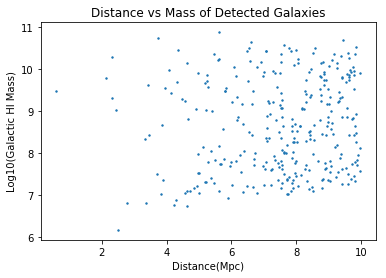

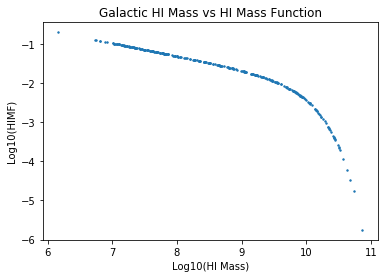

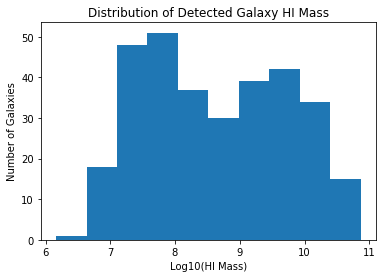

In [23]:
#Since M_HI has extremely high values and HIMF has extremely low vales, it is helpful to plot them in logarithmic instead of linear space to better illustrate the relationship between the two 
M_HI_log = np.log10(M_HI)
HIMF_log = np.log10(HIMF(M_HI))
#Plotting the distance of the detectable galaxies versus their HI mass, with the HI mass in log base 10 space
plt.figure(3)
plt.title('Distance vs Mass of Detected Galaxies')
plt.xlabel('Distance(Mpc)')
plt.ylabel('Log10(Galactic HI Mass)')
plt.scatter(dist,M_HI_log, s = 2)
#Plotting the HI mass of dectectable galaxies vs the corespeonding HIMF
plt.figure(4)
plt.title('Galactic HI Mass vs HI Mass Function')
plt.xlabel('Log10(HI Mass)')
plt.ylabel('Log10(HIMF)')
plt.scatter(M_HI_log,HIMF_log, s = 2)
#Plotting 
plt.figure(5)
plt.hist(M_HI_log,bins = 10)
plt.title('Distribution of Detected Galaxy HI Mass')
plt.xlabel('Log10(HI Mass)')
plt.ylabel('Number of Galaxies')
plt.show()

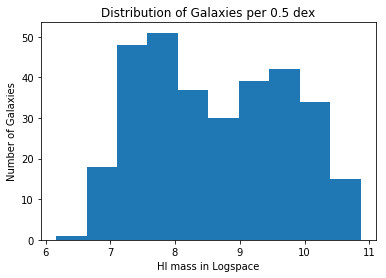

In [26]:
#Now we will put our HI masses into bins of size 0.5 dex
bins = plt.hist(M_HI_log, bins = 10)
#bin_bounds contains an array of the minima and maxima of each bin
bin_bounds = bins[1]
#The number of galaxies in each bin
galaxies_per_bin = bins[0]
#The error in the number of galaxies per bin while assuming a gaussian distribution
galaxies_per_bin_err = np.sqrt(galaxies_per_bin)

#The number of galaxies per dex
gal_dex =galaxies_per_bin*2
#The error in the number of galaxies per dex assuming a gaussian distribution
gal_dex_err = galaxies_per_bin_err*2
plt.title("Distribution of Galaxies per 0.5 dex")
plt.xlabel("HI mass in Logspace")
plt.ylabel("Number of Galaxies")
plt.show()

In [27]:
#The average HI mass per bin
bin_averages = []
#This loop calculates the mean HI mass in each bin using the minimum and maximum HI masses from bin_bounds
for i in range(10):
    bin_averages.append(np.mean([bin_bounds[i],bin_bounds[i+1]]))
bin_averages = np.array(bin_averages)
#Converting the average HI mass to linear space
bin_averages_linear = 10**(bin_averages)
#The maximum distance that a galaxy of some HI mass x would be detectable from Earth. 
D_max = []
#This loop calculates the maximum distance at which each average HI mass is detectable. If that distance is above 10 Mpc, that value is replaced with 10.0. Otherwise the distance is saved into D_max.
for x in bin_averages_linear: 
    d_max = np.sqrt(x/(0.72*(2.36e5)))
    if d_max >= 10:
        d_max = 10.0
    D_max.append(d_max)
D_max = np.array(D_max)

#The maximum volume over which each HI bin is detectable over. We are only sampling one quarter of the total sky
V_max = (4/3*np.pi*(D_max**3))/4

#The measured number density of galaxies in our simlation over volume V_max in units of Mpc^-3 dex^-1. 
HIMF_measured = gal_dex/V_max
#The measured number density error
HIMF_measured_err = gal_dex_err/V_max
#Converting from linear to logarithmic space
HIMF_measured_log = np.log10(HIMF_measured)
HIMF_measured_err_log = np.log10(HIMF_measured+HIMF_measured_err) - HIMF_measured_log

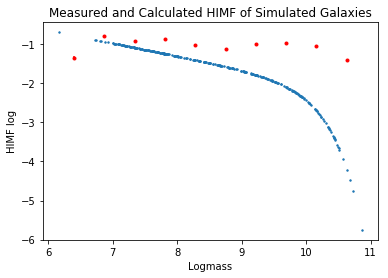

In [28]:
#Plotting our measured number density vs mass in logarithmic space
plt.title("Measured and Calculated HIMF of Simulated Galaxies")
plt.errorbar(bin_averages,HIMF_measured_log,yerr = HIMF_measured_err, fmt = 'r.')
plt.scatter(M_HI_log,np.log10(HIMF(M_HI)), s = 2)
plt.xlabel("Logmass")
plt.ylabel("HIMF log")
plt.show()

In [29]:
####This section is building the function necessary for our MCMC sampler. Parts of this code were adapted from the LF_function.ipynb notebook provided on ecampus #### 

#This function defines the HIMF that we are fitting our data to.
def schechter_func(alpha,phistar,mstar,x):
    return np.log(10)*phistar*(x/mstar)**(alpha+1)*np.exp(-x/mstar)

#This function defines the uniform priors we are using for M_char, phi_star, and alpha in the MCMC
def lnprior(theta):
    mstar,phistar,alpha=theta
    if (-1.5<alpha<-0.5) and (0.001<phistar<0.01) and (10**(9.0)<mstar<10**(10.0)):
        return 0.0
    return -np.inf

#This function calculates the log likelihood of our prior 
def lnlike(theta,x,y,yerr):
    mstar,phistar,alpha=theta
    print(schechter_func(alpha,phistar,mstar,x))
    return -0.5*np.sum(((y-schechter_func(alpha,phistar,mstar,x))/yerr)**2)

#The full log probability function that will be sampled using emcee
def lnprob(theta,x,y,yerr):
    lp=lnprior(theta)
    if not np.isfinite(lp):
        return -np.inf
    return lp+lnlike(theta,x,y,yerr)

In [30]:
#Redefining variables used to create our simulated galaxies so that they match the code we are adapting from LF_Example.ipynb
ngals=gal_dex
aveabsmg=bin_averages
numdens=HIMF_measured
numdenserr=HIMF_measured_err


In [31]:
#The initial guesses for M_char, phi_star, and alpha that the sampler will use 

phi_init=0.006
m_init=10**(9.8)
alph_init=-1.0

In [32]:
#Here we are using our initial guesses to generate 32 random walkers for each parameter our sampler will attempt to recover
solution=np.array([m_init,phi_init,alph_init])

pos=solution+1e-4*np.random.randn(32,3)

nwalkers,ndim=pos.shape


In [33]:
#Building a sampler that will use the walkers and the probability function to sample the mass bins and number densities to recover M_char, phi_star, and alpha
sampler=emcee.EnsembleSampler(nwalkers,ndim,lnprob,args=(aveabsmg,numdens,numdenserr))

In [34]:
#Now we are telling the MCMC sampler to run for 5000 steps
sampler.run_mcmc(pos,5000)

[0.01335256 0.01335248 0.0133524  0.01335233 0.01335226 0.01335219
 0.01335213 0.01335207 0.01335201 0.01335196]
[0.01369524 0.0136952  0.01369516 0.01369512 0.01369508 0.01369505
 0.01369501 0.01369498 0.01369495 0.01369493]
[0.0141458  0.01414569 0.01414558 0.01414549 0.01414539 0.01414531
 0.01414523 0.01414515 0.01414507 0.014145  ]
[0.01353061 0.01353061 0.01353062 0.01353062 0.01353062 0.01353063
 0.01353063 0.01353063 0.01353064 0.01353064]
[0.01379361 0.01379359 0.01379358 0.01379357 0.01379355 0.01379354
 0.01379353 0.01379352 0.01379351 0.0137935 ]
[0.01352394 0.01352401 0.01352407 0.01352413 0.01352419 0.01352425
 0.0135243  0.01352435 0.0135244  0.01352444]
[0.0135821  0.01358215 0.01358221 0.01358226 0.0135823  0.01358235
 0.01358239 0.01358243 0.01358247 0.0135825 ]
[0.01423762 0.01423769 0.01423775 0.01423781 0.01423786 0.01423792
 0.01423797 0.01423801 0.01423806 0.0142381 ]
[0.01381567 0.01381571 0.01381574 0.01381577 0.0138158  0.01381583
 0.01381585 0.01381588 0.0138

 0.01218867 0.01218916 0.01218963 0.01219008]
[0.01588531 0.01588432 0.01588339 0.01588252 0.0158817  0.01588093
 0.0158802  0.0158795  0.01587884 0.01587821]
[0.01512513 0.01512508 0.01512504 0.01512499 0.01512495 0.01512491
 0.01512488 0.01512484 0.01512481 0.01512478]
[0.01436369 0.01436345 0.01436322 0.014363   0.0143628  0.0143626
 0.01436242 0.01436225 0.01436208 0.01436192]
[0.01547393 0.01547291 0.01547196 0.01547106 0.01547022 0.01546942
 0.01546867 0.01546795 0.01546727 0.01546661]
[0.01348266 0.01348285 0.01348302 0.01348318 0.01348333 0.01348348
 0.01348361 0.01348374 0.01348386 0.01348398]
[0.01806042 0.0180601  0.0180598  0.01805953 0.01805927 0.01805902
 0.01805879 0.01805856 0.01805835 0.01805815]
[0.01359894 0.01359922 0.01359948 0.01359973 0.01359996 0.01360018
 0.01360038 0.01360058 0.01360077 0.01360095]
[0.01402446 0.01402428 0.01402411 0.01402396 0.01402381 0.01402367
 0.01402353 0.01402341 0.01402329 0.01402317]
[0.01605594 0.01605503 0.01605419 0.0160534  0.0160

[0.01779769 0.01780057 0.01780326 0.01780579 0.01780816 0.01781041
 0.01781254 0.01781456 0.01781648 0.01781832]
[0.0186067  0.01860779 0.0186088  0.01860975 0.01861064 0.01861149
 0.01861229 0.01861305 0.01861377 0.01861447]
[0.02154388 0.02154425 0.0215446  0.02154493 0.02154523 0.02154553
 0.0215458  0.02154606 0.02154631 0.02154655]
[0.01477608 0.01477661 0.01477711 0.01477758 0.01477802 0.01477844
 0.01477883 0.01477921 0.01477956 0.0147799 ]
[0.01878505 0.01878066 0.01877656 0.01877272 0.0187691  0.01876569
 0.01876245 0.01875937 0.01875645 0.01875365]
[0.01489716 0.01489679 0.01489645 0.01489613 0.01489583 0.01489554
 0.01489527 0.01489502 0.01489477 0.01489454]
[0.01413726 0.01414241 0.01414722 0.01415173 0.01415598 0.01415999
 0.0141638  0.01416741 0.01417086 0.01417415]
[0.0179115  0.01791253 0.01791349 0.01791439 0.01791525 0.01791605
 0.01791681 0.01791754 0.01791822 0.01791888]
[0.02557633 0.0255639  0.0255523  0.02554142 0.02553119 0.02552152
 0.02551236 0.02550367 0.0254

 0.03992224 0.03983272 0.03974762 0.03966655]
[0.02547168 0.02546062 0.02545029 0.02544061 0.0254315  0.02542289
 0.02541474 0.025407   0.02539962 0.02539258]
[0.01622738 0.01624302 0.01625763 0.01627136 0.01628429 0.01629651
 0.0163081  0.01631913 0.01632964 0.01633968]
[0.01919281 0.01918216 0.01917221 0.01916289 0.01915412 0.01914583
 0.01913798 0.01913053 0.01912343 0.01911666]
[0.01987419 0.01987618 0.01987803 0.01987977 0.0198814  0.01988295
 0.01988441 0.0198858  0.01988713 0.0198884 ]
[0.02471114 0.02469665 0.02468313 0.02467045 0.02465853 0.02464726
 0.0246366  0.02462646 0.02461681 0.0246076 ]
[0.02176212 0.02176231 0.02176249 0.02176266 0.02176281 0.02176296
 0.02176311 0.02176324 0.02176337 0.02176349]
[0.02673085 0.02670721 0.02668516 0.0266645  0.02664506 0.02662671
 0.02660933 0.02659282 0.02657711 0.02656211]
[0.02329812 0.02329012 0.02328264 0.02327563 0.02326903 0.0232628
 0.0232569  0.02325129 0.02324595 0.02324085]
[0.01576442 0.01576813 0.01577159 0.01577483 0.0157

 0.09308668 0.09266668 0.09226835 0.09188964]
[0.05836947 0.05811449 0.0578774  0.05765591 0.05744815 0.05725255
 0.05706781 0.05689281 0.0567266  0.05656836]
[0.0448141  0.04468468 0.04456418 0.04445145 0.04434557 0.04424578
 0.04415142 0.04406194 0.04397686 0.04389579]
[0.0571507  0.05692683 0.05671858 0.05652396 0.05634132 0.05616932
 0.05600681 0.05585282 0.05570651 0.05556719]
[0.03756342 0.03745812 0.03736006 0.03726833 0.03718216 0.03710094
 0.03702414 0.0369513  0.03688204 0.03681604]
[0.04881703 0.04868024 0.04855285 0.04843368 0.04832174 0.04821623
 0.04811645 0.04802183 0.04793186 0.04784612]
[0.04001633 0.03991754 0.03982552 0.0397394  0.03965849 0.0395822
 0.03951003 0.03944158 0.03937649 0.03931444]
[0.03655131 0.03649268 0.03643802 0.03638682 0.03633869 0.03629327
 0.03625028 0.03620948 0.03617065 0.03613362]
[0.01429747 0.01431245 0.01432646 0.01433961 0.014352   0.01436371
 0.01437483 0.01438539 0.01439547 0.01440509]
[0.03202914 0.03198334 0.03194063 0.03190063 0.0318

 0.06074808 0.06056374 0.06038867 0.06022198]
[0.06234287 0.06208764 0.06185025 0.06162843 0.06142031 0.06122434
 0.06103919 0.06086378 0.06069715 0.06053848]
[0.04979913 0.04963817 0.04948834 0.04934822 0.04921666 0.0490927
 0.0489755  0.0488644  0.0487588  0.04865819]
[0.04805901 0.04792813 0.04780625 0.04769222 0.0475851  0.04748412
 0.04738863 0.04729807 0.04721195 0.04712988]
[0.07885295 0.07849852 0.07816901 0.07786122 0.07757253 0.07730078
 0.07704413 0.07680104 0.07657018 0.07635041]
[0.02757687 0.02753783 0.02750142 0.02746732 0.02743525 0.02740499
 0.02737634 0.02734915 0.02732327 0.02729858]
[0.07769978 0.07726066 0.07685287 0.07647235 0.07611582 0.0757805
 0.0754641  0.07516467 0.07488053 0.07461024]
[0.07346481 0.07307828 0.07271918 0.07238399 0.07206982 0.07177425
 0.07149527 0.07123118 0.07098051 0.070742  ]
[0.04788131 0.04769428 0.04752031 0.04735772 0.04720514 0.04706144
 0.04692567 0.04679702 0.04667479 0.04655838]
[0.07390168 0.073563   0.07324815 0.07295408 0.07267

[0.09897617 0.09840115 0.09786723 0.09736911 0.09690243 0.09646359
 0.09604955 0.09565776 0.09528601 0.09493244]
[0.07840024 0.07806149 0.07774649 0.07745222 0.07717617 0.07691627
 0.07667078 0.07643824 0.07621737 0.07600709]
[0.04578274 0.04562614 0.0454804  0.04534413 0.0452162  0.04509567
 0.04498175 0.04487376 0.04477113 0.04467336]
[0.07820164 0.0776707  0.07717818 0.07671909 0.07628934 0.07588555
 0.07550486 0.07514488 0.07480356 0.07447912]
[0.05947998 0.05925293 0.0590417  0.05884428 0.058659   0.05848449
 0.0583196  0.05816335 0.05801488 0.05787349]
[0.07670068 0.07628579 0.0759004  0.07554072 0.07520363 0.07488654
 0.07458729 0.07430403 0.07403519 0.07377942]
[0.08802754 0.08760842 0.08721886 0.08685507 0.08651394 0.08619289
 0.08588974 0.08560266 0.08533008 0.08507064]
[0.08565528 0.08510923 0.08460248 0.08412995 0.08368747 0.08327156
 0.08287934 0.08250834 0.08215646 0.08182191]
[0.05298018 0.05279591 0.05262442 0.05246408 0.05231357 0.05217177
 0.05203774 0.05191071 0.0517

 0.08483349 0.08445052 0.0840873  0.08374197]
[0.08958103 0.08889595 0.08826098 0.08766957 0.08711636 0.08659692
 0.08610754 0.08564506 0.0852068  0.08479047]
[0.07977687 0.07924749 0.07875633 0.07829845 0.07786977 0.07746693
 0.07708711 0.0767279  0.07638727 0.07606347]
[0.0862614  0.0858425  0.08545318 0.08508964 0.08474878 0.084428
 0.08412513 0.08383834 0.08356604 0.08330689]
[0.08284552 0.08226946 0.08173515 0.08123719 0.08077112 0.08033326
 0.0799205  0.07953025 0.07916026 0.07880861]
[0.07751222 0.07709115 0.07670003 0.07633501 0.07599292 0.07567114
 0.07536746 0.07508001 0.07480721 0.07454767]
[0.08202359 0.08164474 0.08129255 0.08096362 0.08065515 0.08036479
 0.0800906  0.07983091 0.07958431 0.07934958]
[0.09714103 0.09618245 0.09529589 0.09447182 0.09370246 0.09298135
 0.09230312 0.0916632  0.09105774 0.0904834 ]
[0.07102014 0.0706559  0.07031747 0.07000152 0.06970536 0.0694267
 0.06916366 0.06891463 0.06867823 0.06845328]
[0.08276073 0.08232544 0.08192103 0.08154355 0.081189

 0.08240872 0.082117   0.08184006 0.08157652]
[0.0859019  0.08519803 0.08454598 0.08393896 0.08337142 0.08283876
 0.08233713 0.08186327 0.08141439 0.08098812]
[0.08409927 0.08352946 0.08300087 0.08250816 0.08204693 0.08161354
 0.08120496 0.0808186  0.08045226 0.08010404]
[0.08632463 0.08580776 0.0853279  0.08488029 0.084461   0.08406678
 0.08369489 0.08334303 0.08300921 0.08269175]
[0.08465846 0.08425924 0.08388816 0.08354162 0.08321664 0.08291078
 0.08262197 0.08234846 0.08208875 0.08184156]
[0.11326421 0.11241814 0.11163381 0.11090316 0.11021961 0.10957769
 0.10897283 0.10840115 0.10785935 0.10734459]
[0.08091755 0.08050596 0.08012352 0.07976648 0.07943178 0.07911685
 0.07881957 0.0785381  0.07827091 0.07801666]
[0.07895979 0.07844528 0.07796786 0.07752274 0.07710597 0.07671428
 0.07634494 0.07599561 0.07566432 0.07534937]
[0.08234102 0.0818409  0.08137664 0.08094361 0.08053801 0.08015668
 0.07979698 0.07945667 0.07913383 0.07882683]
[0.10168842 0.10115778 0.10066479 0.1002046  0.099

 0.08820263 0.08784968 0.08751478 0.08719621]
[0.08630407 0.08590064 0.08552563 0.08517541 0.08484697 0.08453785
 0.08424594 0.08396949 0.08370698 0.08345711]
[0.07845289 0.07798246 0.07754573 0.07713835 0.07675674 0.07639796
 0.0760595  0.07573927 0.07543546 0.07514654]
[0.05360723 0.05304007 0.0525159  0.05202898 0.05157467 0.0511491
 0.05074904 0.05037179 0.05001502 0.04967676]
[0.06597797 0.06567017 0.06538405 0.06511684 0.06486624 0.06463038
 0.06440766 0.06419673 0.06399643 0.06380578]
[0.0775503  0.07698211 0.07645532 0.07596452 0.0755053  0.07507399
 0.07466754 0.07428335 0.0739192  0.0735732 ]
[0.09515957 0.09440932 0.0937141  0.09306671 0.09246126 0.09189288
 0.09135748 0.09085161 0.09037231 0.08991705]
[0.08196276 0.08151547 0.0811     0.08071227 0.0803489  0.08000711
 0.07968455 0.07937924 0.07908949 0.07881383]
[0.07948641 0.07911163 0.07876327 0.07843795 0.07813287 0.07784574
 0.07757461 0.07731785 0.07707404 0.07684198]
[0.09028779 0.08969941 0.08915346 0.08864443 0.0881

[0.08839785 0.08792252 0.08748097 0.08706887 0.08668264 0.08631932
 0.08597642 0.08565184 0.08534379 0.0850507 ]
[0.06968618 0.06933287 0.06900458 0.06869809 0.06841076 0.06814041
 0.0678852  0.06764358 0.0674142  0.06719592]
[0.0916136  0.09111453 0.09065097 0.09021835 0.08981291 0.08943154
 0.08907163 0.08873097 0.08840766 0.08810008]
[0.09771062 0.09714408 0.09661803 0.09612724 0.09566743 0.09523504
 0.09482709 0.09444105 0.09407477 0.09372638]
[0.07762788 0.0772778  0.07695234 0.07664833 0.0763632  0.07609479
 0.07584131 0.07560122 0.07537321 0.07515616]
[0.09393749 0.09340349 0.0929076  0.0924449  0.09201136 0.09160364
 0.09121893 0.09085485 0.09050938 0.09018077]
[0.08518539 0.08433951 0.08355724 0.08283014 0.08215135 0.08151516
 0.08091683 0.08035233 0.07981824 0.07931163]
[0.08857322 0.08807523 0.08761275 0.08718119 0.08677682 0.08639651
 0.08603765 0.08569802 0.08537573 0.08506915]
[0.07912245 0.07874527 0.07839469 0.0780673  0.0777603  0.07747138
 0.07719857 0.07694022 0.0766

 0.0912482  0.09085968 0.09049111 0.09014061]
[0.09247689 0.09193784 0.09143733 0.09097039 0.09053292 0.09012156
 0.08973346 0.08936621 0.08901776 0.08868634]
[0.09619585 0.09549387 0.09484299 0.09423658 0.09366917 0.09313624
 0.09263401 0.09215928 0.0917093  0.09128173]
[0.09263175 0.09200559 0.09142471 0.09088325 0.09037638 0.08990011
 0.08945109 0.08902648 0.08862387 0.08824117]
[0.09879754 0.09810309 0.09745904 0.09685883 0.0962971  0.0957694
 0.09527198 0.09480171 0.09435588 0.09393218]
[0.08427857 0.08365911 0.08308478 0.08254971 0.08204908 0.08157889
 0.08113581 0.08071699 0.08032003 0.07994286]
[0.08346366 0.08304663 0.0826591  0.08229728 0.08195807 0.08163888
 0.08133755 0.08105224 0.08078138 0.08052362]
[0.09511454 0.09450084 0.09393135 0.09340036 0.09290316 0.09243586
 0.09199519 0.09157839 0.09118309 0.09080728]
[0.09421653 0.09348322 0.09280363 0.09217073 0.0915788  0.09102305
 0.09049951 0.0900048  0.08953605 0.08909079]
[0.09855864 0.09767321 0.0968536  0.09609116 0.0953

[0.08703965 0.08652562 0.08604838 0.08560318 0.08518611 0.08479395
 0.08442398 0.08407392 0.08374179 0.08342591]
[0.08735902 0.08674638 0.08617819 0.08564868 0.0851531  0.08468754
 0.08424869 0.08383379 0.08344044 0.08306661]
[0.08480136 0.08405546 0.08336489 0.08272236 0.08212194 0.08155868
 0.08102848 0.08052785 0.08005382 0.07960383]
[0.08849544 0.08798428 0.08750964 0.0870668  0.08665191 0.08626175
 0.08589364 0.08554529 0.08521477 0.08490039]
[0.08646632 0.08602007 0.08560546 0.08521841 0.0848556  0.08451425
 0.08419204 0.08388699 0.08359743 0.0833219 ]
[0.09305521 0.0923889  0.09177103 0.09119529 0.09065652 0.09015043
 0.08967345 0.08922253 0.08879509 0.0883889 ]
[0.07964205 0.07891466 0.07824145 0.07761527 0.07703029 0.07648168
 0.07596539 0.07547801 0.07501664 0.07457877]
[0.09087298 0.09038531 0.0899323  0.08950949 0.08911321 0.08874045
 0.08838863 0.08805561 0.08773954 0.08743882]
[0.08958204 0.0888552  0.08818183 0.08755492 0.08696874 0.08641855
 0.08590037 0.08541085 0.0849

 0.08764868 0.08727787 0.0869261  0.08659156]
[0.08956066 0.08873792 0.0879765  0.08726831 0.08660674 0.08598632
 0.08540249 0.08485137 0.08432968 0.08383458]
[0.08853098 0.08806601 0.08763405 0.08723083 0.0868529  0.08649734
 0.08616174 0.08584404 0.08554249 0.08525557]
[0.09654289 0.09582981 0.0951687  0.09455281 0.09397657 0.09343539
 0.09292542 0.0924434  0.09198654 0.09155246]
[0.06949816 0.06907078 0.06867408 0.0683041  0.06795757 0.06763179
 0.06732452 0.06703382 0.06675807 0.06649585]
[0.07764149 0.07700398 0.07641341 0.07586364 0.07534963 0.07486721
 0.07441291 0.07398375 0.07357724 0.0731912 ]
[0.09235033 0.09187775 0.09143865 0.09102873 0.09064446 0.0902829
 0.08994161 0.08961849 0.08931176 0.08901989]
[0.08525837 0.08485746 0.0844848  0.08413677 0.0838104  0.08350323
 0.08321317 0.08293848 0.08267765 0.08242938]
[0.08997532 0.08948947 0.08903816 0.08861695 0.08822219 0.08785086
 0.08750041 0.08716868 0.08685385 0.08655432]
[0.10225621 0.10162696 0.10104287 0.10049811 0.0999

 0.09410854 0.09358523 0.09308943 0.09261851]
[0.08109135 0.08058498 0.08011499 0.0796767  0.07926622 0.07888036
 0.07851643 0.07817217 0.07784562 0.07753511]
[0.08500357 0.08441931 0.08387736 0.08337224 0.08289943 0.08245521
 0.08203644 0.08164047 0.08126504 0.08090821]
[0.0521957  0.05195349 0.05172834 0.05151806 0.05132085 0.05113524
 0.05095996 0.05079395 0.05063632 0.05048627]
[0.08268125 0.08225051 0.08185032 0.08147675 0.08112659 0.08079715
 0.0804862  0.08019182 0.07991239 0.07964651]
[0.09350934 0.0925853  0.0917307  0.09093635 0.09019474 0.08949965
 0.08884589 0.08822908 0.08764549 0.08709189]
[0.08215136 0.08173578 0.08134962 0.08098911 0.08065114 0.08033313
 0.08003293 0.0797487  0.07947888 0.07922211]
[0.08505145 0.08452826 0.08404262 0.08358968 0.08316546 0.08276665
 0.08239049 0.08203462 0.08169704 0.08137603]
[0.08874151 0.08829269 0.08787564 0.08748628 0.08712127 0.08677782
 0.0864536  0.08614663 0.08585522 0.08557792]
[0.0871456  0.08633259 0.08558027 0.08488063 0.084

 0.09710154 0.09664162 0.09620551 0.09579098]
[0.08564341 0.08523289 0.08485133 0.08449502 0.08416091 0.08384648
 0.08354959 0.08326844 0.0830015  0.08274743]
[0.08611105 0.08540566 0.08475221 0.08414389 0.08357513 0.08304132
 0.08253861 0.08206372 0.08161388 0.08118669]
[0.08078929 0.08042647 0.08008915 0.07977407 0.07947855 0.07920035
 0.07893762 0.07868877 0.07845243 0.07822746]
[0.0707986  0.07032741 0.06989026 0.06948273 0.06910121 0.06874268
 0.06840464 0.06808496 0.06778181 0.06749364]
[0.08576698 0.08520832 0.08468994 0.08420662 0.08375409 0.08332879
 0.08292775 0.08254845 0.08218873 0.08184675]
[0.07881836 0.07826766 0.07775691 0.0772809  0.0768354  0.07641687
 0.07602235 0.07564934 0.07529571 0.07495963]
[0.0938564  0.09312138 0.09244024 0.09180593 0.09121269 0.09065575
 0.0901311  0.08963536 0.08916565 0.08871949]
[0.09316022 0.09245449 0.09180033 0.091191   0.090621   0.09008576
 0.08958146 0.08910486 0.0886532  0.08822412]
[0.1018399  0.10104446 0.10030731 0.09962083 0.098

[0.07859777 0.07813754 0.07771022 0.07731157 0.0769381  0.07658692
 0.0762556  0.07594209 0.07564463 0.07536172]
[0.08899088 0.08825335 0.08757018 0.08693425 0.08633973 0.08578179
 0.08525638 0.08476009 0.08429    0.08384362]
[0.08562578 0.08523357 0.08486895 0.08452839 0.084209   0.08390836
 0.08362445 0.08335555 0.0831002  0.08285713]
[0.09125035 0.09062808 0.09005085 0.08951282 0.08900918 0.08853597
 0.08808986 0.08766802 0.08726804 0.08688787]
[0.09330262 0.09272756 0.09219378 0.09169594 0.09122967 0.09079134
 0.0903779  0.08998677 0.08961575 0.08926294]
[0.07340302 0.07299782 0.07262146 0.07227025 0.07194112 0.07163156
 0.07133943 0.07106293 0.07080054 0.07055092]
[0.09522284 0.09462634 0.09407272 0.09355642 0.09307291 0.0926184
 0.09218974 0.09178424 0.09139961 0.09103389]
[0.08951114 0.08860822 0.08777333 0.08699744 0.08627318 0.08559448
 0.08495624 0.08435415 0.08378457 0.08324434]
[0.07337002 0.07303155 0.07271691 0.07242304 0.07214744 0.07188803
 0.07164306 0.07141105 0.07119

 0.07802227 0.0775061  0.07701756 0.07655399]
[0.08163001 0.08122187 0.08084261 0.08048851 0.08015653 0.07984415
 0.07954925 0.07927002 0.07900494 0.07875268]
[0.08519276 0.0843782  0.08362462 0.08292396 0.08226964 0.08165621
 0.08107911 0.0805345  0.0800191  0.0795301 ]
[0.11270549 0.11155348 0.1104884  0.10949871 0.108575   0.10770947
 0.10689562 0.10612796 0.1054018  0.10471313]
[0.10102426 0.1001105  0.09926472 0.09847796 0.09774291 0.09705351
 0.09640469 0.09579216 0.09521227 0.0946619 ]
[0.09858728 0.0979453  0.0973496  0.0967942  0.09627417 0.09578543
 0.09532457 0.09488869 0.09447532 0.09408233]
[0.0853789  0.08482253 0.08430628 0.08382495 0.08337428 0.08295073
 0.08255134 0.08217359 0.08181536 0.08147479]
[0.09009434 0.08966022 0.08925675 0.08887998 0.0885267  0.08819422
 0.08788031 0.08758304 0.08730079 0.08703217]
[0.14658117 0.14508794 0.14370734 0.14242443 0.141227   0.14010498
 0.13904992 0.1380547  0.13711327 0.13622043]
[0.08232676 0.08188811 0.08148061 0.08110026 0.080

[0.07959666 0.07923814 0.07890482 0.07859348 0.07830146 0.07802658
 0.07776697 0.07752108 0.07728757 0.07706527]
[0.08297538 0.08209841 0.08128789 0.08053498 0.07983248 0.07917441
 0.0785558  0.07797244 0.07742076 0.07689767]
[0.07310858 0.07271933 0.07235774 0.07202024 0.07170391 0.07140633
 0.07112547 0.07085961 0.07060727 0.07036718]
[0.08776648 0.08689066 0.08608073 0.08532797 0.08462524 0.08396666
 0.08334728 0.08276294 0.0822101  0.08168573]
[0.08046665 0.08010661 0.07977186 0.07945918 0.0791659  0.07888982
 0.07862908 0.07838211 0.07814756 0.07792428]
[0.08036508 0.07997902 0.07962019 0.07928511 0.07897092 0.07867522
 0.07839603 0.07813165 0.07788062 0.0776417 ]
[0.08230039 0.08152332 0.08080434 0.08013577 0.07951136 0.07892591
 0.07837508 0.07785522 0.0773632  0.07689635]
[0.08087528 0.08051183 0.08017393 0.0798583  0.07956226 0.07928359
 0.07902041 0.07877112 0.07853439 0.07830902]
[0.08859345 0.08777436 0.08701635 0.08631137 0.08565283 0.08503529
 0.08445419 0.08390567 0.0833

[0.09017601 0.08962714 0.08911764 0.08864242 0.08819731 0.08777883
 0.0873841  0.08701065 0.08665638 0.08631948]
[0.05769947 0.05710481 0.05655506 0.05604427 0.05556757 0.05512092
 0.05470097 0.05430488 0.05393022 0.05357493]
[0.09973266 0.09913012 0.09857076 0.09804902 0.09756031 0.09710084
 0.09666741 0.09625734 0.09586832 0.09549837]
[0.08893542 0.08812004 0.0873654  0.08666351 0.08600782 0.0853929
 0.08481424 0.08426799 0.0837509  0.08326017]
[0.06817759 0.067699   0.06725515 0.0668415  0.06645437 0.06609068
 0.06574787 0.06542376 0.0651165  0.06482448]
[0.10669415 0.10575227 0.10488028 0.10406898 0.10331086 0.1025997
 0.10193028 0.10129821 0.10069974 0.10013164]
[0.10135113 0.10079759 0.10028345 0.09980362 0.09935394 0.09893097
 0.09853181 0.09815399 0.09779542 0.0974543 ]
[0.08628899 0.08559459 0.08495122 0.08435221 0.08379209 0.08326633
 0.08277113 0.0823033  0.08186009 0.08143917]
[0.0854977  0.08501818 0.08457285 0.0841573  0.08376792 0.0834017
 0.08305613 0.08272907 0.0824187

[0.07483379 0.07450885 0.07420669 0.07392442 0.07365963 0.07341035
 0.07317489 0.07295184 0.07274    0.07253831]
[0.08727142 0.08678845 0.08633987 0.08592126 0.08552899 0.08516003
 0.08481185 0.08448232 0.08416959 0.08387209]
[0.08978887 0.089318   0.08888054 0.08847219 0.08808944 0.08772935
 0.08738948 0.08706773 0.08676233 0.08647174]
[0.09374177 0.09307308 0.09245298 0.09187516 0.09133442 0.09082647
 0.09034773 0.08989514 0.0894661  0.08905839]
[0.092135   0.09125806 0.09044673 0.08969235 0.08898784 0.08832733
 0.08770592 0.08711948 0.08656447 0.08603787]
[0.09881744 0.09823036 0.09768531 0.09717686 0.09670056 0.09625272
 0.09583023 0.09543048 0.09505123 0.09469054]
[0.0903613  0.08990976 0.08949017 0.08909842 0.08873114 0.08838554
 0.08805928 0.08775036 0.08745709 0.087178  ]
[0.08264868 0.08174282 0.08090591 0.08012877 0.0794039  0.0787251
 0.07808719 0.0774858  0.07691722 0.07637825]
[0.09555833 0.09497568 0.09443482 0.09393036 0.09345786 0.09301365
 0.09259464 0.09219822 0.09182

 0.09603459 0.09556846 0.09512652 0.09470649]
[0.09024338 0.08981154 0.08941015 0.08903533 0.08868386 0.08835308
 0.08804075 0.08774499 0.08746416 0.08719688]
[0.08610142 0.08529607 0.08455086 0.08385785 0.08321056 0.08260361
 0.08203253 0.08149351 0.08098333 0.08049921]
[0.08519178 0.08444995 0.08376308 0.08312395 0.08252665 0.08196629
 0.08143878 0.08094065 0.08046896 0.08002118]
[0.08509956 0.08467543 0.08428129 0.08391331 0.08356831 0.08324367
 0.08293719 0.082647   0.08237151 0.08210933]
[0.0674575  0.06694369 0.06646744 0.06602385 0.0656089  0.06521927
 0.06485218 0.06450526 0.0641765  0.06386419]
[0.07003851 0.06963338 0.0692572  0.06890623 0.06857741 0.06826819
 0.06797645 0.06770038 0.06743843 0.06718928]
[0.0815897  0.0811637  0.08076792 0.08039848 0.08005218 0.07972639
 0.07941887 0.07912775 0.07885142 0.07858849]
[0.08013478 0.07967656 0.07925105 0.07885403 0.07848205 0.07813222
 0.07780215 0.0774898  0.07719341 0.07691148]
[0.08636343 0.08578675 0.08525174 0.08475299 0.084

 0.09167702 0.09111651 0.09058575 0.09008188]
[0.08384417 0.08305234 0.08231969 0.08163843 0.08100216 0.08040559
 0.07984431 0.07931458 0.07881322 0.07833751]
[0.07681357 0.0760925  0.07542529 0.07480484 0.07422534 0.07368198
 0.07317073 0.0726882  0.07223149 0.07179813]
[0.082994   0.08251094 0.08206242 0.08164397 0.08125195 0.0808833
 0.0805355  0.08020639 0.07989412 0.07959712]
[0.07930326 0.07854839 0.07785001 0.07720064 0.0765942  0.07602564
 0.07549074 0.07498593 0.07450818 0.07405489]
[0.09271709 0.09178149 0.09091638 0.09011241 0.08936195 0.08865869
 0.08799736 0.08737349 0.0867833  0.08622354]
[0.06780834 0.06741265 0.06704525 0.06670248 0.06638136 0.0660794
 0.06579452 0.06552494 0.06526917 0.0650259 ]
[0.09650436 0.09577093 0.0950911  0.09445789 0.09386555 0.09330935
 0.09278531 0.09229007 0.09182075 0.09137489]
[0.09320236 0.09221756 0.09130738 0.09046189 0.08967301 0.08893402
 0.08823934 0.08758424 0.08696471 0.0863773 ]
[0.07846526 0.07798618 0.07754146 0.07712668 0.07673

 0.09522713 0.09478531 0.09436633 0.09396804]
[0.09377663 0.09295613 0.09219645 0.09148959 0.09082903 0.09020933
 0.08962598 0.08907515 0.08855356 0.08805842]
[0.05389418 0.05370339 0.05352585 0.05335986 0.05320405 0.05305727
 0.05291855 0.05278706 0.0526621  0.05254308]
[0.07411398 0.07376082 0.07343258 0.07312604 0.0728386  0.07256808
 0.07231265 0.07207075 0.07184107 0.07162247]
[0.07862476 0.07800929 0.07743894 0.0769078  0.07641105 0.07594469
 0.07550537 0.07509025 0.07469694 0.07432334]
[0.07369556 0.07315899 0.07266148 0.07219794 0.07176421 0.07135684
 0.07097292 0.07061002 0.07026604 0.06993919]
[0.07845337 0.07781906 0.0772314  0.07668426 0.07617267 0.07569247
 0.0752402  0.07481294 0.07440818 0.07402377]
[0.09508075 0.0943862  0.09374222 0.09314223 0.09258083 0.09205356
 0.09155666 0.09108697 0.09064177 0.09021875]
[0.08708769 0.08652806 0.08600874 0.0855245  0.08507107 0.0846449
 0.08424301 0.08386288 0.08350236 0.08315959]
[0.10164573 0.10104811 0.10049325 0.09997561 0.0994

 0.08372149 0.08333801 0.08297433 0.08262858]
[0.09743553 0.09664366 0.09591003 0.09522703 0.09458842 0.09398902
 0.09342451 0.09289121 0.09238602 0.09190625]
[0.09149034 0.09099764 0.09053996 0.0901128  0.08971246 0.08933587
 0.08898045 0.08864402 0.08832472 0.08802094]
[0.08299131 0.08250727 0.08205784 0.08163855 0.08124573 0.08087635
 0.08052786 0.08019809 0.07988521 0.07958762]
[0.08733485 0.08680851 0.0863199  0.08586413 0.08543722 0.08503584
 0.08465721 0.08429898 0.08395913 0.08363594]
[0.08498758 0.08436323 0.08378436 0.08324506 0.08274047 0.08226657
 0.08181997 0.08139784 0.08099774 0.08061758]
[0.08719799 0.08659311 0.08603207 0.08550918 0.08501977 0.08455997
 0.08412654 0.08371672 0.08332818 0.08295891]
[0.0726163  0.07207587 0.07157487 0.07110816 0.07067151 0.07026145
 0.06987505 0.06950985 0.06916372 0.06883486]
[0.09710279 0.09616615 0.0952997  0.09449415 0.09374194 0.09303678
 0.09237343 0.09174747 0.09115511 0.09059312]
[0.06205027 0.0614197  0.06083667 0.06029489 0.059

[0.07475491 0.07443613 0.07413968 0.07386271 0.07360289 0.07335826
 0.07312719 0.07290829 0.07270037 0.0725024 ]
[0.08761584 0.08692781 0.08629023 0.0856965  0.08514122 0.08461992
 0.08412886 0.08366486 0.08322524 0.08280765]
[0.07665165 0.07617223 0.07572727 0.07531231 0.07492369 0.07455838
 0.07421384 0.07388791 0.07357876 0.0732848 ]
[0.07281104 0.07249804 0.07220698 0.07193506 0.07167998 0.07143982
 0.07121297 0.07099808 0.07079397 0.07059965]
[0.06905924 0.06864858 0.06826732 0.06791167 0.0675785  0.06726525
 0.06696973 0.06669012 0.06642484 0.06617255]
[0.0888439  0.08805605 0.08732668 0.08664811 0.08601404 0.08541925
 0.0848594  0.0843308  0.08383031 0.08335524]
[0.07850781 0.07815003 0.07781742 0.07750676 0.07721539 0.07694113
 0.07668212 0.07643681 0.07620385 0.07598209]
[0.11254918 0.11151971 0.11056692 0.10968071 0.10885281 0.10807638
 0.10734572 0.10665598 0.10600304 0.10538338]
[0.11345175 0.11244423 0.11151151 0.11064376 0.10983292 0.10907234
 0.10835643 0.10768049 0.1070

[0.09183749 0.0910306  0.09028355 0.08958846 0.08893892 0.08832958
 0.087756   0.0872144  0.08670158 0.08621477]
[0.09936741 0.09850062 0.09769806 0.09695129 0.0962534  0.09559869
 0.09498236 0.09440037 0.09384927 0.09332611]
[0.093532   0.09278687 0.09209644 0.09145357 0.09085239 0.09028806
 0.0897565  0.08925428 0.08877848 0.08832657]
[0.08330112 0.08267038 0.08208573 0.08154115 0.08103172 0.08055335
 0.08010264 0.07967668 0.07927301 0.07888951]
[0.08133007 0.08078938 0.08028775 0.0798201  0.07938229 0.07897087
 0.07858295 0.0782161  0.07786823 0.07753754]
[0.0807501  0.08023317 0.07975347 0.07930617 0.07888732 0.07849364
 0.07812238 0.07777122 0.07743816 0.07712151]
[0.08202289 0.08156894 0.08114733 0.08075388 0.08038519 0.08003841
 0.07971116 0.07940143 0.0791075  0.07882788]
[0.07892037 0.07857228 0.07824862 0.07794628 0.07766269 0.07739571
 0.07714355 0.0769047  0.07667785 0.07646189]
[0.08307025 0.08261385 0.08218994 0.08179434 0.08142361 0.0810749
 0.08074583 0.08043436 0.08013

[0.08069813 0.0801051  0.07955528 0.07904304 0.07856377 0.07811364
 0.07768946 0.07728852 0.07690849 0.07654741]
[0.08403613 0.08365769 0.08330586 0.08297722 0.08266898 0.08237882
 0.0821048  0.08184525 0.08159876 0.08136411]
[0.08773292 0.08695479 0.08623442 0.08556422 0.08493796 0.08435052
 0.08379758 0.0832755  0.08278119 0.08231198]
[0.09126743 0.09060311 0.08998714 0.08941324 0.08887625 0.08837188
 0.08789656 0.08744726 0.08702138 0.0866167 ]
[0.06663559 0.06630015 0.06598845 0.06569744 0.06542461 0.0651679
 0.06492556 0.06469611 0.06447829 0.064271  ]
[0.10540496 0.10457073 0.1037977  0.10307788 0.10240471 0.10177277
 0.10117752 0.1006151  0.10008223 0.09957611]
[0.10023617 0.09938733 0.0986012  0.09786954 0.09718563 0.09654389
 0.09593966 0.09536899 0.09482852 0.09431536]
[0.08328204 0.0826238  0.08201385 0.08144588 0.08091472 0.08041608
 0.07994638 0.07950259 0.07908212 0.07868274]
[0.10285234 0.1018624  0.10094663 0.10009521 0.09930015 0.09855481
 0.09785365 0.097192   0.09656

[0.11557039 0.11461254 0.1137253  0.11289941 0.11212729 0.11140268
 0.11072032 0.11007578 0.10946528 0.10888555]
[0.07268705 0.07237707 0.07208881 0.0718195  0.07156685 0.07132898
 0.07110429 0.07089143 0.07068925 0.07049676]
[0.09191088 0.09122906 0.09059696 0.0900081  0.08945717 0.08893977
 0.08845222 0.0879914  0.08755466 0.08713969]
[0.08325355 0.08253595 0.08187145 0.08125309 0.08067516 0.08013293
 0.07962245 0.07914038 0.07868387 0.07825046]
[0.08983416 0.0889867  0.08820258 0.08747345 0.08679246 0.08615396
 0.08555323 0.08498625 0.08444964 0.08394047]
[0.08694583 0.08646268 0.08601394 0.0855952  0.08520281 0.08483374
 0.08448547 0.08415585 0.08384305 0.08354548]
[0.05271032 0.05254977 0.05240029 0.05226048 0.05212919 0.05200546
 0.05188847 0.05177755 0.0516721  0.05157163]
[0.0783376  0.07778101 0.07726485 0.07678385 0.07633373 0.07591089
 0.07551235 0.07513558 0.0747784  0.07443897]
[0.08179923 0.081311   0.08085774 0.08043493 0.08003886 0.07966647
 0.07931517 0.07898278 0.0786

[0.09018474 0.08970412 0.08925765 0.08884092 0.08845035 0.08808293
 0.08773615 0.08740788 0.08709631 0.08679988]
[0.08229998 0.08156926 0.08089279 0.08026344 0.07967536 0.07912373
 0.0786045  0.07811426 0.07765009 0.0772095 ]
[0.08510437 0.0845664  0.08406713 0.08360154 0.08316554 0.08275572
 0.08236921 0.08200361 0.08165683 0.08132712]
[0.08095253 0.08048612 0.08005302 0.07964895 0.07927036 0.07891434
 0.07857844 0.07826057 0.07795896 0.07767208]
[0.11025712 0.10933372 0.10847846 0.1076824  0.10693823 0.1062399
 0.10558233 0.10496124 0.10437298 0.10381442]
[0.08512347 0.08449855 0.08391916 0.08337937 0.08287431 0.08239997
 0.08195297 0.08153044 0.08112997 0.08074945]
[0.08830091 0.08753065 0.08681747 0.08615387 0.08553371 0.08495191
 0.08440422 0.08388704 0.08339733 0.08293243]
[0.09569072 0.09506108 0.09447688 0.09393223 0.09342229 0.09294307
 0.0924912  0.09206385 0.09165859 0.09127332]
[0.09112933 0.09060864 0.09012512 0.08967397 0.08925127 0.08885375
 0.08847867 0.08812372 0.08778

 0.08851625 0.08778661 0.08709714 0.08644392]
[0.08731755 0.08662658 0.08598631 0.0853901  0.08483254 0.08430912
 0.08381609 0.08335025 0.0829089  0.08248969]
[0.0795751  0.0789736  0.07841603 0.07789668 0.07741084 0.07695462
 0.07652477 0.07611852 0.07573353 0.07536777]
[0.08506228 0.08449848 0.08397539 0.08348773 0.08303118 0.08260214
 0.08219761 0.08181504 0.08145225 0.08110738]
[0.12258479 0.12122337 0.11996576 0.11879812 0.11770915 0.11668951
 0.1157314  0.11482824 0.11397443 0.11316517]
[0.08868473 0.08818988 0.08773029 0.08730143 0.08689956 0.0865216
 0.08616493 0.08582737 0.08550704 0.08520231]
[0.081765   0.08122133 0.08071693 0.08024671 0.07980648 0.0793928
 0.07900275 0.07863388 0.07828409 0.07795158]
[0.08483291 0.08427407 0.08375557 0.08327216 0.08281958 0.08239425
 0.08199321 0.08161393 0.08125425 0.08091232]
[0.06983323 0.06939152 0.06898159 0.06859932 0.06824134 0.06790486
 0.06758752 0.06728733 0.06700262 0.06673191]
[0.08500965 0.08461001 0.08423853 0.0838916  0.08356

[0.0797627  0.07911329 0.07851167 0.07795157 0.07742787 0.07693634
 0.07647342 0.07603611 0.07562185 0.07522844]
[0.07730199 0.07687021 0.0764692  0.076095   0.07574436 0.07541457
 0.07510337 0.07480884 0.07452934 0.07426346]
[0.07520391 0.07461691 0.07407292 0.07356632 0.07309252 0.07264769
 0.07222865 0.07183269 0.07145751 0.07110114]
[0.08363444 0.08314915 0.08269855 0.08227815 0.08188429 0.08151391
 0.08116448 0.08083381 0.08052006 0.08022165]
[0.08601593 0.08554139 0.08510064 0.08468933 0.08430389 0.08394135
 0.08359923 0.08327542 0.08296812 0.08267578]
[0.09384188 0.09303408 0.09228605 0.09158995 0.09093935 0.09032894
 0.08975426 0.08921157 0.08869763 0.08820972]
[0.08353438 0.08290597 0.08232344 0.08178082 0.08127319 0.0807965
 0.08034734 0.07992285 0.07952055 0.07913834]
[0.08631567 0.08567363 0.08507842 0.08452394 0.08400518 0.08351801
 0.08305895 0.08262506 0.08221384 0.08182313]
[0.08726417 0.08658299 0.08595172 0.08536384 0.08481401 0.08429781
 0.08381153 0.08335205 0.08291

[0.09448398 0.0938349  0.09323284 0.09267169 0.09214643 0.09165293
 0.0911877  0.0907478  0.09033072 0.0899343 ]
[0.09251648 0.09178137 0.09110021 0.09046596 0.08987283 0.08931604
 0.08879158 0.08829606 0.08782659 0.0873807 ]
[0.08938162 0.08867672 0.08802353 0.08741528 0.08684644 0.08631243
 0.0858094  0.08533411 0.0848838  0.08445607]
[0.05200759 0.05151873 0.05106639 0.05064576 0.05025289 0.04988453
 0.04953794 0.04921082 0.04890121 0.04860743]
[0.08667704 0.08614397 0.08564916 0.08518767 0.08475544 0.0843491
 0.08396583 0.08360324 0.08325929 0.08293222]
[0.08622675 0.08568592 0.08518398 0.08471588 0.0842775  0.08386543
 0.08347679 0.08310915 0.08276043 0.08242886]
[0.09051446 0.08948558 0.0885354  0.08765341 0.08683102 0.08606116
 0.0853379  0.08465625 0.08401196 0.0834014 ]
[0.08396634 0.08306752 0.08223692 0.08146545 0.08074571 0.08007157
 0.07943792 0.07884044 0.07827545 0.0777398 ]
[0.08662769 0.08602825 0.08547225 0.08495406 0.08446903 0.08401335
 0.08358379 0.08317763 0.08279

 0.09012014 0.08971252 0.08932593 0.08895838]
[0.1005368  0.09995742 0.09941943 0.09891748 0.0984472  0.09800496
 0.0975877  0.09719284 0.09681818 0.09646181]
[0.08223956 0.08177507 0.08134371 0.0809412  0.08056406 0.08020936
 0.07987467 0.07955793 0.07925736 0.07897145]
[0.08386188 0.08316906 0.08252729 0.08192988 0.08137135 0.08084718
 0.08035357 0.0798873  0.07944565 0.07902625]
[0.08488128 0.08431018 0.08378037 0.0832865  0.08282416 0.08238973
 0.08198013 0.0815928  0.08122553 0.08087642]
[0.07798502 0.07710915 0.07630017 0.07554916 0.07484881 0.07419312
 0.07357706 0.07299638 0.07244748 0.07192727]
[0.08991678 0.08906593 0.08827871 0.0875467  0.08686305 0.08622207
 0.08561901 0.08504986 0.08451119 0.08400009]
[0.08830695 0.08773443 0.08720318 0.08670785 0.08624406 0.08580817
 0.08539713 0.08500836 0.08463966 0.08428913]
[0.08136014 0.08087947 0.08043319 0.08001687 0.07962686 0.07926015
 0.07891419 0.07858684 0.07827626 0.07798089]
[0.09665655 0.09601951 0.09542844 0.0948774  0.094

 0.11738516 0.11663225 0.11591951 0.11524308]
[0.07495568 0.07452152 0.07411839 0.07374228 0.0733899  0.07305854
 0.07274591 0.07245007 0.07216936 0.07190237]
[0.06187008 0.06151734 0.06118978 0.06088414 0.06059778 0.06032847
 0.06007436 0.05983389 0.0596057  0.05938865]
[0.08630567 0.08570055 0.08513933 0.08461632 0.08412682 0.08366697
 0.08323351 0.08282369 0.08243517 0.08206593]
[0.09378544 0.09307942 0.09242495 0.09181532 0.09124501 0.09070945
 0.09020484 0.08972793 0.08927596 0.08884657]
[0.0837294  0.08323733 0.08278046 0.08235424 0.08195495 0.0815795
 0.0812253  0.08089013 0.08057214 0.0802697 ]
[0.08257127 0.08157999 0.08066511 0.07981638 0.07902545 0.07828541
 0.0775905  0.07693588 0.07631742 0.07573158]
[0.08040972 0.07999506 0.0796098  0.07925015 0.07891301 0.07859582
 0.07829641 0.07801295 0.07774388 0.07748785]
[0.06617332 0.06579672 0.065447   0.06512069 0.06481495 0.06452741
 0.06425611 0.06399935 0.06375572 0.06352398]
[0.08651384 0.08608093 0.08567864 0.08530305 0.0849

 0.08980743 0.08940945 0.08903197 0.08867305]
[0.09763986 0.09680568 0.09603318 0.09531426 0.0946423  0.09401182
 0.09341821 0.09285761 0.09232671 0.09182265]
[0.08167393 0.08127035 0.0808953  0.08054511 0.08021679 0.07990784
 0.07961615 0.07933996 0.07907775 0.07882822]
[0.06653472 0.06621907 0.06592567 0.06565167 0.06539474 0.06515292
 0.06492459 0.06470836 0.06450305 0.06430763]
[0.08671662 0.08616035 0.08564414 0.0851628  0.08471208 0.08428845
 0.08388896 0.08351109 0.08315271 0.08281198]
[0.08552304 0.08491887 0.08435857 0.08383643 0.08334778 0.08288874
 0.08245606 0.082047   0.08165921 0.08129067]
[0.09402592 0.09316934 0.09237653 0.0916391  0.09095016 0.09030405
 0.089696   0.08912199 0.08857859 0.08806287]
[0.08105077 0.08042841 0.07985158 0.07931434 0.07881182 0.07833998
 0.07789545 0.07747537 0.0770773  0.07669916]
[0.08266222 0.08208402 0.08154775 0.08104798 0.08058024 0.08014081
 0.0797266  0.07933497 0.0789637  0.07861084]
[0.06988267 0.06947313 0.06909288 0.06873814 0.068

 0.05517682 0.05499954 0.05483119 0.05467094]
[0.09602903 0.09533426 0.09469004 0.09408978 0.09352811 0.09300054
 0.09250334 0.09203334 0.09158782 0.09116448]
[0.10054178 0.0998156  0.09914225 0.09851485 0.09792777 0.09737634
 0.09685663 0.09636535 0.09589967 0.09545716]
[0.07575575 0.0753245  0.07492402 0.07455036 0.07420025 0.07387099
 0.07356031 0.0732663  0.07298731 0.07272194]
[0.12209701 0.12099132 0.1199679  0.11901591 0.11812649 0.11729231
 0.11650724 0.11576609 0.11506445 0.11439852]
[0.09375216 0.09294648 0.0922004  0.0915061  0.09085718 0.09024834
 0.08967514 0.08913382 0.08862119 0.08813451]
[0.09039962 0.0897885  0.08922158 0.08869313 0.08819844 0.08773361
 0.08729538 0.08688097 0.08648803 0.08611453]
[0.08337804 0.08245548 0.08160324 0.08081194 0.08007392 0.07938287
 0.0787335  0.07812135 0.07754264 0.07699411]
[0.08018175 0.07973658 0.07932313 0.0789373  0.07857575 0.0782357
 0.0779148  0.07761109 0.07732287 0.07704869]
[0.06342526 0.06290857 0.06242991 0.06198429 0.0615

[0.09027014 0.08935471 0.0885083  0.08772174 0.08698756 0.08629959
 0.08565266 0.0850424  0.08446511 0.08391759]
[0.07953991 0.07904725 0.07858998 0.07816351 0.0777641  0.07738862
 0.07703447 0.07669945 0.07638165 0.07607946]
[0.08252736 0.0820679  0.08164118 0.08124298 0.08086985 0.0805189
 0.08018772 0.07987429 0.07957684 0.07929389]
[0.09640721 0.0956415  0.09493198 0.09427132 0.0936535  0.09307352
 0.09252723 0.09201107 0.09152206 0.09105759]
[0.07792836 0.07735119 0.0768161  0.0763176  0.07585122 0.07541322
 0.07500048 0.07461036 0.07424062 0.07388932]
[0.11839817 0.11742792 0.11652911 0.11569237 0.11491006 0.11417582
 0.11348435 0.11283116 0.11221241 0.11162483]
[0.07637779 0.07561196 0.07490379 0.07424563 0.07363124 0.07305547
 0.07251399 0.07200317 0.0715199  0.07106152]
[0.08052718 0.08005463 0.07961587 0.07920655 0.07882309 0.07846252
 0.07812235 0.07780046 0.07749506 0.0772046 ]
[0.08409444 0.08366962 0.08327487 0.08290633 0.08256084 0.08223575
 0.08192886 0.0816383  0.08136

[0.08916769 0.08830481 0.08750661 0.08676455 0.08607163 0.08542208
 0.08481105 0.08423447 0.08368886 0.08317123]
[0.09540166 0.09458754 0.0938336  0.09313196 0.09247614 0.09186079
 0.09128143 0.09073428 0.09021611 0.08972414]
[0.07410169 0.07379664 0.07351293 0.07324784 0.07299912 0.07276491
 0.07254366 0.07233404 0.07213491 0.07194531]
[0.0376815  0.03733702 0.0370182  0.03672165 0.03644462 0.03618481
 0.03594031 0.03570951 0.03549102 0.03528366]
[0.09365436 0.09301579 0.09242344 0.09187131 0.09135448 0.09086888
 0.09041107 0.08997818 0.08956773 0.0891776 ]
[0.10229434 0.10140217 0.10057612 0.09980748 0.09908917 0.09841528
 0.0977809  0.09718187 0.09661463 0.09607615]
[0.06409889 0.06387329 0.06366334 0.06346707 0.06328282 0.06310924
 0.06294519 0.0627897  0.06264193 0.06250117]
[0.11865361 0.11765898 0.11673775 0.11588029 0.11507873 0.11432654
 0.11361827 0.1129493  0.11231569 0.11171407]
[0.08088106 0.08007381 0.0793273  0.07863348 0.07798579 0.07737877
 0.07680789 0.07626931 0.0757

[0.11078284 0.10964472 0.10859253 0.10761487 0.10670243 0.1058475
 0.10504365 0.10428544 0.10356826 0.10288812]
[0.10154514 0.10090538 0.10031162 0.09975792 0.09923939 0.09875198
 0.09829229 0.09785746 0.09744502 0.09705286]
[0.08179308 0.08102667 0.08031749 0.079658   0.07904203 0.07846446
 0.07792103 0.07740811 0.07692264 0.07646197]
[0.09394041 0.09343538 0.09296625 0.09252839 0.09211803 0.091732
 0.09136768 0.09102282 0.09069552 0.09038412]
[0.07286689 0.07223736 0.07165444 0.07111199 0.07060503 0.07012938
 0.0696816  0.06925874 0.0688583  0.06847814]
[0.08628521 0.08580951 0.08536769 0.08495537 0.08456899 0.08420556
 0.0838626  0.083538   0.08322995 0.08293689]
[0.09534987 0.0946023  0.09390953 0.09326441 0.09266106 0.09209462
 0.09156103 0.09105686 0.09057915 0.0901254 ]
[0.09016965 0.08958623 0.08904484 0.08854006 0.08806741 0.08762319
 0.08720429 0.08680809 0.08643233 0.08607509]
[0.08544165 0.08445756 0.08354887 0.08270551 0.08191925 0.08118329
 0.08049196 0.07984047 0.0792247

[0.10389198 0.10283436 0.10185651 0.10094785 0.10009973 0.09930501
 0.09855772 0.09785281 0.09718599 0.09655359]
[0.08725071 0.08677967 0.08634211 0.08593374 0.08555102 0.085191
 0.08485123 0.08452961 0.08422437 0.08393397]
[0.07661318 0.07612156 0.07566534 0.07523994 0.0748416  0.07446721
 0.07411414 0.07378019 0.07346347 0.07316234]
[0.07844086 0.07789075 0.07738055 0.07690508 0.07646009 0.07604204
 0.07564799 0.07527543 0.07492223 0.07458656]
[0.09947173 0.09879213 0.09816174 0.09757415 0.09702414 0.09650736
 0.09602018 0.09555951 0.09512272 0.09470756]
[0.07939117 0.07900077 0.07863796 0.0782992  0.07798158 0.07768269
 0.0774005  0.0771333  0.07687962 0.0766382 ]
[0.09325329 0.09254405 0.09188665 0.09127432 0.09070154 0.09016369
 0.08965695 0.08917805 0.08872423 0.08829309]
[0.08301086 0.08248317 0.08199346 0.0815368  0.08110917 0.08070723
 0.08032816 0.0799696  0.07962952 0.07930618]
[0.06646692 0.06597826 0.0655252  0.06510311 0.06470818 0.06433728
 0.06398775 0.06365737 0.063344

 0.0815794  0.08120675 0.08085334 0.08051735]
[0.08809584 0.08758449 0.08710968 0.0866667  0.08625168 0.08586142
 0.08549321 0.08514479 0.08481419 0.08449976]
[0.08150147 0.08101204 0.08055768 0.08013385 0.07973684 0.07936357
 0.07901146 0.07867831 0.07836225 0.07806167]
[0.08088448 0.080275   0.07971003 0.07918376 0.07869145 0.07822914
 0.07779355 0.07738187 0.07699172 0.07662106]
[0.10321411 0.10240475 0.10165472 0.10095626 0.10030304 0.09968978
 0.09911209 0.09856624 0.09804904 0.09755778]
[0.09315529 0.09250024 0.09189274 0.0913266  0.09079675 0.09029899
 0.08982981 0.08938623 0.0889657  0.08856605]
[0.0813977  0.08088662 0.08041228 0.07996994 0.07955568 0.07916628
 0.07879902 0.07845162 0.07812209 0.07780877]
[0.08188865 0.08147622 0.08109298 0.08073518 0.08039974 0.08008412
 0.07978616 0.07950405 0.07923624 0.07898139]
[0.09481823 0.09427456 0.09376972 0.09329868 0.09285736 0.09244233
 0.09205074 0.09168016 0.09132854 0.09099408]
[0.0907025  0.09002988 0.0894063  0.08882539 0.088

[0.08816587 0.08764039 0.08715255 0.08669747 0.08627117 0.08587035
 0.08549223 0.08513447 0.08479504 0.08447224]
[0.10255655 0.10139144 0.10031545 0.09931667 0.09838538 0.09751357
 0.09669452 0.09592259 0.09519297 0.09450154]
[0.0834844  0.0830011  0.08255234 0.08213365 0.08174139 0.08137251
 0.08102449 0.08069516 0.08038267 0.08008546]
[0.08048073 0.08004539 0.079641   0.07926359 0.07890988 0.07857717
 0.07826316 0.07796594 0.07768385 0.07741548]
[0.09194379 0.09086843 0.08987565 0.08895439 0.08809563 0.08729192
 0.08653706 0.0858258  0.08515368 0.08451689]
[0.08972895 0.08901846 0.08836011 0.08774708 0.08717377 0.08663559
 0.08612864 0.08564966 0.08519585 0.08476482]
[0.0731224  0.07264616 0.07220425 0.07179224 0.07140647 0.07104391
 0.07070203 0.07037868 0.07007203 0.0697805 ]
[0.09658501 0.09542949 0.09436298 0.09337355 0.09245146 0.09158867
 0.09077848 0.09001524 0.08929413 0.08861104]
[0.08492873 0.08443994 0.08398606 0.08356259 0.08316584 0.08279273
 0.0824407  0.08210757 0.0817

 0.07527509 0.07503334 0.07480376 0.07458522]
[0.08603681 0.08553107 0.0850615  0.08462345 0.08421307 0.08382719
 0.08346314 0.08311867 0.08279184 0.082481  ]
[0.0862774  0.08564358 0.08505594 0.08450846 0.08399621 0.08351512
 0.08306175 0.08263322 0.08222705 0.08184112]
[0.08470628 0.0840512  0.08344408 0.08287865 0.08234979 0.08185325
 0.08138546 0.08094342 0.08052456 0.08012667]
[0.08848564 0.08792187 0.08739868 0.08691081 0.08645396 0.08602455
 0.08561959 0.08523655 0.08487324 0.08452782]
[0.11412997 0.1133286  0.11258538 0.11189275 0.11124452 0.11063555
 0.11006154 0.10951883 0.10900434 0.10851537]
[0.07611093 0.0757865  0.07548481 0.07520295 0.07493853 0.07468957
 0.07445441 0.07423163 0.07402003 0.07381856]
[0.09055189 0.09004859 0.08958115 0.08914494 0.08873618 0.08835173
 0.08798894 0.08764557 0.08731972 0.08700975]
[0.07330457 0.07297673 0.07267192 0.0723872  0.07212014 0.07186875
 0.07163132 0.07140644 0.07119286 0.07098955]
[0.07608729 0.07565061 0.07524511 0.07486677 0.074

[0.06396645 0.06343473 0.06294221 0.06248376 0.06205517 0.06165296
 0.06127421 0.06091645 0.0605776  0.06025583]
[0.06001688 0.05974533 0.05949288 0.05925707 0.05903591 0.05882773
 0.05863112 0.05844489 0.05826805 0.0580997 ]
[0.08672826 0.08604318 0.08540836 0.08481722 0.08426438 0.0837454
 0.08325654 0.08279464 0.08235701 0.08194134]
[0.09787358 0.09717377 0.09652481 0.0959201  0.09535422 0.09482266
 0.09432167 0.09384804 0.09339908 0.09297243]
[0.10178404 0.10102308 0.10031765 0.09966052 0.09904574 0.09846841
 0.09792442 0.09741026 0.09692298 0.09646002]
[0.08645807 0.08542411 0.0844698  0.08358445 0.08275935 0.08198731
 0.08126234 0.08057938 0.07993411 0.07932286]
[0.08975388 0.08917714 0.08864194 0.0881429  0.08767561 0.08723641
 0.08682224 0.08643049 0.08605894 0.0857057 ]
[0.10776468 0.10681456 0.10593493 0.10511651 0.10435173 0.10363432
 0.10295901 0.10232137 0.10171762 0.10114451]
[0.08492371 0.08422786 0.08358324 0.08298314 0.08242207 0.08189548
 0.08139957 0.0809311  0.08048

[0.08777422 0.08724011 0.0867443  0.08628184 0.08584868 0.08544145
 0.08505732 0.08469389 0.08434914 0.08402129]
[0.0835029  0.0826569  0.08187467 0.08114775 0.08046924 0.07983342
 0.07923553 0.07867152 0.07813798 0.07763195]
[0.09488735 0.093829   0.09285141 0.09194379 0.09109735 0.09030484
 0.08956017 0.08885824 0.08819469 0.08756578]
[0.05656814 0.05596308 0.05540394 0.0548846  0.05440008 0.05394626
 0.05351969 0.05311747 0.05273711 0.05237651]
[0.09801916 0.09742403 0.09687158 0.09635629 0.09587364 0.09541987
 0.09499183 0.09458687 0.09420271 0.09383738]
[0.08207995 0.08159368 0.08114221 0.08072106 0.08032653 0.07995557
 0.07960561 0.07927448 0.07896032 0.07866153]
[0.08058689 0.08017454 0.0797914  0.07943373 0.07909843 0.07878296
 0.07848516 0.07820322 0.07793559 0.07768091]
[0.08958715 0.08890494 0.08827259 0.08768361 0.08713266 0.08661533
 0.08612792 0.08566729 0.08523078 0.0848161 ]
[0.10353165 0.10289614 0.10230624 0.10175605 0.10124074 0.1007563
 0.10029935 0.09986706 0.09945

[0.10071412 0.09957592 0.09852471 0.09754889 0.09663896 0.09578709
 0.09498675 0.09423242 0.09351941 0.09284369]
[0.09858345 0.09800692 0.09747162 0.09697222 0.09650437 0.09606444
 0.09564938 0.09525664 0.094884   0.09452959]
[0.08829516 0.08763507 0.08702315 0.08645312 0.08591984 0.08541903
 0.08494714 0.08450114 0.08407845 0.08367686]
[0.08635509 0.08592012 0.08551593 0.08513857 0.0847848  0.08445193
 0.08413768 0.08384016 0.08355771 0.08328892]
[0.08524064 0.08458867 0.08398437 0.08342153 0.08289505 0.08240071
 0.08193497 0.08149483 0.08107775 0.08068153]
[0.10428203 0.10314268 0.10209002 0.10111251 0.10020072 0.09934685
 0.09854439 0.09778786 0.09707258 0.09639455]
[0.08887788 0.0883173  0.08779704 0.08731188 0.08685754 0.08643047
 0.0860277  0.0856467  0.08528533 0.08494172]
[0.08573847 0.08526211 0.08481969 0.08440683 0.08401995 0.08365607
 0.0833127  0.08298771 0.0826793  0.08238591]
[0.10496021 0.10400689 0.10312452 0.10230376 0.10153696 0.1008178
 0.100141   0.09950207 0.09889

 0.09164368 0.09121474 0.09080798 0.09042132]
[0.08703453 0.08639828 0.08580836 0.08525875 0.08474449 0.08426149
 0.08380632 0.08337607 0.08296826 0.08258076]
[0.09547253 0.09493648 0.09443865 0.09397411 0.09353882 0.09312943
 0.09274313 0.09237753 0.09203059 0.09170057]
[0.08383797 0.08309995 0.08241668 0.08178094 0.08118687 0.08062958
 0.080105   0.07960967 0.07914066 0.07869545]
[0.08675123 0.08621921 0.08572538 0.08526479 0.08483339 0.08442783
 0.08404529 0.08368339 0.08334008 0.08301362]
[0.082356   0.08198765 0.08164518 0.08132528 0.08102524 0.08074279
 0.08047603 0.08022336 0.0799834  0.07975497]
[0.05672109 0.05649881 0.05629203 0.05609878 0.05591744 0.05574665
 0.05558529 0.05543239 0.05528712 0.05514878]
[0.09545351 0.09484606 0.09428233 0.09375666 0.09326441 0.09280172
 0.09236538 0.09195264 0.09156117 0.09118897]
[0.08748786 0.08679716 0.08615714 0.08556115 0.08500378 0.08448054
 0.08398767 0.08352197 0.08308075 0.08266166]
[0.08822945 0.08776739 0.08733811 0.08693741 0.086

 0.06886781 0.06866575 0.06847382 0.06829106]
[0.09087325 0.09028824 0.08974537 0.08923918 0.08876521 0.08831973
 0.08789963 0.08750229 0.08712544 0.08676716]
[0.119559   0.11822143 0.11698596 0.11583895 0.1147693  0.11376782
 0.11282683 0.11193986 0.1111014  0.11030674]
[0.0950679  0.09438922 0.09375987 0.09317341 0.0926246  0.09210908
 0.0916232  0.09116386 0.09072843 0.09031464]
[0.09671043 0.09585193 0.09505716 0.09431775 0.09362683 0.09297873
 0.0923687  0.09179272 0.09124738 0.09072973]
[0.07836592 0.07763135 0.07695164 0.07631956 0.07572918 0.07517562
 0.07465476 0.07416317 0.07369788 0.07325636]
[0.10731253 0.106313   0.10538807 0.10452791 0.10372446 0.10297107
 0.10226217 0.10159306 0.10095972 0.10035873]
[0.10244101 0.10173705 0.10108408 0.10047547 0.0999058  0.09937056
 0.098866   0.0983889  0.09793656 0.09750662]
[0.08529364 0.08463606 0.0840266  0.08345899 0.08292807 0.08242959
 0.08195997 0.08151618 0.08109567 0.0806962 ]
[0.08236628 0.08188886 0.08144557 0.08103199 0.080

[0.07188075 0.0712196  0.07060773 0.07003863 0.06950701 0.06900846
 0.06853931 0.06809646 0.06767725 0.06727941]
[0.09223519 0.09153488 0.09088575 0.09028113 0.08971553 0.08918443
 0.08868404 0.08821115 0.087763   0.08733726]
[0.06404644 0.06335793 0.0627217  0.06213079 0.06157953 0.06106321
 0.06057792 0.06012034 0.05968766 0.05927746]
[0.0914836  0.0908492  0.09026078 0.08971237 0.08919908 0.08871684
 0.08826225 0.08783244 0.08742494 0.08703764]
[0.10062906 0.09989449 0.0992134  0.09857884 0.0979851  0.09742744
 0.09690191 0.09640514 0.09593428 0.09548688]
[0.08688339 0.08610218 0.08537905 0.08470635 0.08407784 0.08348833
 0.08293349 0.08240967 0.08191376 0.08144306]
[0.08320087 0.08250714 0.08186458 0.08126647 0.08070734 0.08018263
 0.07968853 0.07922183 0.07877979 0.07836006]
[0.04451791 0.04410741 0.04372752 0.04337419 0.04304414 0.04273462
 0.04244337 0.04216844 0.04190819 0.04166122]
[0.08642021 0.0858078  0.08523987 0.08471063 0.08421534 0.08375007
 0.08331153 0.08289693 0.0825

[0.08871425 0.08826239 0.08784254 0.08745057 0.08708313 0.0867374
 0.08641104 0.08610205 0.08580873 0.08552962]
[0.07965705 0.07894832 0.07829221 0.07768182 0.07711146 0.07657646
 0.0760729  0.07559745 0.0751473  0.07472001]
[0.10292977 0.10227067 0.10165903 0.10108871 0.10055466 0.1000527
 0.09957934 0.0991316  0.09870694 0.0983032 ]
[0.0716338  0.07126328 0.07091903 0.07059768 0.07029644 0.07001303
 0.06974551 0.06949224 0.06925183 0.06902308]
[0.08445331 0.08370031 0.08300325 0.08235475 0.08174881 0.08118044
 0.08064547 0.08014038 0.07966217 0.07920825]
[0.11417342 0.11310262 0.1121118  0.11119041 0.11032983 0.1095229
 0.10876367 0.10804707 0.10736883 0.10672525]
[0.08931004 0.08876138 0.08825209 0.08777709 0.08733221 0.08691397
 0.08651947 0.08614626 0.08579223 0.08545558]
[0.08053847 0.07998601 0.07947356 0.07899592 0.07854884 0.07812877
 0.07773278 0.07735834 0.07700332 0.07666588]
[0.0826377  0.08180419 0.08103347 0.08031722 0.07964864 0.07902211
 0.07843293 0.07787713 0.0773513

[0.0818582  0.08131962 0.08081991 0.08035403 0.07991785 0.07950793
 0.07912142 0.07875587 0.07840922 0.07807967]
[0.05239215 0.05185497 0.05135834 0.05089688 0.05046619 0.05006264
 0.0496832  0.04932529 0.04898675 0.04866569]
[0.08453234 0.08412591 0.08374816 0.08339541 0.08306465 0.08275336
 0.08245945 0.08218112 0.08191686 0.08166535]
[0.08457292 0.08417985 0.08381447 0.08347321 0.08315319 0.08285196
 0.08256752 0.08229813 0.08204232 0.08179883]
[0.08816228 0.08749704 0.08688039 0.08630599 0.08576865 0.08526406
 0.08478863 0.08433931 0.0839135  0.08350895]
[0.07681253 0.07612954 0.07549727 0.07490903 0.07435939 0.07384381
 0.07335853 0.07290033 0.07246652 0.07205474]
[0.09705756 0.09623844 0.09547981 0.09477374 0.09411372 0.0934944
 0.09291125 0.09236048 0.09183885 0.09134357]
[0.11988886 0.11850931 0.11723547 0.11605319 0.11495094 0.1139192
 0.11295002 0.11203669 0.11117351 0.11035559]
[0.05528003 0.05508625 0.05490592 0.05473732 0.05457906 0.05442996
 0.05428904 0.05415547 0.054028

[0.09346256 0.09287568 0.09233099 0.09182304 0.09134735 0.09090019
 0.09047847 0.09007954 0.08970115 0.08934135]
[0.09595866 0.09535214 0.09478926 0.09426435 0.09377279 0.09331074
 0.09287499 0.09246279 0.09207183 0.0917001 ]
[0.07346568 0.0727969  0.0721779  0.07160214 0.07106425 0.07055978
 0.07008502 0.06963685 0.06921257 0.0688099 ]
[0.07928309 0.07844352 0.07766758 0.07694681 0.0762743  0.07564434
 0.07505217 0.07449375 0.07396565 0.07346494]
[0.07287916 0.07246065 0.07207203 0.07170944 0.07136971 0.07105024
 0.0707488  0.07046355 0.07019288 0.06993543]
[0.06532332 0.06477337 0.06426403 0.06378996 0.06334681 0.06293097
 0.06253942 0.0621696  0.06181935 0.06148678]
[0.09183682 0.09130802 0.09081698 0.09035885 0.08992962 0.08952597
 0.08914513 0.08878473 0.08844276 0.0881175 ]
[0.08304295 0.08247962 0.08195704 0.08146993 0.08101395 0.0805855
 0.08018158 0.07979962 0.07943746 0.07909321]
[0.09026719 0.08965308 0.08908342 0.08855243 0.08805538 0.08758836
 0.08714807 0.08673173 0.08633

[0.0953565  0.0944881  0.09368435 0.09293674 0.09223829 0.09158326
 0.09096681 0.09038486 0.08983396 0.08931112]
[0.09769019 0.09694845 0.09626092 0.09562053 0.09502148 0.09445897
 0.09392898 0.09342811 0.09295345 0.09250253]
[0.10651377 0.10535353 0.10428154 0.10328605 0.10235745 0.10148782
 0.10067054 0.09990002 0.09917149 0.09848088]
[0.08868961 0.08815612 0.08766086 0.0871989  0.08676617 0.08635932
 0.08597552 0.0856124  0.08526792 0.08494031]
[0.08101863 0.08052876 0.08007401 0.07964983 0.07925252 0.07887897
 0.07852661 0.07819323 0.07787696 0.0775762 ]
[0.05324091 0.05301814 0.05281097 0.0526174  0.05243579 0.0522648
 0.05210327 0.05195024 0.05180488 0.05166647]
[0.06983362 0.06920918 0.06863115 0.0680934  0.06759095 0.06711967
 0.06667608 0.06625728 0.06586078 0.06548442]
[0.09028157 0.08937334 0.08853351 0.08775301 0.08702444 0.08634168
 0.0856996  0.08509389 0.08452087 0.08397737]
[0.10139702 0.10027345 0.09923553 0.09827183 0.09737305 0.09653147
 0.09574066 0.09499519 0.09429

 0.08110387 0.08061806 0.08015799 0.07972118]
[0.0681209  0.0678127  0.06752617 0.06725854 0.06700753 0.06677125
 0.0665481  0.06633675 0.06613603 0.06594496]
[0.09537644 0.09449091 0.09367144 0.09290934 0.09219747 0.09152993
 0.0909018  0.09030891 0.08974771 0.08921516]
[0.06308562 0.06240078 0.06176801 0.06118038 0.06063221 0.06011884
 0.05963636 0.05918147 0.05875136 0.05834362]
[0.09018187 0.08960526 0.08907017 0.08857122 0.088104   0.08766485
 0.08725071 0.08685899 0.08648746 0.08613423]
[0.0737386  0.07340507 0.07309499 0.07280536 0.07253371 0.072278
 0.07203651 0.07180778 0.07159056 0.07138379]
[0.08016854 0.07982008 0.07949606 0.07919337 0.07890942 0.0786421
 0.07838961 0.07815043 0.07792326 0.07770699]
[0.09093879 0.09001927 0.08916904 0.08837891 0.08764139 0.08695027
 0.08630035 0.08568727 0.08510729 0.08455721]
[0.11184863 0.11063699 0.10951745 0.10847773 0.10750784 0.1065995
 0.10574579 0.10494088 0.10417982 0.10345834]
[0.09406536 0.09325404 0.09250277 0.09180366 0.0911502

[0.08003326 0.07958558 0.0791698  0.07878183 0.07841828 0.07807635
 0.0777537  0.07744834 0.07715856 0.0768829 ]
[0.11081159 0.10999785 0.10924339 0.1085405  0.10788285 0.10726519
 0.10668312 0.10613294 0.10561147 0.10511598]
[0.07943163 0.07898196 0.07856436 0.0781747  0.0778096  0.07746623
 0.07714224 0.07683562 0.07654466 0.07626789]
[0.08864798 0.08797932 0.0873595  0.08678214 0.08624203 0.08573484
 0.08525696 0.08480532 0.08437731 0.08397068]
[0.09367659 0.09306622 0.09249987 0.09197183 0.09147742 0.09101276
 0.09057461 0.0901602  0.0897672  0.08939358]
[0.06591535 0.06523981 0.06461526 0.06403493 0.0634933  0.0629858
 0.06250862 0.06205852 0.06163276 0.06122899]
[0.095026   0.09420808 0.09345068 0.09274586 0.09208712 0.09146906
 0.09088719 0.09033769 0.08981732 0.08932329]
[0.09262247 0.09174609 0.09093523 0.09018126 0.08947708 0.08881686
 0.0881957  0.08760946 0.08705463 0.08652818]
[0.09890599 0.09786845 0.09690945 0.09601855 0.09518724 0.09440846
 0.09367634 0.09298589 0.09233

[0.06829762 0.06762838 0.06700938 0.06643397 0.06589673 0.06539317
 0.06491951 0.0644726  0.06404972 0.06364857]
[0.09094927 0.09001694 0.08915498 0.08835407 0.08760656 0.08690616
 0.0862476  0.08562642 0.08503883 0.08448159]
[0.08242234 0.08204912 0.08170215 0.08137806 0.0810741  0.08078797
 0.08051776 0.08026182 0.08001877 0.0797874 ]
[0.10420772 0.10333809 0.10253261 0.10178287 0.10108197 0.10042423
 0.09980488 0.09921987 0.09866577 0.09813963]
[0.08329537 0.08260515 0.0819658  0.08137066 0.08081427 0.08029211
 0.0798004  0.07933594 0.07889601 0.07847825]
[0.07505517 0.07475713 0.0744799  0.07422082 0.07397772 0.07374877
 0.07353247 0.07332751 0.0731328  0.07294738]
[0.10854609 0.10726179 0.10607627 0.10497629 0.10395106 0.10299166
 0.10209066 0.10124179 0.10043971 0.09967984]
[0.08916905 0.08863231 0.08813403 0.08766925 0.08723388 0.08682455
 0.08643843 0.0860731  0.08572652 0.08539692]
[0.09262912 0.09185109 0.09113048 0.09045976 0.08983278 0.08924443
 0.08869043 0.08816718 0.0876

[0.09440886 0.09393657 0.09349769 0.09308793 0.09270378 0.0923423
 0.09200105 0.09167794 0.0913712  0.09107929]
[0.08851344 0.0879874  0.08749903 0.08704346 0.08661669 0.08621542
 0.08583687 0.08547869 0.08513888 0.0848157 ]
[0.07632115 0.0756619  0.07505145 0.07448339 0.07395248 0.07345437
 0.07298544 0.07254261 0.07212326 0.07172515]
[0.0908725  0.09022981 0.08963378 0.08907836 0.08855855 0.08807025
 0.08761    0.08717487 0.08676237 0.08637036]
[0.08801137 0.08729038 0.08662247 0.08600069 0.08541934 0.08487373
 0.08435989 0.08387449 0.0834147  0.08297806]
[0.08787371 0.08738934 0.08693945 0.08651961 0.08612617 0.08575612
 0.0854069  0.08507637 0.08476269 0.08446429]
[0.08227833 0.08186663 0.08148405 0.08112686 0.08079199 0.08047688
 0.08017941 0.07989775 0.07963036 0.0793759 ]
[0.09395612 0.09327191 0.09263751 0.09204643 0.09149337 0.09097391
 0.09048437 0.09002162 0.089583   0.08916622]
[0.09425452 0.09341931 0.0926461  0.09192673 0.09125454 0.09062399
 0.09003047 0.08947008 0.08893

 0.08680716 0.08633197 0.08588171 0.08545402]
[0.08889539 0.0882691  0.08768826 0.08714697 0.08664039 0.0861645
 0.08571593 0.08529184 0.0848898  0.08450772]
[0.09744512 0.09694772 0.09648556 0.09605411 0.09564964 0.09526909
 0.09490985 0.09456974 0.09424688 0.09393966]
[0.09592916 0.09471489 0.09359491 0.09255654 0.09158942 0.09068501
 0.08983618 0.08903695 0.0882822  0.08756757]
[0.09158216 0.09074808 0.08997609 0.08925802 0.08858717 0.08795802
 0.08736593 0.08680699 0.08627785 0.08577567]
[0.10536665 0.1046305  0.10394775 0.10331145 0.10271592 0.10215644
 0.10162907 0.10113045 0.10065773 0.10020846]
[0.10220421 0.10154427 0.10093188 0.10036088 0.09982623 0.09932373
 0.09884987 0.09840167 0.09797661 0.09757248]
[0.07961808 0.07926418 0.07893514 0.07862777 0.07833947 0.07806807
 0.07781175 0.07756895 0.07733837 0.07711885]
[0.08091107 0.08022365 0.07958702 0.07899453 0.07844072 0.07792107
 0.0774318  0.07696971 0.07653209 0.07611658]
[0.08684569 0.08618418 0.08557104 0.08499994 0.0844

 0.08842224 0.08792022 0.08744465 0.08699299]
[0.09696455 0.0959963  0.09510091 0.09426872 0.09349184 0.09276377
 0.09207905 0.09143307 0.09082191 0.09024222]
[0.07955628 0.07911338 0.07870205 0.07831821 0.07795852 0.07762022
 0.07730099 0.07699885 0.07671213 0.07643937]
[0.09458079 0.0938344  0.09314276 0.09249872 0.09189641 0.09133097
 0.09079834 0.09029509 0.08981828 0.08936539]
[0.09998739 0.09907017 0.09822129 0.09743175 0.09669418 0.09600248
 0.09535156 0.09473711 0.09415546 0.09360346]
[0.09128584 0.09077363 0.09029793 0.08985405 0.08943812 0.08904694
 0.08867781 0.08832846 0.08799695 0.08768159]
[0.1015258  0.10096479 0.10044373 0.09995747 0.09950181 0.09907322
 0.09866878 0.09828598 0.0979227  0.09757711]
[0.0735296  0.07316084 0.07281818 0.07249826 0.07219834 0.07191612
 0.07164969 0.07139743 0.07115795 0.07093006]
[0.10599075 0.1052515  0.10456587 0.10392688 0.10332882 0.10276696
 0.10223734 0.10173659 0.10126185 0.10081066]
[0.08601295 0.08559447 0.08520554 0.08484237 0.084

 0.08145934 0.08081099 0.08019815 0.07961738]
[0.08439133 0.08358136 0.08283206 0.0821354  0.08148484 0.08087495
 0.0803012  0.07975976 0.07924737 0.07876124]
[0.09847526 0.09770511 0.09699141 0.09632677 0.09570516 0.09512158
 0.09457183 0.09405237 0.09356018 0.09309266]
[0.07429881 0.07392198 0.07357183 0.07324494 0.07293849 0.07265015
 0.07237796 0.07212025 0.0718756  0.0716428 ]
[0.09524945 0.09444347 0.09369703 0.0930023  0.09235291 0.09174356
 0.09116983 0.09062795 0.09011475 0.08962748]
[0.09753835 0.09682176 0.09615739 0.09553842 0.09495929 0.09441538
 0.09390281 0.09341833 0.09295912 0.0925228 ]
[0.09501213 0.09442999 0.09388961 0.09338562 0.09291356 0.09246978
 0.09205118 0.09165517 0.0912795  0.09092227]
[0.08850956 0.08787306 0.08728285 0.08673289 0.08621827 0.08573488
 0.08527929 0.08484861 0.08444037 0.08405242]
[0.11623867 0.11516924 0.11417953 0.11325902 0.11239912 0.11159272
 0.11083388 0.11011756 0.1094395  0.10879601]
[0.08596988 0.08557064 0.08519951 0.0848529  0.084

 0.09639516 0.09576603 0.09517053 0.09460542]
[0.0737887  0.07306064 0.07238728 0.07176139 0.07117704 0.07062935
 0.07011422 0.06962819 0.06916833 0.06873211]
[0.09294647 0.09205858 0.09123715 0.0904734  0.08976016 0.08909148
 0.08846241 0.08786874 0.08730692 0.08677386]
[0.07999379 0.0795593  0.07915572 0.07877907 0.07842608 0.07809404
 0.07778068 0.07748408 0.07720258 0.07693477]
[0.07427742 0.07392868 0.07360452 0.07330178 0.07301789 0.07275068
 0.07249837 0.07225942 0.07203253 0.07181656]
[0.07294911 0.07256078 0.07220003 0.07186332 0.07154773 0.07125085
 0.07097065 0.07070541 0.07045365 0.07021413]
[0.08111845 0.08066577 0.08024535 0.07985304 0.07948541 0.07913966
 0.07881339 0.07850459 0.07821156 0.0779328 ]
[0.0880548  0.08743736 0.08686472 0.08633105 0.08583158 0.08536236
 0.08492008 0.08450191 0.08410548 0.08372872]
[0.0922926  0.09152604 0.09081599 0.09015505 0.08953715 0.08895728
 0.08841123 0.08789545 0.08740691 0.08694301]
[0.09743674 0.09684149 0.09628895 0.09577359 0.095

[0.07323868 0.07291323 0.07261065 0.072328   0.07206288 0.07181331
 0.07157759 0.07135432 0.07114228 0.07094041]
[0.08592099 0.08549522 0.08509954 0.0847301  0.08438373 0.0840578
 0.08375009 0.08345873 0.08318213 0.08291889]
[0.09924988 0.09843582 0.09768171 0.09697968 0.09632331 0.09570729
 0.09512715 0.09457913 0.09406002 0.09356705]
[0.0826376  0.08188919 0.08119647 0.08055209 0.07995008 0.07938545
 0.07885406 0.0783524  0.07787748 0.07742673]
[0.08947736 0.08853719 0.08766821 0.08686096 0.0861077  0.08540206
 0.0847387  0.0841131  0.08352145 0.08296045]
[0.08299407 0.08245283 0.08195062 0.08148238 0.08104397 0.08063195
 0.08024342 0.07987596 0.07952748 0.07919618]
[0.08041286 0.07988814 0.07940127 0.07894734 0.07852232 0.07812288
 0.07774623 0.07739    0.07705216 0.07673099]
[0.10298208 0.10201208 0.10111458 0.10027999 0.0995005  0.09876965
 0.098082   0.097433   0.09681875 0.0962359 ]
[0.13682414 0.1354826  0.13424179 0.13308837 0.13201146 0.13100205
 0.1300526  0.12915676 0.12830

[0.06728177 0.06662508 0.06601766 0.06545301 0.06492578 0.06443159
 0.06396674 0.06352812 0.06311308 0.06271935]
[0.09148906 0.09097823 0.09050381 0.0900611  0.08964626 0.08925609
 0.08888791 0.08853946 0.08820879 0.08789423]
[0.06707248 0.06650611 0.06598158 0.06549338 0.06503703 0.06460882
 0.06420562 0.06382481 0.06346415 0.0631217 ]
[0.10000916 0.09918045 0.09841282 0.09769827 0.09703025 0.09640333
 0.09581296 0.09525532 0.09472711 0.09422554]
[0.08979342 0.08886691 0.08801038 0.08721456 0.08647185 0.08577598
 0.08512171 0.08450461 0.08392091 0.08336739]
[0.09809034 0.09713309 0.09624767 0.09542459 0.09465606 0.09393568
 0.09325807 0.0926187  0.09201371 0.09143977]
[0.08310122 0.08255024 0.08203904 0.08156248 0.0811163  0.08069702
 0.08030169 0.07992782 0.07957329 0.07923626]
[0.07423584 0.07341611 0.07265885 0.07195571 0.07129991 0.07068583
 0.07010878 0.0695648  0.06905053 0.06856306]
[0.12858394 0.12747595 0.12644997 0.12549521 0.12460287 0.12376566
 0.12297747 0.12223314 0.1215

 0.08383371 0.08350395 0.08319103 0.08289336]
[0.08517037 0.08433351 0.0835595  0.08284001 0.08216827 0.08153864
 0.08094642 0.08038764 0.07985894 0.0793574 ]
[0.07555589 0.0749697  0.07442644 0.0739205  0.07344729 0.07300301
 0.07258446 0.07218896 0.0718142  0.07145821]
[0.08635114 0.0859199  0.08551916 0.08514502 0.08479424 0.08446418
 0.08415257 0.08385754 0.08357744 0.08331089]
[0.09752275 0.0968846  0.09629248 0.09574042 0.09522354 0.09473778
 0.09427973 0.09384652 0.09343569 0.09304512]
[0.08014737 0.07924961 0.07842038 0.07765055 0.07693264 0.07626049
 0.07562894 0.07503366 0.07447095 0.07393763]
[0.09260845 0.09203532 0.09150336 0.09100723 0.09054257 0.09010575
 0.08969375 0.08930399 0.08893428 0.08858272]
[0.09576686 0.09499713 0.09428397 0.09361996 0.09299905 0.09241623
 0.0918673  0.09134869 0.09085737 0.09039076]
[0.07615269 0.07580877 0.07548904 0.07519039 0.07491028 0.0746466
 0.07439759 0.07416173 0.07393774 0.07372452]
[0.09438504 0.09377623 0.09321129 0.09268453 0.0921

 0.0765769  0.07623815 0.07591685 0.07561134]
[0.06580367 0.06540314 0.06503134 0.06468455 0.06435974 0.06405436
 0.06376631 0.06349379 0.06323526 0.06298942]
[0.06995392 0.06912116 0.06835252 0.06763938 0.06697474 0.06635282
 0.06576879 0.06521857 0.06469871 0.06420624]
[0.10664142 0.10582276 0.10506399 0.10435729 0.10369626 0.1030756
 0.10249085 0.10193827 0.10141464 0.10091721]
[0.10599329 0.10513648 0.10434268 0.10360362 0.10291256 0.10226392
 0.101653   0.10107586 0.10052911 0.10000986]
[0.09028153 0.0894049  0.08859401 0.08784017 0.08713628 0.08647645
 0.08585578 0.08527011 0.08471591 0.08419014]
[0.08534523 0.08494204 0.08456728 0.08421729 0.0838891  0.08358021
 0.08328854 0.08301232 0.08275004 0.08250041]
[0.07607117 0.0755341  0.07503602 0.07457186 0.07413747 0.0737294
 0.07334477 0.07298113 0.07263639 0.07230878]
[0.09817251 0.09727407 0.09644257 0.09566917 0.09494666 0.09426908
 0.09363143 0.0930295  0.09245969 0.09191892]
[0.07742703 0.07707383 0.07674547 0.07643878 0.07615

 0.10248806 0.10188331 0.10131055 0.1007667 ]
[0.0880974  0.08739755 0.08674906 0.08614522 0.08558053 0.08505045
 0.08455114 0.08407938 0.08363243 0.08320791]
[0.09033926 0.0894944  0.08871262 0.0879856  0.08730654 0.08666982
 0.08607071 0.08550524 0.08497002 0.08446214]
[0.09216906 0.0911173  0.09014603 0.08924451 0.08840393 0.08761707
 0.08687787 0.08618122 0.08552277 0.08489881]
[0.0827052  0.08232031 0.08196252 0.08162837 0.081315   0.08102005
 0.08074152 0.08047774 0.08022726 0.07998884]
[0.07936594 0.07891608 0.07849831 0.0781085  0.07774325 0.07739975
 0.07707564 0.0767689  0.07647783 0.07620096]
[0.12941856 0.12802168 0.12673092 0.12553216 0.12441387 0.12336651
 0.12238211 0.12145397 0.12057635 0.11974435]
[0.0945077  0.09359642 0.09275343 0.0919697  0.09123785 0.09055178
 0.08990638 0.08929736 0.08872103 0.08817425]
[0.08875204 0.0879377  0.08718405 0.08648307 0.08582823 0.08521413
 0.08463622 0.0840907  0.0835743  0.08308422]
[0.08271784 0.08220157 0.08172239 0.08127552 0.080

[0.08529823 0.08441304 0.08359476 0.08283452 0.08212505 0.08146035
 0.08083542 0.08024602 0.07968855 0.07915991]
[0.122239   0.12121175 0.12026033 0.11937479 0.11854699 0.1177702
 0.11703877 0.11634794 0.11569363 0.11507236]
[0.09856281 0.09799533 0.09746839 0.09697674 0.09651612 0.09608294
 0.09567425 0.09528749 0.09492051 0.09457145]
[0.09919881 0.09814359 0.09716839 0.09626257 0.09541743 0.0946258
 0.09388167 0.09317998 0.09251643 0.0918873 ]
[0.08926642 0.08860297 0.08798791 0.08741494 0.08687888 0.08637545
 0.08590108 0.08545271 0.08502776 0.08462402]
[0.08314717 0.08271404 0.08231164 0.08193601 0.08158391 0.08125265
 0.08093997 0.08064397 0.08036299 0.08009564]
[0.08811637 0.08739795 0.0867324  0.08611279 0.08553346 0.08498971
 0.08447762 0.08399386 0.0835356  0.08310041]
[0.1490803  0.14762472 0.14627836 0.14502679 0.1438582  0.14276281
 0.14173247 0.14076026 0.13984034 0.13896764]
[0.06570112 0.06519239 0.06472091 0.06428182 0.06387112 0.06348552
 0.06312226 0.06277899 0.062453

[0.09329616 0.09272634 0.09219739 0.09170404 0.09124195 0.09080753
 0.09039776 0.09001009 0.08964233 0.08929262]
[0.07481594 0.07408335 0.07340576 0.07277588 0.07218778 0.07163654
 0.07111803 0.0706288  0.07016588 0.06972673]
[0.07167901 0.07114522 0.07065038 0.07018939 0.06975812 0.0693531
 0.06897146 0.06861074 0.06826888 0.06794407]
[0.08075882 0.08027369 0.07982332 0.07940323 0.07900971 0.07863973
 0.07829072 0.0779605  0.07764723 0.0773493 ]
[0.09074224 0.08989078 0.08910293 0.08837029 0.08768599 0.08704437
 0.08644066 0.08587087 0.08533157 0.08481984]
[0.08916164 0.08841008 0.08771401 0.08706616 0.08646056 0.08589229
 0.08535721 0.08485184 0.08437321 0.08391874]
[0.09453447 0.09390301 0.09331717 0.09277104 0.09225977 0.09177933
 0.09132635 0.09089797 0.09049176 0.09010563]
[0.08075867 0.08011294 0.07951463 0.07895754 0.0784366  0.07794759
 0.077487   0.07705184 0.07663958 0.07624802]
[0.10269426 0.1020829  0.10151531 0.10098584 0.10048986 0.10002351
 0.09958358 0.09916732 0.09877

 0.08309876 0.08279121 0.08249929 0.08222154]
[0.08104993 0.08041393 0.07982456 0.07927571 0.07876241 0.07828052
 0.07782658 0.07739766 0.07699126 0.07660524]
[0.07745893 0.07689738 0.07637669 0.07589154 0.07543758 0.0750112
 0.07460935 0.0742295  0.07386944 0.0735273 ]
[0.08872281 0.08811408 0.08754944 0.08702316 0.08653055 0.08606771
 0.08563138 0.08521881 0.08482764 0.08445584]
[0.10126697 0.10061225 0.10000472 0.09943825 0.09890784 0.09840933
 0.09793923 0.0974946  0.09707292 0.09667202]
[0.07919241 0.07850979 0.07787769 0.07728947 0.07673971 0.07622392
 0.07573832 0.07527975 0.07484549 0.07443322]
[0.07717323 0.07675281 0.07636229 0.07599784 0.07565629 0.07533502
 0.07503183 0.07474484 0.07447248 0.07421337]
[0.08891914 0.08832984 0.08778309 0.08727338 0.08679618 0.08634774
 0.08592491 0.08552504 0.08514584 0.08478537]
[0.05471795 0.05413429 0.05359489 0.05309389 0.05262646 0.05218864
 0.0517771  0.05138904 0.05102207 0.05067415]
[0.07372376 0.07335724 0.07301665 0.07269864 0.0724

[0.08935854 0.08853302 0.08776905 0.08705852 0.08639481 0.0857724
 0.08518672 0.08463387 0.08411057 0.08361395]
[0.06354327 0.06291958 0.06234273 0.06180651 0.06130586 0.06083659
 0.06039521 0.05997875 0.0595847  0.05921089]
[0.06478863 0.06415538 0.06356967 0.06302519 0.06251681 0.06204028
 0.06159206 0.06116913 0.06076894 0.0603893 ]
[0.0923815  0.09153964 0.09076046 0.0900357  0.08935861 0.08872361
 0.08812601 0.08756187 0.08702782 0.08652098]
[0.08927183 0.08873891 0.08824415 0.08778263 0.0873503  0.08694381
 0.08656034 0.08619752 0.08585331 0.08552595]
[0.11073888 0.10980675 0.10894344 0.10813991 0.10738879 0.10668396
 0.10602029 0.10539347 0.10479979 0.1042361 ]
[0.10045154 0.09986625 0.0993228  0.09881579 0.0983408  0.09789414
 0.09747274 0.09707398 0.09669564 0.09633579]
[0.06824084 0.06779495 0.06738121 0.06699546 0.06663429 0.06629486
 0.06597479 0.06567208 0.065385   0.06511209]
[0.09771637 0.09681376 0.09597846 0.09520159 0.09447589 0.09379537
 0.093155   0.09255053 0.09197

[0.08747646 0.08685663 0.08628181 0.08574615 0.08524486 0.08477395
 0.08433009 0.08391047 0.08351267 0.08313463]
[0.0645477  0.0642826  0.06403604 0.06380564 0.06358948 0.06338594
 0.06319365 0.06301146 0.0628384  0.06267361]
[0.0953667  0.09419394 0.09311187 0.09210831 0.09117332 0.0902987
 0.08947761 0.08870429 0.08797382 0.08728202]
[0.08609526 0.0851332  0.08424455 0.08341954 0.08265015 0.08192978
 0.08125292 0.08061491 0.0800118  0.07944018]
[0.09572783 0.09485131 0.09404008 0.09328554 0.09258066 0.09191962
 0.09129753 0.09071029 0.09015439 0.08962682]
[0.08834442 0.08787488 0.08743868 0.08703154 0.08664994 0.08629096
 0.08595215 0.08563142 0.085327   0.08503737]
[0.08111589 0.08030825 0.07956137 0.07886718 0.07821912 0.07761176
 0.07704055 0.07650164 0.07599178 0.07550816]
[0.09672165 0.09589748 0.09513424 0.09442392 0.09375999 0.09313702
 0.09255049 0.09199656 0.09147195 0.09097388]
[0.08972191 0.08924743 0.08880665 0.08839522 0.08800959 0.08764681
 0.0873044  0.08698026 0.08667

 0.08516531 0.084659   0.08417947 0.08372418]
[0.07479653 0.07433812 0.0739126  0.07351573 0.07314402 0.07279456
 0.07246494 0.0721531  0.07185729 0.07157599]
[0.08252994 0.08170835 0.08094856 0.08024238 0.07958312 0.07896527
 0.07838418 0.07783596 0.07731729 0.07682531]
[0.0803034  0.07992743 0.07957795 0.07925157 0.0789455  0.07865742
 0.07838539 0.07812777 0.07788314 0.07765029]
[0.0718694  0.0715591  0.07127056 0.071001   0.07074813 0.07051006
 0.07028519 0.07007218 0.06986985 0.06967723]
[0.0892272  0.08867322 0.08815903 0.08767948 0.08723036 0.08680817
 0.08640996 0.08603326 0.08567593 0.08533616]
[0.07673769 0.07634052 0.07597151 0.07562703 0.07530413 0.07500033
 0.07471357 0.07444209 0.07418439 0.07393918]
[0.07455602 0.07404375 0.07356858 0.0731257  0.07271115 0.07232167
 0.07195449 0.07160731 0.07127814 0.07096527]
[0.08057544 0.08011894 0.07969501 0.07929944 0.0789288  0.07858022
 0.07825132 0.07794005 0.07764468 0.07736372]
[0.08669587 0.08607366 0.0854967  0.08495908 0.084

[0.07808416 0.07772855 0.07739796 0.07708918 0.07679958 0.07652698
 0.07626954 0.07602571 0.07579416 0.07557374]
[0.07956426 0.07899901 0.07847482 0.07798635 0.07752922 0.07709981
 0.07669507 0.07631243 0.07594971 0.075605  ]
[0.08022485 0.07970836 0.07922908 0.07878219 0.07836374 0.07797044
 0.07759955 0.07724875 0.07691605 0.07659973]
[0.08792777 0.087311   0.08673898 0.08620589 0.08570697 0.08523827
 0.08479647 0.08437876 0.08398277 0.08360642]
[0.08272367 0.08228957 0.08188627 0.08150981 0.08115695 0.08082499
 0.08051166 0.08021504 0.07993349 0.07966561]
[0.10238764 0.10152062 0.10071765 0.09997033 0.09927178 0.0986163
 0.09799913 0.09741624 0.0968642  0.09634005]
[0.09600412 0.09531501 0.094676   0.09408056 0.09352338 0.093
 0.09250672 0.09204041 0.09159838 0.09117833]
[0.09657511 0.09574682 0.0949798  0.094266   0.09359885 0.09297289
 0.09238356 0.09182701 0.09129996 0.09079957]
[0.08801195 0.0875468  0.08711467 0.08671131 0.08633325 0.08597759
 0.0856419  0.08532413 0.08502251 0

 0.08889912 0.08852263 0.08816546 0.08782579]
[0.09334679 0.09253607 0.09178539 0.09108688 0.09043407 0.08982162
 0.08924506 0.08870061 0.08818505 0.08769561]
[0.09507996 0.09441117 0.09379093 0.09321291 0.09267195 0.09216376
 0.09168474 0.09123186 0.09080252 0.09039448]
[0.08722509 0.08652374 0.08587393 0.08526892 0.08470317 0.08417213
 0.08367197 0.08319944 0.08275178 0.08232662]
[0.09819967 0.09755705 0.09696078 0.09640487 0.09588437 0.09539521
 0.09493396 0.09449772 0.09408402 0.09369072]
[0.09603389 0.09500621 0.09405653 0.09317446 0.09235153 0.09158074
 0.09085624 0.09017309 0.08952709 0.08891463]
[0.08114064 0.08073497 0.080358   0.08000605 0.07967608 0.0793656
 0.07907248 0.07879495 0.07853148 0.07828074]
[0.07410874 0.07351714 0.07296898 0.07245859 0.0719813  0.07153327
 0.07111126 0.07071256 0.07033482 0.06997606]
[0.10440366 0.10339354 0.10245914 0.10159046 0.1007793  0.1000189
 0.09930361 0.09862864 0.09798992 0.09738395]
[0.07929347 0.07844002 0.07765139 0.07691895 0.07623

 0.0825813  0.08218423 0.08180776 0.08144993]
[0.07951502 0.07904294 0.07860466 0.07819581 0.07781281 0.07745269
 0.07711296 0.07679151 0.07648654 0.0761965 ]
[0.08986877 0.08925116 0.08867827 0.08814432 0.08764452 0.08717494
 0.08673226 0.08631368 0.08591682 0.08553962]
[0.10150254 0.10038396 0.09935059 0.09839107 0.09749613 0.09665811
 0.09587061 0.09512823 0.09442638 0.09376111]
[0.08964203 0.08903694 0.0884756  0.08795235 0.08746252 0.08700226
 0.08656833 0.08615798 0.0857689  0.08539905]
[0.09120736 0.09021247 0.08929327 0.08843968 0.08764346 0.08689781
 0.08619705 0.08553638 0.08491174 0.08431961]
[0.07623249 0.07548293 0.07478967 0.07414525 0.07354359 0.07297966
 0.07244923 0.07194877 0.07147523 0.07102603]
[0.08144173 0.08089383 0.08038555 0.07991174 0.07946818 0.0790514
 0.07865845 0.07828685 0.0779345  0.07759957]
[0.05928335 0.05864975 0.05806423 0.05752039 0.057013   0.05653776
 0.05609105 0.05566984 0.05527152 0.05489389]
[0.08166346 0.08113512 0.08064485 0.08018772 0.0797

 0.08580954 0.08542413 0.0850586  0.08471106]
[0.10581402 0.10467521 0.10362289 0.10264554 0.10173377 0.10087981
 0.10007717 0.09932038 0.09860477 0.09792635]
[0.08216953 0.08143949 0.08076366 0.08013489 0.07954737 0.07899627
 0.07847754 0.07798777 0.07752405 0.07708388]
[0.08439189 0.08373089 0.08311835 0.08254792 0.08201442 0.08151357
 0.08104176 0.08059595 0.08017354 0.07977231]
[0.08421401 0.0836477  0.08312234 0.08263261 0.08217415 0.08174336
 0.0813372  0.08095312 0.08058892 0.08024273]
[0.09176205 0.09103897 0.09036891 0.08974496 0.08916143 0.08861362
 0.0880976  0.08761003 0.08714807 0.08670929]
[0.07884644 0.07835689 0.0779025  0.07747872 0.07708184 0.07670875
 0.07635685 0.07602396 0.07570819 0.07540793]
[0.08547033 0.08483247 0.08424116 0.08369031 0.08317497 0.08269101
 0.08223499 0.08180398 0.08139549 0.08100739]
[0.08644656 0.08597431 0.08553566 0.08512629 0.08474265 0.0843818
 0.08404125 0.08371891 0.083413   0.08312197]
[0.10996489 0.1091216  0.10834001 0.10761205 0.1069

[0.10415476 0.10336074 0.10262478 0.10193929 0.10129807 0.10069598
 0.10012872 0.09959263 0.09908461 0.098602  ]
[0.08564203 0.08491445 0.08424063 0.08361353 0.08302736 0.08247735
 0.0819595  0.08147041 0.08100722 0.08056744]
[0.08678697 0.08614476 0.08554938 0.08499471 0.08447577 0.08398841
 0.08352915 0.08309507 0.08268365 0.08229275]
[0.08251389 0.081996   0.08151534 0.0810671  0.08064732 0.08025273
 0.07988058 0.07952854 0.07919462 0.07887712]
[0.08657976 0.08613758 0.08572673 0.08534318 0.08498363 0.08464533
 0.08432598 0.08402363 0.08373662 0.08346351]
[0.09687025 0.09623707 0.09564957 0.09510181 0.09458895 0.09410697
 0.09365248 0.09322264 0.09281499 0.09242746]
[0.0801203  0.07955253 0.079026   0.07853533 0.07807614 0.07764479
 0.07723821 0.07685384 0.07648945 0.07614317]
[0.09558336 0.09472655 0.09393343 0.0931956  0.09250622 0.0918596
 0.09125101 0.09067642 0.09013243 0.0896161 ]
[0.0819343  0.08150466 0.08110552 0.08073294 0.08038371 0.08005517
 0.07974506 0.07945149 0.07917

[0.0858081  0.08519744 0.08463115 0.08410346 0.08360962 0.08314574
 0.08270851 0.08229516 0.08190332 0.08153095]
[0.09674066 0.09610803 0.09552104 0.09497376 0.09446135 0.09397978
 0.0935257  0.09309623 0.09268895 0.09230176]
[0.06910452 0.06882531 0.06856561 0.06832293 0.06809522 0.06788079
 0.06767822 0.06748627 0.06730393 0.0671303 ]
[0.0997342  0.09903101 0.09837887 0.09777114 0.09720237 0.09666807
 0.09616444 0.0956883  0.09523692 0.09480794]
[0.08192668 0.08154092 0.08118234 0.08084747 0.08053345 0.08023789
 0.07995881 0.0796945  0.07944354 0.07920467]
[0.08007616 0.07957263 0.07910531 0.07866951 0.07826139 0.07787776
 0.07751594 0.07717369 0.07684905 0.07654038]
[0.08874816 0.08812171 0.08754074 0.08699933 0.08649265 0.08601666
 0.08556802 0.08514385 0.08474175 0.0843596 ]
[0.09063955 0.09001788 0.08944123 0.08890375 0.08840066 0.08792797
 0.08748236 0.08706101 0.08666151 0.0862818 ]
[0.07222121 0.07159746 0.07101987 0.0704824  0.06998007 0.06950878
 0.06906509 0.0686461  0.0682

 0.13298754 0.13213583 0.13132956 0.13056436]
[0.09395814 0.09341853 0.09291746 0.09244995 0.09201193 0.09160001
 0.09121136 0.09084357 0.09049459 0.09016264]
[0.11678482 0.11594688 0.11516986 0.11444583 0.1137683  0.11313188
 0.11253207 0.11196504 0.11142753 0.11091675]
[0.08382091 0.08325406 0.08272821 0.08223804 0.08177919 0.08134804
 0.08094156 0.08055718 0.08019271 0.07984627]
[0.0792782  0.0784629  0.07770917 0.07700882 0.07635521 0.07574279
 0.07516697 0.07462385 0.07411012 0.07362293]
[0.0888731  0.08809998 0.08738412 0.08671802 0.08609551 0.08551149
 0.0849617  0.08444254 0.08395093 0.08348423]
[0.08421922 0.08351103 0.08285511 0.08224461 0.08167393 0.0811384
 0.08063416 0.0801579  0.07970683 0.07927853]
[0.07527385 0.07455084 0.07388198 0.07326012 0.0726794  0.072135
 0.07162285 0.07113956 0.0706822  0.07024827]
[0.08313815 0.08262883 0.08215605 0.0817151  0.0813021  0.08091383
 0.0805476  0.08020112 0.07987245 0.0795599 ]
[0.12720377 0.12621048 0.12528998 0.12443275 0.123631

 0.07761392 0.07737878 0.07715545 0.07694282]
[0.09460688 0.09401277 0.09346138 0.09294717 0.09246562 0.09201296
 0.09158604 0.0911822  0.09079915 0.09043493]
[0.09381037 0.0931415  0.09252123 0.09194324 0.09140234 0.09089425
 0.09041537 0.08996265 0.08953348 0.08912565]
[0.07700006 0.07646222 0.07596339 0.0754985  0.07506339 0.07465463
 0.07426932 0.07390501 0.07355964 0.07323139]
[0.0859623  0.08544546 0.08496567 0.08451812 0.08409889 0.08370474
 0.08333292 0.08298113 0.08264739 0.08233001]
[0.08170026 0.08130128 0.08093049 0.08058426 0.08025963 0.07995413
 0.0796657  0.07939259 0.07913328 0.0788865 ]
[0.09618509 0.09546576 0.09479893 0.09417774 0.09359661 0.09305087
 0.09253664 0.09205062 0.09159    0.09115238]
[0.14898018 0.14722989 0.14561408 0.14411475 0.1427172  0.14140931
 0.14018096 0.13902359 0.13792996 0.13689383]
[0.09281154 0.0922093  0.09165048 0.09112944 0.09064158 0.09018306
 0.0897507  0.08934176 0.08895393 0.08858522]
[0.09187134 0.09102058 0.09023328 0.08950107 0.088

 0.08230131 0.08201943 0.0817518  0.0814971 ]
[0.08493335 0.08413897 0.0834039  0.08272033 0.08208185 0.08148317
 0.08091986 0.08038818 0.07988494 0.07940741]
[0.08709841 0.08646278 0.08587344 0.08532436 0.08481059 0.08432804
 0.08387329 0.08344344 0.083036   0.08264885]
[0.08158734 0.08110279 0.08065293 0.08023328 0.07984016 0.07947053
 0.07912183 0.07879189 0.07847887 0.07818117]
[0.09124718 0.09065169 0.09009915 0.08958399 0.08910164 0.08864833
 0.08822087 0.08781659 0.08743319 0.0870687 ]
[0.09502232 0.09447321 0.09396333 0.09348762 0.09304194 0.09262282
 0.09222739 0.09185319 0.09149813 0.09116042]
[0.08717521 0.08672384 0.08630448 0.08591301 0.08554605 0.08520081
 0.08487492 0.0845664  0.08427355 0.08399488]
[0.08334866 0.0828264  0.08234168 0.08188964 0.08146631 0.08106837
 0.08069306 0.08033803 0.08000127 0.07968107]
[0.08501425 0.08456694 0.08415138 0.08376349 0.08339991 0.08305786
 0.08273502 0.0824294  0.08213931 0.0818633 ]
[0.08592831 0.08528657 0.08469165 0.08413745 0.083

 0.0780246  0.07755603 0.07711228 0.07669097]
[0.08178536 0.08098751 0.08024953 0.0795635  0.07892295 0.07832252
 0.07775774 0.07722483 0.07672057 0.07624219]
[0.08693432 0.08645176 0.08600357 0.08558533 0.08519341 0.08482478
 0.08447693 0.0841477  0.08383527 0.08353805]
[0.09365234 0.09300805 0.09241044 0.09185344 0.09133207 0.09084223
 0.09038045 0.08994382 0.08952984 0.08913637]
[0.07785415 0.07747345 0.07711965 0.07678928 0.07647953 0.07618804
 0.07591284 0.07565224 0.07540483 0.07516936]
[0.05388439 0.05343462 0.05301803 0.05263026 0.05226776 0.05192758
 0.05160725 0.05130469 0.05101811 0.050746  ]
[0.07894548 0.07840839 0.07791017 0.07744577 0.07701106 0.0766026
 0.07621753 0.07585341 0.07550815 0.07517999]
[0.0744496  0.07391834 0.07342568 0.07296661 0.072537   0.07213346
 0.07175311 0.07139353 0.07105268 0.07072876]
[0.08027081 0.07976025 0.07928644 0.07884461 0.07843087 0.07804198
 0.07767523 0.07732832 0.07699929 0.07668645]
[0.08689876 0.08635757 0.08585527 0.08538682 0.0849

[0.09564849 0.09492745 0.09425908 0.09363649 0.09305408 0.09250716
 0.09199184 0.09150482 0.09104327 0.09060477]
[0.05338824 0.05321363 0.05305109 0.05289911 0.0527564  0.05262193
 0.05249482 0.05237432 0.05225978 0.05215066]
[0.08899817 0.08845426 0.08794937 0.08747845 0.08703738 0.08662272
 0.08623159 0.08586155 0.08551053 0.08517672]
[0.08803972 0.0873903  0.08678822 0.0862273  0.08570249 0.08520961
 0.08474514 0.08430613 0.08389004 0.08349469]
[0.07153277 0.0712151  0.07091974 0.07064383 0.07038504 0.07014142
 0.06991133 0.06969339 0.0694864  0.06928935]
[0.07458277 0.07422371 0.07388999 0.07357837 0.07328616 0.07301117
 0.07275152 0.07250564 0.07227219 0.07205   ]
[0.09255778 0.0919003  0.09129058 0.09072241 0.09019069 0.08969121
 0.08922043 0.08877536 0.08835344 0.08795248]
[0.08716365 0.08666567 0.08620323 0.08577176 0.0853675  0.08498731
 0.0846286  0.08428913 0.08396701 0.08366061]
[0.0841863  0.08366663 0.08318428 0.08273441 0.08231307 0.08191698
 0.08154338 0.08118995 0.0808

 0.07946882 0.07913934 0.07882675 0.07852945]
[0.06628154 0.06601919 0.06577516 0.0655471  0.0653331  0.06513156
 0.06494115 0.06476072 0.06458931 0.06442608]
[0.10180974 0.10105166 0.10034889 0.0996942  0.0990817  0.0985065
 0.09796449 0.0974522  0.09696668 0.09650539]
[0.07880327 0.07842938 0.07808185 0.0777573  0.07745297 0.07716654
 0.07689609 0.07663997 0.07639677 0.0761653 ]
[0.06652054 0.06610305 0.06571558 0.06535424 0.06501584 0.06469775
 0.06439775 0.06411396 0.06384478 0.06358883]
[0.09226338 0.09137646 0.09055598 0.08979316 0.08908081 0.08841301
 0.08778479 0.08719196 0.08663094 0.08609867]
[0.09203165 0.09138706 0.09078925 0.09023211 0.08971069 0.08922083
 0.08875909 0.08832253 0.08790865 0.08751531]
[0.10077324 0.09999812 0.09927972 0.09861064 0.09798479 0.09739718
 0.09684357 0.09632042 0.09582469 0.09535377]
[0.0829525  0.08251474 0.08210805 0.08172845 0.08137265 0.08103793
 0.080722   0.08042293 0.08013906 0.07986897]
[0.07735124 0.07701696 0.07670613 0.07641574 0.0761

 0.08709423 0.08656437 0.08606262 0.08558628]
[0.08767993 0.08652343 0.0854573  0.08446933 0.08354957 0.08268982
 0.08188325 0.08112409 0.08040745 0.07972914]
[0.09683233 0.09599201 0.09521394 0.09448991 0.09381326 0.09317844
 0.09258082 0.09201648 0.09148208 0.09097476]
[0.09203438 0.0911641  0.09035888 0.08961014 0.08891086 0.08825521
 0.08763836 0.08705618 0.08650519 0.08598238]
[0.07251979 0.0721968  0.07189651 0.071616   0.0713529  0.07110522
 0.0708713  0.07064972 0.0704393  0.07023897]
[0.09049671 0.08972248 0.0890055  0.08833827 0.08771462 0.08712947
 0.08657855 0.08605827 0.08556555 0.08509775]
[0.0928129  0.09216699 0.09156792 0.09100959 0.09048703 0.08999609
 0.08953331 0.08909575 0.08868092 0.08828665]
[0.0928357  0.09216011 0.09153369 0.09095006 0.09040395 0.08989103
 0.08940764 0.08895071 0.0885176  0.08810606]
[0.08965358 0.0892087  0.08879528 0.08840927 0.08804737 0.08770683
 0.08738532 0.0870809  0.0867919  0.08651686]
[0.11785234 0.11694267 0.11609959 0.1153144  0.114

[0.08813259 0.08740843 0.08673761 0.08611313 0.08552927 0.0849813
 0.08446527 0.0839778  0.08351605 0.08307756]
[0.08370892 0.08298967 0.08232364 0.08170383 0.08112453 0.080581
 0.08006929 0.07958604 0.07912841 0.07869394]
[0.09389336 0.09326186 0.09267602 0.09212991 0.09161867 0.09113829
 0.09068537 0.09025708 0.08985096 0.08946491]
[0.08918549 0.08854812 0.08795708 0.08740633 0.08689094 0.08640682
 0.08595052 0.08551916 0.08511026 0.08472167]
[0.10964691 0.10846464 0.10737218 0.10635757 0.10541106 0.10452458
 0.10369138 0.10290579 0.10216296 0.10145874]
[0.08919955 0.08866021 0.08815953 0.08769252 0.08725508 0.08684381
 0.08645586 0.08608881 0.08574061 0.08540947]
[0.09246363 0.09170259 0.0909976  0.09034133 0.08972775 0.08915191
 0.08860962 0.08809736 0.08761213 0.08715134]
[0.11501689 0.11406075 0.1131751  0.11235071 0.11158001 0.11085675
 0.11017568 0.10953237 0.10892303 0.10834442]
[0.07627821 0.07553855 0.07485435 0.07421828 0.07362434 0.07306758
 0.07254385 0.07204966 0.0715820

 0.08336965 0.08304645 0.08273973 0.08244794]
[0.08830587 0.08782325 0.08737498 0.08695663 0.08656457 0.08619579
 0.08584777 0.08551836 0.08520574 0.08490833]
[0.08640432 0.08598203 0.08558957 0.08522312 0.08487953 0.08455619
 0.08425092 0.08396185 0.0836874  0.08342621]
[0.1013279  0.10058088 0.0998883  0.09924307 0.09863938 0.09807241
 0.09753813 0.09703313 0.09655449 0.09609971]
[0.03909149 0.03874534 0.03842489 0.03812675 0.03784816 0.03758683
 0.03734085 0.03710859 0.03688868 0.03667994]
[0.07337468 0.07298946 0.07263158 0.07229753 0.07198441 0.07168984
 0.0714118  0.07114859 0.07089875 0.07066104]
[0.06516092 0.06450987 0.06390782 0.06334826 0.06282591 0.06233637
 0.06187597 0.06144163 0.06103071 0.06064094]
[0.10402216 0.10298212 0.10202036 0.10112649 0.10029205 0.09951003
 0.09877458 0.09808075 0.09742434 0.09680172]
[0.07256114 0.07184231 0.07117751 0.0705596  0.06998272 0.06944205
 0.06893353 0.06845377 0.06799984 0.06756926]
[0.05813451 0.05787558 0.05763484 0.05740997 0.057

[0.09962104 0.09896574 0.09835772 0.09779086 0.09726014 0.09676138
 0.09629109 0.09584632 0.09542453 0.09502355]
[0.07818538 0.07774467 0.0773354  0.0769535  0.07659565 0.07625911
 0.07594155 0.075641   0.07535581 0.07508452]
[0.08639674 0.0855751  0.08481492 0.0841081  0.08344799 0.08282911
 0.08224686 0.08169737 0.08117733 0.08068391]
[0.07838863 0.07756964 0.07681262 0.07610934 0.07545306 0.07483824
 0.07426023 0.07371511 0.07319954 0.07271066]
[0.0969199  0.09626973 0.09566655 0.09510427 0.09457789 0.09408326
 0.09361692 0.09317591 0.09275774 0.09236024]
[0.09302254 0.09210187 0.0912504  0.09045897 0.08972009 0.08902758
 0.08837625 0.08776174 0.08718033 0.08662881]
[0.07799816 0.07748976 0.07701802 0.07657819 0.07616637 0.07577934
 0.07541438 0.07506921 0.07474186 0.07443066]
[0.08028466 0.07981692 0.07938262 0.07897745 0.07859785 0.0782409
 0.07790414 0.07758547 0.07728311 0.07699553]
[0.10292166 0.10210341 0.10134522 0.10063924 0.09997904 0.09935929
 0.09877552 0.09822398 0.09770

[0.08854745 0.08797201 0.08743805 0.0869402  0.08647405 0.08603596
 0.08562284 0.08523211 0.08486156 0.08450927]
[0.08933187 0.08885418 0.08841044 0.08799626 0.08760808 0.08724292
 0.08689828 0.08657204 0.0862624  0.0859678 ]
[0.0791867  0.07875933 0.07836234 0.07799183 0.07764458 0.07731794
 0.07700967 0.07671787 0.07644093 0.07617744]
[0.10797045 0.10706697 0.10623016 0.10545126 0.10472313 0.10403984
 0.10339643 0.10278872 0.10221313 0.10166659]
[0.0626111  0.0620058  0.06144587 0.06092531 0.06043922 0.05998355
 0.05955491 0.05915042 0.05876766 0.05840453]
[0.08449218 0.08397338 0.08349181 0.08304266 0.08262198 0.08222651
 0.08185348 0.08150057 0.08116581 0.08084747]
[0.09422331 0.09344898 0.09273168 0.09206394 0.09143963 0.09085371
 0.09030192 0.08978069 0.08928696 0.08881809]
[0.08292451 0.08198408 0.08111555 0.08030934 0.0795576  0.07885384
 0.07819268 0.07756954 0.07698055 0.07642238]
[0.09073787 0.08996398 0.08924731 0.08858033 0.08795692 0.08737197
 0.08682124 0.08630112 0.0858

 0.07823959 0.07769464 0.07717905 0.07668997]
[0.08405137 0.08348652 0.08296251 0.08247404 0.08201676 0.08158707
 0.08118195 0.08079885 0.08043558 0.08009028]
[0.07976973 0.07900147 0.07829078 0.07763004 0.07701303 0.07643462
 0.07589049 0.07537702 0.07489111 0.07443011]
[0.08063417 0.07977266 0.07897652 0.07823705 0.07754715 0.07690095
 0.07629355 0.07572081 0.0751792  0.07466572]
[0.08917102 0.08864233 0.08815148 0.08769358 0.08726464 0.08686132
 0.08648084 0.08612082 0.08577926 0.08545442]
[0.06272418 0.06225635 0.06182266 0.06141865 0.06104068 0.06068572
 0.06035125 0.06003513 0.05973553 0.05945088]
[0.11035254 0.10959661 0.10889542 0.10824186 0.10763011 0.10705532
 0.10651346 0.10600109 0.1055153  0.10505356]
[0.08055198 0.07993641 0.07936584 0.07883442 0.07833733 0.07787057
 0.07743082 0.07701524 0.07662143 0.07624732]
[0.08576135 0.08493149 0.08416385 0.08345019 0.0827838  0.0821591
 0.08157146 0.08101695 0.08049222 0.0799944 ]
[0.08973551 0.08921812 0.08873768 0.08828944 0.0878

 0.08349263 0.08319038 0.08290347 0.08263046]
[0.09686664 0.09622243 0.09562475 0.09506757 0.09454593 0.09405574
 0.09359356 0.09315648 0.092742   0.092348  ]
[0.08480567 0.0843405  0.08390843 0.08350522 0.08312735 0.08277193
 0.08243652 0.08211905 0.08181776 0.08153114]
[0.08127861 0.08084886 0.08044963 0.08007698 0.0797277  0.07939912
 0.07908899 0.0787954  0.07851675 0.07825162]
[0.09303184 0.09249824 0.09200274 0.09154043 0.09110728 0.09069993
 0.0903156  0.08995189 0.08960677 0.08927851]
[0.08743028 0.08690051 0.08640872 0.08595001 0.08552034 0.08511639
 0.08473534 0.08437483 0.08403283 0.08370759]
[0.0913183  0.09026705 0.08929634 0.08839541 0.08755547 0.08676927
 0.08603074 0.08533477 0.08467702 0.08405376]
[0.0756336  0.0749585  0.07433356 0.07375216 0.07320892 0.07269937
 0.07221977 0.07176695 0.07133823 0.0709313 ]
[0.08451019 0.08377337 0.08309115 0.08245636 0.08186311 0.08130656
 0.08078264 0.0802879  0.07981943 0.07937471]
[0.09274289 0.09193749 0.09119174 0.0904978  0.089

[0.11867652 0.11774786 0.11688726 0.11608583 0.11533628 0.11463259
 0.1139697  0.11334334 0.11274986 0.11218613]
[0.0943061  0.09369856 0.09313478 0.09260911 0.09211688 0.09165426
 0.09121799 0.09080535 0.090414   0.09004193]
[0.10723898 0.10618839 0.10521667 0.10431339 0.10347001 0.10267949
 0.10193593 0.10123434 0.10057049 0.09994074]
[0.07655268 0.07603564 0.07555599 0.07510888 0.07469034 0.07429706
 0.07392628 0.07357565 0.07324319 0.07292718]
[0.09042969 0.08956358 0.08876233 0.08801735 0.08732166 0.08666944
 0.08605587 0.08547685 0.08492888 0.08440899]
[0.08321733 0.08271162 0.08224218 0.08180432 0.08139419 0.08100861
 0.0806449  0.08030079 0.07997436 0.07966393]
[0.0953024  0.09435334 0.09347566 0.09265991 0.09189837 0.09118466
 0.09051342 0.08988015 0.08928101 0.0887127 ]
[0.08071697 0.08023185 0.07978148 0.07936138 0.07896787 0.07859789
 0.07824888 0.07791867 0.0776054  0.07730748]
[0.08624141 0.08548744 0.08478935 0.08413981 0.08353279 0.08296333
 0.08242727 0.08192108 0.0814

 0.0958474  0.09511841 0.09442912 0.09377568]
[0.07961175 0.07925623 0.07892568 0.07861691 0.0783273  0.07805468
 0.0777972  0.07755331 0.07732169 0.0771012 ]
[0.09852368 0.09748504 0.09652507 0.09563332 0.09480124 0.09402178
 0.09328905 0.09259805 0.09194456 0.09132493]
[0.09864874 0.09780101 0.09701601 0.09628548 0.0956027  0.09496209
 0.09435898 0.09378941 0.09325004 0.09273796]
[0.08827138 0.08757565 0.08693095 0.0863306  0.08576915 0.08524207
 0.08474558 0.08427646 0.08383198 0.08340981]
[0.13711592 0.13573781 0.13446348 0.13327918 0.13217366 0.13113764
 0.13016334 0.12924423 0.1283747  0.12754997]
[0.08170958 0.08083796 0.08003247 0.0792843  0.07858627 0.07793245
 0.07731788 0.07673837 0.07619036 0.0756708 ]
[0.07428583 0.07375937 0.07327115 0.07281618 0.07239041 0.07199044
 0.07161345 0.07125704 0.07091917 0.07059808]
[0.07983604 0.07940455 0.07900374 0.07862967 0.07827909 0.07794931
 0.07763808 0.07734349 0.07706389 0.07679788]
[0.12412042 0.12310979 0.12217352 0.12130187 0.120

[0.09496157 0.09445412 0.09398273 0.09354275 0.09313039 0.09274247
 0.09237636 0.09202979 0.09170086 0.09138791]
[0.08615577 0.08539415 0.08468904 0.08403302 0.08342001 0.08284497
 0.0823037  0.08179262 0.08130872 0.08084938]
[0.09571738 0.09500822 0.09435077 0.09373829 0.09316526 0.0926271
 0.09211998 0.09164066 0.09118638 0.09075475]
[0.09444485 0.09370073 0.09301118 0.09236907 0.09176857 0.09120482
 0.09067378 0.09017203 0.08969663 0.08924508]
[0.09894292 0.0978106  0.09676497 0.09579445 0.09488957 0.09404254
 0.09324682 0.09249693 0.09178818 0.09111657]
[0.13405447 0.13286078 0.13175573 0.13072767 0.12976706 0.12886601
 0.12801789 0.12721714 0.126459   0.12573937]
[0.10416201 0.1033712  0.10263818 0.10195541 0.10131672 0.10071699
 0.10015193 0.09961792 0.09911186 0.09863109]
[0.0832377  0.08247791 0.08177471 0.08112063 0.08050958 0.07993652
 0.07939722 0.07888812 0.07840618 0.07794879]
[0.08771868 0.08725321 0.08682079 0.08641718 0.08603889 0.08568301
 0.08534712 0.08502916 0.08472

[0.07726769 0.07682342 0.07641089 0.07602599 0.07566536 0.07532624
 0.07500626 0.07470347 0.07441616 0.07414288]
[0.08664731 0.08620876 0.08580126 0.08542081 0.08506416 0.08472857
 0.08441177 0.08411184 0.0838271  0.08355615]
[0.09397016 0.09315412 0.09239852 0.09169542 0.09103833 0.09042186
 0.08984151 0.08929349 0.08877455 0.08828189]
[0.09543693 0.0944893  0.09361293 0.09279837 0.09203792 0.09132521
 0.0906549  0.0900225  0.08942417 0.08885661]
[0.0842089  0.08349408 0.08283207 0.08221595 0.08164005 0.08109967
 0.08059088 0.08011036 0.07965527 0.07922319]
[0.04155543 0.04115017 0.04077531 0.04042684 0.04010147 0.03979648
 0.0395096  0.0392389  0.03898276 0.03873976]
[0.10205359 0.10088483 0.09980556 0.09880382 0.09786985 0.09699558
 0.09617429 0.0954003  0.09466878 0.09397559]
[0.08686413 0.08628504 0.08574778 0.08524694 0.08477805 0.08433744
 0.083922   0.08352913 0.08315659 0.08280245]
[0.13111169 0.12997271 0.12891809 0.12793676 0.12701963 0.12615921
 0.12534921 0.12458433 0.1238

[0.08769609 0.08709899 0.08654511 0.08602882 0.08554555 0.08509146
 0.08466338 0.08425858 0.08387476 0.08350994]
[0.1382209  0.13694651 0.13576713 0.13467023 0.13364558 0.13268469
 0.13178048 0.13092696 0.13011903 0.1293523 ]
[0.10302469 0.10186153 0.10078726 0.09979001 0.0988601  0.09798952
 0.09717159 0.09640067 0.09567198 0.09498139]
[0.11340726 0.11225554 0.11119066 0.11020109 0.10927745 0.10841194
 0.10759807 0.10683035 0.1061041  0.10541531]
[0.09193547 0.09113481 0.09039347 0.08970365 0.08905898 0.08845419
 0.08788484 0.08734721 0.08683812 0.08635483]
[0.06917261 0.0684081  0.06770185 0.0670461  0.06643449 0.0658618
 0.06532365 0.06481634 0.06433673 0.06388214]
[0.09110424 0.09032362 0.08960074 0.08892802 0.08829925 0.0877093
 0.08715388 0.08662934 0.08613259 0.08566098]
[0.09103236 0.0903237  0.08966695 0.08905534 0.0884833  0.08794624
 0.0874403  0.08696222 0.08650924 0.08607894]
[0.09491489 0.09413784 0.093418   0.09274786 0.09212131 0.09153326
 0.09097946 0.09045631 0.089960

[0.09200531 0.09110294 0.09026831 0.08949248 0.0887681  0.08808913
 0.0874505  0.08684793 0.08627777 0.0857369 ]
[0.07987262 0.0794847  0.07912417 0.07878752 0.07847186 0.0781748
 0.07789433 0.07762875 0.07737659 0.0771366 ]
[0.09286559 0.09233033 0.09183331 0.09136959 0.09093513 0.09052656
 0.09014108 0.08977629 0.08943016 0.08910094]
[0.09217959 0.09158054 0.09102467 0.09050639 0.09002112 0.08956505
 0.08913498 0.08872822 0.08834247 0.08797573]
[0.06830629 0.06796138 0.06764087 0.06734165 0.06706114 0.06679719
 0.06654802 0.06631211 0.06608816 0.06587504]
[0.08482225 0.08434688 0.0839054  0.08349345 0.08310743 0.08274437
 0.08240179 0.08207756 0.08176988 0.08147719]
[0.04410804 0.04368265 0.04328913 0.04292328 0.04258164 0.04226138
 0.04196011 0.04167581 0.04140677 0.04115153]
[0.09206069 0.09133745 0.09066723 0.09004311 0.08945942 0.08891144
 0.08839525 0.08790751 0.08744539 0.08700645]
[0.08792325 0.08745914 0.08702797 0.08662552 0.0862483  0.08589343
 0.08555849 0.08524142 0.08494

 0.08115312 0.08076899 0.08040475 0.08005852]
[0.07437217 0.07386659 0.07339761 0.07296046 0.07255125 0.07216675
 0.07180427 0.0714615  0.0711365  0.07082758]
[0.08727735 0.08682706 0.08640868 0.08601812 0.08565201 0.08530756
 0.08498242 0.08467461 0.08438241 0.08410438]
[0.09166412 0.09085035 0.090097   0.08939611 0.08874119 0.08812686
 0.08754862 0.08700266 0.08648573 0.08599506]
[0.11348299 0.11266365 0.1119039  0.111196   0.11053359 0.1099114
 0.10932501 0.10877069 0.10824525 0.10774595]
[0.10536677 0.10472664 0.10413241 0.10357816 0.10305901 0.10257093
 0.10211054 0.10167496 0.10126175 0.1008688 ]
[0.10095229 0.10003022 0.09917681 0.09838303 0.09764148 0.09694602
 0.09629154 0.09567372 0.09508886 0.09453379]
[0.07309963 0.07222816 0.07142378 0.07067751 0.06998201 0.06933121
 0.06872007 0.06814432 0.06760035 0.06708503]
[0.08804377 0.087093   0.08621447 0.08539856 0.08463742 0.08392457
 0.08325457 0.08262285 0.08202553 0.08145926]
[0.06811477 0.06781602 0.06753825 0.06727876 0.0670

 0.09102488 0.09054442 0.09008908 0.08965648]
[0.08793179 0.08737299 0.08685441 0.08637083 0.08591799 0.08549235
 0.08509093 0.08471124 0.08435111 0.0840087 ]
[0.08751199 0.08686954 0.08627389 0.08571895 0.08519972 0.08471206
 0.08425251 0.08381813 0.08340642 0.08301522]
[0.08912675 0.0885895  0.08809076 0.08762554 0.08718977 0.08678007
 0.08639359 0.08602793 0.08568104 0.08535115]
[0.10740986 0.10627558 0.10522724 0.10425341 0.10334477 0.10249359
 0.10169345 0.1009389  0.10022531 0.09954871]
[0.09448623 0.09378742 0.09313956 0.092536   0.09197131 0.09144098
 0.09094123 0.09046888 0.09002119 0.08959583]
[0.09260199 0.09181501 0.0910862  0.09040791 0.08977389 0.08917899
 0.08861887 0.08808988 0.08758889 0.08711322]
[0.06348482 0.06284435 0.06225213 0.06170177 0.06118803 0.06070661
 0.06025388 0.05982681 0.05942278 0.05903959]
[0.10057868 0.0994217  0.09835336 0.09736181 0.09643738 0.09557209
 0.09475925 0.09399326 0.09326933 0.09258335]
[0.08972565 0.08923271 0.08877485 0.08834757 0.087

[0.09863239 0.09804969 0.09750869 0.097004   0.09653121 0.09608666
 0.09566727 0.09527043 0.09489393 0.09453586]
[0.09463339 0.09400048 0.09341331 0.09286594 0.0923535  0.09187198
 0.09141798 0.09098864 0.09058152 0.09019452]
[0.09672901 0.09607464 0.0954676  0.09490174 0.09437205 0.09387433
 0.09340509 0.09296136 0.09254062 0.0921407 ]
[0.09530582 0.09461906 0.09398226 0.09338889 0.09283365 0.09231212
 0.09182059 0.09135594 0.0909155  0.09049696]
[0.08415051 0.08347448 0.08284812 0.08226494 0.08171961 0.08120773
 0.08072561 0.08027012 0.0798386  0.07942878]
[0.08784925 0.08733176 0.0868513  0.08640308 0.08598319 0.08558836
 0.08521588 0.08486343 0.08452904 0.084211  ]
[0.08672671 0.08594695 0.08522516 0.08455371 0.08392636 0.08333794
 0.08278413 0.08226128 0.08176628 0.08129646]
[0.09673813 0.09596744 0.09525334 0.09458842 0.09396662 0.09338293
 0.09283314 0.0923137  0.09182158 0.09135417]
[0.09722239 0.09661903 0.096059   0.09553671 0.09504755 0.09458772
 0.09415401 0.09374373 0.0933

[0.07577412 0.07524436 0.07475303 0.07429513 0.07386658 0.07346396
 0.07308445 0.07272564 0.07238546 0.07206217]
[0.09278437 0.09177411 0.09084068 0.08997386 0.08916529 0.08840807
 0.08769641 0.08702547 0.0863911  0.08578974]
[0.10695158 0.10610292 0.10531654 0.1045843  0.10389953 0.10325671
 0.10265121 0.10207913 0.10153711 0.10102231]
[0.09474884 0.09380216 0.09292671 0.09211306 0.09135351 0.09064167
 0.08997221 0.08934063 0.08874311 0.08817635]
[0.07930851 0.07887879 0.07847964 0.07810711 0.07775798 0.07742957
 0.07711964 0.07682627 0.07654784 0.07628295]
[0.09718477 0.09621746 0.0953229  0.09449147 0.09371528 0.09298783
 0.09230367 0.09165821 0.09104754 0.09046829]
[0.09596659 0.09515922 0.09441146 0.09371548 0.09306488 0.09245438
 0.09187953 0.09133659 0.09082236 0.0903341 ]
[0.09302157 0.09238249 0.0917897  0.09123718 0.09072001 0.09023411
 0.08977604 0.08934292 0.08893226 0.08854194]
[0.07149626 0.07082375 0.07020149 0.06962285 0.06908241 0.06857568
 0.0680989  0.06764891 0.0672

 0.09059643 0.09021369 0.08985058 0.08950526]
[0.08744139 0.08694965 0.08649298 0.08606685 0.08566756 0.08529203
 0.08493767 0.08460231 0.08428407 0.08398135]
[0.08469566 0.08403061 0.08341433 0.08284042 0.08230369 0.0817998
 0.08132514 0.08087664 0.0804517  0.08004806]
[0.09422729 0.09337119 0.0925788  0.09184174 0.09115315 0.09050734
 0.08989956 0.0893258  0.08878263 0.08826711]
[0.09023217 0.08962124 0.0890545  0.08852622 0.08803169 0.08756703
 0.08712895 0.08671469 0.0863219  0.08594853]
[0.08937479 0.08883666 0.08833709 0.0878711  0.0874346  0.08702422
 0.08663709 0.08627082 0.08592334 0.08559289]
[0.08856901 0.08811963 0.08770208 0.08731225 0.08694681 0.08660296
 0.08627837 0.08597104 0.08567931 0.08540169]
[0.08852306 0.08778627 0.08710382 0.08646857 0.08587471 0.0853174
 0.08479261 0.08429691 0.08382739 0.08338156]
[0.07943234 0.07904703 0.07868892 0.07835453 0.07804099 0.07774593
 0.07746734 0.07720353 0.07695306 0.07671469]
[0.09604818 0.09517669 0.09437005 0.09361973 0.09291

 0.08065105 0.08031901 0.08000398 0.07970435]
[0.09263494 0.09187623 0.09117339 0.09051908 0.08990733 0.08933317
 0.08879245 0.08828166 0.08779781 0.08733833]
[0.08886997 0.0883224  0.08781414 0.0873401  0.08689613 0.08647875
 0.08608507 0.08571264 0.08535936 0.08502341]
[0.09012424 0.0896215  0.08915458 0.08871888 0.08831059 0.08792659
 0.08756423 0.08722129 0.08689584 0.08658625]
[0.11174811 0.11086094 0.11003888 0.10927341 0.10855758 0.1078856
 0.10725264 0.1066546  0.106088   0.10554985]
[0.07870364 0.07831333 0.07795061 0.07761195 0.07729444 0.07699566
 0.07671359 0.07644651 0.07619294 0.07595164]
[0.10078948 0.10016518 0.09958571 0.09904528 0.09853914 0.09806333
 0.09761455 0.09718999 0.09678728 0.09640433]
[0.06196345 0.06171169 0.06147752 0.0612587  0.06105339 0.06086006
 0.06067741 0.06050435 0.06033996 0.06018341]
[0.07971547 0.07936113 0.07903167 0.07872392 0.07843526 0.07816352
 0.07790688 0.07766378 0.0774329  0.07721311]
[0.09862496 0.09753108 0.09652059 0.09558239 0.0947

[0.08770506 0.08686281 0.08608366 0.08535924 0.08468276 0.08404858
 0.08345198 0.08288898 0.08235619 0.0818507 ]
[0.08874526 0.08814202 0.08758243 0.08706083 0.08657257 0.0861138
 0.08568129 0.0852723  0.08488451 0.08451592]
[0.0903894  0.08968909 0.08904006 0.08843562 0.08787026 0.08733946
 0.08683941 0.08636688 0.08591914 0.08549382]
[0.08729359 0.08650476 0.08577462 0.08509542 0.08446086 0.0838657
 0.08330557 0.08277677 0.08227615 0.081801  ]
[0.10046421 0.09929238 0.0982105  0.09720652 0.09627064 0.09539474
 0.09457204 0.09379685 0.0930643  0.09237023]
[0.09460035 0.09393003 0.09330838 0.09272909 0.09218695 0.09167768
 0.09119767 0.09074386 0.09031365 0.08990482]
[0.03274547 0.03268841 0.03263521 0.0325854  0.03253856 0.03249438
 0.03245257 0.03241288 0.03237512 0.03233911]
[0.08420644 0.0837214  0.083271   0.08285078 0.08245707 0.08208682
 0.0817375  0.08140693 0.08109326 0.08079492]
[0.09416904 0.09313851 0.0921864  0.09130228 0.09047761 0.08970534
 0.08897958 0.08829536 0.087648

 0.07367154 0.07331134 0.07296985 0.0726453 ]
[0.09671178 0.09548701 0.09435736 0.09331002 0.09233456 0.09142235
 0.09056621 0.08976009 0.08899884 0.08827806]
[0.08746681 0.08692748 0.08642687 0.08595997 0.08552268 0.08511159
 0.08472384 0.08435702 0.08400906 0.08367818]
[0.09588343 0.09521218 0.09458962 0.09400943 0.09346642 0.09295629
 0.09247544 0.09202081 0.0915898  0.09118017]
[0.11190487 0.11081192 0.10980099 0.10886123 0.10798377 0.10716129
 0.10638764 0.10565766 0.10496692 0.10431165]
[0.09810899 0.09735314 0.09665261 0.09600017 0.0953899  0.09481691
 0.0942771  0.09376698 0.09328361 0.09282443]
[0.10907265 0.10829387 0.10757169 0.10689874 0.10626899 0.10567744
 0.10511989 0.10459281 0.10409316 0.10361834]
[0.06871829 0.06824764 0.06781107 0.06740415 0.06702326 0.06666539
 0.06632802 0.06600901 0.06570655 0.06541906]
[0.10305275 0.10229272 0.10158809 0.10093163 0.10031744 0.09974061
 0.09919704 0.09868326 0.0981963  0.09773361]
[0.08786685 0.08736071 0.08689071 0.08645221 0.086

[0.08066659 0.07980106 0.07900124 0.07825838 0.07756534 0.07691623
 0.07630611 0.07573083 0.07518684 0.07467111]
[0.09697256 0.09599028 0.09508204 0.09423802 0.0934502  0.09271196
 0.09201774 0.09136288 0.09074338 0.09015583]
[0.09739237 0.09656414 0.09579712 0.09508328 0.09441605 0.09378998
 0.09320051 0.0926438  0.09211656 0.09161598]
[0.08149503 0.08087048 0.08029162 0.07975247 0.07924816 0.07877463
 0.07832851 0.07790692 0.07750742 0.07712791]
[0.08543168 0.08474947 0.08411737 0.0835288  0.08297842 0.08246178
 0.08197515 0.08151539 0.08107982 0.08066612]
[0.08708901 0.08659314 0.08613267 0.08570301 0.08530045 0.08492185
 0.08456463 0.08422657 0.08390579 0.08360065]
[0.10024002 0.09946882 0.09875405 0.09808834 0.09746566 0.09688102
 0.09633021 0.09580971 0.09531648 0.09484794]
[0.08082473 0.08020441 0.07962947 0.07909398 0.0785931  0.0781228
 0.07767972 0.07726101 0.07686424 0.07648732]
[0.0822622  0.08175082 0.08127618 0.08083352 0.08041895 0.08002924
 0.07966167 0.07931395 0.07898

[0.11155826 0.11070523 0.10991459 0.10917818 0.10848935 0.10784257
 0.1072332  0.10665733 0.10611163 0.10559322]
[0.08827825 0.08771027 0.0871832  0.08669175 0.08623157 0.08579905
 0.08539118 0.0850054  0.08463952 0.08429166]
[0.09572606 0.09464782 0.09365195 0.09272746 0.09186537 0.09105827
 0.09029997 0.08958524 0.08890964 0.08826936]
[0.09449453 0.09361194 0.09279524 0.09203575 0.09132635 0.09066116
 0.09003527 0.08944452 0.08888536 0.08835477]
[0.08602702 0.08526837 0.08456601 0.08391253 0.08330187 0.08272904
 0.08218983 0.0816807  0.08119862 0.08074102]
[0.09441646 0.09328442 0.0922396  0.09127032 0.09036703 0.08952185
 0.08872821 0.08798057 0.08727422 0.08660512]
[0.09663107 0.09579131 0.09501376 0.09429023 0.09361406 0.09297969
 0.09238249 0.09181856 0.09128455 0.0907776 ]
[0.07119979 0.0706768  0.07019192 0.06974017 0.0693175  0.06892054
 0.06854645 0.06819285 0.0678577  0.06753926]
[0.10203269 0.1008362  0.09973161 0.09870663 0.09775122 0.09685708
 0.0960173  0.09522604 0.0944

 0.06486716 0.06440646 0.06397063 0.06355727]
[0.09554942 0.09476177 0.09403215 0.09335295 0.09271796 0.09212201
 0.09156079 0.09103066 0.09052851 0.09005166]
[0.11747603 0.11624174 0.1151009  0.1140411  0.11305219 0.11212579
 0.11125489 0.11043359 0.10965684 0.10892033]
[0.10043151 0.09919198 0.09804836 0.09698776 0.09599966 0.09507539
 0.09420773 0.09339056 0.09261871 0.09188774]
[0.10020733 0.09909602 0.09806944 0.09711629 0.09622734 0.09539497
 0.09461283 0.09387554 0.09317852 0.09251788]
[0.09391145 0.09313139 0.09240885 0.09173628 0.09110751 0.09051744
 0.08996178 0.08943693 0.08893979 0.08846773]
[0.10564188 0.10486992 0.10415417 0.10348732 0.10286337 0.10227734
 0.10172508 0.10120304 0.10070824 0.10023808]
[0.07450174 0.07406875 0.07366671 0.07329162 0.07294021 0.07260977
 0.072298   0.07200298 0.07172307 0.07145683]
[0.08853465 0.08778994 0.08710021 0.08645824 0.08585813 0.08529501
 0.08476477 0.08426396 0.08378964 0.08333927]
[0.1004594  0.09958487 0.09877513 0.09802166 0.097

[0.08836652 0.08785358 0.0873773  0.08693295 0.08651665 0.08612517
 0.08575583 0.08540632 0.0850747  0.08475929]
[0.0811125  0.08049384 0.0799204  0.0793863  0.07888669 0.07841757
 0.07797558 0.07755789 0.07716207 0.07678604]
[0.0865346  0.08599524 0.08549464 0.08502777 0.08459054 0.08417953
 0.08379187 0.08342516 0.08307731 0.08274656]
[0.11345513 0.11235734 0.11134183 0.11039775 0.10951618 0.10868979
 0.10791241 0.10717885 0.10648469 0.10582614]
[0.09449182 0.09390237 0.09335528 0.09284507 0.09236724 0.09191806
 0.09149442 0.09109366 0.09071352 0.09035206]
[0.07474142 0.07389954 0.07312198 0.07240014 0.07172704 0.07109686
 0.07050479 0.06994673 0.06941923 0.06891931]
[0.09207938 0.09135935 0.09069208 0.0900707  0.08948953 0.08894392
 0.08842994 0.08794428 0.08748412 0.08704702]
[0.06828083 0.06799304 0.06772541 0.06747535 0.06724077 0.06701989
 0.06681124 0.06661357 0.06642582 0.06624705]
[0.11516025 0.11423858 0.11338461 0.11258948 0.11184594 0.11114799
 0.11049059 0.1098695  0.1092

 0.07576264 0.0753985  0.07505323 0.07472507]
[0.08000126 0.07954706 0.07912526 0.0787317  0.07836294 0.07801613
 0.0776889  0.07737922 0.07708536 0.07680583]
[0.10021318 0.09935845 0.09856691 0.09783026 0.09714172 0.09649567
 0.0958874  0.09531295 0.09476892 0.0942524 ]
[0.07620135 0.07584262 0.07550918 0.07519778 0.07490576 0.07463091
 0.07437138 0.0741256  0.07389222 0.07367009]
[0.09144185 0.09082609 0.09025486 0.08972237 0.0892239  0.0887555
 0.08831389 0.08789629 0.08750031 0.08712391]
[0.08411516 0.08347864 0.08288862 0.08233904 0.08182493 0.08134216
 0.0808873  0.08045742 0.08005004 0.07966301]
[0.09504721 0.09438195 0.09376496 0.09318995 0.09265179 0.09214621
 0.09166965 0.09121908 0.09079191 0.09038594]
[0.09018491 0.08964057 0.08913525 0.08866391 0.0882224  0.0878073
 0.08741574 0.08704527 0.08669382 0.08635959]
[0.07829403 0.07774197 0.07722998 0.07675285 0.07630632 0.07588684
 0.07549145 0.07511764 0.07476326 0.07442648]
[0.07594731 0.07548618 0.07505812 0.07465886 0.07428

[0.07068477 0.0704081  0.07015073 0.06991019 0.06968448 0.06947191
 0.06927106 0.06908074 0.06889992 0.06872773]
[0.07495288 0.07426539 0.07362912 0.07303732 0.07248448 0.07196602
 0.07147813 0.07101757 0.0705816  0.07016785]
[0.10297366 0.10189947 0.10090653 0.09998405 0.09912323 0.09831677
 0.09755859 0.09684353 0.09616724 0.09552595]
[0.09113603 0.09042952 0.08977474 0.08916494 0.08859459 0.08805909
 0.08755462 0.08707791 0.08662622 0.08619714]
[0.11176404 0.11097976 0.11025239 0.10957453 0.10894011 0.10834412
 0.10778234 0.1072512  0.10674767 0.10626912]
[0.06843805 0.06776184 0.06713645 0.06655515 0.06601245 0.06550379
 0.06502537 0.06457399 0.06414692 0.0637418 ]
[0.10083882 0.10011824 0.09945004 0.09882738 0.09824471 0.09769737
 0.09718151 0.09669383 0.09623153 0.09579221]
[0.06260633 0.06234388 0.06209979 0.06187174 0.06165779 0.06145634
 0.06126604 0.06108575 0.0609145  0.06075144]
[0.06951577 0.0691737  0.06885582 0.068559   0.06828071 0.06801882
 0.06777158 0.06753747 0.0673

 0.08236874 0.08193362 0.08152125 0.08112948]
[0.08191493 0.08139306 0.08090875 0.08045715 0.08003425 0.07963677
 0.07926191 0.07890733 0.07857103 0.07825128]
[0.08931954 0.08877603 0.08827151 0.08780093 0.08736016 0.08694577
 0.08655489 0.08618508 0.08583426 0.08550065]
[0.06790589 0.06744564 0.06701869 0.06662071 0.06624816 0.06589811
 0.06556809 0.06525602 0.06496012 0.06467886]
[0.1017054  0.10058399 0.09954802 0.09858609 0.09768891 0.09684879
 0.09605932 0.09531508 0.09461148 0.09394455]
[0.12486855 0.12348118 0.12219961 0.12100973 0.11990002 0.11886096
 0.11788461 0.11696426 0.1160942  0.11526955]
[0.08161709 0.08094064 0.08031404 0.07973078 0.07918549 0.07867375
 0.07819185 0.07773666 0.0773055  0.07689609]
[0.09582491 0.09505819 0.09434778 0.09368632 0.09306778 0.09248716
 0.09194028 0.09142361 0.09093411 0.09046921]
[0.08376918 0.08300242 0.08229278 0.08163273 0.08101611 0.08043784
 0.07989365 0.07937994 0.07889364 0.07843213]
[0.08907987 0.08844942 0.08786475 0.08731991 0.086

[0.08330217 0.08292163 0.08256785 0.08223742 0.08192752 0.08163582
 0.08136034 0.08109943 0.08085166 0.0806158 ]
[0.04724238 0.04699346 0.04676221 0.04654635 0.04634403 0.04615369
 0.04597404 0.04580397 0.04564254 0.04548895]
[0.06308131 0.06238717 0.0617459  0.06115045 0.06059507 0.06007501
 0.05958628 0.05912556 0.05868998 0.0582771 ]
[0.07296145 0.07252357 0.07211707 0.07173789 0.07138271 0.07104876
 0.07073373 0.07043567 0.0701529  0.06988399]
[0.08718506 0.08673654 0.0863198  0.08593077 0.08556608 0.08522297
 0.08489909 0.08459246 0.08430139 0.08402442]
[0.09406231 0.0934916  0.09296181 0.09246766 0.0920048  0.09156964
 0.09115916 0.09077081 0.0904024  0.09005204]
[0.08814551 0.087554   0.08700525 0.0864937  0.08601482 0.08556483
 0.08514057 0.08473936 0.08435892 0.08399729]
[0.09694983 0.0963109  0.09571807 0.09516539 0.09464794 0.09416166
 0.09370314 0.0932695  0.09285828 0.09246735]
[0.08164359 0.08117284 0.08073572 0.08032789 0.07994579 0.07958647
 0.07924745 0.07892663 0.0786

 0.0359164  0.03569166 0.03547888 0.0352769 ]
[0.0558776  0.05537338 0.05490667 0.05447252 0.05406689 0.05368645
 0.05332839 0.05299036 0.05267034 0.0523666 ]
[0.08732153 0.08671833 0.08615884 0.08563738 0.0851493  0.08469073
 0.08425845 0.08384972 0.0834622  0.08309389]
[0.10438698 0.1033902  0.10246802 0.1016106  0.10080987 0.10005918
 0.09935294 0.09868645 0.09805571 0.09745726]
[0.07932213 0.07865579 0.07803864 0.07746422 0.07692726 0.07642338
 0.07594892 0.0755008  0.07507637 0.07467336]
[0.08714268 0.08672383 0.08633453 0.085971   0.08563013 0.08530933
 0.08500643 0.0847196  0.08444726 0.08418805]
[0.08493669 0.08440662 0.08391464 0.08345583 0.08302613 0.08262221
 0.08224125 0.08188086 0.08153903 0.08121398]
[0.09463591 0.09405236 0.0935107  0.09300552 0.09253238 0.09208759
 0.09166805 0.09127115 0.09089466 0.09053666]
[0.0851139  0.08435028 0.08364342 0.08298585 0.08237146 0.08179518
 0.0812528  0.08074073 0.08025592 0.07979577]
[0.10020654 0.09924772 0.09836068 0.09753594 0.096

 0.09530451 0.09462264 0.09397762 0.09336588]
[0.11966417 0.11861536 0.1176443  0.11674079 0.11589645 0.11510436
 0.11435874 0.11365468 0.11298802 0.11235517]
[0.08781703 0.0873692  0.08695309 0.08656463 0.08620047 0.08585783
 0.08553439 0.08522816 0.08493747 0.08466085]
[0.11473106 0.11388488 0.11310037 0.11236951 0.11168569 0.11104348
 0.1104383  0.10986627 0.10932411 0.10880897]
[0.07918909 0.07875339 0.07834871 0.07797106 0.07761715 0.07728427
 0.07697013 0.0766728  0.07639063 0.0761222 ]
[0.09419581 0.09336417 0.09259424 0.0918779  0.09120851 0.09058058
 0.08998951 0.08943142 0.088903   0.08840139]
[0.10782264 0.10698044 0.10619995 0.10547312 0.10479333 0.10415512
 0.10355391 0.10298583 0.10244756 0.10193627]
[0.0836926  0.08325487 0.0828482  0.0824686  0.08211278 0.08177803
 0.08146206 0.08116294 0.08087901 0.08060886]
[0.08977124 0.08931188 0.08888507 0.08848662 0.0881131  0.08776166
 0.08742992 0.08711584 0.08681769 0.08653398]
[0.11444495 0.11336824 0.11237198 0.11144555 0.110

 0.07735104 0.07691545 0.07650278 0.07611086]
[0.11098472 0.11007684 0.10923579 0.10845281 0.10772075 0.10703368
 0.10638661 0.10577536 0.10519634 0.10464647]
[0.09080904 0.089863   0.08898851 0.08817607 0.08741792 0.08670764
 0.08603987 0.08541008 0.08481443 0.0842496 ]
[0.08597914 0.08532401 0.08471678 0.08415118 0.08362212 0.08312533
 0.08265728 0.08221495 0.08179578 0.08139757]
[0.10141544 0.10017863 0.09903735 0.09797877 0.09699243 0.09606971
 0.09520339 0.09438741 0.0936166  0.09288653]
[0.09284582 0.09237777 0.09194286 0.09153681 0.09115615 0.09079798
 0.09045985 0.09013971 0.08983579 0.08954658]
[0.12667993 0.12547639 0.12436289 0.12332753 0.12236059 0.12145404
 0.12060114 0.11979622 0.11903443 0.11831164]
[0.08317292 0.08275516 0.08236695 0.08200451 0.08166473 0.081345
 0.08104318 0.0807574  0.0804861  0.08022792]
[0.09865943 0.09764773 0.09671241 0.09584332 0.0950322  0.09427219
 0.09355757 0.09288353 0.09224594 0.09164128]
[0.08840067 0.08796991 0.08756957 0.08719575 0.08684

[0.12381089 0.1228556  0.12197024 0.12114566 0.12037439 0.11965024
 0.11896803 0.11832335 0.11771247 0.11713217]
[0.07571926 0.07527619 0.0748648  0.074481   0.07412145 0.07378335
 0.07346438 0.07316255 0.07287618 0.07260381]
[0.09159748 0.09104274 0.09052777 0.09004744 0.08959752 0.08917452
 0.08877551 0.088398   0.08803987 0.0876993 ]
[0.09550417 0.09437874 0.09333981 0.09237581 0.09147728 0.09063642
 0.08984671 0.08910266 0.0883996  0.08773352]
[0.11654039 0.1155009  0.11453863 0.11364341 0.11280693 0.11202232
 0.11128382 0.11058657 0.10992642 0.10929982]
[0.09186475 0.09061632 0.08946589 0.0884002  0.08740842 0.08648166
 0.08561248 0.08479464 0.08402281 0.08329247]
[0.10585423 0.1051412  0.10447973 0.10386312 0.1032859  0.10274351
 0.10223215 0.10174858 0.10129005 0.1008542 ]
[0.08849335 0.08801155 0.08756402 0.08714636 0.08675495 0.08638677
 0.08603931 0.08571042 0.08539829 0.08510135]
[0.09609275 0.09495797 0.09391045 0.09293849 0.09203256 0.09118479
 0.09038862 0.08963848 0.0889

 0.079746   0.07946338 0.07919508 0.07893977]
[0.09188212 0.09063376 0.08948339 0.08841774 0.08742601 0.08649928
 0.08563014 0.08481232 0.08404053 0.0833102 ]
[0.08470596 0.08424566 0.0838181  0.08341906 0.0830451  0.08269334
 0.08236136 0.08204714 0.08174892 0.0814652 ]
[0.09387625 0.09326022 0.09268864 0.09215574 0.0916568  0.09118791
 0.09074578 0.09032763 0.08993108 0.0895541 ]
[0.08903283 0.088411   0.08783427 0.08729678 0.08679373 0.08632113
 0.08587565 0.08545446 0.08505514 0.08467564]
[0.07466349 0.07430301 0.07396797 0.07365511 0.07336176 0.07308568
 0.07282502 0.07257819 0.07234383 0.07212078]
[0.10384816 0.10317991 0.1025598  0.10198158 0.10144016 0.10093129
 0.10045142 0.09999753 0.09956706 0.09915779]
[0.08457233 0.08382281 0.08312893 0.08248337 0.08188013 0.08131428
 0.08078166 0.08027876 0.07980261 0.07935063]
[0.09273496 0.09197671 0.09127427 0.09062034 0.09000893 0.08943509
 0.08889466 0.08838415 0.08790055 0.0874413 ]
[0.07564923 0.0750789  0.07455023 0.07405777 0.073

[0.11635453 0.11549045 0.11468939 0.11394313 0.11324495 0.11258927
 0.11197141 0.11138744 0.11083396 0.1103081 ]
[0.06758096 0.06726849 0.06697802 0.06670673 0.06645231 0.06621283
 0.06598669 0.06577251 0.06556913 0.06537554]
[0.08434598 0.08387693 0.0834413  0.08303478 0.08265385 0.08229556
 0.08195747 0.08163748 0.08133381 0.08104494]
[0.08217554 0.08179587 0.08144292 0.08111328 0.08080414 0.08051315
 0.08023837 0.07997812 0.07973099 0.07949575]
[0.07777759 0.07743683 0.07711999 0.076824   0.07654636 0.07628498
 0.07603811 0.07580426 0.07558216 0.07537071]
[0.08551961 0.08510296 0.08471574 0.08435416 0.08401514 0.0836961
 0.08339488 0.08310965 0.08283884 0.08258111]
[0.05955989 0.05929251 0.05904393 0.05881173 0.05859394 0.05838893
 0.05819531 0.05801192 0.05783776 0.05767196]
[0.06168493 0.0613849  0.06110605 0.06084567 0.06060154 0.06037179
 0.06015487 0.05994946 0.05975444 0.05956883]
[0.08250237 0.08175445 0.08106218 0.08041824 0.07981662 0.07925238
 0.07872136 0.07822005 0.07774

[0.10165914 0.10050213 0.09943364 0.09844184 0.09751708 0.09665138
 0.0958381  0.09507162 0.09434716 0.09366063]
[0.11294188 0.11162794 0.11041481 0.10928902 0.10823955 0.10725732
 0.10633473 0.10546539 0.10464385 0.10386546]
[0.09005039 0.08955833 0.08910129 0.08867475 0.08827503 0.08789904
 0.08754421 0.08720836 0.08688962 0.08658639]
[0.0735297  0.07318972 0.07287367 0.0725785  0.07230168 0.07204112
 0.07179507 0.07156203 0.07134075 0.07113011]
[0.0929186  0.09235805 0.09183768 0.09135229 0.09089763 0.09047017
 0.09006694 0.08968544 0.08932351 0.08897932]
[0.10324306 0.10246308 0.10174007 0.10106661 0.1004366  0.099845
 0.09928759 0.09876079 0.09826156 0.09778727]
[0.09431134 0.09371305 0.0931578  0.09264002 0.09215516 0.09169941
 0.0912696  0.09086304 0.09047743 0.09011079]
[0.08299755 0.08236443 0.0817776  0.08123102 0.08071974 0.08023966
 0.07978735 0.0793599  0.07895484 0.07857003]
[0.13069621 0.12949095 0.12837555 0.12733816 0.12636909 0.12546034
 0.12460518 0.12379797 0.123033

 0.0819829  0.08168303 0.08139839 0.08112756]
[0.09361477 0.09266586 0.09178848 0.09097314 0.09021209 0.08949894
 0.08882833 0.08819573 0.0875973  0.08702973]
[0.09441543 0.0935207  0.09269289 0.09192316 0.09120427 0.09053027
 0.08989615 0.08929768 0.08873129 0.08819387]
[0.05404881 0.05386978 0.05370314 0.05354731 0.05340102 0.05326317
 0.05313286 0.05300934 0.05289193 0.05278008]
[0.10129847 0.10048004 0.09972178 0.09901581 0.0983557  0.0977361
 0.09715253 0.09660122 0.09607895 0.09558294]
[0.09253283 0.09176144 0.09104694 0.09038188 0.08976014 0.08917668
 0.08862727 0.08810832 0.08761679 0.08715006]
[0.09754542 0.09644515 0.09542896 0.09448561 0.09360596 0.09278242
 0.09200868 0.09127941 0.09059007 0.08993678]
[0.08906714 0.0885472  0.08806443 0.08761404 0.08719209 0.08679531
 0.08642098 0.08606676 0.08573068 0.08541102]
[0.11136354 0.11036767 0.10944579 0.10858817 0.10778684 0.10703521
 0.10632777 0.10565985 0.10502749 0.10442726]
[0.08651909 0.08577594 0.08508777 0.08444736 0.0838

[0.08671465 0.08618669 0.08569658 0.08523946 0.08481129 0.08440875
 0.08402905 0.08366982 0.08332903 0.08300497]
[0.09437878 0.09357088 0.09282273 0.09212649 0.09147574 0.09086515
 0.0902903  0.08974741 0.08923328 0.08874516]
[0.08637318 0.08582038 0.08530739 0.08482905 0.08438113 0.08396012
 0.0835631  0.08318756 0.08283139 0.08249276]
[0.08820783 0.08721927 0.08630619 0.08545851 0.084668   0.08392789
 0.08323249 0.08257702 0.08195741 0.08137018]
[0.08666184 0.08593288 0.08525773 0.08462933 0.08404192 0.0834907
 0.08297167 0.08248145 0.08201716 0.08157631]
[0.09230276 0.09162344 0.09099363 0.09040687 0.08985788 0.08934228
 0.0888564  0.08839714 0.08796185 0.08754826]
[0.087625   0.08655405 0.08556585 0.08464928 0.08379528 0.08299637
 0.08224632 0.08153986 0.08087253 0.08024048]
[0.07526281 0.07494154 0.07464279 0.07436367 0.07410183 0.0738553
 0.07362243 0.07340183 0.0731923  0.0729928 ]
[0.07963341 0.07900907 0.0784305  0.07789172 0.07738782 0.07691476
 0.07646913 0.07604806 0.075649

 0.0744756  0.07402107 0.07359066 0.07318205]
[0.09303415 0.09188135 0.09081779 0.08983148 0.08891264 0.08805319
 0.0872464  0.08648659 0.08576895 0.08508933]
[0.08324064 0.08281691 0.0824232  0.08205564 0.08171108 0.08138687
 0.08108083 0.08079107 0.08051601 0.08025427]
[0.0881053  0.0873817  0.08671139 0.08608738 0.08550397 0.08495642
 0.08444077 0.08395367 0.08349227 0.08305411]
[0.09516536 0.0942188  0.09334343 0.09252982 0.09177027 0.09105841
 0.09038891 0.08975727 0.08915968 0.08859283]
[0.08447444 0.08393406 0.08343259 0.08296498 0.08252712 0.08211556
 0.08172745 0.08136034 0.08101216 0.08068113]
[0.09176961 0.09101334 0.09031278 0.08966064 0.08905093 0.08847872
 0.08793985 0.08743084 0.08694868 0.08649082]
[0.08133834 0.08074785 0.08020034 0.07969021 0.07921288 0.07876454
 0.07834202 0.07794261 0.07756402 0.07720428]
[0.10549376 0.10432522 0.10324575 0.10224349 0.10130873 0.10043345
 0.09961098 0.09883567 0.0981027  0.09740797]
[0.09362526 0.0929571  0.09233749 0.09176012 0.091

[0.12189153 0.12100096 0.12017525 0.11940595 0.11868613 0.11801006
 0.11737294 0.1167707  0.11619988 0.11565748]
[0.10524444 0.10412763 0.10309548 0.10213673 0.1012422  0.10040428
 0.09961663 0.09887389 0.09817149 0.09750553]
[0.07347925 0.07305074 0.07265287 0.07228167 0.07193392 0.07160691
 0.0712984  0.07100646 0.07072947 0.07046602]
[0.08101992 0.08043345 0.07988966 0.07938299 0.07890887 0.07846356
 0.07804387 0.07764714 0.07727109 0.07691375]
[0.09192748 0.09141667 0.09094226 0.09049955 0.0900847  0.08969451
 0.08932631 0.08897783 0.08864712 0.08833252]
[0.0888092  0.08826791 0.08776545 0.0872968  0.08685784 0.08644515
 0.08605588 0.0856876  0.08533824 0.08500601]
[0.08739881 0.0867059  0.08606384 0.08546599 0.08490688 0.08438203
 0.08388765 0.08342054 0.08297798 0.08255764]
[0.09068573 0.08969769 0.0887848  0.08793706 0.08714629 0.08640573
 0.08570976 0.08505359 0.0844332  0.08384509]
[0.08415683 0.0831598  0.08223945 0.08138553 0.08058965 0.07984488
 0.07914546 0.07848651 0.0778

 0.08617367 0.08577455 0.08539606 0.08503626]
[0.08440447 0.08358303 0.08282321 0.08211686 0.08145732 0.08083908
 0.08025754 0.0797088  0.07918956 0.07869696]
[0.09452924 0.09377618 0.0930784  0.09242868 0.09182109 0.09125075
 0.09071353 0.09020596 0.08972509 0.08926836]
[0.08855049 0.08808411 0.08765084 0.08724641 0.08686734 0.08651072
 0.08617412 0.08585548 0.08555304 0.08526527]
[0.08312188 0.08270076 0.08230946 0.08194414 0.08160167 0.08127943
 0.08097524 0.08068723 0.08041382 0.08015365]
[0.09127157 0.09062973 0.09003446 0.08947973 0.08896055 0.08847283
 0.0880131  0.08757846 0.08716641 0.08677481]
[0.08914957 0.0885397  0.08797399 0.08744671 0.08695314 0.0864894
 0.08605222 0.08563883 0.08524688 0.08487434]
[0.06619163 0.0656925  0.06522982 0.06479884 0.06439567 0.06401707
 0.06366035 0.06332322 0.06300372 0.06270018]
[0.07833056 0.07738875 0.07651953 0.07571318 0.07496175 0.07425868
 0.0735985  0.07297661 0.07238907 0.07183252]
[0.13736062 0.13610395 0.13494088 0.13385909 0.1328

[0.07871047 0.07830471 0.0779277  0.07757576 0.07724586 0.07693547
 0.07664248 0.07636509 0.07610179 0.07585124]
[0.09249558 0.0917336  0.09102776 0.09037069 0.08975638 0.08917985
 0.08863691 0.08812404 0.08763824 0.08717692]
[0.11180673 0.11092119 0.11010062 0.10933654 0.10862199 0.1079512
 0.10731935 0.10672236 0.10615675 0.10561952]
[0.15406859 0.15258413 0.1512109  0.1499342  0.148742   0.14762437
 0.146573   0.14558087 0.144642   0.14375126]
[0.08773014 0.0869754  0.08627652 0.08562614 0.08501828 0.08444796
 0.08391103 0.08340397 0.08292379 0.08246791]
[0.08619248 0.08529965 0.0844743  0.08370747 0.08299184 0.08232137
 0.081691   0.08109645 0.08053411 0.08000085]
[0.034932   0.03481593 0.03470789 0.03460687 0.03451202 0.03442265
 0.03433818 0.0342581  0.03418198 0.03410947]
[0.09666015 0.09584072 0.09508183 0.09437554 0.09371534 0.09309586
 0.09251258 0.09196171 0.09143999 0.09094464]
[0.08692931 0.08632809 0.08577044 0.0852507  0.08476423 0.08430718
 0.08387634 0.08346896 0.08308

 0.08810298 0.08772778 0.08737184 0.08703335]
[0.09497726 0.09437694 0.0938198  0.09330026 0.09281373 0.09235641
 0.0919251  0.09151712 0.09113016 0.09076223]
[0.08221948 0.08168961 0.08119792 0.08073945 0.08031017 0.07990669
 0.07952621 0.07916633 0.07882502 0.07850052]
[0.08434032 0.08348516 0.08269447 0.08195969 0.08127384 0.08063116
 0.08002681 0.07945673 0.07891743 0.07840595]
[0.11536304 0.11387599 0.11250472 0.11123364 0.11005001 0.10894334
 0.10790488 0.10692725 0.10600418 0.10513031]
[0.09670661 0.09601566 0.09537492 0.09477787 0.09421915 0.09369432
 0.09319966 0.09273203 0.09228874 0.09186748]
[0.09479406 0.09407375 0.09340609 0.09278421 0.09220247 0.09165623
 0.09114156 0.09065518 0.09019425 0.08975637]
[0.08534845 0.08476152 0.08421711 0.08370969 0.08323473 0.08278849
 0.08236781 0.08197005 0.08159292 0.08123447]
[0.16356559 0.16198451 0.16052194 0.15916221 0.15789252 0.15670228
 0.15558262 0.15452608 0.15352628 0.15257774]
[0.07985254 0.07916994 0.07853782 0.07794954 0.077

[0.08012437 0.0795236  0.07896669 0.07844791 0.07796258 0.07750682
 0.07707738 0.07667151 0.07628686 0.07592141]
[0.09036421 0.08972528 0.08913275 0.08858058 0.08806382 0.08757838
 0.08712082 0.08668823 0.08627815 0.08588842]
[0.06220754 0.06193665 0.06168476 0.06144945 0.06122871 0.0610209
 0.06082462 0.06063869 0.0604621  0.06029398]
[0.08647688 0.08593219 0.08542667 0.08495525 0.08451377 0.08409879
 0.08370741 0.08333719 0.08298604 0.08265216]
[0.0643024  0.06365592 0.06305812 0.06250255 0.06198395 0.06149795
 0.0610409  0.06060974 0.06020185 0.05981497]
[0.07138671 0.07109506 0.0708238  0.07057032 0.0703325  0.07010856
 0.06989699 0.06969654 0.06950612 0.06932481]
[0.08739113 0.08655596 0.08578331 0.08506492 0.08439404 0.08376508
 0.08317337 0.08261497 0.08208652 0.08158513]
[0.09340022 0.09273128 0.09211098 0.09153297 0.09099207 0.090484
 0.09000513 0.08955244 0.08912332 0.08871553]
[0.0645764  0.06402253 0.06350964 0.06303234 0.06258622 0.06216765
 0.06177358 0.06140143 0.0610489

[0.09272715 0.09201285 0.09135082 0.09073424 0.09015752 0.08961603
 0.08910588 0.0886238  0.088167   0.08773305]
[0.07091774 0.07020074 0.06953777 0.06892168 0.06834659 0.06780769
 0.06730092 0.06682287 0.06637063 0.0659417 ]
[0.08621221 0.08566561 0.08515834 0.0846853  0.08424233 0.08382595
 0.08343328 0.08306184 0.08270954 0.08237457]
[0.10330588 0.1026187  0.10198116 0.10138682 0.10083039 0.10030752
 0.09981451 0.09934828 0.09890617 0.09848589]
[0.09293214 0.09217392 0.09147151 0.09081758 0.09020617 0.08963232
 0.08909187 0.08858133 0.08809771 0.08763843]
[0.09830268 0.09745199 0.09666429 0.0959313  0.09524625 0.09460354
 0.09399848 0.0934271  0.09288603 0.09237236]
[0.08164002 0.08106665 0.08053488 0.08003932 0.07957552 0.07913981
 0.07872911 0.07834082 0.07797271 0.07762287]
[0.07275655 0.0720478  0.07139222 0.07078279 0.07021374 0.06968034
 0.0691786  0.06870516 0.06825718 0.06783219]
[0.10181991 0.10075617 0.09977291 0.09885944 0.09800703 0.09720846
 0.09645771 0.09574967 0.0950

 0.08359188 0.08311579 0.08266478 0.08223647]
[0.0734847  0.07317036 0.07287805 0.07260495 0.07234876 0.07210756
 0.07187972 0.07166388 0.07145887 0.07126369]
[0.08830138 0.08765596 0.08705753 0.08649999 0.08597831 0.08548834
 0.0850266  0.08459014 0.08417645 0.08378336]
[0.06089666 0.06058584 0.06029704 0.06002742 0.05977467 0.05953687
 0.05931238 0.05909985 0.05889809 0.05870611]
[0.10381322 0.10279848 0.1018599  0.10098741 0.10017276 0.09940916
 0.0986909  0.09801319 0.09737191 0.09676357]
[0.09386217 0.09333618 0.09284769 0.09239186 0.09196473 0.09156301
 0.09118394 0.09082518 0.09048473 0.09016088]
[0.08020397 0.07985363 0.07952787 0.07922355 0.07893809 0.07866935
 0.07841552 0.07817507 0.0779467  0.07772929]
[0.08997111 0.08910092 0.08829596 0.08754761 0.08684882 0.08619376
 0.08557755 0.08499607 0.08444582 0.08392379]
[0.0991903  0.09858905 0.09803091 0.0975103  0.09702267 0.09656421
 0.09613175 0.0957226  0.09533446 0.09496535]
[0.08772831 0.08684625 0.08603061 0.08527259 0.084

[0.09355006 0.09273756 0.09198524 0.09128519 0.09063095 0.09001716
 0.08943934 0.08889369 0.088377   0.08788649]
[0.07559115 0.07525222 0.0749371  0.07464276 0.07436668 0.0741068
 0.07386135 0.07362887 0.07340809 0.07319791]
[0.08573769 0.08478538 0.08390569 0.08308893 0.0823272  0.08161397
 0.08094378 0.08031203 0.0797148  0.07914874]
[0.0819698  0.08157402 0.08120618 0.0808627  0.08054063 0.08023753
 0.07995134 0.07968035 0.07942304 0.07917816]
[0.08283276 0.08204669 0.08131942 0.08064317 0.08001161 0.07941949
 0.07886241 0.07833665 0.07783908 0.07736696]
[0.08666038 0.08595972 0.08531057 0.08470619 0.08414107 0.08361064
 0.08311106 0.08263909 0.08219199 0.08176736]
[0.12062905 0.11951939 0.11849244 0.1175373  0.11664504 0.1158083
 0.1150209  0.11427763 0.11357405 0.11290635]
[0.08473956 0.08397573 0.0832687  0.082611   0.0819965  0.08142016
 0.08087772 0.08036561 0.07988079 0.07942063]
[0.09224538 0.09157137 0.09094644 0.0903642  0.08981941 0.08930774
 0.08882554 0.08836975 0.087937

[0.07007933 0.06930873 0.06859682 0.06793577 0.0673192  0.06674183
 0.06619926 0.06568777 0.06520418 0.0647458 ]
[0.04491784 0.04479612 0.04468276 0.0445767  0.04447707 0.04438315
 0.04429433 0.0442101  0.04413    0.04405366]
[0.09487846 0.09396207 0.09311437 0.09232626 0.09159034 0.09090046
 0.09025149 0.0896391  0.0890596  0.0885098 ]
[0.07497796 0.07453261 0.07411914 0.07373344 0.07337212 0.07303239
 0.0727119  0.07240866 0.07212096 0.07184734]
[0.09901665 0.09823828 0.09751698 0.09684529 0.09621711 0.09562738
 0.09507186 0.09454696 0.09404962 0.09357723]
[0.09628211 0.09529617 0.09438465 0.09353767 0.09274716 0.09200646
 0.09131    0.09065307 0.09003166 0.08944234]
[0.07113267 0.07063924 0.07018159 0.06975505 0.06935582 0.06898074
 0.06862718 0.06829288 0.06797593 0.0676747 ]
[0.08896301 0.0883922  0.0878625  0.08736859 0.08690609 0.0864714
 0.08606146 0.08567372 0.08530598 0.08495635]
[0.07811606 0.07754186 0.0770095  0.07651352 0.07604947 0.07561364
 0.07520293 0.07481472 0.07444

 0.08300229 0.08264154 0.08229933 0.08197394]
[0.09048908 0.08985165 0.0892605  0.08870959 0.088194   0.08770966
 0.08725312 0.08682149 0.0864123  0.08602343]
[0.08831493 0.08750363 0.08675279 0.08605444 0.08540206 0.08479027
 0.08421455 0.08367109 0.08315664 0.08266843]
[0.09280888 0.09218509 0.0916064  0.09106696 0.09056196 0.09008743
 0.08964004 0.08921696 0.08881579 0.08843445]
[0.10898033 0.10817381 0.1074261  0.10672952 0.1060778  0.10546575
 0.10488899 0.10434385 0.10382717 0.10333626]
[0.09662417 0.09613845 0.0956871  0.09526571 0.09487066 0.09449894
 0.09414802 0.09381576 0.09350034 0.09320018]
[0.06526717 0.06494621 0.06464793 0.06436942 0.0641083  0.06386257
 0.06363058 0.06341091 0.06320235 0.06300387]
[0.0849603  0.08424554 0.08358354 0.08296739 0.08239142 0.08185094
 0.08134203 0.08086136 0.08040612 0.07997386]
[0.08882891 0.08832827 0.08786332 0.08742948 0.08702296 0.08664064
 0.08627988 0.08593846 0.08561448 0.08530629]
[0.08989996 0.08924432 0.08863641 0.08807002 0.087

 0.08315628 0.08282125 0.08250334 0.08220096]
[0.09429924 0.09342387 0.09261382 0.09186046 0.09115675 0.09049687
 0.08987595 0.08928986 0.0887351  0.08820865]
[0.08848361 0.08788309 0.08732603 0.08680677 0.0863207  0.08586398
 0.0854334  0.08502624 0.08464018 0.08427322]
[0.039198   0.0388249  0.03847972 0.03815877 0.03785904 0.03757802
 0.03731364 0.03706414 0.03682801 0.03660397]
[0.08024794 0.07948202 0.07877343 0.0781146  0.07749932 0.07692249
 0.07637982 0.07586769 0.07538302 0.07492317]
[0.09428226 0.09371714 0.0931925  0.09270311 0.09224469 0.09181368
 0.09140708 0.09102239 0.09065743 0.09031034]
[0.08918055 0.08845677 0.08778622 0.08716195 0.08657823 0.08603035
 0.08551436 0.0850269  0.08456512 0.08412658]
[0.08530012 0.0846122  0.08397484 0.08338143 0.08282656 0.08230573
 0.08181519 0.08135176 0.08091273 0.08049578]
[0.10541037 0.10437449 0.10341641 0.10252582 0.10169433 0.10091496
 0.10018191 0.09949026 0.09883582 0.09821501]
[0.09152795 0.09066535 0.08986721 0.08912504 0.088

[0.08486272 0.08411965 0.08343166 0.08279151 0.08219329 0.08163209
 0.0811038  0.08060496 0.08013261 0.07968422]
[0.08632612 0.08534212 0.08443341 0.08358993 0.08280349 0.08206728
 0.08137566 0.08072384 0.08010777 0.07952396]
[0.09851976 0.09754135 0.09663651 0.0957955  0.09501036 0.09427451
 0.09358244 0.0929295  0.09231174 0.09172576]
[0.08977393 0.08890027 0.08809214 0.08734088 0.08663941 0.08598187
 0.08536335 0.08477973 0.08422747 0.08370356]
[0.07161541 0.07100653 0.07044264 0.06991785 0.06942732 0.06896705
 0.06853369 0.06812442 0.0677368  0.06736879]
[0.08142241 0.0808226  0.0802665  0.07974842 0.0792637  0.07880845
 0.07837945 0.07797396 0.07758963 0.07722446]
[0.08462708 0.08398944 0.08339838 0.0828478  0.08233275 0.08184908
 0.08139336 0.08096266 0.08055449 0.08016671]
[0.08310808 0.08267115 0.08226522 0.08188632 0.08153117 0.08119705
 0.08088169 0.08058315 0.08029978 0.08003017]
[0.0834576  0.08259504 0.08179765 0.08105679 0.08036538 0.07971759
 0.07910853 0.07853408 0.0779

[0.04174897 0.04164638 0.04155081 0.04146138 0.04137735 0.04129813
 0.04122319 0.0411521  0.0410845  0.04102005]
[0.09692469 0.09587362 0.09490245 0.09400054 0.09315921 0.09237127
 0.09163073 0.09093253 0.09027237 0.08964654]
[0.10057835 0.09978842 0.09905642 0.09837476 0.09773724 0.09713874
 0.09657496 0.09604225 0.09553752 0.0950581 ]
[0.09655006 0.09602219 0.09553189 0.09507431 0.0946455  0.09424215
 0.0938615  0.09350121 0.09315928 0.09283399]
[0.08043538 0.07997998 0.07955707 0.07916246 0.07879271 0.07844497
 0.07811686 0.07780633 0.07751168 0.07723139]
[0.09552774 0.09457284 0.0936898  0.0928691  0.09210296 0.09138496
 0.0907097  0.09007266 0.08946997 0.08889831]
[0.08376083 0.08292638 0.08215469 0.08143746 0.0807679  0.08014038
 0.07955022 0.07899344 0.07846666 0.077967  ]
[0.08359163 0.08283968 0.08214364 0.08149614 0.08089117 0.08032375
 0.0797897  0.07928551 0.07880818 0.07835512]
[0.06903387 0.06864978 0.06829306 0.06796017 0.06764824 0.06735485
 0.06707799 0.06681597 0.0665

[0.07972157 0.07922622 0.07876646 0.07833768 0.0779361  0.0775586
 0.07720255 0.07686572 0.07654623 0.07624242]
[0.08595533 0.08541829 0.08491985 0.08445502 0.08401969 0.08361047
 0.08322451 0.0828594  0.08251308 0.08218379]
[0.07667155 0.07596234 0.07530602 0.07469562 0.07412544 0.07359075
 0.07308761 0.07261269 0.07216315 0.07173654]
[0.08392956 0.08301419 0.08216846 0.08138309 0.08065051 0.07996445
 0.0793197  0.07871183 0.07813711 0.0775923 ]
[0.07992277 0.07951546 0.07913701 0.0787837  0.07845248 0.07814085
 0.07784667 0.07756816 0.07730376 0.07705217]
[0.07682842 0.07617994 0.07557935 0.07502037 0.07449785 0.07400754
 0.07354588 0.07310985 0.07269689 0.07230478]
[0.0892635  0.08859744 0.08797998 0.08740478 0.08686665 0.0863613
 0.08588511 0.08543505 0.0850085  0.08460324]
[0.08722686 0.08618191 0.08521747 0.08432274 0.08348892 0.08270874
 0.08197612 0.08128597 0.08063392 0.08001626]
[0.10694766 0.10581464 0.10476749 0.10379479 0.10288723 0.1020371
 0.10123796 0.10048437 0.0997717

[0.1338283  0.13273221 0.1317168  0.13077153 0.12988773 0.12905824
 0.12827706 0.12753913 0.12684011 0.12617629]
[0.08811929 0.08733394 0.08660691 0.08593055 0.08529856 0.08470576
 0.08414779 0.08362098 0.08312221 0.08264877]
[0.10363981 0.10263764 0.10171059 0.10084873 0.10004395 0.09928952
 0.09857984 0.09791016 0.09727645 0.09667524]
[0.08839476 0.08777942 0.0872087  0.08667679 0.08617896 0.08571126
 0.08527038 0.08485353 0.08445834 0.08408274]
[0.07470092 0.07411619 0.0735743  0.07306968 0.07259773 0.07215465
 0.07173726 0.07134287 0.07096919 0.07061424]
[0.11419573 0.11313213 0.11214792 0.11123263 0.11037768 0.109576
 0.10882166 0.10810966 0.10743573 0.10679621]
[0.0961645  0.09530108 0.09450184 0.09375834 0.09306365 0.09241208
 0.09179882 0.09121984 0.0906717  0.09015142]
[0.07826874 0.07791186 0.07758009 0.0772702  0.07697957 0.076706
 0.07644765 0.07620296 0.07597059 0.07574939]
[0.09314519 0.09248063 0.09186436 0.0912901  0.0907527  0.09024789
 0.0897721  0.08932231 0.08889592

[0.07125488 0.07054433 0.06988722 0.06927649 0.06870636 0.06817203
 0.06766951 0.06719542 0.06674688 0.06632143]
[0.09015117 0.08951576 0.08892648 0.08837732 0.08786338 0.08738057
 0.08692549 0.08649524 0.08608736 0.08569972]
[0.08422286 0.08382137 0.0834482  0.08309971 0.08277293 0.08246538
 0.08217499 0.08189999 0.08163888 0.08139036]
[0.08640862 0.08587159 0.08537313 0.08490826 0.08447289 0.08406362
 0.08367761 0.08331244 0.08296606 0.08263669]
[0.08703168 0.08631329 0.08564783 0.08502836 0.08444922 0.08390569
 0.08339384 0.08291035 0.08245238 0.08201748]
[0.12553681 0.12431635 0.12318744 0.12213796 0.12115802 0.12023944
 0.11937537 0.11856004 0.11778853 0.11705661]
[0.0926716  0.09197059 0.09132081 0.09071555 0.09014935 0.08961767
 0.08911673 0.0886433  0.08819464 0.0877684 ]
[0.0892636  0.08877248 0.08831632 0.08789062 0.08749169 0.08711647
 0.08676237 0.08642722 0.08610916 0.08580658]
[0.08359731 0.08320718 0.08284452 0.08250583 0.08218821 0.08188926
 0.08160696 0.0813396  0.0810

[0.08503201 0.08438853 0.08379207 0.08323648 0.08271675 0.08222872
 0.08176888 0.08133431 0.08092248 0.08053122]
[0.06506621 0.06444338 0.06386717 0.06333144 0.06283114 0.06236212
 0.06192087 0.06150447 0.06111041 0.06073653]
[0.09555115 0.09472459 0.09395923 0.09324702 0.0925814  0.09195691
 0.09136901 0.09081383 0.0902881  0.08978899]
[0.08688951 0.08620017 0.08556143 0.08496665 0.08441044 0.08388829
 0.08339646 0.08293177 0.08249151 0.08207335]
[0.1240001  0.12278472 0.12166059 0.12061563 0.11963998 0.11872548
 0.1178653  0.11705369 0.11628574 0.11555723]
[0.09277028 0.09208251 0.09144489 0.09085088 0.09029514 0.08977322
 0.08928141 0.08881656 0.08837599 0.08795739]
[0.10055668 0.09958679 0.09868958 0.09785544 0.09707653 0.09634634
 0.09565944 0.09501126 0.09439787 0.09381593]
[0.09549931 0.09500176 0.09453951 0.09410801 0.09370354 0.09332302
 0.09296384 0.09262381 0.09230104 0.09199393]
[0.07977674 0.07889176 0.07807425 0.07731522 0.07660732 0.07594448
 0.07532164 0.07473451 0.0741

 0.0759185  0.07529265 0.07470126 0.07414096]
[0.08782921 0.08737339 0.08694989 0.08655457 0.086184   0.08583536
 0.08550627 0.08519472 0.08489899 0.0846176 ]
[0.07424568 0.07345774 0.07272953 0.07205311 0.071422   0.07083083
 0.07027513 0.06975111 0.06925555 0.0687857 ]
[0.08452275 0.08383278 0.0831936  0.08259854 0.08204217 0.08151998
 0.0810282  0.08056362 0.08012354 0.07970561]
[0.1182637  0.11700954 0.11585044 0.11477377 0.1137692  0.11282821
 0.11194366 0.11110954 0.11032073 0.10957283]
[0.07356459 0.07316115 0.07278642 0.07243672 0.072109   0.07180074
 0.07150984 0.0712345  0.0709732  0.07072461]
[0.09708542 0.09648688 0.09593131 0.09541316 0.09492786 0.09447164
 0.09404133 0.09363423 0.09324807 0.09288087]
[0.08313668 0.08254248 0.08199146 0.08147801 0.08099753 0.08054619
 0.0801208  0.07971865 0.07933744 0.07897517]
[0.08244292 0.08200139 0.08159123 0.08120841 0.08084962 0.0805121
 0.08019356 0.07989202 0.07960584 0.07933355]
[0.09030557 0.08983273 0.08939344 0.08898339 0.0885

 0.07817081 0.07777056 0.07739119 0.0770307 ]
[0.0849094  0.08418126 0.08350698 0.08287949 0.082293   0.08174272
 0.08122465 0.08073539 0.08027205 0.07983216]
[0.08652035 0.08553847 0.08463169 0.08378996 0.08300511 0.08227036
 0.08158009 0.08092952 0.0803146  0.07973186]
[0.09426296 0.09357822 0.09294332 0.09235177 0.09179826 0.09127836
 0.09078841 0.09032526 0.08988626 0.08946911]
[0.09155819 0.09079022 0.09007893 0.08941689 0.088798   0.08821724
 0.08767039 0.08715388 0.08666467 0.08620017]
[0.08133715 0.08098526 0.08065804 0.08035235 0.08006559 0.07979561
 0.07954061 0.07929905 0.07906961 0.07885118]
[0.08315907 0.08238934 0.08167701 0.08101453 0.08039569 0.07981539
 0.07926933 0.07875389 0.078266   0.077803  ]
[0.09162934 0.09100397 0.09042386 0.08988315 0.08937701 0.08890146
 0.08845313 0.0880292  0.08762724 0.08724519]
[0.10461194 0.10394905 0.10333386 0.10276019 0.10222297 0.10171801
 0.10124178 0.10079131 0.10036406 0.09995782]
[0.08967449 0.08874486 0.0878855  0.08708707 0.086

 0.07057982 0.07011225 0.06966971 0.06924981]
[0.08045275 0.07978262 0.07916191 0.07858415 0.07804402 0.07753714
 0.07705984 0.076609   0.07618198 0.0757765 ]
[0.07731219 0.07697306 0.07665773 0.07636316 0.07608685 0.07582673
 0.07558104 0.07534831 0.07512728 0.07491685]
[0.08248241 0.08191632 0.08139122 0.0809018  0.08044369 0.08001327
 0.0796075  0.07922383 0.07886006 0.0785143 ]
[0.09756852 0.09672659 0.09594699 0.09522151 0.09454347 0.09390732
 0.09330843 0.09274287 0.09220729 0.09169884]
[0.07709696 0.07658745 0.07611473 0.07567401 0.0752614  0.07487365
 0.07450805 0.07416228 0.07383439 0.07352269]
[0.08923483 0.08836421 0.08755891 0.0868103  0.08611132 0.08545612
 0.08483982 0.0842583  0.08370804 0.08318603]
[0.09391193 0.09308769 0.09232456 0.09161452 0.09095099 0.09032854
 0.0897426  0.08918933 0.08866544 0.08816814]
[0.08142189 0.08068022 0.07999376 0.07935525 0.07875873 0.07819929
 0.0776728  0.07717579 0.07670529 0.07625874]
[0.10021625 0.09926096 0.09837716 0.0975554  0.096

 0.0835413  0.08316517 0.08280844 0.08246927]
[0.07774149 0.07724917 0.07679227 0.0763662  0.07596721 0.07559218
 0.07523848 0.07490392 0.07458659 0.07428488]
[0.0832722  0.0826642  0.08210048 0.08157527 0.08108383 0.08062227
 0.0801873  0.07977613 0.07938641 0.0790161 ]
[0.08893812 0.08838949 0.08788024 0.0874053  0.08696047 0.0865423
 0.08614787 0.08577473 0.08542077 0.08508419]
[0.10694391 0.10575691 0.10466041 0.10364234 0.10269286 0.10180383
 0.10096844 0.10018096 0.09943651 0.0987309 ]
[0.08358104 0.08305449 0.0825658  0.08211008 0.0816833  0.08128214
 0.0809038  0.08054591 0.08020645 0.07988368]
[0.06789005 0.06762237 0.06737337 0.06714066 0.0669223  0.06671665
 0.06652236 0.06633825 0.06616334 0.06599677]
[0.08529369 0.08459954 0.08395646 0.08335777 0.08279799 0.08227258
 0.08177776 0.08131031 0.08086749 0.08044696]
[0.08093124 0.08017155 0.07946862 0.07881494 0.0782044  0.07763194
 0.07709331 0.07658494 0.07610378 0.0756472 ]
[0.08635336 0.08574172 0.08517449 0.0846459  0.0841

[0.08844581 0.0877809  0.08716453 0.08659038 0.08605326 0.08554888
 0.08507362 0.08462446 0.08419878 0.08379436]
[0.07845331 0.07800888 0.07759616 0.07721105 0.07685022 0.07651086
 0.07619065 0.07588761 0.07560006 0.07532653]
[0.10510472 0.10422701 0.10341405 0.10265734 0.10194995 0.10128611
 0.10066101 0.10007059 0.09951136 0.09898035]
[0.09619111 0.09554408 0.09494384 0.0943843  0.0938605  0.0933683
 0.09290425 0.09246543 0.09204932 0.09165379]
[0.07254199 0.07214942 0.07178477 0.07144444 0.07112548 0.07082545
 0.0705423  0.07027428 0.07001991 0.06977791]
[0.09170197 0.09074339 0.08985734 0.08903418 0.08826605 0.08754645
 0.08686993 0.08623191 0.08562848 0.08505629]
[0.06360937 0.06334664 0.06310229 0.06287397 0.06265976 0.06245805
 0.0622675  0.06208697 0.06191548 0.06175218]
[0.09061524 0.08968589 0.08882668 0.08802833 0.08728321 0.08658506
 0.0859286  0.08530942 0.08472372 0.08416828]
[0.09011711 0.08907788 0.0881183  0.08722771 0.08639743 0.08562028
 0.08489026 0.08420233 0.08355

 0.08759687 0.08697215 0.08638117 0.08582068]
[0.09162544 0.09059215 0.0896378  0.08875187 0.08792575 0.08715234
 0.08642569 0.0857408  0.08509341 0.08447987]
[0.10061569 0.09983262 0.09910691 0.09843106 0.09779895 0.09720549
 0.09664643 0.09611815 0.09561759 0.09514211]
[0.09127372 0.09045057 0.08968863 0.08897986 0.08831765 0.08769655
 0.08711199 0.08656013 0.08603767 0.08554178]
[0.10800863 0.10730681 0.10665559 0.10604841 0.10547989 0.10494558
 0.10444174 0.10396521 0.10351327 0.10308362]
[0.0719985  0.07147729 0.07099401 0.07054372 0.07012236 0.0697266
 0.06935362 0.06900103 0.06866683 0.06834925]
[0.09576673 0.09521371 0.09470021 0.09422111 0.09377224 0.09335014
 0.09295189 0.09257502 0.09221743 0.09187731]
[0.06626672 0.06583303 0.06543063 0.06505545 0.06470417 0.06437405
 0.06406276 0.06376835 0.06348915 0.06322373]
[0.08538235 0.08470104 0.08406977 0.08348198 0.08293232 0.08241635
 0.08193035 0.08147119 0.08103617 0.08062301]
[0.08167587 0.0811521  0.08066605 0.08021283 0.0797

 0.08620174 0.08583423 0.0854856  0.08515406]
[0.07848512 0.07754777 0.0766826  0.07587994 0.0751319  0.07443196
 0.07377468 0.07315547 0.07257044 0.07201624]
[0.08598693 0.08520673 0.08448459 0.08381287 0.08318531 0.08259673
 0.08204281 0.08151989 0.08102484 0.080555  ]
[0.09875376 0.09792488 0.09715717 0.09644261 0.09577465 0.09514783
 0.09455762 0.09400015 0.09347216 0.09297083]
[0.08729209 0.08675543 0.08625728 0.08579268 0.08535753 0.08494844
 0.08456259 0.08419755 0.08385127 0.08352199]
[0.08798672 0.08715561 0.08638662 0.08567157 0.08500374 0.08437758
 0.08378846 0.08323246 0.08270624 0.08220692]
[0.08168573 0.08110021 0.08055725 0.08005131 0.07957787 0.07913315
 0.078714   0.07831777 0.07794216 0.07758523]
[0.11908222 0.11782012 0.11665368 0.11557019 0.11455926 0.11361229
 0.11272213 0.11188271 0.11108888 0.11033622]
[0.08299516 0.08219406 0.08145299 0.08076403 0.08012068 0.07951758
 0.07895024 0.07841487 0.07790825 0.07742761]
[0.11455691 0.11333199 0.11220003 0.11114865 0.110

[0.09735231 0.09622623 0.09518649 0.09422153 0.09332195 0.09247995
 0.09168905 0.09094375 0.09023941 0.08957202]
[0.0858618  0.08498427 0.08417296 0.08341908 0.08271545 0.08205615
 0.08143621 0.08085145 0.08029831 0.07977372]
[0.10960615 0.108844   0.10813711 0.10747829 0.10686167 0.10628236
 0.10573628 0.10521996 0.10473045 0.10426522]
[0.08259323 0.08177471 0.08101772 0.08031411 0.07965723 0.07904158
 0.07846255 0.07791625 0.07739938 0.0769091 ]
[0.08267508 0.08211314 0.08159186 0.08110596 0.08065113 0.08022376
 0.07982086 0.07943987 0.07907863 0.07873527]
[0.08857727 0.08793864 0.08734646 0.08679469 0.08627836 0.08579339
 0.08533631 0.08490423 0.08449466 0.08410546]
[0.0766324  0.07612627 0.07565667 0.07521887 0.07480899 0.0744238
 0.07406061 0.07371712 0.0733914  0.07308175]
[0.09141563 0.09081434 0.09025644 0.0897363  0.08924932 0.08879167
 0.08836015 0.08795203 0.08756501 0.08719708]
[0.08433736 0.0835456  0.08281299 0.08213171 0.0814954  0.08089877
 0.08033741 0.07980758 0.07930

[0.09660383 0.09582944 0.09511193 0.09444388 0.09381917 0.09323278
 0.09268046 0.09215865 0.0916643  0.09119479]
[0.08408787 0.08323569 0.08244774 0.0817155  0.08103203 0.08039157
 0.07978931 0.07922119 0.07868376 0.07817404]
[0.09184384 0.09088497 0.08999864 0.08917522 0.08840683 0.08768698
 0.08701022 0.08637197 0.08576831 0.08519591]
[0.09363724 0.09311078 0.09262186 0.09216564 0.09173815 0.09133609
 0.09095672 0.09059767 0.09025696 0.08993285]
[0.08233286 0.08156295 0.08085052 0.080188   0.07956918 0.07898893
 0.07844297 0.07792766 0.07743992 0.07697709]
[0.09965548 0.09883276 0.09807067 0.09736124 0.09669799 0.09607553
 0.09548936 0.09493566 0.09441118 0.09391314]
[0.13881483 0.13743982 0.13616816 0.13498618 0.13388269 0.13284845
 0.13187573 0.130958   0.1300897  0.12926605]
[0.09090663 0.08994491 0.08905606 0.08823041 0.08746004 0.0867384
 0.08606004 0.08542034 0.08481537 0.08424178]
[0.07751313 0.07716714 0.07684546 0.07654498 0.07626314 0.07599782
 0.07574725 0.0755099  0.07528

[0.09829033 0.09750434 0.09677607 0.09609798 0.09546388 0.09486866
 0.09430802 0.09377835 0.09327653 0.09279993]
[0.06530847 0.06499516 0.06470396 0.06443203 0.06417705 0.06393708
 0.06371051 0.06349594 0.06329222 0.06309832]
[0.10148792 0.10025461 0.09911651 0.09806084 0.09707718 0.09615693
 0.09529291 0.09447906 0.09371024 0.09298204]
[0.10203973 0.10105789 0.10014961 0.09930515 0.09851659 0.09777734
 0.09708191 0.09642566 0.09580463 0.09521543]
[0.08770857 0.08686646 0.08608741 0.0853631  0.08468672 0.08405262
 0.0834561  0.08289318 0.08236047 0.08185505]
[0.09816795 0.0970638  0.09604398 0.09509724 0.09421439 0.09338785
 0.09261127 0.0918793  0.0911874  0.09053167]
[0.07554729 0.07512725 0.07473713 0.07437309 0.07403195 0.07371109
 0.07340832 0.07312176 0.07284982 0.07259112]
[0.10922996 0.10846367 0.10775298 0.10709066 0.1064708  0.10588847
 0.10533957 0.1048206  0.10432861 0.10386103]
[0.09289923 0.09200907 0.09118557 0.09041991 0.0897049  0.08903458
 0.08840398 0.08780889 0.0872

 0.078575   0.07815828 0.07776335 0.07738815]
[0.08618367 0.08529989 0.08448282 0.08372362 0.08301504 0.08235112
 0.08172686 0.08113804 0.08058106 0.08005285]
[0.06325641 0.06293406 0.06263455 0.06235493 0.06209281 0.06184618
 0.06161336 0.06139294 0.06118369 0.06098458]
[0.07103886 0.07044134 0.06988792 0.06937283 0.06889134 0.06843951
 0.06801407 0.06761224 0.06723166 0.0668703 ]
[0.0890252  0.08843336 0.08788427 0.08737238 0.08689315 0.08644281
 0.0860182  0.08561664 0.08523586 0.08487388]
[0.08769431 0.08709681 0.08654256 0.08602594 0.08554235 0.08508797
 0.0846596  0.08425454 0.08387048 0.08350543]
[0.10120893 0.10059369 0.10002257 0.09948986 0.0989909  0.09852181
 0.09807932 0.09766068 0.09726355 0.09688589]
[0.0872642  0.0862571  0.08532719 0.08446415 0.08365956 0.08290646
 0.08219904 0.0815324  0.08090238 0.08030541]
[0.0748005  0.07409705 0.07344617 0.07284091 0.0722756  0.07174555
 0.07124684 0.07077615 0.07033065 0.06990793]
[0.06990492 0.06915328 0.0684587  0.06781362 0.067

 0.12174127 0.12085331 0.12001346 0.11921704]
[0.07157704 0.07090613 0.07028534 0.06970804 0.06916883 0.06866325
 0.06818754 0.06773855 0.06731359 0.06691034]
[0.08785481 0.08722634 0.08664355 0.08610049 0.0855923  0.08511494
 0.08466503 0.0842397  0.08383652 0.08345337]
[0.07613882 0.07547142 0.0748535  0.07427856 0.07374127 0.07323724
 0.07276277 0.07231476 0.07189054 0.07148783]
[0.08688622 0.08646485 0.08607324 0.08570756 0.08536468 0.08504201
 0.08473735 0.08444886 0.08417495 0.08391427]
[0.10522161 0.10419836 0.10325185 0.10237195 0.10155036 0.10078021
 0.10005577 0.0993722  0.09872536 0.09811171]
[0.09126897 0.09069302 0.0901585  0.08966005 0.08919325 0.08875448
 0.08834067 0.08794924 0.08757796 0.08722495]
[0.08408668 0.08309428 0.08217818 0.08132816 0.08053589 0.07979447
 0.07909816 0.07844213 0.07782224 0.07723497]
[0.08812215 0.08710876 0.08617301 0.08530451 0.08449481 0.08373689
 0.08302493 0.08235399 0.08171989 0.08111903]
[0.08644077 0.08577071 0.08514972 0.08457139 0.084

 0.05727848 0.0571007  0.05693185 0.05677111]
[0.05532742 0.05512186 0.0549306  0.05475183 0.05458404 0.05442599
 0.05427664 0.0541351  0.05400061 0.05387252]
[0.08629415 0.08549813 0.08476145 0.0840763  0.08343628 0.08283609
 0.08227131 0.08173818 0.08123354 0.08075463]
[0.08606458 0.08554441 0.08506153 0.08461112 0.08418923 0.08379258
 0.08341841 0.08306441 0.08272858 0.08240921]
[0.09101132 0.09048224 0.08999098 0.08953266 0.08910327 0.08869949
 0.08831854 0.08795806 0.08761602 0.08729071]
[0.08993824 0.08881782 0.0877842  0.08682571 0.08593283 0.08509772
 0.08431382 0.0835756  0.08287838 0.08221813]
[0.09116231 0.09046748 0.08982345 0.08922359 0.08866246 0.08813558
 0.08763917 0.08717004 0.08672548 0.08630315]
[0.08427977 0.08350553 0.08278898 0.08212253 0.08149996 0.08091612
 0.0803667  0.07984806 0.07935712 0.0788912 ]
[0.10444039 0.1036298  0.10287857 0.10217895 0.10152459 0.10091022
 0.10033145 0.09978455 0.09926634 0.09877408]
[0.13287547 0.13183058 0.13086232 0.12996066 0.129

 0.09763393 0.09710398 0.09660182 0.0961248 ]
[0.09044973 0.08984077 0.08927584 0.08874922 0.08825624 0.087793
 0.08735627 0.08694327 0.08655165 0.0861794 ]
[0.09342824 0.09295572 0.09251664 0.09210673 0.09172244 0.09136085
 0.09101951 0.09069634 0.09038954 0.09009759]
[0.09657622 0.09583117 0.09514066 0.09449755 0.09389602 0.09333125
 0.09279917 0.09229637 0.09181993 0.09136734]
[0.08369012 0.08306332 0.08248227 0.081941   0.08143463 0.08095911
 0.08051105 0.08008757 0.07968623 0.07930492]
[0.11050754 0.10923999 0.10806951 0.10698313 0.10597027 0.10502216
 0.10413152 0.10329218 0.10249891 0.10174721]
[0.0904784  0.08990836 0.08937932 0.08888597 0.08842396 0.08798967
 0.08758009 0.08719265 0.08682516 0.08647574]
[0.08061657 0.080128   0.07967446 0.07925143 0.07885519 0.07848265
 0.07813124 0.07779877 0.07748337 0.07718344]
[0.05701922 0.05644098 0.05590633 0.0554095  0.05494575 0.05451118
 0.05410254 0.05371707 0.05335241 0.05300656]
[0.08561448 0.08467056 0.08379855 0.08298886 0.08223

 0.08233622 0.08191965 0.08152478 0.08114955]
[0.09249071 0.09198813 0.09152129 0.09108561 0.0906773  0.09029322
 0.08993076 0.08958767 0.08926206 0.08895228]
[0.11681216 0.11566661 0.11460706 0.11362214 0.11270256 0.11184061
 0.11102987 0.1102649  0.10954109 0.10885446]
[0.07086061 0.07053407 0.0702305  0.06994698 0.06968109 0.06943081
 0.06919446 0.06897062 0.06875805 0.06855572]
[0.08766437 0.08679816 0.08599704 0.0852524  0.0845572  0.08390561
 0.08329276 0.08271455 0.08216747 0.08164852]
[0.0948412  0.0941946  0.0935948  0.09303573 0.0925124  0.09202068
 0.09155712 0.09111878 0.09070317 0.09030813]
[0.08122898 0.08055957 0.07993947 0.07936223 0.07882255 0.07831606
 0.07783908 0.07738853 0.07696175 0.07655647]
[0.09341242 0.09264079 0.09192602 0.09126065 0.0906386  0.0900548
 0.08950504 0.08898573 0.08849384 0.08802673]
[0.08655021 0.08604412 0.08557422 0.08513584 0.08472515 0.08433896
 0.08397462 0.08362986 0.08330275 0.08299163]
[0.10110563 0.10031603 0.09958429 0.09890285 0.0982

 0.081033   0.08043473 0.07986891 0.07933241]
[0.09337407 0.09258216 0.09184876 0.0911662  0.09052818 0.08992952
 0.08936584 0.08883348 0.0883293  0.0878506 ]
[0.10779918 0.10674171 0.10576363 0.10485445 0.10400558 0.10320992
 0.10246153 0.1017554  0.10108725 0.10045343]
[0.10603262 0.10534771 0.10471217 0.10411958 0.1035647  0.1030432
 0.10255142 0.10208628 0.10164515 0.10122575]
[0.08781214 0.0871935  0.08661975 0.08608508 0.08558468 0.0851146
 0.08467152 0.08425261 0.08385548 0.08347806]
[0.08896526 0.08835148 0.08778217 0.08725156 0.08675491 0.08628829
 0.08584842 0.0854325  0.08503817 0.08466338]
[0.08504319 0.08419394 0.08340858 0.08267866 0.08199727 0.08135867
 0.0807581  0.08019151 0.07965546 0.07914701]
[0.09089461 0.09001643 0.08920408 0.08844884 0.08774361 0.08708251
 0.08646061 0.08587376 0.08531843 0.08479157]
[0.10118612 0.10041963 0.09970914 0.09904735 0.09842827 0.09784695
 0.09729923 0.0967816  0.09629105 0.09582502]
[0.08947505 0.08871102 0.08800348 0.08734502 0.08672

[0.09946296 0.0986376  0.09787308 0.09716143 0.09649612 0.09587176
 0.0952838  0.09472844 0.0942024  0.09370289]
[0.08646773 0.08595418 0.0854774  0.08503264 0.08461599 0.08422425
 0.08385468 0.083505   0.08317324 0.08285773]
[0.0975342  0.09650636 0.09555636 0.09467387 0.09385044 0.09307907
 0.09235394 0.09167011 0.09102339 0.0904102 ]
[0.08888212 0.08830102 0.08776183 0.08725912 0.08678844 0.08634609
 0.08592898 0.08553449 0.08516038 0.08480472]
[0.0557431  0.05516807 0.05463648 0.05414256 0.0536816  0.05324972
 0.05284365 0.05246065 0.05209838 0.05175483]
[0.07685376 0.07590017 0.07502042 0.07420459 0.07344457 0.07273368
 0.07206637 0.07143792 0.07084435 0.07028224]
[0.08531736 0.08483812 0.08439304 0.08397773 0.08358857 0.08322256
 0.0828772  0.08255034 0.08224017 0.08194512]
[0.06689347 0.06662958 0.06638411 0.06615471 0.06593945 0.06573672
 0.06554518 0.06536369 0.06519126 0.06502706]
[0.07516121 0.07437456 0.07364745 0.07297196 0.07234163 0.07175112
 0.07119598 0.07067243 0.0701

 0.08788305 0.08735385 0.08685268 0.08637687]
[0.08363937 0.08278528 0.08199563 0.08126187 0.08057702 0.07993531
 0.07933191 0.07876274 0.07822434 0.07771374]
[0.06811014 0.0673332  0.06661571 0.06594974 0.06532879 0.06474752
 0.06420146 0.06368682 0.06320041 0.06273948]
[0.08749838 0.08666582 0.08589555 0.08517935 0.08451048 0.08388339
 0.08329343 0.08273665 0.08220972 0.08170977]
[0.09522777 0.09413138 0.09311901 0.09217941 0.09130342 0.09048347
 0.08971324 0.0889874  0.08830142 0.08765141]
[0.08352149 0.08300472 0.08252505 0.0820777  0.08165873 0.08126486
 0.08089337 0.08054193 0.08020856 0.07989157]
[0.09318665 0.09236932 0.09161259 0.09090849 0.09025052 0.08963327
 0.08905222 0.08850357 0.08798407 0.08749091]
[0.09034995 0.08937109 0.08846664 0.08762668 0.08684312 0.08610929
 0.0854196  0.08476934 0.08415449 0.08357162]
[0.10625302 0.10527484 0.10436956 0.10352759 0.10274107 0.10200348
 0.10130939 0.10065421 0.10003401 0.09944544]
[0.09277584 0.09214111 0.09155233 0.09100354 0.090

[0.08696448 0.08644948 0.08597135 0.08552531 0.08510747 0.08471459
 0.08434395 0.08399325 0.08366053 0.08334408]
[0.08572834 0.08515041 0.08461428 0.08411451 0.08364666 0.08320705
 0.08279259 0.08240065 0.08202902 0.08167576]
[0.09156593 0.09082161 0.09013204 0.08949006 0.0888898  0.0883264
 0.08779579 0.08729453 0.08681968 0.08636872]
[0.08008304 0.07934224 0.07865669 0.0780191  0.07742353 0.07686503
 0.07633948 0.07584341 0.07537384 0.07492823]
[0.11436333 0.1134266  0.11255883 0.111751   0.1109957  0.11028682
 0.10961922 0.10898858 0.1083912  0.1078239 ]
[0.06868273 0.06791683 0.06720936 0.06655253 0.06593997 0.06536644
 0.06482753 0.06431955 0.06383934 0.06338421]
[0.09701802 0.09626699 0.09557095 0.09492272 0.09431641 0.09374716
 0.09321087 0.09270411 0.09222392 0.09176778]
[0.07066432 0.0703732  0.07010244 0.06984944 0.06961208 0.06938856
 0.06917741 0.06897736 0.06878733 0.06860638]
[0.11112873 0.11038242 0.10969006 0.10904465 0.10844045 0.1078727
 0.10733742 0.10683123 0.106351

[0.11526604 0.11417616 0.11316777 0.1122301  0.11135436 0.11053328
 0.10976077 0.10903169 0.10834166 0.10768693]
[0.08901084 0.0885556  0.08813261 0.08773773 0.08736756 0.08701927
 0.0866905  0.08637923 0.08608375 0.08580258]
[0.0959602  0.09527913 0.09464753 0.09405896 0.09350816 0.09299074
 0.09250306 0.092042   0.09160493 0.09118957]
[0.10027314 0.0995077  0.09879822 0.0981374  0.09751926 0.09693885
 0.09639202 0.09587524 0.09538553 0.0949203 ]
[0.07932964 0.07869356 0.07810422 0.07755548 0.07704237 0.07656071
 0.07610705 0.07567845 0.0752724  0.07488676]
[0.09402964 0.09289717 0.09185201 0.09088245 0.08997894 0.0891336
 0.08833985 0.08759213 0.08688572 0.0862166 ]
[0.08874954 0.08796061 0.08723026 0.08655079 0.08591589 0.08532034
 0.08475977 0.08423051 0.08372939 0.08325374]
[0.08628084 0.08564468 0.08505488 0.08450541 0.08399131 0.08350849
 0.0830535  0.08262344 0.08221584 0.08182855]
[0.08530006 0.0848126  0.08435994 0.08393759 0.08354186 0.08316972
 0.08281858 0.08248629 0.08217

[0.08709653 0.08643864 0.08582882 0.08526078 0.08472939 0.0842304
 0.08376024 0.08331591 0.08289482 0.08249477]
[0.09100388 0.0902586  0.08956819 0.08892545 0.08832452 0.08776052
 0.08722936 0.08672761 0.08625232 0.08580096]
[0.08443961 0.08403785 0.08366443 0.08331571 0.0829887  0.08268094
 0.08239035 0.08211515 0.08185386 0.08160515]
[0.08919315 0.08847688 0.08781324 0.08719534 0.08661754 0.08607518
 0.08556435 0.08508174 0.08462453 0.0841903 ]
[0.08328042 0.08285319 0.08245624 0.08208567 0.08173829 0.08141145
 0.08110293 0.08081083 0.08053356 0.08026972]
[0.09719536 0.09620041 0.09528056 0.09442582 0.09362808 0.0928806
 0.09217776 0.09151481 0.09088771 0.09029299]
[0.08805048 0.08738362 0.08676548 0.08618971 0.0856511  0.08514533
 0.0846688  0.08421845 0.08379166 0.0833862 ]
[0.09611103 0.09536011 0.09466423 0.09401618 0.09341008 0.09284105
 0.09230501 0.09179851 0.09131859 0.09086272]
[0.08698046 0.08630473 0.08567849 0.08509528 0.0845498  0.08403767
 0.08355521 0.08309932 0.082667

[0.08921973 0.088362   0.08756852 0.08683081 0.08614191 0.08549609
 0.08488854 0.08431522 0.08377267 0.08325793]
[0.09401879 0.09322358 0.09248711 0.09180166 0.09116095 0.09055973
 0.08999365 0.08945901 0.08895266 0.08847188]
[0.07314491 0.072731   0.07234662 0.07198796 0.07165189 0.07133583
 0.07103761 0.07075537 0.07048755 0.0702328 ]
[0.08426435 0.08360974 0.08300307 0.08243809 0.08190965 0.08141352
 0.08094614 0.08050449 0.08008601 0.0796885 ]
[0.08816089 0.08734559 0.0865911  0.08588938 0.0852339  0.08461923
 0.08404082 0.08349485 0.08297805 0.08248762]
[0.11096867 0.10971118 0.10854983 0.10747179 0.10646657 0.10552553
 0.10464142 0.10380816 0.10302056 0.10227417]
[0.08549379 0.08492467 0.08439667 0.08390445 0.08344363 0.08301059
 0.0826023  0.08221618 0.08185003 0.08150197]
[0.08273368 0.08210856 0.0815291  0.08098935 0.08048443 0.0800103
 0.07956356 0.07914136 0.07874125 0.07836113]
[0.09367847 0.09274029 0.09187273 0.09106644 0.09031375 0.08960837
 0.088945   0.08831918 0.08772

[0.08630393 0.08557525 0.08490038 0.08427227 0.08368513 0.08313419
 0.08261543 0.08212548 0.08166145 0.08122086]
[0.05708413 0.0564652  0.05589332 0.05536223 0.0548668  0.05440281
 0.05396674 0.0535556  0.05316685 0.05279833]
[0.07965894 0.07899486 0.07837976 0.07780721 0.07727197 0.07676967
 0.07629669 0.07584994 0.07542678 0.07502498]
[0.11726039 0.11640108 0.11560436 0.11486209 0.11416757 0.11351528
 0.11290058 0.11231954 0.11176881 0.11124552]
[0.06663861 0.066379   0.0661375  0.0659118  0.0657     0.06550052
 0.06531205 0.06513346 0.06496378 0.06480219]
[0.04061024 0.0404802  0.04035914 0.04024593 0.04013963 0.04003946
 0.03994476 0.03985499 0.03976965 0.03968835]
[0.09464848 0.09382867 0.09306957 0.0923632  0.09170304 0.09108368
 0.0905006  0.08994999 0.08942858 0.08893359]
[0.08833775 0.08766089 0.08703354 0.08644923 0.08590268 0.0853895
 0.08490601 0.08444911 0.08401614 0.08360484]
[0.06999902 0.06924147 0.06854151 0.06789144 0.06728503 0.06671709
 0.06618331 0.06568004 0.06520

[0.09172327 0.09088638 0.09011181 0.08939134 0.08871828 0.08808705
 0.08749301 0.08693223 0.08640137 0.08589755]
[0.07920728 0.07834898 0.07755591 0.07681941 0.07613236 0.07548891
 0.07488417 0.074314   0.07377488 0.07326381]
[0.08671249 0.08629983 0.08591627 0.08555808 0.0852222  0.08490609
 0.0846076  0.08432494 0.08405655 0.0838011 ]
[0.07867679 0.07770822 0.07681456 0.07598575 0.07521358 0.07449128
 0.07381319 0.07317456 0.07257132 0.07200002]
[0.09040699 0.08992056 0.0894687  0.08904698 0.08865173 0.08827993
 0.08792903 0.08759688 0.08728164 0.08698172]
[0.08511552 0.08466093 0.08423864 0.0838445  0.08347508 0.08312757
 0.08279959 0.08248912 0.08219445 0.08191409]
[0.0862961  0.08558108 0.08491878 0.08430226 0.08372589 0.08318498
 0.08267561 0.08219447 0.08173873 0.08130597]
[0.08607409 0.08534081 0.08466174 0.08402975 0.08343903 0.08288476
 0.08236291 0.08187006 0.0814033  0.08096015]
[0.08622585 0.08554891 0.08492161 0.08433744 0.08379111 0.08327821
 0.08279506 0.08233854 0.0819

 0.07181521 0.07142159 0.07104862 0.07069435]
[0.09730349 0.09672892 0.09619547 0.09569782 0.09523163 0.09479327
 0.09437973 0.09398843 0.09361718 0.09326409]
[0.08630398 0.08563069 0.08500674 0.08442567 0.08388221 0.08337198
 0.08289134 0.08243716 0.08200683 0.08159806]
[0.079072   0.07844664 0.07786715 0.07732755 0.07682292 0.07634919
 0.07590296 0.07548135 0.07508189 0.07470247]
[0.09448864 0.09394805 0.09344606 0.09297768 0.09253884 0.09212615
 0.09173676 0.09136826 0.0910186  0.09068601]
[0.03336542 0.03331765 0.03327311 0.03323139 0.03319216 0.03315513
 0.03312008 0.03308681 0.03305515 0.03302495]
[0.07646202 0.0761154  0.07579315 0.07549216 0.07520986 0.07494412
 0.07469317 0.07445547 0.07422975 0.07401487]
[0.05655244 0.05636538 0.05619127 0.05602846 0.0558756  0.05573157
 0.05559542 0.05546635 0.05534368 0.05522681]
[0.07394197 0.07335671 0.07281439 0.0723094  0.07183713 0.0713938
 0.07097619 0.07058162 0.07020779 0.06985272]
[0.08220105 0.08164492 0.08112902 0.08064813 0.0801

 0.08845535 0.08803115 0.08762893 0.08724663]
[0.08835749 0.08787795 0.08743253 0.08701681 0.08662722 0.08626075
 0.08591489 0.08558753 0.08527684 0.08498125]
[0.12252943 0.12137229 0.12030166 0.1193061  0.11837629 0.1175045
 0.11668428 0.11591017 0.11517751 0.11448232]
[0.084057   0.0836436  0.08325942 0.0829007  0.08256437 0.08224787
 0.08194906 0.08166612 0.0813975  0.08114185]
[0.11859887 0.1174665  0.11641889 0.11544484 0.1145352  0.11368239
 0.11288009 0.11212295 0.1114064  0.11072655]
[0.10046009 0.09963067 0.09886236 0.09814716 0.0974785  0.09685097
 0.09626002 0.09570181 0.09517306 0.09467096]
[0.0865096  0.08576727 0.08507985 0.08444013 0.08384222 0.08328123
 0.08275306 0.08225428 0.08178193 0.08133348]
[0.09007367 0.08914027 0.08827743 0.08747576 0.08672763 0.0860267
 0.0853677  0.08474616 0.08415828 0.0836008 ]
[0.09402684 0.09286082 0.09178507 0.09078746 0.08985811 0.08898883
 0.08817282 0.08740434 0.08667851 0.08599113]
[0.09593521 0.09475612 0.09366819 0.0926592  0.09171

[0.10543633 0.10444882 0.10353506 0.10268533 0.10189166 0.10114746
 0.10044725 0.09978635 0.09916082 0.09856725]
[0.09851969 0.09747412 0.09650782 0.09561024 0.09477278 0.09398832
 0.09325092 0.09255556 0.09189798 0.09127451]
[0.08637182 0.08549406 0.08468249 0.08392832 0.0832244  0.08256478
 0.08194453 0.08135944 0.08080597 0.08028104]
[0.0835234  0.08297522 0.0824666  0.0819924  0.08154842 0.08113118
 0.08073775 0.08036565 0.08001279 0.07967733]
[0.0844443  0.08391489 0.08342352 0.0829653  0.08253617 0.08213278
 0.08175233 0.08139244 0.08105108 0.08072649]
[0.0893216  0.08886009 0.0884313  0.08803101 0.0876558  0.08730277
 0.08696954 0.08665407 0.08635461 0.08606966]
[0.04860927 0.04847927 0.04835819 0.04824491 0.0481385  0.04803818
 0.0479433  0.04785332 0.04776776 0.04768621]
[0.07771982 0.07700801 0.07634923 0.07573649 0.07516408 0.07462726
 0.07412208 0.0736452  0.07319377 0.07276535]
[0.11245451 0.1114996  0.11061526 0.10979222 0.1090229  0.10830103
 0.10762137 0.10697947 0.1063

[0.08749245 0.08698704 0.08651773 0.08607987 0.08566965 0.08528388
 0.08491991 0.08457548 0.08424868 0.08393783]
[0.08293306 0.08240875 0.08192215 0.08146839 0.08104346 0.08064405
 0.08026735 0.07991103 0.07957306 0.07925172]
[0.09270447 0.09223657 0.09180179 0.09139588 0.09101535 0.09065729
 0.09031928 0.08999925 0.08969543 0.08940633]
[0.07772773 0.07704491 0.07641272 0.07582452 0.07527484 0.0747592
 0.07427381 0.07381548 0.07338151 0.07296955]
[0.08926171 0.08835055 0.08750813 0.08672533 0.08599471 0.08531011
 0.08466637 0.08405916 0.08348477 0.08294004]
[0.1001607  0.09936589 0.09862941 0.09794363 0.09730231 0.09670028
 0.0961332  0.09559741 0.09508979 0.09460765]
[0.09090104 0.09042613 0.08998491 0.08957305 0.089187   0.0888238
 0.08848098 0.08815644 0.08784839 0.08755528]
[0.0935473  0.09285089 0.09220528 0.09160385 0.09104117 0.09051275
 0.09001483 0.08954421 0.08909818 0.08867441]
[0.09444419 0.09394233 0.09347611 0.09304096 0.0926331  0.09224942
 0.09188729 0.09154449 0.091219

 0.09316603 0.09244633 0.09176592 0.09112096]
[0.09175168 0.09100203 0.09030756 0.08966103 0.08905655 0.0884892
 0.08795489 0.08745015 0.08697202 0.08651796]
[0.09859471 0.09766351 0.09680193 0.09600076 0.09525251 0.09455095
 0.09389089 0.09326793 0.09267833 0.09211889]
[0.09278852 0.09175791 0.09080589 0.08992198 0.08909762 0.08832574
 0.08760045 0.08691675 0.08627041 0.0856578 ]
[0.11101388 0.10997181 0.10900759 0.10811093 0.10727346 0.1064882
 0.10574936 0.10505203 0.10439201 0.10376573]
[0.08234146 0.08161423 0.08094095 0.08031454 0.0797292  0.0791801
 0.07866325 0.07817523 0.07771315 0.07727453]
[0.07479174 0.07439213 0.07402092 0.07367445 0.07334972 0.07304425
 0.07275594 0.07248302 0.072224   0.07197755]
[0.08670252 0.08581554 0.08499549 0.08423349 0.0835223  0.08285591
 0.08222932 0.08163829 0.08107921 0.080549  ]
[0.08470531 0.08394258 0.08323657 0.0825798  0.08196617 0.08139063
 0.08084896 0.08033756 0.07985341 0.07939389]
[0.08418556 0.08354892 0.08295879 0.0824091  0.081894

 0.084179   0.08385852 0.08355435 0.08326498]
[0.08823932 0.08775029 0.08729608 0.08687223 0.08647504 0.08610146
 0.08574893 0.08541527 0.08509863 0.08479741]
[0.1128804  0.11178868 0.11077879 0.10983992 0.10896322 0.10814139
 0.1073683  0.10663879 0.10594845 0.10529352]
[0.08034453 0.07984449 0.07938037 0.07894753 0.07854216 0.0781611
 0.07780169 0.07746169 0.07713919 0.07683252]
[0.08511865 0.08462129 0.0841595  0.08372868 0.08332506 0.08294553
 0.08258747 0.08224865 0.08192717 0.08162142]
[0.09273149 0.0920718  0.09146003 0.09088996 0.09035647 0.08985533
 0.08938299 0.08893645 0.08851314 0.08811086]
[0.08255057 0.08162995 0.08077958 0.07999007 0.07925379 0.0785644
 0.07791664 0.07730605 0.07672885 0.07618178]
[0.08689553 0.08638062 0.08590256 0.0854566  0.08503883 0.08464602
 0.08427545 0.08392481 0.08359215 0.08327576]
[0.09846156 0.09733184 0.09628864 0.0953204  0.09441768 0.09357268
 0.0927789  0.09203084 0.09132384 0.0906539 ]
[0.09123093 0.09057815 0.08997282 0.08940876 0.08888

[0.09044832 0.08988749 0.08936693 0.08888144 0.08842676 0.08799932
 0.08759618 0.08721479 0.08685303 0.08650903]
[0.08655015 0.08571063 0.08493407 0.08421213 0.08353802 0.0829061
 0.08231168 0.08175077 0.08122    0.08071646]
[0.08058611 0.08012025 0.07968768 0.07928409 0.07890598 0.0785504
 0.07821493 0.07789746 0.07759624 0.07730974]
[0.10740238 0.1062966  0.10527433 0.10432449 0.10343802 0.10260745
 0.10182651 0.10108992 0.1003932  0.09973248]
[0.10142022 0.1002397  0.09914977 0.09813831 0.09719543 0.09631296
 0.09548408 0.09470304 0.09396496 0.09326564]
[0.08285786 0.08203059 0.08126556 0.08055454 0.07989078 0.07926871
 0.07868368 0.07813175 0.07760958 0.07711429]
[0.08646866 0.0855018  0.08460873 0.08377961 0.0830064  0.08228247
 0.08160225 0.08096109 0.08035499 0.07978055]
[0.0820975  0.08164631 0.08122723 0.08083614 0.08046965 0.08012492
 0.0797996  0.07949169 0.07919948 0.07892149]
[0.0930315  0.09243092 0.09187362 0.09135399 0.09086743 0.09041013
 0.08997889 0.08957101 0.089184

[0.11545423 0.11436386 0.11335499 0.11241688 0.11154071 0.11071923
 0.10994633 0.10921688 0.1085265  0.10787142]
[0.09081811 0.08980687 0.08887277 0.08800552 0.08719671 0.08643942
 0.08572784 0.08505709 0.084423   0.08382202]
[0.09132933 0.09041995 0.08957896 0.08879733 0.08806763 0.08738375
 0.08674058 0.08613378 0.08555969 0.08501514]
[0.09599916 0.09525712 0.09456941 0.09392892 0.09332985 0.09276738
 0.09223749 0.09173676 0.09126228 0.09081157]
[0.09198316 0.09135544 0.09077316 0.09023041 0.08972237 0.08924502
 0.08879501 0.08836948 0.08796602 0.08758253]
[0.09588323 0.09523827 0.09463994 0.09408219 0.09356005 0.09306943
 0.09260686 0.09216943 0.09175465 0.09136038]
[0.09002352 0.08935295 0.0887313  0.08815218 0.08761039 0.08710158
 0.08662214 0.086169   0.08573953 0.08533149]
[0.08434956 0.08347722 0.08267081 0.08192155 0.08122232 0.0805672
 0.07995126 0.07937031 0.07882083 0.07829975]
[0.06895769 0.06867386 0.06840988 0.06816321 0.06793179 0.06771387
 0.067508   0.06731295 0.06712

 0.0634204  0.06325269 0.06309335 0.06294158]
[0.08145904 0.08059232 0.07979133 0.07904733 0.07835317 0.07770296
 0.07709177 0.07651544 0.07597043 0.07545369]
[0.08686755 0.08606432 0.08532099 0.08462967 0.08398389 0.08337832
 0.08280847 0.08227059 0.08176144 0.08127826]
[0.08574391 0.08523616 0.08476475 0.08432498 0.08391302 0.08352567
 0.08316024 0.08281448 0.08248643 0.08217444]
[0.066308   0.06605423 0.06581814 0.06559748 0.0653904  0.06519536
 0.06501107 0.06483643 0.0646705  0.06451247]
[0.08655626 0.08574874 0.0850015  0.08430659 0.0836575  0.08304887
 0.08247618 0.08193565 0.08142402 0.08093852]
[0.05773052 0.05743542 0.05716122 0.05690524 0.05666528 0.0564395
 0.05622637 0.05602459 0.05583305 0.05565078]
[0.09464173 0.09367562 0.0927824  0.0919524  0.09117772 0.09045183
 0.08976928 0.08912545 0.08851642 0.08793884]
[0.09162213 0.09065573 0.08976253 0.08893281 0.08815862 0.08743339
 0.08675163 0.08610871 0.08550069 0.08492419]
[0.0704238  0.07012867 0.06985419 0.06959775 0.0693

[0.09559523 0.0945076  0.09350318 0.09257085 0.09170153 0.09088774
 0.09012321 0.08940268 0.08872164 0.08807626]
[0.08540096 0.08485797 0.08435407 0.08388417 0.08344415 0.08303056
 0.08264051 0.08227156 0.08192162 0.08158891]
[0.08025116 0.07986262 0.07950152 0.07916433 0.07884816 0.07855062
 0.07826969 0.07800367 0.07775109 0.0775107 ]
[0.080124   0.07921308 0.07837184 0.07759097 0.07686287 0.07618127
 0.07554093 0.07493743 0.07436702 0.07382646]
[0.09724018 0.0965083  0.09582986 0.0951979  0.0946067  0.09405153
 0.09352843 0.09303405 0.09256552 0.0921204 ]
[0.08482381 0.08384486 0.08294095 0.08210204 0.08131995 0.0805879
 0.07990026 0.07925226 0.07863985 0.07805957]
[0.08601965 0.08532413 0.08467976 0.08407983 0.08351886 0.08299233
 0.08249642 0.08202793 0.08158411 0.08116261]
[0.09301032 0.09253057 0.09208483 0.09166872 0.09127866 0.09091168
 0.09056527 0.09023732 0.08992601 0.08962978]
[0.08617534 0.08563862 0.08514045 0.08467587 0.08424076 0.08383175
 0.08344598 0.08308105 0.08273

 0.08069985 0.08028906 0.07989968 0.07952967]
[0.10574147 0.1047645  0.10386039 0.10301953 0.10223405 0.10149747
 0.10080435 0.1001501  0.09953079 0.09894308]
[0.10409177 0.10330057 0.1025672  0.10188411 0.10124512 0.10064512
 0.1000798  0.09954555 0.09903927 0.0985583 ]
[0.1140295  0.11301122 0.11206858 0.11119164 0.11037225 0.10960367
 0.10888027 0.10819728 0.10755063 0.10693685]
[0.05870498 0.05839315 0.05810347 0.05783309 0.05757967 0.05734127
 0.05711626 0.05690326 0.05670109 0.05650874]
[0.09215058 0.09159853 0.09108603 0.09060797 0.09016016 0.08973912
 0.08934193 0.08896613 0.08860961 0.08827055]
[0.10501827 0.1038952  0.10285735 0.10189338 0.10099405 0.10015168
 0.0993599  0.09861331 0.09790732 0.09723798]
[0.06841377 0.06813671 0.06787901 0.0676382  0.06741226 0.06719949
 0.06699847 0.06680802 0.06662709 0.0664548 ]
[0.08912004 0.08858329 0.08808501 0.08762022 0.08718485 0.08677552
 0.0863894  0.08602407 0.08567749 0.0853479 ]
[0.09043328 0.08971464 0.08904875 0.0884287  0.087

[0.0904462  0.08982085 0.08924082 0.08870022 0.08819423 0.08771884
 0.0872707  0.08684698 0.08644525 0.08606343]
[0.07070462 0.07031565 0.06995438 0.06961724 0.06930129 0.06900412
 0.06872368 0.06845824 0.06820634 0.0679667 ]
[0.08541116 0.08468703 0.08401639 0.08339224 0.08280882 0.08226138
 0.08174594 0.08125914 0.08079809 0.08036035]
[0.09237182 0.0918517  0.09136866 0.09091793 0.0904956  0.09009839
 0.08972359 0.08936888 0.08903228 0.0887121 ]
[0.06222702 0.06164952 0.0611151  0.06061809 0.06015383 0.05971848
 0.05930884 0.05892217 0.05855618 0.05820886]
[0.08075391 0.08039805 0.08006718 0.0797581  0.07946818 0.07919525
 0.07893747 0.07869328 0.07846138 0.0782406 ]
[0.09413829 0.09358295 0.09306736 0.09258636 0.09213577 0.09171208
 0.09131237 0.09093416 0.09057532 0.09023405]
[0.08914752 0.08854764 0.08799114 0.08747238 0.08698676 0.08653043
 0.08610021 0.08569336 0.08530759 0.08494089]
[0.08370743 0.08318341 0.08269705 0.08224348 0.08181871 0.08141942
 0.08104283 0.08068659 0.0803

 0.07902569 0.07865036 0.07829448 0.0779562 ]
[0.06913545 0.06851464 0.06793998 0.06740538 0.0669059  0.06643741
 0.06599647 0.06558018 0.06518605 0.06481197]
[0.0874607  0.08686452 0.08631149 0.08579602 0.08531349 0.08486012
 0.08443271 0.08402855 0.08364534 0.0832811 ]
[0.083267   0.0825046  0.081799   0.08114271 0.08052961 0.07995463
 0.07941355 0.07890277 0.07841925 0.07796038]
[0.08616924 0.08572774 0.08531752 0.08493456 0.08457557 0.0842378
 0.08391896 0.0836171  0.08333056 0.08305789]
[0.09292468 0.09215801 0.09144783 0.09078674 0.09016867 0.08958861
 0.08904236 0.08852637 0.08803761 0.08757348]
[0.09533953 0.09466365 0.09403685 0.09345276 0.09290614 0.09239266
 0.09190867 0.09145111 0.09101735 0.09060513]
[0.09900296 0.0979978  0.09706843 0.0962048  0.09539868 0.09464331
 0.093933   0.09326297 0.09262913 0.09202798]
[0.09876338 0.09799203 0.09727721 0.09661152 0.09598892 0.09540441
 0.09485378 0.09433348 0.0938405  0.09337222]
[0.09429912 0.09358777 0.09292838 0.09231416 0.0917

[0.07999656 0.07904927 0.07817485 0.07736353 0.07660735 0.07589973
 0.0752352  0.07460911 0.07401753 0.0734571 ]
[0.09464511 0.09396081 0.09332629 0.09273508 0.09218186 0.09166224
 0.09117252 0.09070959 0.09027078 0.0898538 ]
[0.07169275 0.07134653 0.07102476 0.07072428 0.07044254 0.0701774
 0.06992705 0.06968999 0.06946491 0.06925069]
[0.08946325 0.08887904 0.08833697 0.08783157 0.08735836 0.08691364
 0.08649429 0.08609767 0.08572154 0.08536396]
[0.09176109 0.09098165 0.09025981 0.08958801 0.08896006 0.08837085
 0.08781609 0.08729214 0.08679594 0.08632481]
[0.11661894 0.11575408 0.11495229 0.11420534 0.11350651 0.11285021
 0.11223178 0.11164724 0.11109324 0.11056687]
[0.10068652 0.10004841 0.09945622 0.09890399 0.09838686 0.09790077
 0.09744236 0.09700873 0.09659745 0.0962064 ]
[0.09231455 0.09124422 0.09025599 0.08933886 0.08848388 0.08768366
 0.086932   0.0862237  0.08555434 0.08492011]
[0.07249813 0.07178623 0.07112778 0.07051572 0.06994426 0.06940863
 0.06890482 0.06842947 0.06797

[0.10642866 0.10540166 0.10445162 0.10356837 0.10274359 0.10197041
 0.10124308 0.10055674 0.09990724 0.09929105]
[0.08107329 0.08058175 0.08012545 0.07969984 0.07930118 0.07892638
 0.07857283 0.07823834 0.07792102 0.07761926]
[0.09190047 0.09122536 0.09059944 0.09001631 0.0894707  0.08895827
 0.08847538 0.08801893 0.08758631 0.08717524]
[0.07985597 0.079364   0.07890735 0.07848144 0.07808255 0.07770755
 0.07735385 0.07701923 0.07670182 0.07639999]
[0.10786741 0.10721651 0.10661227 0.10604864 0.1055207  0.10502434
 0.10455612 0.10411313 0.10369287 0.10329321]
[0.07285307 0.07227915 0.07174732 0.07125207 0.07078891 0.07035411
 0.06994453 0.06955753 0.06919087 0.06884259]
[0.0895394  0.08898695 0.08847416 0.08799591 0.08754798 0.0871269
 0.08672973 0.08635399 0.08599757 0.08565865]
[0.09425922 0.09369115 0.0931638  0.0926719  0.09221114 0.09177794
 0.09136929 0.09098266 0.09061587 0.09026705]
[0.09695314 0.09623197 0.09556341 0.09494059 0.0943579  0.09381068
 0.09329504 0.09280768 0.09234

[0.08509476 0.08467416 0.0842833  0.08391835 0.08357619 0.08325421
 0.08295023 0.0826624  0.08238914 0.08212908]
[0.08696649 0.086353   0.08578405 0.08525384 0.08475763 0.08429149
 0.08385211 0.08343672 0.08304292 0.08266867]
[0.09491422 0.09408393 0.09331519 0.09259991 0.09193146 0.09130437
 0.09071406 0.09015665 0.08962884 0.08912779]
[0.08325633 0.08271679 0.08221614 0.08174934 0.08131226 0.08090147
 0.0805141  0.08014772 0.07980025 0.0794699 ]
[0.12640796 0.125277   0.12423008 0.12325614 0.12234613 0.12149256
 0.12068917 0.11993067 0.11921255 0.11853092]
[0.08532117 0.08456018 0.08385571 0.08320033 0.08258796 0.08201356
 0.08147292 0.08096247 0.08047918 0.08002045]
[0.09112829 0.09044304 0.08980783 0.08921613 0.08866258 0.08814278
 0.087653   0.0871901  0.08675141 0.08633463]
[0.07635857 0.07595157 0.07557348 0.07522058 0.07488983 0.07457869
 0.07428502 0.07400704 0.0737432  0.07349217]
[0.08962491 0.08893571 0.08829694 0.08770202 0.08714555 0.08662306
 0.08613082 0.08566565 0.0852

[0.08789165 0.08734419 0.08683606 0.08636217 0.08591836 0.08550117
 0.08510768 0.08473545 0.08438236 0.08404663]
[0.09345161 0.09298633 0.09255394 0.09215024 0.09177176 0.09141561
 0.09107938 0.09076103 0.09045879 0.09017117]
[0.08023043 0.07946076 0.07874873 0.07808672 0.07746851 0.07688895
 0.07634373 0.07582921 0.07534231 0.07488034]
[0.08852782 0.08788101 0.0872813  0.08672256 0.08619976 0.08570873
 0.08524599 0.08480859 0.084394   0.08400006]
[0.09309997 0.09217195 0.09131374 0.0905161  0.08977146 0.0890736
 0.08841727 0.08779807 0.08721225 0.08665658]
[0.0879396  0.08732342 0.08675196 0.08621938 0.08572094 0.08525268
 0.08481129 0.08439398 0.08399835 0.08362235]
[0.06077315 0.06026662 0.05979745 0.05936074 0.05895248 0.05856935
 0.05820858 0.05786782 0.05754505 0.05723857]
[0.09377316 0.0932112  0.09268949 0.09220284 0.09174699 0.09131839
 0.09091407 0.09053153 0.0901686  0.08982346]
[0.08495956 0.08430162 0.08369185 0.08312396 0.0825928  0.0820941
 0.08162429 0.08118034 0.080759

 0.08484424 0.08415968 0.0835127  0.08289963]
[0.07504511 0.07431568 0.07364097 0.07301372 0.07242804 0.07187904
 0.07136261 0.07087531 0.0704142  0.06997674]
[0.09215671 0.09163885 0.09115791 0.09070914 0.09028862 0.08989314
 0.08951995 0.08916676 0.08883161 0.08851279]
[0.08027755 0.07982782 0.07941015 0.07902041 0.0786552  0.07831173
 0.07798761 0.07768087 0.07738978 0.07711287]
[0.10092016 0.10033345 0.09978866 0.09928041 0.09880424 0.09835647
 0.09793402 0.09753426 0.09715496 0.0967942 ]
[0.09123106 0.09057789 0.0899722  0.08940781 0.08887966 0.08838355
 0.08791597 0.08747394 0.08705493 0.08665674]
[0.0927089  0.09219157 0.0917111  0.09126275 0.09084261 0.09044747
 0.0900746  0.0897217  0.08938681 0.08906823]
[0.08522322 0.08462836 0.08407664 0.08356245 0.08308121 0.0826291
 0.08220293 0.08179999 0.08141799 0.08105493]
[0.08516193 0.0845837  0.0840473  0.08354731 0.08307928 0.08263951
 0.08222491 0.08183286 0.08146113 0.08110779]
[0.06594503 0.06536326 0.06482465 0.06432353 0.0638

[0.09824234 0.09726637 0.09636379 0.09552489 0.09474171 0.0940077
 0.09331736 0.09266606 0.09204985 0.09146535]
[0.07663557 0.07582044 0.07506713 0.0743674  0.07371456 0.07310305
 0.07252823 0.07198619 0.07147361 0.07098762]
[0.07898282 0.07856523 0.07817728 0.07781516 0.07747576 0.07715646
 0.0768551  0.07656981 0.07629903 0.0760414 ]
[0.0889107  0.08811924 0.08738655 0.08670491 0.08606799 0.08547056
 0.08490822 0.08437729 0.08387461 0.08339746]
[0.07329159 0.0729817  0.0726935  0.07242425 0.07217165 0.07193381
 0.07170915 0.07149631 0.07129414 0.07110166]
[0.0983177  0.09735371 0.09646209 0.09563327 0.09485943 0.09413409
 0.09345184 0.09280811 0.09219901 0.0916212 ]
[0.0815817  0.08064395 0.07977803 0.07897434 0.07822505 0.07752369
 0.07686485 0.07624397 0.07565717 0.07510114]
[0.07327712 0.07280674 0.07237024 0.07196322 0.0715821  0.07122389
 0.07088609 0.07056657 0.07026354 0.06997542]
[0.07045471 0.07011003 0.0697897  0.06949059 0.06921015 0.06894624
 0.06869707 0.06846113 0.06823

[0.08250292 0.08207815 0.08168348 0.08131505 0.08096969 0.08064475
 0.08033802 0.08004764 0.07977199 0.0795097 ]
[0.10114154 0.10041454 0.0997404  0.09911225 0.09852445 0.09797232
 0.09745195 0.09696003 0.09649373 0.09605061]
[0.08518133 0.08440089 0.0836786  0.08300678 0.08237918 0.08179061
 0.08123674 0.08071389 0.08021894 0.07974923]
[0.08635541 0.08560742 0.08491482 0.08427032 0.08366798 0.08310288
 0.08257088 0.0820685  0.08159276 0.08114113]
[0.08314572 0.08251416 0.08192875 0.08138349 0.08087342 0.08039447
 0.07994321 0.07951674 0.0791126  0.07872866]
[0.08270092 0.08227045 0.08187051 0.08149717 0.08114722 0.08081799
 0.08050722 0.08021302 0.07993376 0.07966805]
[0.09271231 0.09223651 0.09179442 0.09138172 0.09099485 0.09063085
 0.09028725 0.08996195 0.08965316 0.08935932]
[0.10912327 0.10799369 0.10694947 0.10597928 0.10507387 0.10422559
 0.10342803 0.1026758  0.10196431 0.10128961]
[0.08911973 0.08823973 0.08742586 0.08666936 0.08596308 0.0853011
 0.08467849 0.08409105 0.08353

 0.09156409 0.09112351 0.09070578 0.09030874]
[0.09387953 0.09294939 0.09208918 0.09128963 0.09054318 0.08984357
 0.08918558 0.08856478 0.08797742 0.08742027]
[0.07830532 0.07752697 0.07680715 0.07613812 0.07551353 0.07492816
 0.07437762 0.07385822 0.0733668  0.07290066]
[0.0929965  0.09239999 0.09184644 0.09133028 0.09084696 0.09039269
 0.08996429 0.08955909 0.08917478 0.0888094 ]
[0.10998393 0.10869974 0.10751413 0.10641392 0.10538834 0.1044285
 0.10352697 0.1026775  0.10187477 0.10111421]
[0.06819121 0.06754147 0.06694034 0.06638141 0.06585944 0.06537007
 0.06490967 0.06447518 0.06406399 0.06367385]
[0.07359028 0.07288139 0.07222562 0.07161594 0.07104662 0.0705129
 0.07001083 0.06953705 0.06908869 0.06866332]
[0.07941247 0.07903775 0.07868944 0.07836416 0.07805913 0.07777205
 0.07750096 0.07724424 0.07700047 0.07676845]
[0.07893435 0.07855505 0.07820251 0.07787331 0.07756462 0.07727411
 0.07699982 0.07674007 0.07649344 0.07625871]
[0.11780841 0.11639573 0.11509191 0.11388235 0.11275

 0.08241625 0.08182068 0.08125734 0.0807231 ]
[0.10095095 0.10030516 0.09970587 0.09914706 0.09862378 0.09813195
 0.09766813 0.09722942 0.09681332 0.09641772]
[0.08638938 0.08587611 0.08539958 0.08495506 0.08453864 0.0841471
 0.08377774 0.08342825 0.08309667 0.08278133]
[0.09139137 0.09085696 0.09036075 0.08989783 0.08946415 0.08905634
 0.0886716  0.08830754 0.08796212 0.08763359]
[0.09863218 0.09792411 0.09726751 0.09665571 0.09608319 0.09554542
 0.09503857 0.09455944 0.09410525 0.09367365]
[0.0891544  0.08864353 0.08816913 0.08772651 0.0873118  0.0869218
 0.08655382 0.08620559 0.08587517 0.08556088]
[0.06632414 0.06601483 0.06572731 0.06545879 0.06520697 0.06496995
 0.06474614 0.06453417 0.06433289 0.06414131]
[0.08304618 0.08239326 0.08178822 0.08122479 0.08069786 0.08020317
 0.07973719 0.07929689 0.07887972 0.07848347]
[0.09301562 0.09214205 0.09133375 0.09058209 0.08988004 0.08922178
 0.08860242 0.08801786 0.08746458 0.08693959]
[0.08947939 0.08886056 0.08828657 0.08775161 0.08725

 0.07555041 0.07532424 0.07510941 0.07490488]
[0.08956929 0.0888184  0.08812291 0.08747558 0.08687044 0.08630258
 0.08576787 0.08526283 0.08478449 0.08433029]
[0.09049947 0.08993398 0.08940913 0.08891966 0.08846126 0.08803035
 0.08762394 0.08723949 0.08687482 0.08652807]
[0.08873955 0.08810654 0.08751954 0.08697254 0.08646066 0.08597982
 0.08552663 0.08509819 0.08469205 0.08430609]
[0.04615929 0.04575655 0.04538366 0.04503669 0.04471243 0.04440824
 0.04412187 0.04385147 0.04359541 0.04335234]
[0.09397869 0.09299568 0.09208705 0.09124292 0.09045523 0.08971731
 0.08902356 0.0883693  0.08775052 0.08716377]
[0.08889382 0.08825185 0.08765657 0.08710192 0.08658291 0.08609541
 0.08563597 0.08520165 0.08478996 0.08439876]
[0.09244969 0.09182211 0.09123994 0.09069729 0.09018931 0.08971201
 0.08926203 0.08883653 0.08843307 0.08804958]
[0.07153725 0.0711368  0.0707649  0.07041786 0.07009267 0.06978682
 0.06949821 0.06922507 0.06896587 0.0687193 ]
[0.12693143 0.12564329 0.12445226 0.12334546 0.122

[0.08014829 0.07970594 0.07929509 0.07891168 0.07855238 0.07821444
 0.07789553 0.07759369 0.07730724 0.07703474]
[0.08462578 0.08392305 0.08327213 0.08266623 0.08209978 0.0815682
 0.08106762 0.08059478 0.08014692 0.07972164]
[0.08189129 0.08137627 0.08089828 0.08045253 0.08003509 0.0796427
 0.07927263 0.07892256 0.07859051 0.0782748 ]
[0.08205285 0.0814315  0.08085554 0.08031905 0.07981719 0.07934594
 0.07890192 0.07848229 0.07808463 0.07770683]
[0.09042188 0.08974974 0.08912662 0.08854613 0.08800305 0.08749302
 0.08701243 0.08655819 0.08612767 0.08571864]
[0.08001553 0.07949452 0.07901107 0.07856032 0.07813828 0.07774164
 0.07736762 0.07701388 0.0766784  0.07635946]
[0.09911636 0.09786682 0.09671426 0.09564563 0.09465027 0.09371942
 0.09284575 0.09202309 0.0912462  0.09051057]
[0.06978345 0.06917035 0.06860272 0.06807458 0.06758104 0.06711805
 0.06668223 0.0662707  0.06588105 0.06551115]
[0.08719464 0.08669714 0.08623514 0.08580408 0.0854002  0.08502037
 0.08466198 0.08432283 0.084001

[0.08917955 0.08864167 0.08814234 0.08767658 0.0872403  0.08683012
 0.0864432  0.08607712 0.08572982 0.08539955]
[0.09276438 0.09183568 0.09097688 0.09017872 0.08943363 0.08873536
 0.08807867 0.08745916 0.08687306 0.08631713]
[0.09161971 0.0909802  0.09038707 0.0898343  0.08931694 0.08883089
 0.08837273 0.08793956 0.08752888 0.08713858]
[0.08416277 0.08341609 0.08272483 0.08208172 0.08148078 0.08091708
 0.08038649 0.07988552 0.0794112  0.07896096]
[0.07842141 0.07785722 0.07733405 0.07684658 0.07639042 0.07596194
 0.07555812 0.07517637 0.07481451 0.07447064]
[0.09378569 0.09321262 0.09268066 0.0921845  0.09171978 0.09128288
 0.09087078 0.0904809  0.09011105 0.08975935]
[0.08785559 0.08697196 0.08615488 0.08539552 0.08468668 0.08402241
 0.08339772 0.08280841 0.0822509  0.08172212]
[0.10176366 0.1007952  0.09989921 0.0990661  0.09828805 0.09755861
 0.09687234 0.09622469 0.09561176 0.0950302 ]
[0.08775246 0.08721854 0.0867229  0.08626061 0.08582761 0.08542052
 0.08503653 0.08467324 0.0843

 0.08620404 0.08584079 0.08549617 0.08516844]
[0.08950391 0.08862669 0.08781532 0.0870611  0.08635691 0.08569685
 0.085076   0.0844902  0.08393591 0.0834101 ]
[0.09448381 0.09332892 0.09226327 0.09127486 0.09035394 0.08949242
 0.08868359 0.08792176 0.08720213 0.08652055]
[0.09675625 0.09620619 0.09569537 0.09521875 0.09477217 0.09435218
 0.0939559  0.09358087 0.09322501 0.0928865 ]
[0.06668674 0.06639447 0.06612271 0.06586884 0.06563071 0.06540652
 0.06519478 0.0649942  0.0648037  0.06462234]
[0.07929695 0.0788729  0.07847898 0.07811132 0.07776673 0.07744257
 0.07713663 0.07684703 0.07657216 0.07631065]
[0.07588588 0.0755086  0.07515801 0.07483067 0.07452377 0.07423499
 0.07396235 0.07370421 0.07345913 0.0732259 ]
[0.05649456 0.05631983 0.05615715 0.056005   0.05586213 0.05572748
 0.05560018 0.05547948 0.05536475 0.05525543]
[0.08327927 0.08269251 0.08214834 0.08164122 0.08116662 0.08072077
 0.08030052 0.07990321 0.07952655 0.07916859]
[0.08854744 0.08789967 0.08729907 0.08673951 0.086

[0.08294119 0.08231163 0.08172808 0.08118454 0.08067608 0.08019864
 0.0797488  0.07932368 0.07892081 0.07853807]
[0.08365447 0.0829509  0.08229927 0.08169277 0.08112581 0.0805938
 0.08009285 0.07961971 0.07917159 0.07874609]
[0.09138616 0.09074924 0.0901585  0.08960795 0.08909267 0.08860858
 0.08815225 0.08772081 0.08731177 0.08692301]
[0.09142147 0.0909807  0.09057104 0.0901885  0.08982981 0.08949224
 0.08917351 0.08887169 0.08858512 0.08831238]
[0.09362477 0.0925174  0.09149519 0.09054673 0.08966273 0.08883549
 0.0880586  0.08732665 0.08663505 0.08597984]
[0.09813392 0.09726777 0.09646588 0.09571981 0.09502263 0.09436864
 0.09375304 0.09317178 0.09262141 0.09209898]
[0.08603657 0.08544607 0.08489833 0.0843878  0.08390993 0.08346095
 0.08303769 0.08263747 0.08225802 0.08189735]
[0.09051743 0.08992709 0.08937932 0.08886861 0.08839042 0.08794102
 0.08751725 0.08711646 0.08673636 0.08637501]
[0.08413097 0.08343833 0.0827967  0.08219941 0.08164099 0.0811169
 0.08062335 0.08015714 0.079715

[0.08704478 0.08645244 0.08590297 0.08539079 0.08491136 0.08446089
 0.0840362  0.08363462 0.08325385 0.08289193]
[0.09424664 0.09363539 0.09306821 0.09253937 0.09204421 0.09157883
 0.09113999 0.09072492 0.09033129 0.08995705]
[0.08324115 0.08271274 0.08222235 0.08176506 0.08133684 0.08093433
 0.08055473 0.08019567 0.0798551  0.0795313 ]
[0.09302764 0.09221457 0.09146176 0.09076129 0.09010669 0.08949259
 0.0889145  0.08836862 0.08785173 0.08736105]
[0.06405686 0.06379293 0.06354746 0.0633181  0.0631029  0.06290026
 0.06270884 0.06252747 0.06235519 0.06219114]
[0.09444383 0.09344195 0.09251601 0.09165592 0.09085343 0.09010173
 0.08939512 0.0887288  0.08809867 0.08750123]
[0.09198908 0.09122704 0.09052117 0.08986411 0.08924983 0.08867333
 0.08813046 0.08761767 0.08713196 0.08667073]
[0.07100227 0.07027643 0.06960535 0.06898178 0.06839978 0.06785445
 0.06734167 0.066858   0.06640047 0.06596657]
[0.08443426 0.08375994 0.08313514 0.08255338 0.08200936 0.08149868
 0.08101768 0.08056323 0.0801

[0.0441358  0.04370869 0.04331361 0.0429463  0.04260332 0.04228181
 0.04197936 0.04169397 0.0414239  0.04116769]
[0.08612141 0.08507857 0.08411619 0.08322349 0.08239164 0.08161339
 0.08088266 0.08019435 0.0795441  0.07892819]
[0.09214861 0.09125038 0.09041955 0.08964719 0.08892603 0.08825004
 0.08761417 0.08701419 0.08644646 0.08590787]
[0.09930691 0.09851262 0.09777666 0.09709141 0.09645063 0.09584912
 0.09528257 0.0947473  0.0942402  0.09375857]
[0.09123093 0.09041803 0.0896655  0.08896541 0.08831125 0.08769764
 0.0871201  0.0865748  0.08605853 0.08556848]
[0.08458206 0.08414828 0.08374524 0.08336898 0.08301627 0.08268442
 0.08237116 0.08207458 0.08179306 0.08152516]
[0.09358774 0.09278444 0.09204057 0.09134831 0.0907013  0.09009424
 0.08952271 0.08898297 0.08847183 0.08798656]
[0.09429825 0.09360686 0.09296584 0.09236862 0.09180983 0.09128501
 0.09079044 0.09032295 0.08987986 0.08945884]
[0.07794701 0.07712834 0.07637166 0.07566872 0.07501281 0.07439835
 0.0738207  0.07327594 0.0727

[0.07728483 0.0764779  0.07573201 0.07503907 0.07439244 0.07378665
 0.07321713 0.07268002 0.07217202 0.07169031]
[0.08823092 0.08757489 0.08696671 0.08640015 0.08587009 0.0853723
 0.08490323 0.08445988 0.0840397  0.08364047]
[0.07919739 0.07867922 0.07819843 0.07775017 0.07733047 0.07693604
 0.07656411 0.07621235 0.07587877 0.07556163]
[0.08797116 0.08729639 0.08667098 0.08608849 0.08554364 0.08503205
 0.08455007 0.0840946  0.08366299 0.08325298]
[0.08942852 0.0885062  0.08765354 0.08686131 0.08612196 0.08542923
 0.0847779  0.08416358 0.08358251 0.08303147]
[0.0899957  0.08947137 0.08898452 0.08853031 0.08810479 0.08770465
 0.08732713 0.0869699  0.08663096 0.08630858]
[0.08219404 0.08154162 0.08093708 0.08037416 0.07984773 0.07935356
 0.07888808 0.07844828 0.07803161 0.07763585]
[0.09120964 0.09034975 0.08955412 0.08881429 0.0881233  0.08747542
 0.08686586 0.08629055 0.08574605 0.08522939]
[0.08524611 0.08470958 0.08421164 0.08374727 0.08331241 0.08290364
 0.08251812 0.08215344 0.08180

 0.08291014 0.08247544 0.08206346 0.08167203]
[0.08833102 0.08773396 0.08718008 0.08666378 0.08618047 0.08572633
 0.08529818 0.08489331 0.08450941 0.08414449]
[0.07592407 0.07549675 0.07509989 0.07472958 0.0743826  0.07405626
 0.07374833 0.0734569  0.07318035 0.07291729]
[0.13019161 0.12886559 0.12763958 0.12650033 0.12543698 0.1244406
 0.12350367 0.12261989 0.12178388 0.120991  ]
[0.10520993 0.10444191 0.10372982 0.10306636 0.10244558 0.10186253
 0.10131306 0.10079367 0.10030137 0.09983359]
[0.06467261 0.0642227  0.06380542 0.06341651 0.06305252 0.06271055
 0.0623882  0.06208342 0.06179446 0.06151983]
[0.09637938 0.09552581 0.0947356  0.09400041 0.09331342 0.092669
 0.09206242 0.0914897  0.09094742 0.09043268]
[0.09198512 0.09109683 0.09027511 0.08951117 0.08879781 0.08812908
 0.0875     0.08690638 0.08634463 0.08581169]
[0.08917611 0.08840327 0.08768765 0.08702175 0.0863994  0.08581553
 0.08526586 0.0847468  0.08425528 0.08378865]
[0.08179738 0.08134749 0.08092962 0.08053966 0.080174

[0.09945928 0.09847189 0.09755875 0.09671002 0.09591767 0.09517505
 0.09447662 0.09381768 0.09319424 0.09260287]
[0.10247468 0.10158426 0.10075979 0.09999261 0.09927563 0.09860298
 0.09796975 0.09737179 0.09680556 0.09626802]
[0.09606914 0.09549901 0.09496969 0.09447591 0.09401336 0.09357843
 0.09316814 0.09277992 0.0924116  0.09206131]
[0.09197777 0.09113435 0.09035377 0.08962774 0.0889495  0.08831345
 0.08771489 0.08714987 0.086615   0.0861074 ]
[0.0959359  0.09513015 0.09438387 0.09368927 0.09303995 0.09243064
 0.0918569  0.09131501 0.09080177 0.09031444]
[0.07076236 0.07029006 0.06985188 0.0694434  0.06906099 0.06870165
 0.06836284 0.06804243 0.0677386  0.06744978]
[0.0913977  0.09069077 0.09003559 0.08942541 0.08885469 0.08831884
 0.08781402 0.087337   0.08688498 0.0864556 ]
[0.07257947 0.07224663 0.0719372  0.0716482  0.07137715 0.07112202
 0.07088109 0.0706529  0.07043621 0.07022994]
[0.08965469 0.08893881 0.08827551 0.08765789 0.08708034 0.08653819
 0.08602754 0.08554509 0.0850

 0.07236122 0.07207169 0.07179696 0.07153563]
[0.09506988 0.09416237 0.09332279 0.09254216 0.09181314 0.09112967
 0.09048668 0.08987988 0.08930561 0.08876076]
[0.08445204 0.08399038 0.08356157 0.08316138 0.08278635 0.08243359
 0.08210068 0.08178558 0.08148653 0.08120204]
[0.09129352 0.09045326 0.08967564 0.08895239 0.08827676 0.08764317
 0.08704695 0.08648414 0.08595139 0.08544581]
[0.08778482 0.0872017  0.08666069 0.08615634 0.08568416 0.08524044
 0.08482207 0.08442642 0.08405123 0.08369457]
[0.07626389 0.07592125 0.07560269 0.07530513 0.07502604 0.07476332
 0.0745152  0.07428019 0.074057   0.07384454]
[0.10714044 0.10638684 0.10568794 0.10503662 0.10442705 0.10385441
 0.10331464 0.10280433 0.10232054 0.10186076]
[0.08405361 0.08338957 0.08277424 0.08220126 0.08166541 0.08116238
 0.08068853 0.08024082 0.07981664 0.07941374]
[0.09438518 0.0935799  0.09283416 0.09214013 0.09149144 0.09088277
 0.09030971 0.0897685  0.08925595 0.08876932]
[0.08892276 0.08814235 0.08741981 0.08674753 0.086

 0.08388876 0.08326161 0.08266855 0.08210626]
[0.08992942 0.08898518 0.08811243 0.08730167 0.08654513 0.08583641
 0.08517015 0.08454182 0.08394758 0.08338412]
[0.09731487 0.09647584 0.0956989  0.0949759  0.09430018 0.0936662
 0.09306935 0.0925057  0.09197195 0.09146521]
[0.07395673 0.07341839 0.07291924 0.07245418 0.07201902 0.0716103
 0.07122512 0.07086103 0.07051591 0.07018798]
[0.08059505 0.08014503 0.07972708 0.07933707 0.07897161 0.07862788
 0.07830353 0.07799656 0.07770525 0.07742813]
[0.07648883 0.07593498 0.07542142 0.07494292 0.07449518 0.07407463
 0.07367828 0.07330362 0.07294848 0.07261102]
[0.08592174 0.08517352 0.08448073 0.08383609 0.08323365 0.08266846
 0.0821364  0.08163399 0.08115824 0.0807066 ]
[0.10269787 0.10193872 0.10123492 0.10057925 0.0999658  0.09938968
 0.09884678 0.09833363 0.09784728 0.09738518]
[0.09431174 0.0932019  0.09217735 0.09122667 0.09034055 0.08951129
 0.08873247 0.08799866 0.08730528 0.08664836]
[0.08542973 0.08487615 0.08436248 0.08388353 0.08343

 0.08664861 0.08627778 0.08592599 0.08559146]
[0.07748686 0.07708907 0.07671947 0.07637444 0.076051   0.07574669
 0.07545943 0.07518748 0.07492932 0.07468366]
[0.07940962 0.07899747 0.07861455 0.0782571  0.07792204 0.0776068
 0.07730925 0.07702755 0.07676016 0.07650573]
[0.0776205  0.07678811 0.07601891 0.07530448 0.07463797 0.07401369
 0.07342692 0.07287365 0.07235047 0.07185447]
[0.08858713 0.08771424 0.08690693 0.08615651 0.0854559  0.08479923
 0.08418159 0.08359884 0.08304746 0.08252442]
[0.09201319 0.09120622 0.09045909 0.08976393 0.0891143  0.08850487
 0.0879312  0.08738951 0.08687659 0.08638968]
[0.08459694 0.08419482 0.08382106 0.08347202 0.08314471 0.08283667
 0.08254581 0.08227036 0.08200882 0.08175989]
[0.07744851 0.07695125 0.07648981 0.07605955 0.07565665 0.07527798
 0.07492088 0.07458311 0.07426276 0.07395819]
[0.09327872 0.09238941 0.09156666 0.09080166 0.09008724 0.08941745
 0.08878732 0.08819265 0.08762987 0.08709589]
[0.08257396 0.0819032  0.08128177 0.08070323 0.0801

 0.0882395  0.08777682 0.08733832 0.0869217 ]
[0.08660476 0.08605044 0.08553603 0.08505636 0.0846072  0.08418504
 0.08378692 0.08341034 0.08305319 0.08271362]
[0.13069754 0.12941441 0.12822764 0.12712446 0.12609447 0.12512905
 0.12422099 0.12336421 0.12255352 0.12178448]
[0.0951139  0.09457214 0.09406904 0.09359962 0.09315979 0.09274616
 0.09235588 0.09198653 0.09163606 0.09130269]
[0.08546107 0.08456425 0.08373533 0.08296527 0.08224671 0.08157357
 0.08094075 0.08034396 0.07977954 0.07924436]
[0.09300813 0.09243865 0.09191004 0.09141701 0.09095523 0.0905211
 0.09011161 0.0897242  0.0893567  0.08900724]
[0.06907258 0.06875518 0.06846012 0.06818453 0.06792608 0.0676828
 0.06745306 0.06723547 0.06702885 0.06683217]
[0.0868708  0.08644562 0.08605048 0.08568151 0.08533557 0.08501003
 0.08470267 0.08441163 0.08413531 0.08387234]
[0.0805061  0.08002907 0.07958618 0.07917303 0.078786   0.07842209
 0.07807878 0.07775394 0.07744574 0.07715264]
[0.08788722 0.0870974  0.08636629 0.08568617 0.08505

[0.12223231 0.12131989 0.12047404 0.1196861  0.11894893 0.11825667
 0.11760436 0.11698783 0.11640353 0.11584838]
[0.084249   0.08378744 0.08335874 0.08295865 0.08258371 0.08223105
 0.08189823 0.08158322 0.08128426 0.08099985]
[0.09511144 0.09436886 0.09368069 0.09303983 0.09244045 0.09187773
 0.09134763 0.09084673 0.09037212 0.0899213 ]
[0.09345319 0.09263039 0.09186863 0.09115987 0.09049755 0.08987625
 0.08929141 0.08873918 0.0882163  0.08771995]
[0.09297966 0.09223844 0.09155164 0.09091214 0.09031412 0.08975276
 0.089224   0.08872443 0.08825113 0.08780161]
[0.08189583 0.08128806 0.08072461 0.08019971 0.07970862 0.07924742
 0.07881283 0.07840206 0.07801275 0.07764286]
[0.0742163  0.07366757 0.07315884 0.07268489 0.07224147 0.07182503
 0.07143261 0.07106169 0.07071014 0.07037612]
[0.07276441 0.07234377 0.07195318 0.07158877 0.07124735 0.07092629
 0.07062338 0.07033673 0.07006475 0.06980605]
[0.08383638 0.08337332 0.08294324 0.08254189 0.08216578 0.08181202
 0.08147819 0.08116223 0.0808

[0.08257263 0.08213326 0.08172511 0.08134415 0.08098708 0.08065119
 0.08033416 0.08003406 0.07974922 0.07947822]
[0.0967171  0.09587077 0.09508718 0.09435808 0.09367672 0.09303752
 0.09243581 0.09186764 0.09132964 0.09081892]
[0.09118058 0.09022507 0.08934189 0.08852142 0.08775582 0.08703859
 0.08636432 0.08572843 0.08512703 0.08455677]
[0.08375802 0.08336697 0.08300346 0.08266398 0.08234561 0.08204596
 0.081763   0.08149502 0.08124056 0.08099835]
[0.08917416 0.08811429 0.08713598 0.08622831 0.08538236 0.08459076
 0.08384739 0.08314704 0.08248532 0.08185845]
[0.09127403 0.0907567  0.09027628 0.08982801 0.08940799 0.08901298
 0.08864026 0.08828752 0.0879528  0.08763442]
[0.08912205 0.08859697 0.08810946 0.08765466 0.08722861 0.08682799
 0.08645005 0.08609243 0.08575313 0.08543043]
[0.10186899 0.10123744 0.10065125 0.10010455 0.09959254 0.09911121
 0.09865723 0.09822776 0.09782038 0.09743301]
[0.07779235 0.07730448 0.07685168 0.07642941 0.07603395 0.07566222
 0.07531163 0.07497999 0.0746

[0.08601331 0.08530591 0.08465061 0.08404058 0.08347025 0.08293498
 0.0824309  0.08195473 0.08150369 0.08107537]
[0.10417346 0.10309773 0.10210327 0.1011793  0.10031699 0.09950908
 0.09874947 0.09803301 0.09735535 0.09671271]
[0.0894255  0.08836687 0.08738966 0.08648297 0.0856379  0.0848471
 0.08410444 0.08340475 0.08274362 0.0821173 ]
[0.08480324 0.08436628 0.08396028 0.08358128 0.083226   0.08289173
 0.08257621 0.08227749 0.08199393 0.08172412]
[0.08749292 0.08695298 0.08645181 0.08598439 0.08554662 0.08513507
 0.0847469  0.08437968 0.08403134 0.0837001 ]
[0.09357718 0.0927486  0.09198151 0.09126783 0.09060095 0.08997538
 0.08938655 0.08883058 0.08830418 0.0878045 ]
[0.08772444 0.08731252 0.08692963 0.08657205 0.08623672 0.08592111
 0.08562308 0.08534084 0.08507284 0.08481775]
[0.08184263 0.08115884 0.08052549 0.07993597 0.07938487 0.0788677
 0.07838072 0.07792075 0.07748508 0.0770714 ]
[0.09189145 0.0911933  0.09054617 0.08994341 0.08937957 0.08885012
 0.08835128 0.08787986 0.087433

[0.07900873 0.07823999 0.07752891 0.07686788 0.07625065 0.07567207
 0.07512783 0.07461429 0.07412835 0.07366735]
[0.08697531 0.08642255 0.08590957 0.08543122 0.08498327 0.08456223
 0.08416515 0.08378956 0.08343332 0.08309461]
[0.09020467 0.0894929  0.08883333 0.08821914 0.08764475 0.08710553
 0.0865976  0.08611768 0.08566298 0.08523108]
[0.07747789 0.07702649 0.07660735 0.07621631 0.07584997 0.07550548
 0.07518047 0.07487293 0.07458113 0.07430359]
[0.08227985 0.08181984 0.08139261 0.08099395 0.08062038 0.08026903
 0.07993749 0.07962371 0.07932594 0.07904269]
[0.12165833 0.12053157 0.11948886 0.11851912 0.11761327 0.11676382
 0.11596451 0.11521003 0.11449586 0.11381814]
[0.08306927 0.08268664 0.08233094 0.08199873 0.08168716 0.0813939
 0.08111696 0.08085467 0.08060559 0.0803685 ]
[0.09396399 0.09344604 0.09296497 0.09251603 0.09209533 0.09169962
 0.0913262  0.09097276 0.09063735 0.09031826]
[0.0973053  0.09657879 0.0959053  0.0952779  0.09469094 0.09413973
 0.09362033 0.09312943 0.09266

[0.1012726  0.10058044 0.09993839 0.09933994 0.09877976 0.09825343
 0.09775725 0.09728806 0.0968432  0.09642037]
[0.07890531 0.07850909 0.07814091 0.07779716 0.07747489 0.07717166
 0.07688539 0.07661435 0.07635704 0.07611218]
[0.0867683  0.08597595 0.0852426  0.08456049 0.08392326 0.08332564
 0.08276323 0.08223232 0.08172973 0.08125275]
[0.10105592 0.10036758 0.09972905 0.09913388 0.09857675 0.09805328
 0.09755978 0.09709313 0.09665067 0.09623011]
[0.08485316 0.08433119 0.08384668 0.0833948  0.08297157 0.08257369
 0.0821984  0.08184336 0.08150657 0.08118631]
[0.05594323 0.05538871 0.05487587 0.05439921 0.0539542  0.05353712
 0.05314485 0.05277476 0.0524246  0.05209245]
[0.09092507 0.09029085 0.08970263 0.08915443 0.08864134 0.08815932
 0.08770494 0.08727534 0.08686806 0.08648097]
[0.12481931 0.12391663 0.12307963 0.12229976 0.12157    0.12088456
 0.12023857 0.11962791 0.11904907 0.11849904]
[0.0819228  0.08127101 0.08066707 0.08010472 0.07957884 0.07908518
 0.07862019 0.07818086 0.0777

[0.09661405 0.0959496  0.09533329 0.09475885 0.09422117 0.09371599
 0.09323976 0.09278946 0.09236252 0.09195673]
[0.08820081 0.08765068 0.08714008 0.0866639  0.08621794 0.08579872
 0.08540333 0.0850293  0.08467452 0.08433717]
[0.07805164 0.07726093 0.07652981 0.07585039 0.07521621 0.07462194
 0.07406311 0.07353596 0.07303728 0.07256431]
[0.07228462 0.0714039  0.0705912  0.06983738 0.069135   0.06847791
 0.06786098 0.0672799  0.06673097 0.06621106]
[0.09495675 0.09405773 0.09322592 0.09245247 0.09173011 0.09105284
 0.09041564 0.08981427 0.08924512 0.08870509]
[0.08444525 0.08390678 0.08340707 0.0829411  0.08250475 0.08209463
 0.08170785 0.081342   0.08099501 0.0806651 ]
[0.08390407 0.08300644 0.08217693 0.08140647 0.08068767 0.08001441
 0.07938158 0.07878487 0.0782206  0.07768564]
[0.08355738 0.08315686 0.0827846  0.08243697 0.08211101 0.08180424
 0.08151458 0.08124028 0.08097985 0.08073197]
[0.08620893 0.08580134 0.08542249 0.08506869 0.08473691 0.08442466
 0.08412981 0.08385058 0.0835

[0.09006133 0.08944009 0.08886387 0.08832681 0.08782412 0.08735182
 0.0869066  0.08648563 0.0860865  0.08570715]
[0.08585122 0.08515748 0.08451475 0.08391634 0.0833568  0.0828316
 0.08233695 0.08186964 0.08142694 0.0810065 ]
[0.09157542 0.09100773 0.09048081 0.08998939 0.08952915 0.0890965
 0.08868842 0.08830238 0.08793619 0.08758799]
[0.11430583 0.11333325 0.11243255 0.1115943  0.11081079 0.11007561
 0.10938341 0.10872969 0.10811057 0.10752276]
[0.09388508 0.09309007 0.0923538  0.09166854 0.091028   0.09042697
 0.08986105 0.08932657 0.08882038 0.08833976]
[0.08738361 0.0867513  0.08616499 0.0856187  0.08510752 0.08462738
 0.08417488 0.08374713 0.08334167 0.08295638]
[0.08913095 0.08847366 0.08786428 0.08729657 0.0867654  0.08626655
 0.08579646 0.08535212 0.08493099 0.08453084]
[0.10391317 0.10319094 0.10252108 0.10189678 0.10131246 0.10076349
 0.10024601 0.09975674 0.09929287 0.098852  ]
[0.09408997 0.09347666 0.09290757 0.09237698 0.09188019 0.0914133
 0.09097303 0.09055663 0.0901617

 0.07881135 0.0785437  0.07828957 0.07804771]
[0.08719023 0.08678307 0.0864046  0.08605113 0.08571965 0.08540766
 0.08511305 0.08483404 0.0845691  0.08431691]
[0.08368316 0.08279863 0.08198111 0.08122171 0.08051314 0.0798494
 0.07922545 0.07863706 0.07808062 0.07755303]
[0.09105805 0.09042406 0.08983603 0.08928801 0.08877508 0.0882932
 0.08783896 0.08740948 0.08700231 0.08661533]
[0.09272683 0.09215461 0.09162347 0.0911281  0.09066415 0.090228
 0.08981662 0.08942744 0.08905827 0.08870723]
[0.07808695 0.07742497 0.07681189 0.0762413  0.07570796 0.0752075
 0.0747363  0.07429127 0.07386979 0.07346962]
[0.07144373 0.07100161 0.07059125 0.07020853 0.06985008 0.06951312
 0.0691953  0.06889464 0.06860943 0.06833824]
[0.1029038  0.10188111 0.10093533 0.10005626 0.0992356  0.09846646
 0.09774309 0.09706062 0.09641493 0.09580246]
[0.11351591 0.11246495 0.11149238 0.11058787 0.10974295 0.10895064
 0.10820508 0.10750134 0.10683521 0.10620306]
[0.06968021 0.0690246  0.06841798 0.06785389 0.06732703

 0.07324594 0.07303486 0.07283434 0.07264342]
[0.08296272 0.08235938 0.08179997 0.08127875 0.08079104 0.08033297
 0.07990127 0.0794932  0.0791064  0.07873886]
[0.10239079 0.1017581  0.10117085 0.10062315 0.10011019 0.09962796
 0.09917313 0.09874284 0.09833469 0.09794657]
[0.08342983 0.08288355 0.08237667 0.08190409 0.08146163 0.0810458
 0.0806537  0.08028287 0.07993119 0.07959686]
[0.12186706 0.12075832 0.11973212 0.11877758 0.11788582 0.11704947
 0.11626238 0.11551934 0.11481594 0.11414835]
[0.08019659 0.07978538 0.07940331 0.07904662 0.07871226 0.07839767
 0.07810071 0.07781956 0.07755268 0.07729873]
[0.08430551 0.08367514 0.08309077 0.08254641 0.08203713 0.08155888
 0.08110824 0.08068232 0.08027866 0.07989515]
[0.08542495 0.08480556 0.08423125 0.08369615 0.08319544 0.08272515
 0.08228193 0.08186296 0.08146582 0.08108845]
[0.07258563 0.07189018 0.07124681 0.07064863 0.07009002 0.06956633
 0.06907366 0.06860873 0.06816875 0.06775131]
[0.0744589  0.07368797 0.07297531 0.07231318 0.0716

[0.09267945 0.0921425  0.09164392 0.09117876 0.09074296 0.09033315
 0.08994649 0.08958061 0.08923345 0.08890325]
[0.08264627 0.08227617 0.08193207 0.08161065 0.08130918 0.08102539
 0.08075737 0.0805035  0.08026241 0.08003289]
[0.09049747 0.08998064 0.08950071 0.08905292 0.08863335 0.08823878
 0.08786649 0.08751417 0.08717987 0.08686187]
[0.10647783 0.10569508 0.10496936 0.10429325 0.10366065 0.10306653
 0.10250665 0.10197744 0.10147585 0.10099925]
[0.08520412 0.0847788  0.08438356 0.08401454 0.08366858 0.08334303
 0.0830357  0.08274471 0.08246845 0.08220556]
[0.08969858 0.08885522 0.08807488 0.08734923 0.08667147 0.08603599
 0.08543808 0.08487376 0.08433965 0.08383284]
[0.08013931 0.07975497 0.07939774 0.07906415 0.07875135 0.07845697
 0.07817902 0.0779158  0.07766588 0.07742802]
[0.08700778 0.08635862 0.08575682 0.08519621 0.08467173 0.08417919
 0.08371509 0.08327643 0.08286071 0.08246572]
[0.07318197 0.07282117 0.07248586 0.07217279 0.07187925 0.07160303
 0.07134225 0.07109532 0.0708

[0.08773101 0.08709699 0.0865091  0.08596133 0.08544877 0.08496732
 0.08451359 0.08408467 0.0836781  0.08329175]
[0.07341378 0.07302228 0.07265859 0.07231913 0.07200098 0.07170169
 0.07141921 0.07115182 0.07089803 0.07065656]
[0.05207628 0.05184333 0.05162675 0.05142445 0.0512347  0.05105607
 0.05088737 0.05072758 0.05057583 0.05043137]
[0.08025276 0.07982703 0.07943154 0.07906239 0.0787164  0.0783909
 0.0780837  0.07779288 0.07751686 0.07725424]
[0.10256201 0.1018419  0.10117405 0.10055166 0.09996917 0.09942195
 0.09890615 0.09841848 0.09795616 0.09751678]
[0.08845287 0.08794639 0.08747608 0.08703726 0.08662612 0.08623947
 0.08587465 0.08552942 0.08520183 0.08489023]
[0.06960015 0.06889156 0.06823641 0.06762761 0.06705938 0.06652693
 0.06602625 0.06555397 0.06510721 0.06468351]
[0.0625359  0.0622067  0.06190086 0.06161538 0.06134781 0.06109608
 0.06085848 0.06063355 0.06042006 0.06021693]
[0.08880337 0.0880314  0.08731661 0.08665149 0.0860299  0.08544674
 0.08489776 0.08437935 0.08388

 0.08778558 0.08746937 0.0871692  0.08688357]
[0.08548123 0.08502012 0.08459178 0.08419201 0.08381735 0.08346491
 0.08313229 0.08281745 0.08251863 0.08223434]
[0.08361344 0.08301543 0.08246089 0.08194415 0.08146059 0.08100637
 0.08057826 0.08017355 0.0797899  0.07942533]
[0.0926527  0.09209684 0.09158079 0.09109943 0.09064852 0.09022458
 0.08982466 0.08944627 0.0890873  0.08874591]
[0.10444282 0.10368568 0.10298363 0.10232952 0.10171745 0.10114255
 0.10060075 0.10008859 0.09960313 0.09914183]
[0.09230046 0.09159638 0.09094378 0.09033594 0.08976735 0.08923346
 0.08873046 0.0882551  0.08780463 0.08737669]
[0.09570637 0.09511892 0.09457364 0.09406506 0.09358872 0.09314092
 0.09271853 0.09231893 0.09193987 0.0915794 ]
[0.08134977 0.08065913 0.08001952 0.07942424 0.07886783 0.07834573
 0.07785415 0.07738989 0.0769502  0.07653273]
[0.11894683 0.11763874 0.11643027 0.11530814 0.11426152 0.11328144
 0.11236042 0.11149217 0.11067129 0.1098932 ]
[0.08786254 0.08731868 0.08681388 0.08634308 0.085

[0.0871952  0.08649757 0.08585118 0.08524933 0.08468653 0.08415823
 0.08366063 0.08319051 0.08274513 0.08232212]
[0.08911882 0.08869298 0.08829717 0.08792756 0.08758098 0.08725479
 0.0869468  0.08665515 0.08637822 0.08611464]
[0.08618886 0.08568286 0.08521306 0.08477477 0.08436418 0.08397809
 0.08361385 0.08326918 0.08294218 0.08263116]
[0.09617148 0.09542403 0.09473133 0.09408622 0.09348285 0.09291637
 0.09238271 0.09187844 0.09140062 0.09094674]
[0.08977489 0.08927096 0.08880295 0.08836625 0.08795704 0.08757218
 0.08720902 0.08686532 0.08653916 0.08622891]
[0.06324367 0.0629624  0.06270088 0.06245659 0.06222745 0.06201175
 0.06180803 0.06161506 0.0614318  0.06125734]
[0.08698391 0.08640216 0.08586244 0.08535931 0.0848883  0.08444569
 0.08402839 0.08363375 0.08325954 0.08290382]
[0.11513372 0.1142956  0.1135185  0.11279447 0.11211699 0.11148068
 0.11088102 0.11031417 0.10977688 0.10926634]
[0.09369742 0.09293527 0.09222919 0.09157184 0.09095721 0.09038033
 0.08983702 0.08932377 0.0888

[0.07797144 0.07737094 0.07681439 0.07629604 0.0758112  0.07535598
 0.07492711 0.07452184 0.0741378  0.07377299]
[0.07268929 0.07182869 0.07103428 0.0702972  0.06961021 0.06896734
 0.06836361 0.06779481 0.06725736 0.0667482 ]
[0.0941237  0.0935499  0.09301726 0.09252046 0.09205513 0.09161766
 0.09120501 0.09081461 0.09044427 0.09009208]
[0.09851067 0.09787095 0.09727735 0.09672388 0.09620566 0.09571862
 0.09525935 0.09482497 0.09441301 0.09402136]
[0.07193113 0.07148634 0.07107349 0.07068845 0.07032783 0.06998882
 0.06966906 0.06936657 0.06907963 0.06880678]
[0.09541805 0.09469047 0.09401608 0.09338795 0.09280038 0.09224867
 0.09172887 0.09123764 0.09077213 0.0903299 ]
[0.09011729 0.08968889 0.08929069 0.08891883 0.08857013 0.08824195
 0.08793208 0.08763863 0.08735999 0.08709478]
[0.09766705 0.09713167 0.0966344  0.09617032 0.09573542 0.09532636
 0.09494031 0.09457493 0.09422816 0.09389827]
[0.08930926 0.0887006  0.088136   0.08760972 0.0871171  0.08665423
 0.08621786 0.08580524 0.0854

[0.11431428 0.11349951 0.11274395 0.11203988 0.111381   0.11076208
 0.11017874 0.10962726 0.10910448 0.10860767]
[0.09661441 0.09601848 0.09546533 0.09494944 0.09446626 0.09401203
 0.0935836  0.09317829 0.09279382 0.09242822]
[0.09416079 0.09318589 0.09228467 0.09144735 0.09066593 0.08993382
 0.08924549 0.08859628 0.08798223 0.08739993]
[0.09925074 0.09870937 0.09820653 0.09773724 0.09729744 0.09688376
 0.09649336 0.09612384 0.09577314 0.0954395 ]
[0.1081603  0.10717499 0.10626304 0.10541478 0.10462231 0.1038791
 0.10317966 0.10251939 0.10189433 0.1013011 ]
[0.08448592 0.08395513 0.08346249 0.08300308 0.08257285 0.08216843
 0.08178702 0.08142621 0.08108399 0.08075859]
[0.08024457 0.07969509 0.0791854  0.07871034 0.07826565 0.07784784
 0.07745396 0.07708152 0.0767284  0.07639276]
[0.09771332 0.09648279 0.09534775 0.09429535 0.0933151  0.09239837
 0.09153794 0.09072774 0.0899626  0.0892381 ]
[0.09394371 0.09332314 0.09274737 0.09221058 0.09170803 0.09123575
 0.09079044 0.0903693  0.08996

[0.08743564 0.08686606 0.08633755 0.08584479 0.08538341 0.0849498
 0.08454092 0.08415421 0.08378746 0.0834388 ]
[0.08808663 0.08753784 0.08702848 0.08655345 0.08610857 0.08569036
 0.08529592 0.08492279 0.08456885 0.0842323 ]
[0.0942547  0.09326226 0.09234499 0.09149289 0.0906978  0.08995298
 0.08925281 0.08859251 0.08796804 0.08737593]
[0.09420472 0.09369249 0.09321669 0.09277265 0.0923565  0.09196505
 0.09159563 0.09124596 0.0909141  0.09059838]
[0.09173363 0.09096396 0.09025108 0.08958756 0.0889673  0.08838525
 0.08783719 0.08731953 0.08682925 0.08636371]
[0.08143419 0.08097186 0.08054251 0.0801419  0.07976654 0.07941352
 0.07908043 0.07876521 0.07846609 0.07818156]
[0.09520125 0.09433478 0.09353282 0.09278686 0.09208996 0.09143637
 0.09082127 0.09024061 0.08969091 0.08916921]
[0.04171142 0.04134054 0.04099719 0.04067776 0.04037929 0.04009932
 0.03983579 0.03958698 0.03935141 0.0391278 ]
[0.09730437 0.09616792 0.09511872 0.09414508 0.0932375  0.09238809
 0.09159029 0.09083856 0.09012

 0.09144123 0.09087982 0.09034822 0.08984357]
[0.10190178 0.10121784 0.10058334 0.09999186 0.09943815 0.09891784
 0.09842729 0.09796339 0.09752351 0.09710537]
[0.08272907 0.08216264 0.08163722 0.08114749 0.08068908 0.08025837
 0.07985233 0.0794684  0.07910437 0.07875837]
[0.07089664 0.07003398 0.06923793 0.06849955 0.06781154 0.0671679
 0.06656358 0.06599436 0.06545665 0.06494735]
[0.07353387 0.07309258 0.07268291 0.07230077 0.07194282 0.07160626
 0.07128878 0.07098839 0.07070342 0.0704324 ]
[0.07383482 0.07332084 0.07284412 0.07239984 0.07198401 0.07159334
 0.07122509 0.07087691 0.07054681 0.07023308]
[0.09230183 0.0917474  0.0912327  0.09075258 0.09030286 0.08988002
 0.08948115 0.08910376 0.08874573 0.08840525]
[0.08918401 0.08858055 0.08802075 0.08749893 0.08701046 0.08655147
 0.08611875 0.08570956 0.08532156 0.08495276]
[0.09337979 0.09244092 0.09157276 0.09076592 0.09001277 0.08930696
 0.08864321 0.08801705 0.08742468 0.08686283]
[0.07628388 0.07576671 0.07528696 0.07483977 0.0744

 0.08915784 0.08867618 0.08821976 0.08778619]
[0.09956571 0.09852337 0.09755991 0.09666486 0.09582965 0.09504721
 0.09431163 0.09361791 0.09296182 0.09233969]
[0.08432198 0.08360828 0.0829473  0.08233213 0.08175709 0.08121752
 0.08070947 0.08022965 0.07977521 0.07934374]
[0.05971818 0.05933363 0.05897678 0.05864404 0.05833248 0.05803965
 0.05776351 0.05750232 0.05725461 0.0570191 ]
[0.09092781 0.0901895  0.0895055  0.08886869 0.08827327 0.0877144
 0.08718806 0.08669083 0.08621979 0.08577246]
[0.09303325 0.09235787 0.09173164 0.09114817 0.09060221 0.09008941
 0.08960614 0.08914931 0.08871629 0.08830482]
[0.09425847 0.09376274 0.09330219 0.09287231 0.09246937 0.09209029
 0.0917325  0.09139379 0.09107229 0.0907664 ]
[0.0688311  0.06843159 0.06806062 0.06771453 0.06739028 0.06708537
 0.06679769 0.06652547 0.06626718 0.06602152]
[0.11329869 0.1122817  0.1113403  0.11046454 0.10964629 0.10887881
 0.10815647 0.1074745  0.10682885 0.10621603]
[0.09445487 0.09353546 0.09268502 0.09189443 0.0911

[0.09616601 0.09556883 0.09501455 0.09449762 0.09401348 0.09355837
 0.09312912 0.09272304 0.09233786 0.09197159]
[0.13603517 0.13465691 0.13338254 0.13219829 0.13109289 0.13005706
 0.129083   0.12816416 0.12729494 0.12647055]
[0.0887525  0.0879835  0.08727145 0.08660886 0.08598962 0.08540865
 0.08486172 0.08434524 0.08385616 0.08339185]
[0.09414564 0.09333363 0.09258172 0.09188201 0.09122805 0.0906145
 0.09003687 0.08949139 0.08897483 0.08848443]
[0.09176068 0.09126587 0.09080623 0.09037725 0.0899752  0.089597
 0.08924008 0.08890222 0.08858156 0.08827649]
[0.07190571 0.07147642 0.07107787 0.07070609 0.07035783 0.07003038
 0.06972148 0.06942921 0.06915193 0.06888823]
[0.08232289 0.08163649 0.08100071 0.08040892 0.07985569 0.07933652
 0.07884764 0.07838587 0.0779485  0.0775332 ]
[0.09202885 0.09149312 0.09099568 0.09053159 0.09009681 0.08968796
 0.08930223 0.08893722 0.08859089 0.0882615 ]
[0.09193404 0.09115472 0.09043298 0.08976126 0.08913338 0.08854422
 0.0879895  0.0874656  0.0869694

 0.07723408 0.0769268  0.07663522 0.07635787]
[0.09097571 0.09009748 0.08928507 0.08852977 0.08782449 0.08716332
 0.08654137 0.08595446 0.08539907 0.08487215]
[0.11686282 0.1156456  0.11452045 0.11347512 0.11249965 0.11158577
 0.11072658 0.10991626 0.10914985 0.10842311]
[0.06459496 0.0641885  0.06381127 0.06345949 0.06313004 0.06282037
 0.06252831 0.06225204 0.06199    0.06174084]
[0.07043927 0.06990584 0.06941139 0.06895082 0.06851998 0.06811542
 0.06773424 0.067374   0.06703261 0.06670828]
[0.09119912 0.09029023 0.0894497  0.08866849 0.0879392  0.08725571
 0.08661291 0.08600646 0.08543271 0.08488848]
[0.09559992 0.09498097 0.09440662 0.09387111 0.09336969 0.09289842
 0.09245403 0.09203371 0.09163508 0.0912561 ]
[0.09332411 0.09276418 0.09224437 0.09175949 0.09130529 0.09087825
 0.09047541 0.09009427 0.08973267 0.08938879]
[0.09158024 0.09094818 0.09036192 0.0898155  0.08930406 0.08882355
 0.08837058 0.08794228 0.08753621 0.08715025]
[0.09705223 0.09623527 0.09547862 0.09477438 0.094

 0.05083607 0.0505075  0.05019648 0.04990132]
[0.09118423 0.09037666 0.08962903 0.08893346 0.08828349 0.08767379
 0.0870999  0.08655804 0.08604499 0.08555799]
[0.08651992 0.08602678 0.08556884 0.08514156 0.08474121 0.0843647
 0.08400945 0.08367326 0.08335425 0.08305081]
[0.08794255 0.08700313 0.08613499 0.08532864 0.08457634 0.0838717
 0.08320937 0.08258482 0.08199424 0.08143431]
[0.10363747 0.10263596 0.10170951 0.1008482  0.10004392 0.09928997
 0.09858073 0.09791147 0.09727815 0.0966773 ]
[0.11057796 0.1094882  0.10848031 0.10754345 0.10666878 0.10584896
 0.10507787 0.10435034 0.10366198 0.10300899]
[0.08710838 0.08664453 0.08621362 0.08581143 0.08543446 0.08507985
 0.08474516 0.08442833 0.08412762 0.08384152]
[0.09281715 0.09224267 0.09170944 0.09121213 0.09074636 0.09030851
 0.08989553 0.08950485 0.08913425 0.08878186]
[0.08584249 0.08495142 0.0841277  0.08336241 0.08264824 0.08197913
 0.08135006 0.08075675 0.08019558 0.07966344]
[0.09615155 0.09537213 0.09465002 0.09397774 0.09334

[0.08940219 0.08833476 0.08734952 0.08643547 0.08558361 0.08478653
 0.08403802 0.08333287 0.08266664 0.08203552]
[0.06891248 0.06856602 0.06824408 0.0679435  0.06766172 0.06739657
 0.06714626 0.06690927 0.06668428 0.06647018]
[0.0508088  0.05057333 0.05035444 0.05015    0.04995828 0.04977782
 0.04960741 0.04944602 0.04929277 0.04914689]
[0.09431348 0.09366747 0.09306823 0.0925097  0.09198689 0.09149567
 0.0910326  0.09059473 0.09017956 0.08978496]
[0.09366218 0.09259597 0.09161132 0.09069735 0.08984516 0.08904741
 0.08829795 0.08759162 0.08692402 0.08629137]
[0.11413389 0.11304399 0.11203568 0.11109816 0.11022264 0.10940182
 0.10862961 0.10790087 0.10721121 0.10655686]
[0.10208426 0.10150981 0.10097633 0.10047852 0.10001207 0.09957338
 0.09915943 0.09876766 0.0983959  0.09804226]
[0.09435728 0.09331375 0.09234976 0.0914547  0.0906199  0.08983822
 0.08910368 0.08841125 0.08775664 0.08713617]
[0.08879731 0.08814939 0.08754866 0.08698896 0.08646525 0.08597338
 0.08550983 0.08507167 0.0846

 0.07947796 0.07909375 0.07872947 0.07838324]
[0.11951318 0.11871211 0.11796893 0.11727614 0.11662758 0.11601814
 0.11544355 0.11490018 0.11438493 0.11389515]
[0.06977605 0.06946562 0.06917701 0.06890741 0.06865453 0.06841648
 0.06819165 0.06797869 0.06777644 0.0675839 ]
[0.0948806  0.09413856 0.09345091 0.09281053 0.09221161 0.09164932
 0.09111964 0.09061914 0.09014492 0.08969446]
[0.0908156  0.09009367 0.08942473 0.08880186 0.08821937 0.08767257
 0.08715752 0.0866709  0.08620987 0.08577198]
[0.10891799 0.10770291 0.10658054 0.10553851 0.10456673 0.10365685
 0.10280191 0.10199604 0.10123422 0.10051219]
[0.09738446 0.09658128 0.09583727 0.09514468 0.09449717 0.09388947
 0.0933172  0.09277662 0.09226458 0.09177833]
[0.067842   0.06745841 0.06710219 0.0667698  0.06645836 0.06616545
 0.06588907 0.0656275  0.0653793  0.0651432 ]
[0.07933282 0.07873098 0.07817312 0.0776535  0.07716742 0.07671099
 0.07628094 0.07587452 0.07548938 0.07512348]
[0.08200335 0.08144219 0.08092166 0.08043649 0.079

 0.08648039 0.08614954 0.08583553 0.0855368 ]
[0.07897015 0.07851943 0.07810088 0.07771035 0.07734445 0.07700034
 0.07667566 0.0763684  0.07607684 0.07579952]
[0.13841231 0.13707348 0.13583501 0.13468363 0.1336085  0.13260064
 0.13165257 0.13075794 0.12991136 0.12910819]
[0.10159102 0.10083994 0.10014362 0.09949491 0.09888798 0.09831798
 0.09778084 0.09727315 0.09679197 0.09633478]
[0.07758366 0.07707994 0.07661254 0.07617675 0.0757687  0.07538521
 0.07502358 0.07468155 0.07435717 0.07404879]
[0.08032733 0.07963298 0.07899003 0.07839173 0.07783257 0.07730795
 0.07681407 0.07634767 0.07590602 0.07548672]
[0.08324661 0.08279529 0.08237607 0.08198482 0.08161815 0.08127323
 0.08094772 0.08063961 0.08034719 0.08006899]
[0.0841997  0.08364362 0.08312768 0.08264667 0.08219634 0.08177314
 0.0813741  0.08099672 0.08063885 0.08029864]
[0.09601972 0.09524435 0.09452599 0.09385716 0.09323177 0.09264476
 0.09209189 0.09156958 0.09107478 0.09060486]
[0.09796024 0.09702887 0.09616717 0.09536595 0.094

 0.09012148 0.08963616 0.08917627 0.08873939]
[0.08622637 0.08545533 0.08474158 0.08407757 0.08345716 0.08287522
 0.08232749 0.08181036 0.08132076 0.08085604]
[0.0922669  0.09165108 0.09107976 0.09054716 0.09004854 0.08958
 0.08913823 0.08872046 0.08832431 0.08794773]
[0.09240601 0.09183303 0.0913012  0.0908052  0.09034067 0.08990398
 0.0894921  0.08910246 0.08873286 0.08838141]
[0.05877445 0.05853535 0.05831296 0.05810516 0.05791018 0.05772657
 0.05755311 0.05738876 0.05723264 0.05708398]
[0.09015516 0.08969969 0.08927647 0.08888135 0.08851093 0.08816239
 0.08783337 0.08752185 0.08722612 0.0869447 ]
[0.08467507 0.08409522 0.08355735 0.08305602 0.08258675 0.08214585
 0.08173019 0.08133716 0.08096452 0.08061032]
[0.07546435 0.07478863 0.07416312 0.07358121 0.07303751 0.07252754
 0.07204754 0.07159437 0.07116532 0.07075809]
[0.07980571 0.07936825 0.07896192 0.07858272 0.07822736 0.07789311
 0.07757767 0.0772791  0.07699576 0.0767262 ]
[0.07011833 0.06963721 0.06919094 0.06877498 0.068385

[0.10213751 0.10119148 0.10031601 0.09950181 0.09874125 0.09802805
 0.09735694 0.09672347 0.09612386 0.09555484]
[0.04156859 0.04148112 0.04139961 0.04132331 0.04125159 0.04118395
 0.04111996 0.04105924 0.04100148 0.04094641]
[0.06697812 0.06664207 0.0663298  0.06603825 0.06576493 0.06550774
 0.06526494 0.06503506 0.06481682 0.06460914]
[0.10129075 0.10028224 0.09934959 0.09848274 0.0976735  0.09691507
 0.09620178 0.09552884 0.09489217 0.09428826]
[0.04819879 0.04800123 0.04781748 0.04764579 0.04748469 0.047333
 0.0471897  0.04705393 0.04692495 0.04680214]
[0.08580215 0.08531863 0.08486959 0.08445059 0.08405799 0.08368874
 0.08334033 0.08301059 0.08269769 0.08240005]
[0.07314372 0.07282233 0.0725235  0.07224435 0.0719825  0.07173599
 0.07150316 0.07128261 0.07107315 0.07087374]
[0.09166763 0.09095315 0.09029102 0.08967439 0.08909767 0.08855622
 0.08804615 0.08756418 0.0871075  0.0866737 ]
[0.0821853  0.0817659  0.08137621 0.0810124  0.08067136 0.08035048
 0.08004757 0.07976079 0.079488

 0.09569928 0.09517389 0.09467609 0.09420323]
[0.07762992 0.07726411 0.07692407 0.07660652 0.07630873 0.07602845
 0.0757638  0.07551317 0.07527518 0.07504867]
[0.08784138 0.08733011 0.08685538 0.08641248 0.08599754 0.08560736
 0.08523923 0.08489089 0.08456037 0.08424601]
[0.10747384 0.10650447 0.10560719 0.10477251 0.10399267 0.10326124
 0.10257285 0.10192296 0.10130769 0.10072372]
[0.08516755 0.08447591 0.08383514 0.08323859 0.08268081 0.08215727
 0.0816642  0.0811984  0.08075714 0.08033808]
[0.14513243 0.14387861 0.14271761 0.14163723 0.1406275  0.13968017
 0.13878832 0.13794611 0.13714856 0.1363914 ]
[0.08287642 0.08244887 0.08205163 0.0816808  0.08133318 0.08100613
 0.08069741 0.08040514 0.08012771 0.07986372]
[0.10780486 0.10696713 0.10619076 0.10546773 0.10479148 0.10415657
 0.10355844 0.10299326 0.10245772 0.10194902]
[0.0834862  0.08291308 0.08238147 0.08188597 0.08142217 0.08098641
 0.08057561 0.08018718 0.0798189  0.07946885]
[0.08663166 0.08610971 0.08562516 0.08517319 0.084

 0.08815651 0.08773959 0.08734426 0.08696848]
[0.09157493 0.09049868 0.08950512 0.08858319 0.08772385 0.08691964
 0.08616434 0.08545269 0.08478023 0.08414313]
[0.09102237 0.08990547 0.08887492 0.08791911 0.08702859 0.08619555
 0.08541348 0.08467689 0.08398112 0.08332215]
[0.07973042 0.07891517 0.07816143 0.07746106 0.07680737 0.07619487
 0.07561894 0.07507569 0.07456181 0.07407447]
[0.09165609 0.09116285 0.09070467 0.09027704 0.08987627 0.08949926
 0.08914345 0.08880666 0.088487   0.08818288]
[0.0822598  0.08180784 0.08138805 0.0809963  0.08062917 0.08028386
 0.07995798 0.07964955 0.07935683 0.07907837]
[0.08700348 0.0863775  0.08579705 0.08525619 0.08475008 0.08427469
 0.08382664 0.08340309 0.0830016  0.08262008]
[0.08421145 0.08328899 0.08243674 0.08164534 0.08090718 0.08021592
 0.0795663  0.07895387 0.07837484 0.07782598]
[0.08898593 0.08824721 0.08756295 0.08692601 0.08633055 0.08577173
 0.0852455  0.08474845 0.08427764 0.08383057]
[0.04696844 0.0464979  0.04606277 0.04565837 0.045

 0.09503917 0.09428572 0.09357353 0.09289858]
[0.08767107 0.08718388 0.08673139 0.08630914 0.08591347 0.08554131
 0.08519013 0.08485775 0.08454233 0.08424228]
[0.10197585 0.10091003 0.09992486 0.09900962 0.09815556 0.09735545
 0.09660325 0.09589385 0.09522291 0.09458671]
[0.08684376 0.086229   0.08565887 0.08512759 0.08463038 0.0841633
 0.08372306 0.08330685 0.08291229 0.08253732]
[0.08297339 0.08236938 0.08180934 0.08128755 0.08079931 0.08034073
 0.07990857 0.07950005 0.07911284 0.07874491]
[0.08717107 0.08657061 0.08601365 0.08549454 0.08500864 0.08455213
 0.08412178 0.08371486 0.08332906 0.08296237]
[0.09874352 0.09753482 0.09641953 0.0953851  0.0944213  0.0935197
 0.09267324 0.09187598 0.09112289 0.09040963]
[0.09010958 0.08936587 0.08867696 0.08803566 0.0874361  0.08687342
 0.08634353 0.085843   0.08536888 0.08491866]
[0.09089533 0.09036217 0.08986715 0.08940534 0.0889727  0.08856588
 0.08818208 0.08781891 0.08747434 0.08714662]
[0.0893602  0.08843797 0.0875854  0.08679326 0.08605

[0.08324443 0.0826391  0.08207783 0.08155489 0.08106557 0.08060598
 0.08017286 0.07976343 0.07937535 0.0790066 ]
[0.07989299 0.07910839 0.0783827  0.07770813 0.07707832 0.07648799
 0.07593274 0.07540884 0.07491313 0.07444289]
[0.08673707 0.08630874 0.08591069 0.08553904 0.08519058 0.08486268
 0.0845531  0.08425998 0.08398169 0.08371684]
[0.08505239 0.08464195 0.08426047 0.08390426 0.08357025 0.08325591
 0.08295912 0.08267807 0.08241123 0.08215726]
[0.09336243 0.09255751 0.09181216 0.09111857 0.09047032 0.08986212
 0.08928953 0.08874881 0.08823675 0.08775062]
[0.0563996  0.05615043 0.05591877 0.05570236 0.05549937 0.05530827
 0.05512778 0.05495682 0.05479445 0.05463988]
[0.07170215 0.07136737 0.07105617 0.07076554 0.07049298 0.07023645
 0.06999421 0.0697648  0.06954695 0.06933959]
[0.10426732 0.10346441 0.10272026 0.10202719 0.10137892 0.10077025
 0.10019681 0.09965493 0.09914145 0.09865366]
[0.07330394 0.07262193 0.0719908  0.07140387 0.07085562 0.07034154
 0.0698578  0.06940122 0.0689

[0.11742283 0.11645644 0.11556123 0.11472787 0.11394874 0.11321751
 0.1125289  0.11187842 0.11126226 0.11067714]
[0.08557643 0.0850137  0.08449157 0.08400479 0.08354904 0.08312073
 0.08271688 0.08233493 0.08197272 0.08162839]
[0.07890258 0.07822286 0.07759344 0.07700772 0.07646028 0.07594667
 0.07546313 0.07500649 0.07457406 0.07416353]
[0.05540042 0.0552024  0.05501813 0.05484587 0.05468417 0.05453185
 0.05438788 0.05425144 0.05412177 0.05399827]
[0.09252099 0.09195819 0.09143576 0.09094847 0.09049204 0.09006294
 0.08965818 0.08927523 0.08891196 0.0885665 ]
[0.08177191 0.08135377 0.08096525 0.08060255 0.08026254 0.07994263
 0.07964065 0.07935475 0.07908334 0.07882509]
[0.09213042 0.09134203 0.09061194 0.0899325  0.08929744 0.08870159
 0.08814061 0.08761081 0.08710908 0.08663274]
[0.08058591 0.07987149 0.0792101  0.07859477 0.07801979 0.07748044
 0.07697276 0.07649343 0.07603958 0.07560878]
[0.1158986  0.11491879 0.11401135 0.11316677 0.11237731 0.11163652
 0.11093901 0.11028024 0.1096

[0.08757841 0.08708153 0.08662009 0.08618954 0.08578613 0.08540673
 0.08504874 0.08470995 0.08438847 0.08408268]
[0.09727988 0.09677339 0.09630282 0.09586355 0.09545181 0.09506444
 0.09469879 0.09435264 0.09402407 0.09371143]
[0.09525424 0.09462456 0.09404034 0.09349569 0.09298577 0.09250658
 0.09205474 0.09162743 0.09122222 0.09083701]
[0.08050225 0.08009278 0.07971232 0.07935712 0.07902415 0.07871085
 0.0784151  0.07813509 0.07786928 0.07761634]
[0.07937959 0.07883516 0.07833015 0.07785944 0.07741885 0.07700488
 0.07661463 0.07624563 0.07589576 0.07556322]
[0.08172714 0.08107903 0.08047848 0.07991927 0.07939631 0.07890539
 0.07844297 0.07800606 0.07759212 0.07719896]
[0.0918875  0.09117572 0.09051606 0.0899017  0.08932708 0.08878758
 0.08827933 0.08779906 0.08734397 0.08691168]
[0.08966885 0.08919789 0.08876036 0.08835196 0.08796915 0.08760902
 0.08726909 0.0869473  0.08664187 0.08635125]
[0.07341408 0.07302849 0.07267026 0.07233588 0.07202245 0.07172759
 0.07144928 0.07118582 0.0709

[0.07413567 0.07370151 0.0732984  0.07292233 0.07257002 0.07223873
 0.07192618 0.07163043 0.07134983 0.07108294]
[0.08925097 0.08869123 0.08817173 0.08768726 0.08723355 0.08680706
 0.08640483 0.08602433 0.08566342 0.08532025]
[0.08923457 0.08833276 0.08749891 0.08672401 0.08600069 0.08532287
 0.08468546 0.08408418 0.08351536 0.08297586]
[0.09883924 0.0982504  0.09770373 0.09719378 0.09671608 0.09626692
 0.09584321 0.09544229 0.09506194 0.09470021]
[0.09796562 0.09722091 0.09653063 0.09588767 0.09528622 0.09472147
 0.09418937 0.09368651 0.09320998 0.09275727]
[0.0640752  0.06379712 0.06353854 0.06329698 0.06307038 0.06285704
 0.06265554 0.06246466 0.06228337 0.06211077]
[0.07013242 0.06972997 0.06935627 0.06900759 0.0686809  0.06837369
 0.06808382 0.06780951 0.06754923 0.06730166]
[0.08173646 0.08125041 0.08079915 0.08037819 0.07998386 0.07961309
 0.07926331 0.07893236 0.07861838 0.07831976]
[0.08107187 0.08038015 0.07973957 0.07914341 0.07858619 0.07806336
 0.07757111 0.07710622 0.0766

[0.09316521 0.09246472 0.09181537 0.0912105  0.09064463 0.09011326
 0.08961258 0.08913938 0.08869093 0.08826487]
[0.08949869 0.0889201  0.0883832  0.08788259 0.08741385 0.0869733
 0.08655786 0.08616493 0.08579227 0.08543798]
[0.10946904 0.10836102 0.10733651 0.10638443 0.10549575 0.10466298
 0.10387987 0.10314115 0.10244232 0.10177952]
[0.08875073 0.08826796 0.08781953 0.08740102 0.08700881 0.08663988
 0.0862917  0.08596215 0.08564938 0.08535182]
[0.10233487 0.10161166 0.10094095 0.10031593 0.099731   0.09918151
 0.09866358 0.09817393 0.09770973 0.09726859]
[0.05613747 0.05593172 0.05574028 0.05556132 0.05539336 0.05523514
 0.05508562 0.05494391 0.05480926 0.054681  ]
[0.09962143 0.09899625 0.09841603 0.09787493 0.09736819 0.09689185
 0.09644261 0.09601764 0.09561455 0.09523127]
[0.08962182 0.08914263 0.08869748 0.08828199 0.08789259 0.08752627
 0.08718054 0.08685327 0.08654265 0.08624712]
[0.08212914 0.08149814 0.08091331 0.08036861 0.07985912 0.07938074
 0.07893004 0.07850414 0.07810

[0.14535456 0.14380015 0.14236369 0.14102949 0.13978474 0.13861885
 0.13752297 0.13648963 0.13551248 0.13458606]
[0.08592325 0.08543061 0.08497315 0.08454633 0.08414643 0.08377036
 0.08341552 0.08307973 0.08276111 0.08245804]
[0.07753313 0.07715295 0.07679963 0.07646973 0.07616041 0.07586933
 0.07559451 0.07533429 0.07508723 0.0748521 ]
[0.08579456 0.08526747 0.08477822 0.0843219  0.08389452 0.08349273
 0.08311375 0.08275522 0.08241512 0.08209171]
[0.10704442 0.10610543 0.10523607 0.10442717 0.10367126 0.10296214
 0.10229461 0.10166431 0.10106748 0.10050092]
[0.07081529 0.07020387 0.06963772 0.06911088 0.06861849 0.06815652
 0.06772161 0.0673109  0.06692198 0.06655274]
[0.08338191 0.08280105 0.08226231 0.08176022 0.08129028 0.0808488
 0.08043263 0.08003915 0.07966611 0.07931157]
[0.09319192 0.09262852 0.0921055  0.09161765 0.09116069 0.09073107
 0.09032581 0.08994239 0.08957865 0.08923273]
[0.09673837 0.09582984 0.09498918 0.09420744 0.09347729 0.09279268
 0.09214853 0.09154057 0.09096

 0.07923948 0.07882139 0.07842517 0.07804873]
[0.0795315  0.07915516 0.07880536 0.07847868 0.07817235 0.07788404
 0.0776118  0.07735399 0.07710919 0.07687618]
[0.08845639 0.08791754 0.08741734 0.0869508  0.08651381 0.08610298
 0.08571546 0.08534883 0.08500103 0.08467029]
[0.08730646 0.08669511 0.08612812 0.08559972 0.08510517 0.08464057
 0.08420264 0.08378859 0.08339605 0.08302299]
[0.08778932 0.08719205 0.08663801 0.08612157 0.08563815 0.08518393
 0.08475571 0.08435079 0.08396685 0.08360191]
[0.09543549 0.09483253 0.09427294 0.09375111 0.09326243 0.09280309
 0.09236989 0.09196011 0.09157143 0.09120188]
[0.0878508  0.08726864 0.08672851 0.08622496 0.08575353 0.08531052
 0.0848928  0.08449777 0.08412316 0.08376705]
[0.07870182 0.07832293 0.07797079 0.07764195 0.07733362 0.07704344
 0.07676945 0.07651    0.07626366 0.0760292 ]
[0.08188337 0.08131398 0.08078588 0.08029369 0.07983302 0.07940023
 0.07899226 0.07860653 0.07824083 0.07789326]
[0.08774968 0.08727187 0.08682804 0.08641383 0.086

 0.08090418 0.08047776 0.08007363 0.07968968]
[0.08751656 0.08707607 0.08666675 0.08628461 0.08592635 0.08558925
 0.08527102 0.08496971 0.08468367 0.08441147]
[0.08306327 0.08268261 0.08232873 0.08199821 0.08168823 0.08139645
 0.08112091 0.08085994 0.08061211 0.08037621]
[0.08615166 0.08569189 0.08526478 0.08486613 0.0844925  0.08414102
 0.08380929 0.08349528 0.08319723 0.08291367]
[0.08018813 0.07944701 0.07876115 0.07812326 0.07752741 0.07696864
 0.07644284 0.07594653 0.07547673 0.0750309 ]
[0.06137603 0.06110874 0.0608602  0.06062802 0.06041023 0.06020518
 0.06001152 0.05982806 0.05965382 0.05948793]
[0.09136699 0.09056373 0.08982004 0.08912809 0.08848148 0.08787489
 0.0873039  0.08676476 0.08625425 0.08576965]
[0.08924819 0.08856844 0.08793838 0.08735153 0.08680257 0.08628711
 0.08580146 0.0853425  0.08490757 0.08449439]
[0.09704969 0.09639011 0.09577825 0.09520793 0.09467406 0.09417243
 0.09369952 0.09325233 0.09282832 0.09242529]
[0.06154821 0.06120187 0.06088022 0.06058008 0.060

 0.09740306 0.09697436 0.09656772 0.09618108]
[0.08824204 0.08741145 0.08664293 0.08592827 0.0852608  0.08463496
 0.08404613 0.08349038 0.08296439 0.08246528]
[0.08756661 0.08704667 0.08656395 0.08611364 0.0856918  0.08529517
 0.084921   0.08456696 0.08423107 0.08391162]
[0.09024301 0.08970063 0.08919711 0.08872744 0.08828749 0.08787385
 0.08748365 0.08711447 0.08676423 0.08643115]
[0.10235729 0.10158908 0.10087694 0.10021357 0.09959298 0.0990102
 0.09846108 0.0979421  0.09745025 0.09698296]
[0.09141758 0.0904331  0.08952339 0.0886785  0.08789031 0.08715209
 0.08645825 0.08580403 0.08518543 0.08459897]
[0.07687285 0.07615618 0.075493   0.07487626 0.07430019 0.07376002
 0.07325175 0.07277201 0.07231793 0.07188703]
[0.09575089 0.09485928 0.09403421 0.0932669  0.09255019 0.09187814
 0.09124576 0.09064888 0.09008392 0.0895478 ]
[0.09895407 0.09809455 0.09729869 0.09655813 0.09586603 0.09521672
 0.09460545 0.09402824 0.09348165 0.09296275]
[0.08327769 0.082758   0.08227565 0.08182582 0.0814

[0.08190929 0.08151722 0.08115281 0.08081252 0.08049343 0.08019313
 0.07990958 0.07964106 0.07938611 0.07914345]
[0.1131917  0.11227994 0.11143519 0.11064869 0.10991325 0.10922293
 0.10857275 0.1079585  0.10737659 0.10682393]
[0.09291109 0.09189485 0.09095595 0.09008408 0.08927084 0.08850927
 0.08779356 0.08711882 0.08648087 0.08587615]
[0.09697596 0.09594142 0.09498536 0.09409734 0.09326884 0.0924928
 0.09176336 0.09107553 0.09042509 0.08980841]
[0.08975338 0.08916232 0.08861393 0.08810265 0.08762398 0.08717413
 0.08674997 0.08634881 0.08596839 0.08560675]
[0.08265436 0.08195327 0.08130398 0.0806997  0.08013485 0.07960484
 0.07910581 0.07863451 0.07818815 0.07776434]
[0.12046889 0.11934202 0.1182993  0.11732962 0.11642391 0.11557465
 0.11477557 0.11402136 0.11330751 0.11263011]
[0.08962221 0.08918055 0.08877011 0.08838687 0.08802756 0.08768944
 0.08737021 0.08706795 0.08678098 0.08650787]
[0.08671247 0.08624082 0.08580272 0.08539386 0.08501068 0.08465025
 0.0843101  0.08398813 0.08368

 0.0933957  0.09277875 0.09219483 0.09164076]
[0.08513294 0.08461405 0.08413238 0.08368312 0.08326232 0.08286671
 0.08249355 0.0821405  0.08180559 0.08148711]
[0.09454    0.09391125 0.09332791 0.0927841  0.09227499 0.09179656
 0.09134547 0.09091888 0.09051435 0.0901298 ]
[0.08205634 0.08131109 0.08062131 0.07997969 0.07938026 0.07881807
 0.07828898 0.07778951 0.07731667 0.0768679 ]
[0.09345745 0.09273398 0.09206348 0.09143902 0.09085496 0.09030659
 0.08978998 0.08930181 0.08883924 0.08839983]
[0.09368687 0.09313393 0.09262056 0.09214164 0.09169299 0.09127114
 0.09087316 0.09049658 0.0901393  0.0897995 ]
[0.08549686 0.0847285  0.08401726 0.08335562 0.08273744 0.08215762
 0.0816119  0.08109668 0.08060891 0.08014594]
[0.08661789 0.08603198 0.08548846 0.08498181 0.08450753 0.08406189
 0.08364174 0.08324444 0.08286772 0.08250964]
[0.09657772 0.09574006 0.09496443 0.09424269 0.09356816 0.09293533
 0.09233958 0.09177701 0.09124428 0.09073854]
[0.08992179 0.08945912 0.08902924 0.08862794 0.088

[0.08667695 0.08595448 0.08528531 0.08466243 0.08408013 0.08353368
 0.08301911 0.08253308 0.08207272 0.08163559]
[0.07112473 0.07044162 0.06980966 0.06922211 0.06867344 0.06815908
 0.0676752  0.06721857 0.06678644 0.06637646]
[0.09001911 0.08926569 0.08856786 0.08791833 0.08731114 0.08674134
 0.08620481 0.08569804 0.08521805 0.08476229]
[0.08712185 0.08661429 0.08614302 0.08570335 0.08529144 0.0849041
 0.08453867 0.08419287 0.08386477 0.08355271]
[0.08546719 0.08481522 0.08421092 0.08364807 0.08312157 0.0826272
 0.08216142 0.08172125 0.08130412 0.08090786]
[0.0935454  0.09243737 0.09141457 0.09046559 0.0895811  0.08875342
 0.08797613 0.08724381 0.08655186 0.08589634]
[0.0720945  0.07157864 0.07110029 0.07065455 0.07023743 0.06984561
 0.06947633 0.06912722 0.06879629 0.0684818 ]
[0.05257411 0.05232335 0.05209029 0.05187264 0.05166855 0.05147647
 0.05129511 0.05112336 0.05096028 0.05080507]
[0.12086504 0.11946282 0.11816816 0.11696667 0.1158466  0.11479826
 0.11381356 0.11288567 0.112008

 0.07359847 0.07336068 0.07313488 0.07291993]
[0.08094906 0.08030613 0.07971039 0.07915567 0.07863691 0.07814994
 0.07769124 0.07725785 0.07684725 0.07645726]
[0.07713493 0.07668784 0.0762727  0.07588538 0.07552251 0.07518128
 0.07485933 0.07455468 0.07426562 0.07399068]
[0.08655922 0.0860202  0.0855199  0.08505333 0.08461636 0.08420559
 0.08381817 0.08345167 0.08310403 0.08277347]
[0.09384679 0.09331544 0.09282199 0.09236156 0.09193014 0.09152441
 0.09114157 0.09077926 0.09043545 0.09010842]
[0.07639111 0.0756086  0.07488516 0.07421294 0.07358554 0.07299768
 0.07244492 0.07192355 0.07143036 0.07096265]
[0.07689243 0.07619468 0.07554885 0.07494811 0.07438687 0.07386049
 0.0733651  0.07289744 0.07245471 0.07203452]
[0.08014393 0.07974828 0.07938059 0.07903728 0.0787154  0.0784125
 0.07812654 0.07785577 0.07759871 0.07735406]
[0.09566841 0.09478762 0.09397248 0.09321433 0.09250611 0.09184196
 0.09121698 0.09062703 0.09006858 0.08953861]
[0.06220015 0.06154551 0.06094044 0.06037837 0.0598

 0.05249466 0.05211744 0.05176061 0.05142221]
[0.08803388 0.08756972 0.0871385  0.086736   0.08635873 0.08600381
 0.08566882 0.0853517  0.0850507  0.08476431]
[0.09308645 0.09248602 0.09192886 0.09140935 0.09092291 0.09046572
 0.09003458 0.08962679 0.08924005 0.08887236]
[0.09399471 0.09289764 0.09188479 0.09094489 0.09006873 0.08924874
 0.08847856 0.08775285 0.08706707 0.08641731]
[0.08890675 0.08821608 0.087576   0.08697989 0.08642235 0.08589889
 0.08540577 0.08493979 0.08449826 0.08407885]
[0.09925414 0.09851433 0.09782848 0.09718958 0.09659184 0.09603051
 0.09550157 0.09500165 0.09452784 0.09407768]
[0.08429668 0.08368794 0.08312349 0.08259756 0.08210542 0.08164317
 0.08120751 0.08079568 0.08040531 0.08003436]
[0.09052945 0.0899533  0.08941862 0.08892004 0.08845315 0.08801431
 0.08760045 0.08720898 0.08683768 0.08648467]
[0.08503625 0.08413024 0.08329295 0.08251524 0.08178964 0.08110999
 0.08047114 0.07986872 0.07929905 0.07875894]
[0.08703046 0.08625495 0.08553703 0.08486914 0.084

[0.08670444 0.08631379 0.0859506  0.08561136 0.08529318 0.08499366
 0.08471079 0.08444287 0.08418843 0.08394622]
[0.07252651 0.07222798 0.07195032 0.07169088 0.07144746 0.07121825
 0.07100172 0.07079656 0.07060169 0.07041613]
[0.0860982  0.08562695 0.08518923 0.08478073 0.08439791 0.08403783
 0.08369802 0.08337638 0.08307113 0.08278074]
[0.0804528  0.07996412 0.07951047 0.07908735 0.07869102 0.07831841
 0.07796694 0.07763441 0.07731896 0.07701897]
[0.08246393 0.08185999 0.08130004 0.08077835 0.08029023 0.07983178
 0.07939975 0.07899138 0.07860431 0.07823652]
[0.03584749 0.03557104 0.03531483 0.03507621 0.03485302 0.03464346
 0.03444603 0.03425947 0.03408269 0.03391475]
[0.10271251 0.10186219 0.10107455 0.10034136 0.0996559  0.09901262
 0.09840684 0.09783463 0.09729263 0.09677796]
[0.1041075  0.10328062 0.10251442 0.10180098 0.1011338  0.10050749
 0.09991755 0.09936016 0.09883208 0.09833051]
[0.08395131 0.08344138 0.08296803 0.08252651 0.08211296 0.08172416
 0.08135741 0.08101044 0.0806

[0.08796921 0.08744881 0.08696566 0.08651495 0.08609272 0.08569572
 0.08532118 0.0849668  0.08463057 0.0843108 ]
[0.06889309 0.06839278 0.06792889 0.06749667 0.06709224 0.06671238
 0.06635438 0.06601598 0.06569522 0.06539042]
[0.07916245 0.07868863 0.07824875 0.07783842 0.07745406 0.07709268
 0.07675176 0.07642921 0.0761232  0.07583217]
[0.07417352 0.07368645 0.07323453 0.07281319 0.07241871 0.07204798
 0.07169841 0.07136781 0.07105428 0.07075623]
[0.08869199 0.0878952  0.08715764 0.08647152 0.08583046 0.08522917
 0.08466326 0.08412897 0.08362314 0.08314303]
[0.09204064 0.09142356 0.09085109 0.09031742 0.08981783 0.08934838
 0.08890577 0.0884872  0.08809031 0.08771303]
[0.08502729 0.08461916 0.08423983 0.08388561 0.08355346 0.08324087
 0.08294572 0.08266622 0.08240084 0.08214827]
[0.08224137 0.08185663 0.08149899 0.08116499 0.08085176 0.08055696
 0.08027857 0.08001493 0.07976459 0.0795263 ]
[0.04310295 0.04293476 0.0427783  0.04263208 0.04249486 0.04236563
 0.04224353 0.04212783 0.0420

 0.08540744 0.085099   0.08480621 0.08452761]
[0.11623434 0.11529952 0.1144334  0.11362699 0.11287293 0.11216512
 0.11149846 0.11086863 0.11027196 0.10970529]
[0.11505258 0.11394207 0.11291478 0.11195972 0.11106789 0.11023185
 0.10944539 0.10870325 0.10800096 0.10733467]
[0.0875218  0.08709014 0.08668898 0.08631441 0.08596323 0.08563277
 0.08532077 0.08502535 0.08474488 0.08447796]
[0.08871227 0.0878694  0.08708959 0.0863645  0.08568733 0.08505245
 0.08445515 0.08389144 0.08335795 0.08285176]
[0.0789439  0.07837907 0.07785531 0.07736725 0.07691053 0.07648152
 0.07607718 0.07569493 0.07533258 0.07498824]
[0.08077752 0.08032165 0.0798983  0.07950327 0.07913312 0.07878501
 0.07845653 0.07814566 0.07785067 0.07757007]
[0.0861629  0.08570963 0.08528853 0.08489546 0.08452704 0.08418044
 0.08385329 0.08354359 0.08324964 0.08296995]
[0.08617534 0.08574506 0.08534522 0.08497191 0.08462191 0.08429258
 0.08398167 0.08368729 0.08340782 0.08314186]
[0.08354364 0.08290605 0.08231508 0.08176464 0.081

 0.08140891 0.08078789 0.08020071 0.07964408]
[0.08493972 0.08435269 0.08380819 0.08330071 0.08282571 0.08237944
 0.08195875 0.08156098 0.08118386 0.08082542]
[0.08821876 0.08778301 0.08737806 0.08699995 0.08664546 0.08631187
 0.08599693 0.08569873 0.08541561 0.08514618]
[0.08688293 0.08609132 0.08535866 0.08467717 0.0840405  0.0834434
 0.08288147 0.08235101 0.08184884 0.08137224]
[0.10496344 0.10401438 0.10313592 0.10231876 0.10155531 0.10083927
 0.10016537 0.09952916 0.09892686 0.09835522]
[0.10882048 0.10800064 0.10724068 0.10653277 0.10587053 0.10524866
 0.10466272 0.10410894 0.10358414 0.10308554]
[0.07868505 0.07815951 0.07767195 0.07721743 0.07679192 0.07639208
 0.07601508 0.07565857 0.0753205  0.07499914]
[0.06988804 0.06955625 0.06924786 0.06895987 0.06868981 0.06843564
 0.06819564 0.06796836 0.06775256 0.06754716]
[0.09659097 0.09601929 0.09548854 0.09499341 0.09452959 0.09409346
 0.09368203 0.09329273 0.09292338 0.0925721 ]
[0.08848116 0.08784484 0.08725478 0.08670498 0.0861

 0.08283551 0.08233702 0.08186493 0.08141673]
[0.07564725 0.07495165 0.07430789 0.07370914 0.07314981 0.07262528
 0.07213168 0.07166575 0.07122469 0.07080612]
[0.08454546 0.08408804 0.08366315 0.0832666  0.08289496 0.08254537
 0.08221544 0.08190315 0.08160676 0.08132478]
[0.09526352 0.09477904 0.09432887 0.09390861 0.09351463 0.09314393
 0.092794   0.09246269 0.09214818 0.0918489 ]
[0.09015455 0.08929927 0.08850797 0.08777218 0.08708502 0.08644075
 0.08583462 0.08526257 0.08472118 0.08420749]
[0.10233848 0.10166314 0.10103655 0.10045239 0.09990547 0.0993915
 0.09890688 0.09844856 0.09801393 0.09760075]
[0.07384635 0.07324644 0.07269065 0.07217322 0.07168941 0.07123531
 0.07080763 0.07040361 0.07002088 0.0696574 ]
[0.11142004 0.11057368 0.10978917 0.10905845 0.10837491 0.10773306
 0.10712832 0.10655681 0.10601522 0.1055007 ]
[0.03495927 0.0346093  0.03428568 0.03398491 0.03370413 0.033441
 0.03319354 0.03296009 0.03273923 0.03252973]
[0.08340881 0.08271729 0.08207674 0.08148049 0.080923

 0.08521444 0.08492429 0.0846488  0.08438662]
[0.08712002 0.08621553 0.08537942 0.08460261 0.08387768 0.08319851
 0.08255997 0.08195773 0.08138812 0.08084797]
[0.08710872 0.08613966 0.08524451 0.08441342 0.08363833 0.0829126
 0.08223067 0.08158786 0.08098019 0.08040423]
[0.08565035 0.08521536 0.08481116 0.08443381 0.08408006 0.08374722
 0.08343301 0.08313553 0.08285313 0.0825844 ]
[0.08406273 0.08360568 0.08318115 0.08278494 0.08241362 0.08206435
 0.08173473 0.08142274 0.08112663 0.08084493]
[0.07991842 0.07938819 0.07889626 0.07843765 0.0780083  0.07760482
 0.07722439 0.07686461 0.07652344 0.07619912]
[0.09006354 0.08941033 0.08880466 0.08824033 0.08771228 0.08721631
 0.08674889 0.08630704 0.08588822 0.08549025]
[0.08148801 0.08077331 0.08011161 0.07949594 0.07892059 0.07838085
 0.07787277 0.07739302 0.07693875 0.07650753]
[0.08839102 0.0874474  0.08657536 0.0857654  0.08500972 0.0843019
 0.08363658 0.08300922 0.08241597 0.08185351]
[0.08314423 0.08271912 0.08232412 0.08195536 0.08160

[0.09445822 0.09388131 0.09334578 0.09284628 0.09237844 0.09193861
 0.09152374 0.09113124 0.09075891 0.09040484]
[0.07127242 0.0709375  0.07062618 0.07033544 0.07006279 0.06980618
 0.06956387 0.06933439 0.06911649 0.06890908]
[0.09018103 0.08947298 0.08881683 0.08820581 0.08763437 0.08709789
 0.08659253 0.08611502 0.0856626  0.08523285]
[0.0810252  0.08025481 0.07954206 0.07887932 0.07826039 0.07768012
 0.07713419 0.07661897 0.07613137 0.07566873]
[0.08416466 0.08349653 0.08287744 0.08230097 0.08176188 0.08125581
 0.08077912 0.08032874 0.07990204 0.07949676]
[0.08968847 0.08858713 0.08757094 0.08662847 0.08575038 0.08492897
 0.08415783 0.08343153 0.08274549 0.08209574]
[0.08623765 0.08582663 0.0854446  0.08508784 0.0847533  0.08443846
 0.08414118 0.08385965 0.08359234 0.08333792]
[0.08542729 0.08452023 0.08368194 0.08290328 0.08217677 0.08149624
 0.08085655 0.08025332 0.07968287 0.07914201]
[0.08954035 0.08891384 0.08833279 0.08779127 0.08728446 0.08680833
 0.08635953 0.0859352  0.0855

 0.09316188 0.09278788 0.092433   0.09209544]
[0.09947035 0.09853535 0.0976702  0.0968657  0.0961143  0.09540976
 0.09474687 0.09412123 0.09352907 0.09296718]
[0.08885426 0.08829192 0.08777004 0.08728338 0.08682764 0.08639927
 0.08599527 0.08561311 0.08525065 0.08490601]
[0.09706733 0.09653047 0.09603183 0.09556651 0.09513046 0.09472033
 0.0943333  0.09396699 0.09361935 0.09328865]
[0.10122047 0.10017471 0.09920797 0.09830975 0.09747149 0.09668611
 0.09594768 0.09525121 0.09459244 0.09396773]
[0.08471009 0.08424466 0.08381236 0.08340892 0.08303085 0.08267524
 0.08233965 0.08202202 0.08172058 0.08143381]
[0.09800103 0.09691772 0.09591698 0.09498778 0.09412115 0.09330965
 0.0925471  0.09182825 0.09114866 0.09050451]
[0.086002   0.08555609 0.0851418  0.08475507 0.08439255 0.08405149
 0.08372955 0.08342477 0.08313546 0.08286018]
[0.09464197 0.09405988 0.09351957 0.09301564 0.09254366 0.09209995
 0.09168144 0.0912855  0.09090992 0.09055277]
[0.09873995 0.09771178 0.09676138 0.09587841 0.095

[0.09335246 0.09248434 0.091681   0.09093391 0.09023606 0.08958168
 0.08896594 0.08838476 0.08783464 0.08731261]
[0.08997719 0.08938779 0.08884091 0.08833104 0.08785366 0.08740502
 0.08698199 0.08658189 0.08620246 0.08584175]
[0.0917348  0.09072403 0.08979026 0.08892322 0.08811453 0.08735728
 0.08664567 0.08597484 0.08534062 0.08473946]
[0.08838904 0.08758181 0.08683469 0.08613977 0.08549057 0.08488173
 0.08430876 0.08376788 0.08325586 0.08276992]
[0.09490618 0.09387502 0.09292227 0.09203749 0.09121214 0.09043919
 0.08971275 0.08902785 0.08838027 0.08776638]
[0.08350175 0.08286842 0.08228137 0.08173456 0.08122304 0.08074273
 0.08029018 0.0798625  0.0794572  0.07907215]
[0.09358997 0.09296876 0.09239241 0.0918551  0.09135207 0.09087936
 0.09043365 0.09001214 0.08961244 0.08923247]
[0.09283673 0.09206764 0.09135524 0.0906921  0.09007213 0.08949031
 0.08894242 0.08842488 0.08793468 0.08746918]
[0.08994561 0.0894117  0.08891601 0.0884536  0.08802043 0.08761314
 0.08722891 0.08686536 0.0865

[0.06551459 0.0652158  0.06493802 0.06467857 0.06443524 0.06420619
 0.06398988 0.06378501 0.06359046 0.06340526]
[0.08732191 0.08672039 0.08616244 0.08564241 0.08515566 0.08469834
 0.08426723 0.08385959 0.08347311 0.08310577]
[0.07340905 0.07256954 0.07179429 0.07107472 0.07040382 0.0697758
 0.06918583 0.06862983 0.06810434 0.06760637]
[0.08647085 0.08574583 0.08507432 0.0844493  0.08386502 0.08331674
 0.08280046 0.08231283 0.08185098 0.08141245]
[0.08357407 0.0831437  0.08274383 0.08237054 0.08202062 0.0816914
 0.08138063 0.08108642 0.08080714 0.08054139]
[0.08388667 0.08340503 0.08295777 0.08254048 0.08214951 0.08178184
 0.08143493 0.08110664 0.08079514 0.08049885]
[0.08900839 0.08845102 0.08793372 0.0874513  0.0869995  0.08657481
 0.08617426 0.08579536 0.08543596 0.08509423]
[0.07910819 0.07824588 0.07744916 0.0767093  0.07601917 0.07537286
 0.07476546 0.07419281 0.07365138 0.07313813]
[0.09618779 0.09531548 0.09450809 0.09375707 0.09305541 0.09239734
 0.09177802 0.09119335 0.090639

[0.09214653 0.09157273 0.09104015 0.09054346 0.0900783  0.08964102
 0.0892286  0.08883845 0.08846838 0.08811649]
[0.10401601 0.10323163 0.10250452 0.10182724 0.10119365 0.10059868
 0.10003808 0.09950827 0.09900618 0.09852916]
[0.08665185 0.08623339 0.08584446 0.08548128 0.08514075 0.08482027
 0.08451769 0.08423115 0.0839591  0.08370017]
[0.08825285 0.08782744 0.08743205 0.08706284 0.08671664 0.08639083
 0.0860832  0.0857919  0.08551531 0.08525207]
[0.07664366 0.07580171 0.07502388 0.07430161 0.07362793 0.07299708
 0.07240424 0.07184536 0.07131697 0.07081612]
[0.08346468 0.08256516 0.08173396 0.08096199 0.08024183 0.07956734
 0.07893339 0.07833566 0.07777046 0.07723464]
[0.11457677 0.11373592 0.11295633 0.11223001 0.11155043 0.11091218
 0.11031071 0.10974218 0.10920332 0.1086913 ]
[0.07861887 0.07820574 0.07782194 0.07746368 0.07712788 0.07681197
 0.07651379 0.07623151 0.07596358 0.07570865]
[0.09152245 0.0908865  0.09029665 0.08974692 0.0892324  0.08874901
 0.08829334 0.0878625  0.0874

[0.07126493 0.07076095 0.07029357 0.06985803 0.06945042 0.06906751
 0.0687066  0.06836539 0.06804192 0.06773452]
[0.08546186 0.08496868 0.08451074 0.08408349 0.08368319 0.08330676
 0.08295159 0.0826155  0.0822966  0.08199328]
[0.08358094 0.08309206 0.08263814 0.08221467 0.08181794 0.08144489
 0.08109294 0.0807599  0.08044392 0.08014338]
[0.08675832 0.0860379  0.08537059 0.08474943 0.08416873 0.08362376
 0.08311058 0.08262584 0.0821667  0.08173072]
[0.100458   0.09950037 0.09861441 0.09779064 0.09702133 0.09630008
 0.09562154 0.09498119 0.09437516 0.09380016]
[0.08639547 0.0855993  0.08486248 0.08417719 0.08353703 0.08293671
 0.08237179 0.08183855 0.08133378 0.08085476]
[0.08811373 0.0876818  0.08728039 0.08690558 0.08655415 0.08622345
 0.08591123 0.08561558 0.08533489 0.08506776]
[0.08374738 0.08279707 0.08191943 0.08110476 0.08034514 0.07963401
 0.07896593 0.07833627 0.07774111 0.07717711]
[0.10146959 0.10071691 0.10001911 0.09936905 0.09876087 0.0981897
 0.09765148 0.09714277 0.09666

 0.083298   0.08290339 0.08252921 0.08217353]
[0.0644663  0.06395924 0.06348936 0.0630518  0.06264258 0.06225841
 0.06189653 0.0615546  0.06123062 0.0609229 ]
[0.07944697 0.07877252 0.0781479  0.07756658 0.0770232  0.07651334
 0.07603329 0.0755799  0.07515052 0.07474284]
[0.09140838 0.09074942 0.09013839 0.08956905 0.08903629 0.08853587
 0.08806424 0.08761841 0.0871958  0.08679421]
[0.1151439  0.11436382 0.11364017 0.11296563 0.1123342  0.11174088
 0.11118152 0.11065258 0.11015105 0.10967433]
[0.07902149 0.07854545 0.07810353 0.07769131 0.07730519 0.07694216
 0.07659971 0.07627571 0.07596833 0.07567602]
[0.07868793 0.07786614 0.07710652 0.07640082 0.07574228 0.07512535
 0.07454534 0.07399834 0.07348099 0.07299042]
[0.0921573  0.09155183 0.09099006 0.0904663  0.08997594 0.0895151
 0.08908056 0.0886696  0.08827987 0.08790938]
[0.09636365 0.0956945  0.09507386 0.09449543 0.09395404 0.0934454
 0.09296594 0.0925126  0.0920828  0.09167431]
[0.10481691 0.10413366 0.10349968 0.10290859 0.10235

 0.08569964 0.08509435 0.08452171 0.08397858]
[0.08646188 0.08593992 0.08545536 0.08500339 0.08458003 0.08418199
 0.08380652 0.08345128 0.08311428 0.08279379]
[0.05853654 0.05803283 0.05756639 0.05713233 0.05672664 0.05634601
 0.05598766 0.05564925 0.05532878 0.05502453]
[0.08833994 0.08765552 0.08702121 0.08643048 0.08587795 0.08535919
 0.08487048 0.08440867 0.08397108 0.08355541]
[0.08567387 0.08481868 0.08402783 0.0832928  0.08260662 0.08196355
 0.08135877 0.0807882  0.08024839 0.07973637]
[0.08260101 0.08189534 0.08124185 0.08063369 0.08006525 0.07953189
 0.07902974 0.0785555  0.07810638 0.07767998]
[0.08891127 0.0880588  0.08727016 0.08653693 0.0858522  0.08521028
 0.08460639 0.0840365  0.0834972  0.08298552]
[0.09830386 0.09724132 0.09625952 0.09534771 0.09449711 0.09370047
 0.09295174 0.0922458  0.09157829 0.09094549]
[0.10712648 0.10648437 0.10588826 0.10533221 0.10481134 0.10432161
 0.10385963 0.10342252 0.10300784 0.10261348]
[0.08661593 0.08589648 0.08523007 0.08460975 0.084

 0.07742084 0.0769311  0.07646745 0.07602738]
[0.0896497  0.08877538 0.08796665 0.08721485 0.08651289 0.08585489
 0.08523597 0.08465196 0.08409935 0.08357511]
[0.09000473 0.08938662 0.08881327 0.08827887 0.08777867 0.0873087
 0.08686565 0.08644673 0.08604954 0.08567202]
[0.09609282 0.0954039  0.09476506 0.09416978 0.09361274 0.09308949
 0.09259633 0.09213013 0.0916882  0.09126825]
[0.08701938 0.08657738 0.08616667 0.08578324 0.08542379 0.08508559
 0.08476632 0.08446405 0.0841771  0.08390405]
[0.09314588 0.09233856 0.09159103 0.09089543 0.09024533 0.08963542
 0.08906124 0.08851903 0.08800558 0.08751815]
[0.08479522 0.08417436 0.08359872 0.08306241 0.08256061 0.08208931
 0.08164517 0.08122535 0.08082744 0.08044934]
[0.08535041 0.08475929 0.08421102 0.08370002 0.08322173 0.08277238
 0.08234879 0.08194828 0.08156857 0.08120767]
[0.11241113 0.11111788 0.10992371 0.10881537 0.10778207 0.10681486
 0.10590629 0.10505008 0.10424089 0.10347411]
[0.07044125 0.06989872 0.0693959  0.0689276  0.0684

[0.09121695 0.09058793 0.09000448 0.08946068 0.08895169 0.08847348
 0.08802267 0.08759641 0.08719228 0.08680817]
[0.07038791 0.06992697 0.06949928 0.06910053 0.06872719 0.06837632
 0.06804548 0.06773258 0.06743584 0.06715374]
[0.06532894 0.06497002 0.06463665 0.06432554 0.06403399 0.06375976
 0.06350097 0.06325603 0.06302357 0.06280243]
[0.09077935 0.08969397 0.0886922  0.08776282 0.08689668 0.08608625
 0.08532522 0.08460828 0.08393092 0.08328926]
[0.07610361 0.07538741 0.07472474 0.07410851 0.07353297 0.07299333
 0.07248559 0.07200638 0.07155283 0.07112246]
[0.08760261 0.08710877 0.08665015 0.0862222  0.08582122 0.0854441
 0.08508825 0.08475148 0.0844319  0.08412791]
[0.09184501 0.09138444 0.09095646 0.09055688 0.09018227 0.08982978
 0.08949701 0.08918194 0.08888283 0.08859819]
[0.08412325 0.08349754 0.08291747 0.08237709 0.08187153 0.08139675
 0.08094936 0.08052651 0.08012575 0.07974498]
[0.09723915 0.09655049 0.09591183 0.09531668 0.09475971 0.0942365
 0.09374334 0.09327711 0.092835

[0.09416541 0.09313332 0.0921798  0.09129437 0.0904685  0.08969511
 0.08896831 0.08828313 0.08763532 0.08702125]
[0.07933788 0.07887143 0.07843835 0.07803433 0.07765584 0.07729995
 0.07696419 0.07664648 0.07634505 0.07605837]
[0.07789168 0.07747761 0.07709294 0.0767339  0.07639739 0.07608082
 0.07578204 0.0754992  0.07523075 0.07497533]
[0.09539636 0.0948565  0.09435515 0.09388735 0.09344903 0.09303679
 0.09264782 0.09227971 0.09193039 0.09159812]
[0.08426144 0.0837707  0.08331505 0.08288994 0.08249168 0.08211718
 0.08176385 0.08142951 0.08111228 0.08081056]
[0.06946534 0.06915575 0.06886792 0.06859905 0.06834686 0.06810945
 0.06788524 0.06767286 0.06747116 0.06727915]
[0.0982335  0.09717131 0.09618983 0.09527833 0.09442802 0.09363165
 0.09288318 0.09217748 0.09151021 0.09087763]
[0.13629299 0.13489435 0.13360129 0.13239982 0.13127847 0.1302278
 0.12923989 0.12830807 0.12742666 0.12659077]
[0.11601004 0.11487756 0.11383007 0.11285632 0.11194713 0.11109489
 0.11029325 0.10953685 0.10882

[0.09087698 0.08999454 0.08917827 0.08841944 0.08771088 0.08704668
 0.08642189 0.08583234 0.08527446 0.08474521]
[0.09284793 0.09236137 0.09190932 0.09148737 0.09109186 0.09071976
 0.09036855 0.09003608 0.08972049 0.08942021]
[0.0950828  0.09414764 0.09328271 0.09247872 0.09172809 0.09102452
 0.09036276 0.08973838 0.0891476  0.08858717]
[0.08293289 0.08241014 0.08192498 0.08147255 0.08104886 0.0806506
 0.080275   0.0799197  0.0795827  0.07926227]
[0.07478748 0.07414807 0.07355594 0.07300489 0.07248983 0.07200657
 0.07155157 0.07112188 0.07071495 0.07032859]
[0.09567554 0.09494677 0.09427128 0.09364211 0.09305357 0.09250095
 0.09198028 0.09148823 0.09102194 0.09057896]
[0.09341989 0.09233673 0.09133664 0.09040852 0.08954329 0.08873346
 0.08797279 0.087256   0.08657862 0.08593678]
[0.09321948 0.09273825 0.09229113 0.09187374 0.09148248 0.09111437
 0.09076689 0.09043793 0.09012566 0.08982853]
[0.05528803 0.05470076 0.05415802 0.05365388 0.05318351 0.05274292
 0.05232876 0.05193821 0.05156

[0.08212428 0.08171021 0.08132544 0.08096621 0.08062944 0.08031257
 0.08001343 0.0797302  0.07946133 0.07920547]
[0.08258389 0.08216786 0.08178129 0.08142037 0.08108202 0.08076365
 0.0804631  0.08017853 0.07990839 0.07965132]
[0.10619049 0.10533685 0.10454594 0.10380955 0.10312096 0.10247461
 0.10186583 0.10129069 0.10074583 0.10022834]
[0.08242834 0.08194202 0.0814905  0.08106928 0.08067469 0.08030366
 0.07995362 0.07962241 0.07930818 0.07900931]
[0.07360606 0.07306072 0.07255515 0.07208416 0.0716435  0.07122966
 0.0708397  0.07047111 0.07012177 0.06978985]
[0.05657564 0.05630071 0.05604518 0.05580659 0.05558287 0.05537233
 0.05517356 0.05498533 0.05480662 0.05463653]
[0.08547271 0.08471097 0.08400581 0.08334978 0.0827368  0.08216182
 0.08162063 0.08110967 0.08062589 0.08016669]
[0.0843873  0.08379032 0.08323669 0.08272077 0.08223794 0.08178438
 0.08135686 0.08095269 0.08056953 0.0802054 ]
[0.0911155  0.09026391 0.08947589 0.08874308 0.0880586  0.08741679
 0.08681289 0.0862429  0.0857

[0.0902945  0.08963295 0.08901959 0.08844813 0.08791345 0.08741127
 0.08693803 0.0864907  0.08606672 0.08566385]
[0.08881342 0.0879512  0.08715364 0.08641219 0.08571986 0.08507088
 0.0844604  0.08388435 0.08333926 0.08282213]
[0.08494973 0.08410947 0.08333235 0.08261003 0.08193568 0.08130363
 0.08070917 0.08014831 0.07961765 0.07911428]
[0.10007511 0.09915876 0.09831067 0.09752184 0.09678493 0.09609385
 0.09544349 0.09482957 0.09424841 0.09369687]
[0.09188283 0.09079748 0.08979558 0.08886596 0.08799949 0.08718866
 0.08642717 0.08570972 0.0850318  0.08438957]
[0.08535267 0.08469529 0.08408602 0.08351857 0.0829878  0.08248945
 0.08201996 0.08157629 0.08115588 0.08075651]
[0.08463202 0.08417341 0.08374741 0.08334983 0.08297723 0.08262674
 0.08229596 0.08198287 0.08168572 0.08140301]
[0.08795351 0.08733519 0.08676174 0.08622733 0.08572717 0.08525732
 0.08481443 0.08439571 0.08399876 0.0836215 ]
[0.08048542 0.07981947 0.07920259 0.07862837 0.07809153 0.07758771
 0.07711327 0.07666511 0.0762

[0.08584376 0.08534793 0.08488752 0.08445796 0.0840555  0.08367704
 0.08331997 0.08298207 0.08266145 0.0823565 ]
[0.09259911 0.09185001 0.091156   0.09050985 0.08990568 0.08933859
 0.08880448 0.08829991 0.08782191 0.08736795]
[0.08733146 0.08682336 0.08635157 0.08591142 0.08549906 0.0851113
 0.08474546 0.08439927 0.0840708  0.08375839]
[0.08885061 0.08825923 0.08771057 0.08719909 0.08672024 0.08627026
 0.085846   0.08544477 0.08506429 0.08470262]
[0.09099212 0.09037221 0.08979718 0.08926118 0.08875945 0.08828803
 0.08784359 0.08742334 0.08702488 0.08664613]
[0.08581345 0.08525679 0.08474024 0.08425863 0.08380768 0.08338386
 0.0829842  0.0826062  0.08224771 0.0819069 ]
[0.09242984 0.09187744 0.09136459 0.0908862  0.09043808 0.09001674
 0.08961927 0.08924319 0.08888641 0.0885471 ]
[0.08658523 0.08598268 0.08542381 0.08490296 0.08441547 0.08395748
 0.08352576 0.08311757 0.08273058 0.08236278]
[0.08906899 0.08845205 0.08787984 0.08734652 0.08684735 0.08637838
 0.0859363  0.0855183  0.08512

[0.09394786 0.09334271 0.09278116 0.09225755 0.09176727 0.09130646
 0.09087191 0.0904609  0.09007109 0.08970048]
[0.09356184 0.09283071 0.09215316 0.09152219 0.09093206 0.09037803
 0.08985612 0.08936296 0.08889569 0.08845184]
[0.0855168  0.08500418 0.08452827 0.08408434 0.08366851 0.08327753
 0.08290871 0.08255975 0.0822287  0.08191385]
[0.10460923 0.10344518 0.10236991 0.10137159 0.10044055 0.0995688
 0.09874967 0.09797753 0.09724759 0.09655575]
[0.08172758 0.08132178 0.08094467 0.08059258 0.08026247 0.07995184
 0.07965858 0.07938091 0.07911729 0.07886642]
[0.08949238 0.08885647 0.08826675 0.08771722 0.08720294 0.08671985
 0.08626452 0.08583405 0.08542598 0.08503818]
[0.09392407 0.09335339 0.09282364 0.09232952 0.0918667  0.09143158
 0.09102114 0.09063282 0.09026445 0.08991414]
[0.09088773 0.09014279 0.0894527  0.08881027 0.08820963 0.0876459
 0.087115   0.08661349 0.08613844 0.08568731]
[0.08049041 0.08003774 0.07961734 0.07922507 0.0788575  0.0785118
 0.07818559 0.07787687 0.0775839

[0.0581868  0.05762712 0.05710937 0.056628   0.05617849 0.05575709
 0.05536067 0.05498658 0.05463257 0.0542967 ]
[0.09066461 0.08998644 0.08935777 0.08877213 0.08822424 0.08770973
 0.08722493 0.08676672 0.08633246 0.08591988]
[0.08659479 0.08590807 0.08527175 0.08467924 0.08412513 0.08360497
 0.08311501 0.08265208 0.08221348 0.0817969 ]
[0.09962569 0.09846369 0.09739089 0.09639534 0.09546732 0.09459876
 0.09378297 0.09301429 0.09228788 0.09159964]
[0.09751579 0.09679458 0.09612595 0.09550304 0.09492025 0.09437292
 0.09385716 0.09336966 0.09290762 0.09246862]
[0.08002033 0.07948441 0.07898722 0.07852373 0.07808984 0.07768212
 0.0772977  0.07693418 0.07658946 0.07626179]
[0.07261179 0.07218149 0.07178199 0.07140931 0.07106019 0.07073193
 0.07042225 0.07012923 0.06985123 0.06958684]
[0.08510588 0.08457186 0.08407623 0.08361402 0.08318116 0.08277428
 0.08239053 0.08202752 0.0816832  0.08135581]
[0.05716695 0.05658153 0.05604029 0.05553738 0.05506799 0.05462819
 0.05421464 0.05382458 0.0534

[0.08544928 0.08461867 0.08385036 0.08313611 0.08246918 0.08184402
 0.08125595 0.08070106 0.08017598 0.07967785]
[0.06707004 0.0663229  0.06563276 0.06499201 0.06439445 0.06383494
 0.06330922 0.06281365 0.06234518 0.06190117]
[0.07223022 0.07153427 0.07089047 0.07029191 0.06973298 0.06920901
 0.06871611 0.06825097 0.06781081 0.06739321]
[0.08659999 0.08599403 0.08543202 0.08490826 0.08441806 0.08395755
 0.08352345 0.08311303 0.08272394 0.08235415]
[0.07926911 0.07879491 0.07835467 0.07794401 0.07755933 0.07719765
 0.07685646 0.07653364 0.07622737 0.07593611]
[0.09202348 0.091292   0.09061422 0.0899831  0.08939291 0.08883888
 0.08831703 0.08782397 0.08735684 0.08691315]
[0.08963022 0.08906399 0.08853849 0.08804845 0.08758954 0.08715818
 0.08675136 0.08636654 0.08600154 0.08565449]
[0.0853223  0.08477106 0.08425954 0.0837826  0.08333602 0.08291629
 0.08252049 0.08214613 0.08179109 0.08145354]
[0.08728028 0.08631604 0.08542528 0.0845982  0.0838268  0.08310448
 0.08242572 0.08178586 0.0811

 0.08760714 0.0870753  0.08657166 0.08609353]
[0.09854723 0.09762745 0.09677633 0.09598482 0.09524552 0.09455228
 0.0939     0.09328433 0.09270159 0.09214861]
[0.08318547 0.08262551 0.08210604 0.0816218  0.08116849 0.08074253
 0.08034094 0.07996117 0.07960107 0.07925878]
[0.08011672 0.07968262 0.07927939 0.07890306 0.07855037 0.07821861
 0.07790551 0.07760915 0.07732788 0.07706028]
[0.08739778 0.0868084  0.08626164 0.08575197 0.08527485 0.08482653
 0.08440385 0.08400416 0.08362516 0.0832649 ]
[0.08142772 0.08062239 0.07987758 0.07918528 0.07853895 0.07793317
 0.07736342 0.07682587 0.07631727 0.07583482]
[0.08994038 0.08906707 0.08825924 0.08750826 0.08680702 0.08614969
 0.08553136 0.08494791 0.0843958  0.08387202]
[0.08190875 0.08149051 0.0811019  0.08073911 0.08039902 0.08007903
 0.07977697 0.07949099 0.07921951 0.07896118]
[0.09468468 0.09391717 0.0932061  0.09254409 0.09192509 0.09134409
 0.09079689 0.09027995 0.08979024 0.08932517]
[0.07033028 0.07006557 0.06981928 0.06958909 0.069

 0.0909955  0.09045341 0.08994001 0.08945256]
[0.0653184  0.0649053  0.06452192 0.06416441 0.06382962 0.06351493
 0.06321814 0.0629374  0.06267112 0.06241795]
[0.07418496 0.07360263 0.073063   0.07256047 0.07209049 0.07164928
 0.07123365 0.07084093 0.07046883 0.07011539]
[0.08517026 0.08473364 0.08432796 0.08394923 0.08359421 0.08326018
 0.08294487 0.08264635 0.08236298 0.08209333]
[0.11396024 0.11318264 0.11246134 0.11178901 0.11115967 0.11056835
 0.11001089 0.10948377 0.10898397 0.10850892]
[0.07982007 0.07939721 0.07900438 0.07863772 0.07829405 0.07797074
 0.0776656  0.07737674 0.07710256 0.0768417 ]
[0.10382105 0.10283504 0.10192279 0.10107455 0.10028237 0.09953965
 0.09884089 0.09818144 0.09755732 0.09696515]
[0.08480116 0.08404063 0.08333663 0.08268171 0.08206979 0.08149584
 0.08095564 0.08044563 0.07996278 0.07950447]
[0.08844849 0.08768651 0.08698092 0.08632431 0.08571063 0.08513486
 0.0845928  0.0840809  0.08359614 0.08313592]
[0.09662412 0.09558332 0.09462158 0.09372836 0.092

 0.07487582 0.07460297 0.07434398 0.07409754]
[0.08968111 0.08907518 0.08851309 0.08798912 0.08749863 0.08703775
 0.08660324 0.08619235 0.08580275 0.08543241]
[0.09521146 0.09465917 0.09414635 0.0936679  0.09321965 0.09279814
 0.09240045 0.09202412 0.09166705 0.09132743]
[0.09765326 0.09683707 0.0960811  0.09537744 0.09471964 0.09410235
 0.09352108 0.09297206 0.09245205 0.09195828]
[0.08342244 0.08290347 0.08242179 0.08197256 0.08155185 0.08115636
 0.08078334 0.08043046 0.08009575 0.07977747]
[0.08164819 0.08129845 0.08097323 0.08066939 0.08038436 0.080116
 0.07986251 0.07962238 0.0793943  0.07917715]
[0.08355168 0.08297491 0.08243992 0.0819413  0.0814746  0.08103611
 0.08062276 0.08023193 0.07986138 0.07950919]
[0.08662349 0.08594674 0.08531958 0.08473554 0.0841893  0.08367647
 0.08319337 0.08273689 0.08230437 0.08189353]
[0.03776587 0.03769108 0.03762138 0.03755613 0.03749479 0.03743694
 0.03738219 0.03733025 0.03728083 0.03723371]
[0.10414339 0.10327231 0.1024655  0.10171454 0.10101

[0.05873742 0.05836601 0.05802131 0.05769987 0.05739886 0.05711592
 0.05684907 0.05659666 0.05635725 0.05612961]
[0.10108966 0.10048236 0.09991858 0.09939269 0.09890007 0.09843692
 0.09800001 0.09758664 0.09719447 0.09682152]
[0.09592474 0.09511735 0.09436957 0.09367358 0.09302298 0.09241247
 0.09183762 0.09129467 0.09078045 0.09029219]
[0.11604779 0.1149151  0.11386741 0.11289347 0.11198411 0.1111317
 0.11032991 0.10957337 0.10885749 0.10817838]
[0.07091163 0.07035811 0.06984514 0.06936743 0.06892065 0.06850119
 0.06810604 0.06773266 0.06737888 0.06704283]
[0.07200976 0.07149037 0.07100875 0.07056    0.07014008 0.06974565
 0.06937392 0.06902252 0.06868942 0.06837289]
[0.07802677 0.07756638 0.07713894 0.07674018 0.07636662 0.07601537
 0.075684   0.07537046 0.07507298 0.07479005]
[0.08865402 0.08781816 0.08704476 0.0863256  0.08565391 0.08502414
 0.08443161 0.08387237 0.08334309 0.08284087]
[0.07470089 0.07408421 0.07351298 0.07298122 0.07248408 0.07201751
 0.07157813 0.0711631  0.07076

[0.09333556 0.09263702 0.09198946 0.09138624 0.0908219  0.09029195
 0.08979259 0.08932063 0.08887334 0.08844838]
[0.10973952 0.10890208 0.10812587 0.10740289 0.10672662 0.10609161
 0.10549333 0.10492794 0.10439216 0.10388318]
[0.08050941 0.07997622 0.07948153 0.07902035 0.07858858 0.07818283
 0.07780025 0.07743844 0.07709534 0.07676919]
[0.08426389 0.08373436 0.08324291 0.08278461 0.08235541 0.08195196
 0.08157146 0.08121153 0.08087012 0.08054551]
[0.08501798 0.08459213 0.0841964  0.08382694 0.08348056 0.08315463
 0.08284694 0.08255561 0.08227903 0.08201584]
[0.08626487 0.08568208 0.08514145 0.08463749 0.08416573 0.08372244
 0.08330452 0.08290932 0.08253459 0.08217839]
[0.07420007 0.0735186  0.07288791 0.07230131 0.07175332 0.07123943
 0.07075583 0.07029933 0.06986721 0.06945711]
[0.08142963 0.08063866 0.07990702 0.07922684 0.07859174 0.07799639
 0.07743638 0.07690795 0.07640791 0.07593353]
[0.08503867 0.08410855 0.08324921 0.08245123 0.0817069  0.08100986
 0.0803548  0.07973724 0.0791

[0.08653882 0.085789   0.0850947  0.08444864 0.08384484 0.08327836
 0.08274506 0.08224146 0.08176458 0.08131185]
[0.08223538 0.08178533 0.08136731 0.0809772  0.08061161 0.08026773
 0.0799432  0.07963604 0.07934452 0.0790672 ]
[0.0854661  0.08488679 0.08434939 0.08384846 0.08337954 0.08293893
 0.08252354 0.08213074 0.0817583  0.08140428]
[0.08307993 0.08233218 0.08164004 0.08099617 0.08039459 0.07983035
 0.07929931 0.07879795 0.0783233  0.0778728 ]
[0.09262132 0.09204702 0.09151397 0.09101683 0.09055123 0.09011353
 0.08970071 0.08931017 0.08893972 0.08858746]
[0.08817141 0.08766673 0.08719808 0.08676081 0.08635112 0.08596584
 0.08560231 0.08525829 0.08493186 0.08462136]
[0.0928536  0.09185631 0.09093475 0.09007883 0.08928032 0.08853243
 0.08782948 0.08716666 0.0865399  0.08594571]
[0.0930026  0.09238178 0.09180582 0.09126889 0.09076623 0.09029389
 0.08984854 0.08942737 0.08902801 0.08864837]
[0.10731838 0.10598289 0.10475086 0.10360836 0.10254406 0.1015486
 0.10061417 0.0997342  0.09890

[0.0751251  0.07457294 0.07406102 0.07358409 0.07313785 0.07271876
 0.07232381 0.0719505  0.07159668 0.07126048]
[0.09707304 0.09619732 0.09538673 0.0946327  0.09392821 0.09326745
 0.09264557 0.09205848 0.09150266 0.09097512]
[0.08241483 0.08195141 0.08152104 0.08111946 0.08074317 0.08038926
 0.08005532 0.07973927 0.07943936 0.07915407]
[0.08616091 0.08567091 0.08521587 0.08479129 0.08439347 0.08401935
 0.08366634 0.08333226 0.08301526 0.08271372]
[0.0977714  0.09696059 0.09620955 0.09551044 0.09485686 0.09424349
 0.0936659  0.09312031 0.09260354 0.09211282]
[0.09419998 0.09350535 0.09286134 0.09226137 0.09170002 0.09117282
 0.09067602 0.09020643 0.08976137 0.08933848]
[0.09450712 0.09389343 0.09332398 0.09279304 0.0922959  0.09182868
 0.0913881  0.09097139 0.0905762  0.09020049]
[0.08695366 0.08611255 0.08533449 0.08461114 0.0839357  0.08330253
 0.08270691 0.08214486 0.08161301 0.08110842]
[0.09053248 0.08995631 0.08942161 0.08892301 0.08845611 0.08801725
 0.08760338 0.08721189 0.0868

[0.09581418 0.09512338 0.09448282 0.09388597 0.09332747 0.09280287
 0.09230846 0.09184108 0.09139805 0.09097706]
[0.08872921 0.08792283 0.08717648 0.08648224 0.08583365 0.08522536
 0.0846529  0.08411247 0.08360086 0.0831153 ]
[0.06173591 0.06148059 0.06124314 0.06102127 0.06081311 0.0606171
 0.06043193 0.0602565  0.06008986 0.05993118]
[0.08480955 0.08396593 0.08318577 0.08246065 0.08178371 0.08114927
 0.08055258 0.07998965 0.07945705 0.07895185]
[0.08701753 0.08655363 0.08612268 0.08572045 0.08534345 0.08498881
 0.08465409 0.08433725 0.08403652 0.08375039]
[0.08583563 0.08522738 0.08466331 0.08413767 0.08364575 0.08318364
 0.08274808 0.0823363  0.08194595 0.08157497]
[0.06853337 0.06820987 0.06790918 0.06762836 0.06736503 0.06711719
 0.06688316 0.06666153 0.06645109 0.06625079]
[0.08331991 0.08287402 0.08245981 0.08207321 0.08171087 0.08137002
 0.08104832 0.08074381 0.08045479 0.08017981]
[0.08566008 0.08507029 0.08452323 0.08401334 0.08353608 0.08308767
 0.08266496 0.08226527 0.08188

[0.08499237 0.08445068 0.08394798 0.08347922 0.08304026 0.08262767
 0.08223858 0.08187054 0.08152147 0.08118958]
[0.10393925 0.1031413  0.10240171 0.10171289 0.10106858 0.10046361
 0.09989365 0.09935505 0.09884466 0.09835982]
[0.08446141 0.0838861  0.08335243 0.08285499 0.08238935 0.08195184
 0.08153938 0.08114936 0.08077955 0.08042805]
[0.08276029 0.08234585 0.08196073 0.08160117 0.08126408 0.08094689
 0.08064745 0.08036392 0.08009476 0.07983862]
[0.08561248 0.08503261 0.08449469 0.08399327 0.0835239  0.08308286
 0.08266706 0.08227387 0.08190106 0.08154669]
[0.08495356 0.08446379 0.08400901 0.08358471 0.08318717 0.08281333
 0.08246061 0.08212683 0.08181012 0.08150888]
[0.09546327 0.0949049  0.09438645 0.09390279 0.09344967 0.09302359
 0.09262161 0.09224123 0.09188033 0.09153708]
[0.09068271 0.08970715 0.08880569 0.08796844 0.08718737 0.08645582
 0.08576823 0.08511992 0.08450688 0.0839257 ]
[0.08743431 0.08644763 0.08553635 0.0846904  0.08390157 0.08316306
 0.08246922 0.08181525 0.0811

[0.0962356  0.09524908 0.09433701 0.09348954 0.09269858 0.09195746
 0.09126061 0.09060332 0.08998157 0.08939194]
[0.08926825 0.0886571  0.0880902  0.08756181 0.08706722 0.08660251
 0.08616442 0.08575018 0.08535742 0.08498411]
[0.10323299 0.10250356 0.10182709 0.1011967  0.10060674 0.10005252
 0.09953014 0.09903627 0.09856809 0.09812315]
[0.08902868 0.08844206 0.08789777 0.08739034 0.08691526 0.0864688
 0.08604782 0.08564969 0.08527213 0.08491321]
[0.10395853 0.10323487 0.10256368 0.10193814 0.10135267 0.10080263
 0.10028415 0.09979392 0.09932916 0.09888744]
[0.076846   0.0762694  0.07573489 0.07523699 0.07477119 0.07433378
 0.07392162 0.07353209 0.07316292 0.07281219]
[0.09687282 0.09617426 0.09552651 0.09492296 0.09435819 0.09382771
 0.09332775 0.09285513 0.09240713 0.09198141]
[0.08329916 0.08262124 0.0819932  0.08140851 0.08086182 0.0803487
 0.07986545 0.07940893 0.07897648 0.07856578]
[0.06542349 0.06510698 0.06481282 0.06453813 0.06428057 0.06403819
 0.06380934 0.06359262 0.063386

 0.08120385 0.08065113 0.0801281  0.0796319 ]
[0.0866729  0.08573702 0.08487224 0.0840691  0.08331988 0.08261817
 0.08195866 0.08133683 0.08074886 0.08019145]
[0.08514553 0.08411427 0.08316258 0.08227978 0.08145718 0.08068757
 0.07996497 0.07928431 0.07864129 0.07803223]
[0.09007333 0.08945363 0.08887882 0.08834306 0.08784159 0.08737043
 0.08692628 0.08650631 0.08610812 0.08572967]
[0.08041276 0.07984726 0.07932281 0.07883405 0.07837664 0.07794692
 0.07754188 0.07715894 0.0767959  0.07645089]
[0.08592111 0.08515173 0.08443952 0.08377696 0.0831579  0.08257724
 0.08203072 0.08151474 0.08102623 0.08056255]
[0.07994519 0.07952723 0.07913893 0.07877647 0.07843672 0.07811709
 0.07781539 0.07752978 0.07725868 0.07700073]
[0.09201925 0.09138203 0.09079099 0.09024014 0.08972456 0.08924016
 0.08878353 0.08835179 0.08794246 0.08755341]
[0.03015466 0.02990196 0.02966792 0.02945007 0.02924642 0.02905532
 0.02887538 0.02870542 0.02854444 0.02839159]
[0.06752647 0.06715945 0.06681854 0.06650037 0.066

 0.0780276  0.07759337 0.07718198 0.07679123]
[0.08980881 0.08906314 0.08837245 0.08772953 0.08712848 0.08656441
 0.08603325 0.08553152 0.0850563  0.08460503]
[0.0956798  0.09499098 0.09435226 0.09375712 0.09320021 0.0926771
 0.09218409 0.09171803 0.09127625 0.09085644]
[0.08405846 0.08319347 0.08239381 0.0816508  0.08095736 0.08030765
 0.07969675 0.07912055 0.07857554 0.07805868]
[0.0893468  0.08879127 0.08827565 0.08779478 0.08734442 0.08692106
 0.08652176 0.08614402 0.08578571 0.08544501]
[0.09041952 0.08978961 0.08920539 0.08866091 0.0881513  0.08767254
 0.08722124 0.08679454 0.08639    0.08600552]
[0.08839648 0.08779782 0.08724246 0.08672478 0.08624019 0.08578486
 0.08535558 0.08494964 0.08456474 0.08419887]
[0.09102032 0.09003433 0.08912327 0.08827718 0.08748791 0.08674872
 0.08605399 0.08539898 0.08477965 0.08419252]
[0.0912749  0.09067569 0.09011971 0.08960137 0.08911606 0.08865997
 0.08822992 0.08782319 0.08743748 0.0870708 ]
[0.08136279 0.08071165 0.08010834 0.0795466  0.0790

 0.08407779 0.08368364 0.08330988 0.08295459]
[0.08671984 0.08618397 0.08568658 0.08522269 0.08478822 0.08437979
 0.08399456 0.08363012 0.08328442 0.08295569]
[0.11813848 0.11708767 0.1161149  0.11520989 0.11436425 0.11357103
 0.11282441 0.11211948 0.11145205 0.11081853]
[0.11917823 0.11826265 0.11741406 0.11662371 0.11588444 0.11519032
 0.11453637 0.11391839 0.11333279 0.1127765 ]
[0.09035276 0.08944709 0.0886096  0.08783125 0.08710466 0.08642374
 0.08578337 0.08517926 0.08460773 0.08406564]
[0.08474076 0.08389863 0.08311982 0.08239596 0.08172019 0.08108685
 0.08049119 0.07992921 0.07939751 0.07889318]
[0.07547301 0.07468554 0.07395765 0.07328141 0.07265037 0.07205918
 0.07150338 0.0709792  0.07048344 0.07001333]
[0.07349925 0.07288068 0.07230777 0.07177454 0.07127608 0.07080834
 0.07036792 0.06995195 0.06955797 0.06918389]
[0.08834169 0.08790094 0.08749137 0.08710897 0.08675046 0.08641311
 0.08609463 0.08579308 0.0855068  0.08523436]
[0.09229069 0.09167107 0.09109624 0.09056039 0.090

 0.09089313 0.09050213 0.09013122 0.08977851]
[0.09734394 0.09654098 0.09579717 0.09510477 0.09445744 0.09384991
 0.0932778  0.09273737 0.09222547 0.09173936]
[0.09263522 0.09178533 0.09099878 0.0902672  0.08958378 0.08894287
 0.08833974 0.0877704  0.08723145 0.08671998]
[0.07466295 0.07424876 0.07386407 0.07350509 0.07316869 0.0728523
 0.07255372 0.07227114 0.07200296 0.07174785]
[0.08676626 0.0863298  0.08592422 0.08554556 0.08519058 0.08485655
 0.08454122 0.08424266 0.08395923 0.08368952]
[0.08057339 0.08010957 0.07967887 0.07927702 0.07890053 0.07854648
 0.07821243 0.07789631 0.07759636 0.07731106]
[0.06449645 0.0639698  0.06348191 0.06302771 0.06260303 0.06220445
 0.06182907 0.06147447 0.06113856 0.06081956]
[0.07548686 0.07505811 0.07465995 0.07428843 0.07394034 0.07361297
 0.07330408 0.07301175 0.07273436 0.0724705 ]
[0.08301482 0.08225149 0.08154504 0.08088799 0.0802742  0.0796986
 0.07915693 0.07864563 0.07816162 0.0777023 ]
[0.14346216 0.14212583 0.14088923 0.13973922 0.13866

 0.06098995 0.06068094 0.06038803 0.06010969]
[0.08916624 0.08834521 0.08758537 0.08687867 0.0862185  0.08559942
 0.08501684 0.08446692 0.08394637 0.08345236]
[0.11533375 0.11409079 0.11294223 0.11187552 0.1108804  0.10994839
 0.10907239 0.10824644 0.10746545 0.10672505]
[0.08995984 0.08939425 0.08886932 0.0883798  0.08792137 0.08749045
 0.08708403 0.08669958 0.08633493 0.08598821]
[0.10210533 0.10149654 0.10093135 0.10040413 0.09991025 0.09944588
 0.09900782 0.09859334 0.09820011 0.09782613]
[0.07680051 0.07626303 0.07576453 0.07529996 0.07486516 0.07445668
 0.07407165 0.07370761 0.07336249 0.07303449]
[0.08737652 0.08693396 0.08652274 0.08613883 0.08577893 0.08544028
 0.0851206  0.08481793 0.08453061 0.08425719]
[0.08397707 0.08310427 0.08229747 0.08154789 0.08084839 0.08019304
 0.0795769  0.0789958  0.07844618 0.077925  ]
[0.07115287 0.07054609 0.06998417 0.06946122 0.06897242 0.06851379
 0.06808198 0.06767417 0.06728796 0.06692128]
[0.09223104 0.09158408 0.09098406 0.09042489 0.089

 0.08327785 0.08278575 0.08231968 0.08187714]
[0.10580925 0.10497819 0.10420805 0.10349088 0.10282016 0.10219049
 0.10159734 0.10103688 0.10050586 0.10000147]
[0.09716707 0.09636014 0.09561269 0.09491693 0.09426649 0.09365608
 0.09308127 0.09253832 0.09202404 0.0915357 ]
[0.09139128 0.09085908 0.09036492 0.08990389 0.08947197 0.08906582
 0.08868263 0.08832004 0.087976   0.08764878]
[0.09319134 0.09240456 0.09167588 0.09099768 0.09036373 0.08976886
 0.08920874 0.08867972 0.08817869 0.08770297]
[0.0957547  0.09511134 0.09451448 0.09395809 0.09343724 0.09294781
 0.09248637 0.09205001 0.09163624 0.09124292]
[0.07178836 0.07132559 0.07089617 0.07049576 0.07012084 0.06976846
 0.06943616 0.06912186 0.06882377 0.06854037]
[0.07111162 0.0706222  0.07016823 0.06974511 0.06934906 0.06897696
 0.06862619 0.06829451 0.06798004 0.06768115]
[0.08812073 0.08769056 0.08729077 0.08691747 0.08656746 0.08623808
 0.0859271  0.08563263 0.08535305 0.08508697]
[0.08816117 0.08734013 0.08658037 0.0858738  0.085

[0.08031457 0.07956956 0.07888013 0.07823894 0.07764002 0.0770784
 0.07654992 0.07605109 0.07557893 0.07513086]
[0.0839364  0.08326992 0.08265235 0.08207731 0.08153954 0.08103473
 0.08055922 0.08010995 0.0796843  0.07928002]
[0.11641834 0.11559226 0.11482618 0.1141123  0.11344421 0.11281663
 0.11222511 0.11166588 0.11113575 0.11063194]
[0.0637097  0.06331474 0.06294815 0.06260625 0.06228605 0.06198504
 0.06170112 0.06143254 0.06117777 0.06093552]
[0.10089838 0.10014738 0.09945116 0.09880258 0.09819579 0.09762595
 0.09708899 0.09658148 0.09610049 0.09564349]
[0.08113713 0.08072024 0.08033288 0.07997128 0.07963231 0.07931338
 0.07901233 0.07872731 0.07845675 0.07819931]
[0.10375343 0.10288252 0.10207589 0.10132511 0.10062327 0.09996467
 0.09934453 0.09875881 0.09820405 0.09767729]
[0.08461853 0.08406592 0.08355316 0.08307509 0.08262747 0.0822068
 0.08181013 0.08143496 0.08107917 0.08074093]
[0.0685336  0.06816504 0.06782268 0.06750314 0.06720367 0.06692196
 0.06665608 0.06640442 0.066165

 0.07908819 0.07871743 0.07836585 0.07803164]
[0.07026239 0.06991928 0.06960041 0.06930267 0.0690235  0.06876079
 0.06851276 0.06827789 0.0680549  0.06784267]
[0.09141386 0.09083597 0.09029965 0.08979952 0.08933116 0.08889092
 0.08847573 0.088083   0.08771049 0.0873563 ]
[0.09407194 0.09342953 0.09283362 0.09227818 0.09175825 0.09126974
 0.0908092  0.09037373 0.08996083 0.08956837]
[0.08818451 0.08761927 0.08709474 0.08660564 0.08614765 0.08571719
 0.08531125 0.08492728 0.08456311 0.08421688]
[0.08920247 0.08818921 0.08725345 0.08638483 0.08557491 0.08481671
 0.0841044  0.08343307 0.08279853 0.08219721]
[0.08955301 0.08897133 0.08843157 0.08792832 0.08745712 0.08701426
 0.08659666 0.08620169 0.0858271  0.08547099]
[0.10913167 0.10836663 0.1076571  0.10699586 0.106377   0.10579562
 0.1052476  0.10472948 0.10423828 0.10377145]
[0.11226563 0.11097733 0.1097877  0.10868355 0.10765412 0.10669051
 0.10578531 0.10493226 0.10412602 0.10336205]
[0.08288678 0.0822059  0.08157515 0.08098798 0.080

 0.06870034 0.06824078 0.06780585 0.06739319]
[0.09999473 0.0993069  0.09866889 0.09807424 0.09751763 0.09699468
 0.09650169 0.09603554 0.09559358 0.09517351]
[0.1139962  0.11280709 0.11170794 0.11068679 0.10973389 0.10884116
 0.10800187 0.10721033 0.1064617  0.10575181]
[0.07613147 0.07541054 0.07474353 0.0741233  0.07354405 0.07300095
 0.07248999 0.07200776 0.07155136 0.07111831]
[0.08723059 0.08639584 0.08562357 0.08490555 0.08423502 0.08360639
 0.083015   0.08245691 0.08192876 0.08142765]
[0.11046371 0.10972111 0.1090322  0.10839001 0.10778882 0.10722392
 0.10669131 0.10618766 0.10571008 0.10525611]
[0.08618146 0.08541263 0.08470091 0.08403878 0.08342011 0.08283979
 0.08229358 0.08177788 0.08128962 0.08082617]
[0.13080665 0.12956102 0.12840859 0.12733705 0.12633635 0.12539815
 0.1245155  0.12368251 0.12289418 0.12214621]
[0.08966023 0.08858661 0.0875957  0.08667641 0.0858197  0.08501809
 0.08426536 0.08355625 0.0828863  0.08225166]
[0.07590617 0.07543611 0.0749998  0.07459288 0.074

[0.07509849 0.0746983  0.07432654 0.07397955 0.07365434 0.0733484
 0.07305965 0.07278632 0.07252689 0.07228006]
[0.0791041  0.07837745 0.07770494 0.07707945 0.07649514 0.07594718
 0.07543152 0.07494476 0.07448399 0.07404671]
[0.08025903 0.07978514 0.07934515 0.0789347  0.07855019 0.07818864
 0.07784755 0.07752481 0.07721861 0.07692739]
[0.09017022 0.08957341 0.08901969 0.08850348 0.08802018 0.08756601
 0.08713778 0.08673279 0.08634875 0.08598366]
[0.14262304 0.14122169 0.13992558 0.13872078 0.13759592 0.13654158
 0.13554989 0.1346142  0.13372886 0.13288901]
[0.08854544 0.08804113 0.08757281 0.08713585 0.08672643 0.08634139
 0.08597809 0.08563427 0.08530803 0.08499771]
[0.097755   0.09667095 0.09566955 0.09473977 0.09387263 0.09306068
 0.09229772 0.0915785  0.09089858 0.09025414]
[0.10799065 0.10729956 0.10665823 0.10606021 0.10550023 0.1049739
 0.10447755 0.10400806 0.10356279 0.10313943]
[0.07067663 0.07021794 0.06979231 0.06939546 0.06902388 0.06867466
 0.06834535 0.06803388 0.067738

 0.11649533 0.11554926 0.11465516 0.11380797]
[0.09248052 0.0918245  0.09121612 0.0906492  0.09011865 0.08962026
 0.0891505  0.0887064  0.08828539 0.0878853 ]
[0.08389418 0.08335951 0.08286332 0.08240064 0.08196737 0.08156014
 0.08117608 0.08081281 0.08046827 0.08014068]
[0.08557629 0.08518157 0.08481463 0.08447192 0.08415051 0.08384798
 0.0835623  0.08329172 0.08303479 0.08279021]
[0.08935997 0.08836445 0.08744487 0.0865911  0.08579487 0.08504936
 0.08434886 0.08368855 0.08306433 0.08247271]
[0.07912255 0.07863977 0.07819162 0.07777363 0.07738212 0.07701405
 0.07666687 0.07633841 0.07602682 0.07573051]
[0.0926711  0.09176088 0.09091902 0.09013646 0.08940582 0.08872099
 0.08807685 0.08746908 0.08689402 0.0863485 ]
[0.08542026 0.08490201 0.08442091 0.08397218 0.08355186 0.0831567
 0.08278395 0.08243129 0.08209674 0.08177859]
[0.09216822 0.0914031  0.09069439 0.09003469 0.08941796 0.08883917
 0.08829415 0.08777933 0.0872917  0.08682866]
[0.08980286 0.08935217 0.08893337 0.08854237 0.0881

[0.09297577 0.09199921 0.09109659 0.09025808 0.08947565 0.08874269
 0.08805363 0.08740381 0.08678925 0.08620652]
[0.07558275 0.07523478 0.07491131 0.07460919 0.07432585 0.07405916
 0.0738073  0.07356877 0.07334226 0.07312665]
[0.08937049 0.08882914 0.0883266  0.08785786 0.0874188  0.08700602
 0.08661664 0.08624824 0.08589876 0.08556642]
[0.06992575 0.06955124 0.06920335 0.06887864 0.06857432 0.06828804
 0.06801785 0.06776209 0.06751935 0.0672884 ]
[0.08831684 0.08781133 0.08734191 0.08690393 0.08649356 0.08610765
 0.08574353 0.08539894 0.08507198 0.08476097]
[0.07620831 0.07584114 0.07549988 0.07518121 0.07488241 0.07460121
 0.0743357  0.07408427 0.07384555 0.07361835]
[0.0801461  0.07967557 0.0792387  0.07883113 0.07844932 0.07809029
 0.07775158 0.07743108 0.07712699 0.07683778]
[0.09180181 0.09108901 0.09042841 0.0898132  0.08923779 0.08869755
 0.08818861 0.08770769 0.087252   0.08681914]
[0.09219506 0.09120984 0.09029937 0.08945371 0.08866474 0.08792575
 0.08723114 0.08657616 0.0859

[0.08479151 0.08428073 0.08380654 0.08336424 0.08294993 0.0825604
 0.08219295 0.08184529 0.08151548 0.08120183]
[0.09086454 0.08975501 0.08873119 0.08778158 0.08689679 0.08606907
 0.08529196 0.08456001 0.08386859 0.08321372]
[0.08927747 0.08863208 0.08803364 0.08747605 0.08695429 0.08646421
 0.08600233 0.08556572 0.08515186 0.08475859]
[0.04573484 0.04562872 0.04552984 0.0454373  0.04535035 0.04526835
 0.04519078 0.0451172  0.04504721 0.04498049]
[0.07166616 0.07133812 0.07103315 0.07074831 0.07048117 0.07022972
 0.06999225 0.06976735 0.06955377 0.06935047]
[0.09019303 0.08951971 0.08889551 0.08831404 0.08777005 0.08725919
 0.08677782 0.08632285 0.08589166 0.08548199]
[0.11808523 0.11722527 0.11642791 0.11568501 0.11498988 0.11433699
 0.1137217  0.11314008 0.1125888  0.11206496]
[0.09174547 0.09079818 0.08992245 0.08910879 0.08834944 0.08763799
 0.08696907 0.08633815 0.08574139 0.08517548]
[0.09802789 0.09718402 0.0964026  0.09567542 0.09499578 0.09435811
 0.09375778 0.09319086 0.09265

 0.08609803 0.08578091 0.08547991 0.0851935 ]
[0.09621837 0.09526687 0.09438688 0.09356893 0.09280529 0.09208956
 0.0914164  0.09078128 0.09018036 0.08961034]
[0.0753916  0.074771   0.07419612 0.07366096 0.07316062 0.07269104
 0.07224882 0.0718311  0.07143542 0.07105967]
[0.12256631 0.12145681 0.12042986 0.11947459 0.1185821  0.11774505
 0.11695726 0.11621355 0.11550948 0.11484124]
[0.0604396  0.05984252 0.05929031 0.05877703 0.05829783 0.05784869
 0.05742625 0.05702769 0.05665058 0.05629287]
[0.08628119 0.08571977 0.08519883 0.08471312 0.08425835 0.08383094
 0.08342791 0.08304672 0.08268522 0.08234154]
[0.07792888 0.077284   0.07668665 0.0761306  0.07561074 0.07512287
 0.07466345 0.07422948 0.07381842 0.07342808]
[0.08923668 0.08870161 0.08820487 0.08774151 0.08730747 0.08689938
 0.08651441 0.08615018 0.08580463 0.085476  ]
[0.08934019 0.08875491 0.08821185 0.08770554 0.0872315  0.08678599
 0.08636591 0.08596861 0.08559183 0.08523365]
[0.09099848 0.09040584 0.08985593 0.08934322 0.088

[0.0913908  0.09076536 0.0901852  0.08964444 0.08913827 0.08866268
 0.08821434 0.0877904  0.08738844 0.08700639]
[0.10024667 0.0996152  0.09902914 0.09848261 0.0979708  0.09748971
 0.09703598 0.09660678 0.09619969 0.09581261]
[0.0928331  0.09211981 0.09145871 0.09084299 0.09026706 0.0897263
 0.08921684 0.0887354  0.08827919 0.08784581]
[0.05836683 0.05816302 0.05797334 0.05779601 0.05762954 0.05747271
 0.05732449 0.05718399 0.05705047 0.05692328]
[0.08055018 0.08016332 0.07980375 0.07946798 0.07915314 0.07885683
 0.07857706 0.07831213 0.07806058 0.07782117]
[0.08438111 0.08348083 0.08264885 0.08187607 0.08115509 0.08047977
 0.07984499 0.07924643 0.0786804  0.07814376]
[0.07759792 0.07695428 0.07635808 0.07580312 0.07528429 0.07479738
 0.07433887 0.07390578 0.07349555 0.07310601]
[0.0846464  0.08426138 0.08390345 0.08356913 0.08325557 0.08296042
 0.08268168 0.08241768 0.08216697 0.08192831]
[0.10109462 0.10029975 0.09956316 0.09887724 0.09823575 0.09763351
 0.09706622 0.09653019 0.09602

 0.07719621 0.07685482 0.07653101 0.07622313]
[0.08897167 0.08825877 0.08759824 0.08698323 0.08640813 0.08586829
 0.08535982 0.08487944 0.08442434 0.0839921 ]
[0.09518049 0.09428517 0.09345675 0.0926864  0.0919669  0.09129227
 0.09065754 0.09005846 0.08949146 0.08895344]
[0.08101183 0.08060893 0.08023452 0.07988495 0.07955722 0.07924882
 0.07895767 0.078682   0.07842028 0.07817122]
[0.08424343 0.0837266  0.08324686 0.08279942 0.08238033 0.08198635
 0.08161474 0.08126316 0.08092966 0.08061253]
[0.08344716 0.08293784 0.08246506 0.0820241  0.08161107 0.08122277
 0.08085651 0.08050999 0.08018128 0.07986869]
[0.08417284 0.08376973 0.08339507 0.0830452  0.08271713 0.08240837
 0.08211685 0.08184077 0.08157865 0.08132916]
[0.09226767 0.09164946 0.09107594 0.0905413  0.09004079 0.08957047
 0.08912704 0.08870771 0.08831008 0.0879321 ]
[0.05160092 0.05117892 0.05078799 0.05042405 0.05008377 0.04976441
 0.04946364 0.04917952 0.04891037 0.04865478]
[0.08596342 0.08494163 0.08399848 0.08312343 0.082

 0.07177535 0.07124523 0.07074387 0.07026848]
[0.08199852 0.08158168 0.08119435 0.08083276 0.08049378 0.08017483
 0.07987374 0.07958868 0.07931808 0.07906057]
[0.10221248 0.10085515 0.09960399 0.09844465 0.09736544 0.09635671
 0.09541044 0.09451986 0.0936792  0.09288356]
[0.08315053 0.0827713  0.08241874 0.08208945 0.08178061 0.0814899
 0.08121537 0.08095535 0.08070842 0.08047337]
[0.142913   0.14165064 0.14048195 0.13939462 0.13837855 0.13742543
 0.13652826 0.13568114 0.13487906 0.13411768]
[0.09624621 0.09551315 0.09483368 0.0942008  0.0936088  0.09305291
 0.09252917 0.09203422 0.09156518 0.0911196 ]
[0.08548261 0.08474536 0.08406267 0.08342739 0.08283364 0.08227658
 0.08175213 0.08125687 0.08078787 0.08034262]
[0.08619754 0.08575859 0.08535074 0.08496998 0.08461303 0.08427718
 0.08396015 0.08365999 0.08337505 0.08310391]
[0.07905203 0.07864431 0.07826548 0.07791185 0.07758035 0.07726847
 0.07697406 0.07669535 0.07643077 0.07617902]
[0.09853752 0.09795415 0.09741253 0.09690728 0.0964

 0.10181725 0.10131671 0.10084218 0.10039119]
[0.09723772 0.09613267 0.09511214 0.09416485 0.09328157 0.0924547
 0.09167789 0.09094576 0.09025377 0.08959799]
[0.07055427 0.07022534 0.06991958 0.06963403 0.06936623 0.06911418
 0.06887616 0.06865075 0.0684367  0.06823296]
[0.09047441 0.08972636 0.08903344 0.08838842 0.08778539 0.08721945
 0.08668651 0.08618309 0.08570625 0.08525344]
[0.08579357 0.08526785 0.08477987 0.08432472 0.08389843 0.08349767
 0.08311965 0.08276202 0.08242277 0.08210017]
[0.10419193 0.10356764 0.10298807 0.10244744 0.10194102 0.10146488
 0.10101572 0.10059074 0.10018756 0.09980413]
[0.09048606 0.08986417 0.08928733 0.08874967 0.08824642 0.08777359
 0.08732785 0.08690639 0.08650678 0.08612697]
[0.08080577 0.08036141 0.07994869 0.07956352 0.07920258 0.07886308
 0.07854269 0.07823945 0.07795167 0.07767789]
[0.07661406 0.07627507 0.07595989 0.07566547 0.07538931 0.07512933
 0.07488379 0.0746512  0.07443031 0.07422002]
[0.08479054 0.08417587 0.08360594 0.0830749  0.0825

[0.08175785 0.08121442 0.08071024 0.08024021 0.07980018 0.07938667
 0.07899679 0.07862807 0.07827843 0.07794605]
[0.10143493 0.10036129 0.09936901 0.09844728 0.09758726 0.09678166
 0.09602437 0.09531023 0.09463488 0.09399455]
[0.09140357 0.09067261 0.08999534 0.08936473 0.08877504 0.0882215
 0.08770012 0.08720753 0.08674086 0.08629763]
[0.10306506 0.10196372 0.10094595 0.10000062 0.09911866 0.09829258
 0.09751609 0.09678391 0.09609154 0.09543512]
[0.08504648 0.08458461 0.08415561 0.08375522 0.08337999 0.08302703
 0.08269393 0.08237863 0.0820794  0.08179471]
[0.07857623 0.07817943 0.07781072 0.07746648 0.07714377 0.07684012
 0.07655347 0.07628207 0.07602443 0.07577925]
[0.10597379 0.10473445 0.10359027 0.10252851 0.10153879 0.10061253
 0.09974255 0.09892282 0.0981482  0.09741429]
[0.08421299 0.08382492 0.08346417 0.08312723 0.08281124 0.08251381
 0.08223294 0.08196692 0.08171431 0.08147385]
[0.09506568 0.09451495 0.09400356 0.09352645 0.09307946 0.09265912
 0.09226254 0.09188725 0.09153

 0.08886962 0.08842508 0.08800368 0.08760322]
[0.08240242 0.08197445 0.08157683 0.08120565 0.08085773 0.08053039
 0.08022142 0.07992891 0.07965125 0.07938706]
[0.10461832 0.1035534  0.10256879 0.10165385 0.10079987 0.09999965
 0.0992472  0.09853742 0.09786599 0.09722921]
[0.0806571  0.0799073  0.07921345 0.07856817 0.07796543 0.07740023
 0.07686841 0.07636642 0.07589127 0.07544038]
[0.09059684 0.08981534 0.08909169 0.08841828 0.0877889  0.0871984
 0.08664249 0.08611751 0.08562036 0.08514839]
[0.07397921 0.07323684 0.07255036 0.07191236 0.0713168  0.07075868
 0.0702338  0.06973864 0.06927019 0.06882587]
[0.0992413  0.09852719 0.09786501 0.097248   0.09667063 0.0961283
 0.09561717 0.09513399 0.09467597 0.09424074]
[0.09100861 0.08989827 0.08887371 0.0879234  0.08703794 0.08620959
 0.08543189 0.08469937 0.0840074  0.08335202]
[0.08254414 0.08193693 0.08137396 0.08084947 0.08035874 0.07989786
 0.07946354 0.07905302 0.07866392 0.07829421]
[0.08223098 0.08171036 0.0812272  0.08077665 0.08035

[0.10161786 0.10092729 0.1002867  0.09968959 0.09913064 0.09860545
 0.09811032 0.09764213 0.0971982  0.09677624]
[0.07785777 0.07724054 0.0766686  0.07613603 0.07563799 0.07517045
 0.07473006 0.07431396 0.07391974 0.07354531]
[0.08239671 0.08177758 0.08120366 0.08066904 0.08016891 0.07969925
 0.07925671 0.07883847 0.0784421  0.07806552]
[0.11615207 0.11523293 0.11438122 0.11358813 0.11284645 0.11215019
 0.11149434 0.11087467 0.11028757 0.10972993]
[0.07840171 0.0777924  0.07722771 0.07670182 0.07620996 0.07574816
 0.07531313 0.07490205 0.07451253 0.07414253]
[0.1040223  0.10321158 0.10246026 0.10176057 0.10110617 0.10049178
 0.099913   0.0993661  0.0988479  0.09835567]
[0.08572124 0.08533048 0.0849672  0.08462789 0.08430967 0.08401012
 0.08372723 0.0834593  0.08320487 0.08296266]
[0.09367721 0.09266076 0.09172158 0.09084938 0.09003576 0.08927379
 0.08855766 0.08788248 0.08724408 0.08663889]
[0.09406008 0.09330587 0.09260708 0.09195644 0.09134802 0.09077692
 0.09023901 0.08973081 0.0892

[0.09434377 0.0937009  0.09310455 0.0925487  0.09202838 0.09153949
 0.0910786  0.09064278 0.09022955 0.08983678]
[0.0786203  0.07829283 0.07798827 0.0777037  0.07743672 0.07718534
 0.07694786 0.07672288 0.07650917 0.07630568]
[0.08962055 0.08881384 0.08806712 0.08737248 0.08672347 0.08611474
 0.08554182 0.08500093 0.08448886 0.08400283]
[0.08212822 0.08139064 0.08070789 0.08007275 0.07947932 0.07892272
 0.07839885 0.07790426 0.07743601 0.07699157]
[0.08230499 0.08190461 0.0815325  0.08118504 0.08085926 0.08055267
 0.08026321 0.0799891  0.07972886 0.07948118]
[0.08276934 0.08223789 0.08174471 0.08128486 0.08085425 0.08044954
 0.08006788 0.07970688 0.0793645  0.07903898]
[0.08236489 0.08167884 0.08104339 0.0804519  0.07989894 0.07938003
 0.07889138 0.07842984 0.07799267 0.07757756]
[0.12101507 0.11985468 0.11878119 0.1177831  0.11685105 0.11597727
 0.11515525 0.11437953 0.11364543 0.11294893]
[0.0990771  0.09848635 0.0979379  0.0974263  0.09694705 0.09649644
 0.09607136 0.09566916 0.0952

 0.08490677 0.08441339 0.08394606 0.08350228]
[0.09538773 0.09481353 0.09428048 0.09378326 0.09331751 0.09287961
 0.09246654 0.09207572 0.09170495 0.09135235]
[0.08229926 0.08150187 0.08076426 0.08007853 0.07943822 0.07883799
 0.07827336 0.07774057 0.07723641 0.0767581 ]
[0.10473456 0.10356293 0.10248073 0.10147603 0.10053908 0.09966184
 0.09883758 0.09806065 0.09732621 0.09663013]
[0.09246981 0.0917229  0.09103089 0.09038661 0.08978418 0.08921871
 0.08868613 0.08818299 0.08770635 0.08725368]
[0.08285642 0.08248105 0.08213208 0.08180612 0.08150041 0.08121263
 0.08094086 0.08068345 0.080439   0.0802063 ]
[0.10669259 0.10566313 0.10471081 0.10382545 0.1029987  0.10222367
 0.1014946  0.10080661 0.10015556 0.0995379 ]
[0.09648174 0.09586133 0.09528562 0.0947488  0.09424614 0.09377369
 0.09332817 0.09290677 0.0925071  0.09212713]
[0.09010601 0.0891919  0.0883467  0.08756127 0.08682815 0.08614118
 0.08549518 0.08488581 0.08430935 0.08376263]
[0.08449648 0.08377534 0.08310751 0.082486   0.081

[0.0573105  0.05708145 0.05686839 0.05666929 0.05648246 0.05630653
 0.05614031 0.05598281 0.05583319 0.05569071]
[0.07960089 0.07875011 0.07796389 0.07723364 0.07655234 0.0759142
 0.07531438 0.07474878 0.07421394 0.07370687]
[0.09108917 0.09048809 0.0899304  0.08941047 0.08892369 0.08846624
 0.0880349  0.08762698 0.08724014 0.08687239]
[0.08894275 0.08831344 0.08772982 0.08718595 0.08667697 0.08619884
 0.08574817 0.08532211 0.0849182  0.08453435]
[0.0871758  0.08673381 0.08632311 0.0859397  0.08558025 0.08524205
 0.08492278 0.08462051 0.08433356 0.08406049]
[0.08406417 0.08334755 0.0826839  0.08206628 0.08148899 0.08094732
 0.08043733 0.07995569 0.07949955 0.07906648]
[0.11299097 0.1120723  0.11122122 0.11042887 0.10968801 0.10899265
 0.10833776 0.10771909 0.10713302 0.10657645]
[0.09519287 0.09413982 0.09316703 0.0922638  0.09142139 0.09063259
 0.08989136 0.08919262 0.08853204 0.08790592]
[0.09246184 0.09152795 0.09066442 0.08986194 0.08911287 0.08841092
 0.08775082 0.08712812 0.08653

[0.07290524 0.07252552 0.07217274 0.07184343 0.07153474 0.07124433
 0.07097021 0.0707107  0.07046437 0.07022999]
[0.09157866 0.09099044 0.09044458 0.08993559 0.08945899 0.08901104
 0.08858861 0.08818905 0.0878101  0.08744982]
[0.08302438 0.08252647 0.08206423 0.08163305 0.08122915 0.0808494
 0.08049117 0.08015223 0.07983068 0.07952488]
[0.10879094 0.10778111 0.10684661 0.10597752 0.10516572 0.10440447
 0.10368817 0.10301204 0.10237206 0.10176474]
[0.04492062 0.0445461  0.04419921 0.04387631 0.04357445 0.04329118
 0.04302444 0.04277248 0.04253384 0.04230724]
[0.13128067 0.12989592 0.12861607 0.12742717 0.12631783 0.12527865
 0.12430177 0.12338054 0.12250931 0.12168324]
[0.0603994  0.06012852 0.05987667 0.05964142 0.05942078 0.05921307
 0.05901691 0.0588311  0.05865465 0.05848667]
[0.10578228 0.10476137 0.10381696 0.10293895 0.10211907 0.10135049
 0.10062747 0.09994521 0.09929957 0.09868704]
[0.07112278 0.0703303  0.06959826 0.06891863 0.0682848  0.06769134
 0.06713371 0.06660807 0.06611

[0.08408611 0.08343114 0.08282414 0.08225887 0.08173017 0.0812338
 0.0807662  0.08032436 0.0799057  0.07950802]
[0.08599942 0.08546633 0.08497154 0.08451007 0.08407789 0.08367161
 0.0832884  0.08292589 0.08258203 0.08225505]
[0.10170613 0.1011171  0.10057016 0.10005989 0.09958181 0.09913225
 0.09870809 0.09830672 0.09792588 0.09756365]
[0.08672442 0.08624433 0.08579843 0.08538232 0.08499238 0.08462563
 0.08427953 0.08395196 0.0836411  0.08334537]
[0.0901936  0.08958091 0.08901255 0.08848277 0.08798685 0.08752088
 0.08708158 0.08666617 0.0862723  0.08589791]
[0.07288056 0.07213639 0.07144837 0.07080904 0.07021233 0.06965321
 0.06912746 0.06863154 0.06816244 0.06771754]
[0.09871703 0.09747221 0.09632401 0.09525942 0.09426783 0.09334051
 0.09247015 0.09165061 0.09087666 0.09014383]
[0.07545051 0.07471804 0.07404051 0.07341064 0.0728225  0.07227119
 0.07175258 0.07126322 0.07080016 0.07036085]
[0.09810016 0.09711375 0.09620163 0.09535395 0.09456266 0.09382113
 0.09312377 0.09246591 0.09184

 0.10228782 0.10166421 0.10107368 0.10051307]
[0.09069992 0.09005935 0.08946529 0.08891169 0.08839359 0.08790688
 0.08744813 0.08701442 0.08660326 0.08621251]
[0.0948602  0.09415711 0.09350528 0.09289803 0.09232991 0.09179635
 0.09129358 0.09081837 0.09036797 0.08994004]
[0.1002401  0.09921289 0.09826321 0.09738077 0.09655719 0.0957855
 0.0950599  0.09437548 0.09372809 0.09311412]
[0.09798742 0.09691471 0.09592365 0.09500335 0.09414494 0.09334107
 0.09258563 0.09187343 0.09120007 0.09056178]
[0.0887137  0.08821021 0.08774265 0.08730638 0.08689761 0.08651318
 0.08615044 0.08580715 0.0854814  0.08517155]
[0.0529645  0.05240775 0.05189316 0.05141512 0.05096906 0.0505512
 0.05015837 0.04978792 0.04943756 0.04910536]
[0.08621375 0.08533755 0.08452743 0.08377461 0.08307194 0.0824135
 0.08179435 0.08121031 0.08065783 0.08013385]
[0.08735161 0.08687931 0.08644059 0.08603113 0.08564738 0.08528641
 0.08494574 0.08462328 0.08431723 0.08402607]
[0.08784622 0.0874111  0.08700673 0.08662918 0.086275

[0.09271933 0.09185999 0.09106476 0.09032517 0.08963433 0.0889865
 0.08837691 0.08780151 0.08725686 0.08674001]
[0.09152989 0.09054563 0.08963611 0.08879139 0.08800334 0.08726525
 0.08657151 0.08591739 0.08529887 0.08471248]
[0.10519092 0.10430621 0.10348682 0.10272417 0.10201125 0.10134226
 0.10071235 0.10011739 0.0995539  0.09901886]
[0.10691999 0.10582751 0.10481746 0.10387891 0.10300292 0.10218211
 0.10141031 0.1006823  0.09999365 0.09934055]
[0.07439631 0.07406854 0.07376378 0.07347909 0.07321205 0.07296066
 0.07272322 0.07249831 0.07228471 0.07208135]
[0.0897736  0.08923536 0.08873568 0.08826957 0.08783297 0.08742246
 0.08703521 0.08666882 0.08632123 0.08599066]
[0.08615169 0.08551533 0.08492537 0.08437574 0.08386151 0.08337856
 0.08292346 0.08249331 0.08208561 0.08169824]
[0.08578462 0.08539093 0.08502495 0.08468312 0.08436254 0.08406078
 0.08377581 0.08350592 0.08324962 0.08300566]
[0.09916969 0.09810381 0.09711886 0.09620407 0.09535065 0.09455134
 0.09380005 0.09309167 0.09242

 0.08571694 0.08517595 0.08466377 0.08417764]
[0.09071927 0.09003617 0.08940295 0.08881311 0.08826132 0.08774316
 0.08725493 0.08679351 0.08635622 0.08594078]
[0.09511291 0.09448039 0.09389355 0.09334648 0.0928343  0.09235301
 0.09189921 0.09147005 0.0910631  0.09067624]
[0.08678088 0.08606355 0.08539907 0.08478053 0.08420226 0.08365955
 0.08314848 0.08266573 0.08220846 0.08177424]
[0.07070688 0.070106   0.06954953 0.06903164 0.06854755 0.06809333
 0.06766566 0.06726176 0.06687923 0.06651605]
[0.09167436 0.09115542 0.09067351 0.09022384 0.0898025  0.08940625
 0.08903236 0.08867851 0.08834274 0.08802335]
[0.09670456 0.09595562 0.09526152 0.09461509 0.09401047 0.0934428
 0.09290801 0.09240266 0.09192382 0.09146895]
[0.09308998 0.09256169 0.0920711  0.09161333 0.09118442 0.09078105
 0.09040044 0.09004024 0.08969844 0.08937332]
[0.13709459 0.13580519 0.13461214 0.13350271 0.13246651 0.13149495
 0.13058083 0.12971806 0.12890148 0.12812665]
[0.1104817  0.10912401 0.1078713  0.10670946 0.1056

[0.0873993  0.08642586 0.08552667 0.08469183 0.08391326 0.08318428
 0.0824993  0.08185363 0.08124325 0.08066473]
[0.06706073 0.06680299 0.06656323 0.06633913 0.06612883 0.06593076
 0.06574361 0.06556626 0.06539776 0.06523728]
[0.08470076 0.08403144 0.08341122 0.08283369 0.08229358 0.08178654
 0.08130893 0.08085767 0.08043011 0.08002401]
[0.10108803 0.10036877 0.09970176 0.09908021 0.09849855 0.09795216
 0.09743716 0.0969503  0.09648877 0.09605017]
[0.09423951 0.09349028 0.09279604 0.09214961 0.09154509 0.09097761
 0.09044309 0.08993807 0.0894596  0.08900515]
[0.08711044 0.08634334 0.08563315 0.08497237 0.08435489 0.08377565
 0.0832304  0.08271556 0.08222808 0.08176534]
[0.097011   0.09625849 0.09556109 0.09491159 0.09430412 0.09373377
 0.09319646 0.09268874 0.09220764 0.09175065]
[0.06946361 0.06919203 0.06893939 0.06870328 0.06848172 0.06827306
 0.0680759  0.06788908 0.06771159 0.06754256]
[0.09325322 0.09226242 0.09134675 0.09049622 0.08970265 0.08895932
 0.08826059 0.08760171 0.0869

[0.09214176 0.09134668 0.09061046 0.08992535 0.08928504 0.0886843
 0.08811873 0.08758464 0.08707887 0.0865987 ]
[0.09779693 0.09688108 0.09603363 0.09524556 0.09450948 0.09381929
 0.09316988 0.09255694 0.0919768  0.0914263 ]
[0.07350396 0.07309861 0.07272212 0.07237078 0.07204154 0.07173186
 0.07143962 0.07116302 0.07090053 0.07065081]
[0.06154125 0.06122795 0.06093684 0.06066507 0.06041029 0.06017058
 0.05994429 0.05973004 0.05952667 0.05933313]
[0.09064914 0.09010956 0.08960862 0.08914132 0.08870357 0.08829198
 0.0879037  0.08753632 0.08718778 0.0868563 ]
[0.08521534 0.08471252 0.08424568 0.08381018 0.08340219 0.08301857
 0.08265667 0.08231422 0.08198932 0.08168032]
[0.07513157 0.07476383 0.07442208 0.07410297 0.07380377 0.07352221
 0.07325638 0.07300467 0.07276569 0.07253825]
[0.09453139 0.09393972 0.09339059 0.09287847 0.09239887 0.09194804
 0.09152285 0.09112062 0.0907391  0.09037633]
[0.10334052 0.10218792 0.10112327 0.10013482 0.099213   0.0983499
 0.09753892 0.09677448 0.096051

 0.09000883 0.08961905 0.08924932 0.08889773]
[0.06367322 0.06328484 0.06292433 0.06258807 0.06227311 0.06197701
 0.06169771 0.06143347 0.06118281 0.06094444]
[0.07858149 0.07781468 0.07710541 0.07644607 0.07583044 0.07525337
 0.07471057 0.07419839 0.07371375 0.07325399]
[0.09353511 0.09283151 0.09217928 0.09157172 0.09100335 0.09046963
 0.08996673 0.08949144 0.089041   0.08861306]
[0.12156218 0.12029667 0.11912686 0.11804005 0.11702586 0.1160757
 0.1151824  0.11433991 0.11354307 0.11278746]
[0.09257403 0.09149719 0.09050298 0.08958033 0.08872024 0.08791525
 0.08715914 0.08644667 0.08577338 0.08513544]
[0.08220548 0.08168327 0.08119865 0.08074674 0.08032355 0.07992578
 0.07955065 0.07919581 0.07885926 0.07853927]
[0.09730615 0.09653969 0.09582943 0.09516804 0.0945495  0.09396882
 0.09342183 0.092905   0.09241532 0.09195021]
[0.09687356 0.09602583 0.09524093 0.09451062 0.09382813 0.09318787
 0.09258516 0.09201605 0.09147716 0.09096559]
[0.09397166 0.09335671 0.09278613 0.09225415 0.0917

 0.0748382  0.07450198 0.0741831  0.07387991]
[0.0938613  0.09303612 0.09227213 0.09156129 0.09089703 0.09027389
 0.08968731 0.08913345 0.08860901 0.08811118]
[0.09271959 0.09204555 0.09142057 0.09083827 0.09029341 0.08978165
 0.08929936 0.08884346 0.08841133 0.08800071]
[0.07993289 0.07942477 0.07895322 0.07851349 0.07810173 0.07771469
 0.07734968 0.07700442 0.07667695 0.0763656 ]
[0.07483794 0.07418648 0.07358328 0.073022   0.07249746 0.07200535
 0.07154209 0.07110464 0.0706904  0.07029716]
[0.09318354 0.09210506 0.09110927 0.09018512 0.08932358 0.0885172
 0.08775974 0.08704598 0.08637144 0.08573229]
[0.09090266 0.09034804 0.0898332  0.089353   0.08890324 0.08848039
 0.08808154 0.0877042  0.08734624 0.08700584]
[0.0890006  0.08836357 0.08777284 0.08722239 0.08670729 0.08622343
 0.0857674  0.08533629 0.08492762 0.08453927]
[0.10124344 0.10035716 0.09953659 0.09877308 0.09805957 0.09739021
 0.09676011 0.09616513 0.09560175 0.09506694]
[0.11345472 0.11228693 0.11120733 0.11020422 0.1092

[0.05385342 0.05340773 0.05299489 0.05261059 0.05225131 0.05191413
 0.05159661 0.05129668 0.05101259 0.05074282]
[0.06992283 0.06925909 0.068645   0.068074   0.06754072 0.06704075
 0.06657037 0.06612644 0.0657063  0.06530766]
[0.10161429 0.10043692 0.09934984 0.09834098 0.09740047 0.09652018
 0.09569333 0.09491416 0.09417782 0.09348012]
[0.07805498 0.07721776 0.0764441  0.07572554 0.07505517 0.07442729
 0.07383712 0.07328065 0.07275445 0.07225558]
[0.08120335 0.08067505 0.08018483 0.07972777 0.07929982 0.07889763
 0.07851836 0.07815966 0.07781947 0.07749606]
[0.09314424 0.09261725 0.09212786 0.09167121 0.09124334 0.09084093
 0.09046123 0.09010189 0.08976091 0.08943655]
[0.09993521 0.09912059 0.09836591 0.09766334 0.09700643 0.09638987
 0.0958092  0.09526066 0.09474104 0.09424757]
[0.08624367 0.08548222 0.08477726 0.08412138 0.08350848 0.08293355
 0.08239236 0.08188138 0.08139755 0.08093828]
[0.08569656 0.08505354 0.08445746 0.0839022  0.08338274 0.08289494
 0.0824353  0.08200089 0.0815

 0.08752294 0.08700742 0.08651916 0.08605554]
[0.13178458 0.13065941 0.12961744 0.12864773 0.12774136 0.12689093
 0.12609024 0.12533406 0.12461794 0.12393803]
[0.09016956 0.08967592 0.08921741 0.08878951 0.0883885  0.08801131
 0.08765536 0.08731844 0.0869987  0.08669451]
[0.07722395 0.0768107  0.07642682 0.07606852 0.07573271 0.07541681
 0.07511866 0.07483644 0.07456858 0.07431373]
[0.09050993 0.09000819 0.0895422  0.08910734 0.08869985 0.08831657
 0.08795489 0.08761257 0.08728771 0.08697868]
[0.09915184 0.09819946 0.09731841 0.09649927 0.09573434 0.09501723
 0.09434262 0.09370601 0.09310356 0.09253198]
[0.09758699 0.09652231 0.09553862 0.09462515 0.09377307 0.09297512
 0.09222521 0.0915182  0.09084974 0.09021608]
[0.08604689 0.08548642 0.08496636 0.08448148 0.08402748 0.08360081
 0.08319846 0.08281793 0.08245705 0.08211396]
[0.08657802 0.08600666 0.08547654 0.08498231 0.0845196  0.08408476
 0.08367475 0.08328699 0.08291928 0.08256971]
[0.06941773 0.06880089 0.06822984 0.06769857 0.067

[0.06042997 0.05980057 0.05921878 0.05867826 0.05817386 0.05770131
 0.05725704 0.05683804 0.05644175 0.05606596]
[0.09669318 0.09588023 0.0951273  0.0944265  0.0937714  0.09315667
 0.09257784 0.09203113 0.09151334 0.09102169]
[0.09148431 0.09071214 0.089997   0.08933139 0.08870921 0.08812538
 0.08757566 0.08705647 0.08656474 0.08609785]
[0.09378874 0.0931976  0.09264897 0.09213736 0.09165824 0.09120788
 0.09078314 0.09038136 0.09000027 0.08963792]
[0.08617885 0.08543988 0.08475558 0.08411875 0.08352355 0.08296509
 0.08243931 0.08194278 0.08147255 0.08102612]
[0.08509359 0.08442496 0.08380535 0.08322836 0.08268875 0.08218216
 0.08170495 0.08125405 0.08082683 0.08042103]
[0.07330476 0.0729979  0.07271252 0.07244588 0.07219573 0.07196018
 0.07173768 0.07152689 0.07132666 0.07113601]
[0.08537039 0.08442408 0.08354992 0.08273828 0.0819813  0.08127251
 0.08060648 0.07997864 0.0793851  0.07882252]
[0.05050718 0.05035943 0.05022187 0.05009319 0.04997233 0.04985842
 0.04975071 0.04964858 0.0495

[0.07477292 0.07411982 0.07351512 0.07295247 0.07242666 0.07193337
 0.07146901 0.07103052 0.07061532 0.07022117]
[0.07188083 0.07109148 0.07036224 0.06968508 0.06905348 0.06846204
 0.06790623 0.06738225 0.06688686 0.06641728]
[0.08666218 0.08619372 0.08575857 0.08535245 0.08497183 0.0846138
 0.08427591 0.08395607 0.08365252 0.08336372]
[0.08705953 0.08632322 0.0856413  0.08500663 0.08441337 0.08385668
 0.08333253 0.08283749 0.08236864 0.08192348]
[0.08583772 0.08501219 0.08424851 0.0835385  0.08287548 0.08225391
 0.08166919 0.08111741 0.08059524 0.08009983]
[0.0929869  0.09221463 0.09149929 0.09083342 0.09021093 0.08962674
 0.08907662 0.088557   0.08806482 0.08759746]
[0.09245386 0.09170471 0.09101067 0.0903645  0.08976031 0.08919321
 0.08865911 0.08815453 0.08767654 0.08722259]
[0.11758757 0.11664682 0.11577518 0.11496359 0.11420466 0.11349226
 0.11282126 0.11218731 0.11158671 0.11101629]
[0.08394457 0.08344702 0.08298507 0.08255414 0.08215046 0.08177089
 0.08141281 0.08107399 0.08075

 0.04340324 0.04328391 0.04317054 0.04306258]
[0.09657565 0.095581   0.09466148 0.0938071  0.09300974 0.09226265
 0.09156021 0.09089767 0.09027098 0.08967668]
[0.11039088 0.10905493 0.10782205 0.10667842 0.10561275 0.10461574
 0.1036796  0.1027978  0.10196476 0.1011757 ]
[0.09369247 0.09310104 0.09255216 0.09204031 0.09156098 0.09111042
 0.09068549 0.09028353 0.08990229 0.08953979]
[0.08371649 0.08322848 0.08277535 0.08235261 0.08195656 0.08158415
 0.08123279 0.0809003  0.08058485 0.08028481]
[0.09116113 0.09012997 0.08917763 0.08829358 0.08746925 0.08669752
 0.08597248 0.08528912 0.0846432  0.08403107]
[0.09070481 0.0901331  0.08960251 0.08910771 0.08864434 0.08820878
 0.087798   0.08740943 0.08704087 0.08669043]
[0.08667618 0.08611033 0.08558528 0.08509576 0.08463741 0.08420666
 0.08380048 0.08341632 0.08305201 0.08270566]
[0.09309248 0.09240298 0.09176376 0.09116825 0.0906111  0.09008786
 0.0895948  0.08912876 0.08868707 0.0882674 ]
[0.08495218 0.08432351 0.08374068 0.08319771 0.082

[0.08967785 0.08874612 0.08788484 0.08708465 0.08633791 0.0856383
 0.08498055 0.08436021 0.08377347 0.08321708]
[0.08371396 0.08313265 0.08259349 0.082091   0.08162068 0.08117883
 0.08076231 0.08036849 0.07999511 0.07964025]
[0.09274185 0.09194492 0.09120694 0.09052019 0.08987832 0.08927609
 0.08870911 0.08817367 0.08766661 0.08718521]
[0.09958112 0.09887551 0.09822115 0.09761137 0.09704071 0.09650464
 0.09599936 0.09552167 0.09506883 0.09463848]
[0.09684912 0.096092   0.09539036 0.09473695 0.09412585 0.09355212
 0.09301166 0.09250097 0.0920171  0.09155747]
[0.09094454 0.09026353 0.08963222 0.08904414 0.08849397 0.08797732
 0.0874905  0.08703039 0.08659434 0.08618005]
[0.10141064 0.10027358 0.09922333 0.09824831 0.09733907 0.09648778
 0.09568794 0.09493402 0.09422136 0.09354593]
[0.09491917 0.09406992 0.09328378 0.09255244 0.09186911 0.09122815
 0.09062489 0.09005532 0.08951608 0.08900424]
[0.06574159 0.06520801 0.06471368 0.06425345 0.06382313 0.06341923
 0.06303884 0.06267948 0.06233

[0.08844346 0.08766665 0.08694744 0.08627827 0.08565294 0.08506631
 0.0845141  0.08399269 0.08349897 0.0830303 ]
[0.09109363 0.09042309 0.08980141 0.08922223 0.08868033 0.08817139
 0.08769179 0.08723847 0.0868088  0.08640055]
[0.08382488 0.08314871 0.08252224 0.08193897 0.08139358 0.08088165
 0.08039949 0.07994398 0.07951246 0.07910263]
[0.09608597 0.09527711 0.09452797 0.09383072 0.09317893 0.09256731
 0.09199142 0.09144749 0.09093233 0.09044319]
[0.09997637 0.09882796 0.09776752 0.09678329 0.09586567 0.09500673
 0.09419986 0.09343948 0.09272084 0.09203987]
[0.09653863 0.09588181 0.09527252 0.09470459 0.09417297 0.09367346
 0.09320254 0.09275725 0.09233503 0.09193371]
[0.08631252 0.0856619  0.08505879 0.08449701 0.08397146 0.08347795
 0.08301296 0.08257349 0.08215702 0.08176134]
[0.08111834 0.08067094 0.0802554  0.07986761 0.07950421 0.07916241
 0.07883986 0.07853457 0.07824484 0.07796922]
[0.09988785 0.09859982 0.0974121  0.09631115 0.09528595 0.09432742
 0.09342796 0.0925812  0.0917

[0.09637527 0.09574005 0.09515068 0.09460122 0.09408678 0.09360334
 0.09314749 0.09271638 0.09230755 0.0919189 ]
[0.09405192 0.09326966 0.09254508 0.09187063 0.0912401  0.09064838
 0.09009119 0.08956488 0.08906637 0.08859301]
[0.0910036  0.09040469 0.089849   0.08933093 0.08884589 0.08839006
 0.08796025 0.08755376 0.08716828 0.08680182]
[0.10876518 0.10769365 0.10670262 0.10578143 0.10492137 0.10411526
 0.10335706 0.10264169 0.10196482 0.10132275]
[0.07187089 0.07106899 0.07032827 0.06964057 0.06899924 0.06839876
 0.06783454 0.0673027  0.06679994 0.06632343]
[0.09737502 0.09680931 0.09628404 0.09579399 0.09533487 0.09490314
 0.09449581 0.09411036 0.09374464 0.09339679]
[0.08851502 0.08769247 0.08693129 0.0862234  0.08556217 0.08494213
 0.08435869 0.08380799 0.08328673 0.08279208]
[0.09260112 0.09208744 0.09161034 0.09116513 0.09074792 0.09035552
 0.08998523 0.08963476 0.08930217 0.08898578]
[0.07825237 0.07740047 0.07661335 0.0758824  0.07520057 0.07456204
 0.07396193 0.07339615 0.0728

 0.0770079  0.07661866 0.07624969 0.07589908]
[0.05792469 0.05726567 0.05665706 0.05609213 0.05556539 0.05507228
 0.05460904 0.05417244 0.05375978 0.05336873]
[0.09271013 0.09213288 0.0915971  0.09109743 0.09062947 0.09018957
 0.08977467 0.08938218 0.08900988 0.08865587]
[0.10979013 0.10871215 0.10771512 0.10678832 0.10592301 0.10511194
 0.10434907 0.10362927 0.1029482  0.10230213]
[0.0903116  0.08976368 0.08925504 0.08878062 0.08833625 0.08791846
 0.08752437 0.08715153 0.08679782 0.08646146]
[0.08380475 0.08323718 0.08271066 0.08221987 0.08176044 0.08132875
 0.08092176 0.08053691 0.08017199 0.07982513]
[0.08323687 0.08270425 0.08220999 0.0817491  0.08131753 0.0809119
 0.08052937 0.08016754 0.07982437 0.07949809]
[0.07075834 0.07019762 0.06967805 0.06919424 0.0687418  0.06831707
 0.06791699 0.06753899 0.06718085 0.06684069]
[0.09240148 0.09141469 0.09050276 0.08965574 0.0888655  0.08812532
 0.08742957 0.08677352 0.08615314 0.08556496]
[0.08042383 0.07976235 0.07914958 0.07857916 0.0780

[0.09098141 0.09017512 0.08942868 0.08873421 0.08808529 0.08747657
 0.0869036  0.08636262 0.0858504  0.08536418]
[0.07964081 0.07879646 0.07801611 0.07729126 0.07661494 0.07598143
 0.07538591 0.07482435 0.07429329 0.07378977]
[0.09132885 0.0906409  0.09000318 0.08940914 0.08885343 0.08833159
 0.0878399  0.0873752  0.08693481 0.08651642]
[0.07375709 0.07328994 0.07285639 0.07245211 0.07207352 0.07171766
 0.07138205 0.07106459 0.07076349 0.0704772 ]
[0.0905498  0.0899337  0.08936218 0.08882946 0.0883308  0.08786225
 0.08742053 0.08700284 0.08660679 0.08623035]
[0.09083536 0.09020954 0.08962907 0.08908804 0.08858163 0.08810584
 0.08765732 0.08723323 0.08683114 0.08644897]
[0.08403985 0.08316905 0.08236406 0.08161615 0.08091818 0.08026425
 0.07964944 0.07906957 0.07852111 0.07800101]
[0.12804149 0.12697541 0.12598795 0.12506879 0.12420952 0.12340314
 0.1226438  0.12192657 0.12124722 0.12060215]
[0.06599968 0.06538668 0.06481943 0.06429188 0.0637991  0.06333702
 0.06290222 0.06249181 0.0621

[0.07886785 0.07851412 0.07818524 0.07787805 0.07758992 0.07731869
 0.07706254 0.07681991 0.07658949 0.07637014]
[0.07940174 0.07894559 0.07852201 0.07812681 0.07775654 0.07740833
 0.0770798  0.07676889 0.07647389 0.07619329]
[0.08203216 0.08109046 0.08022089 0.0794138  0.07866133 0.07795698
 0.07729532 0.07667179 0.07608248 0.07552405]
[0.05934505 0.05871364 0.05813011 0.05758809 0.05708239 0.05660871
 0.05616345 0.05574358 0.05534653 0.05497009]
[0.06872086 0.0684065  0.06811426 0.0678413  0.06758531 0.06734434
 0.06711679 0.06690126 0.06669659 0.06650177]
[0.08529061 0.08467022 0.08409499 0.08355904 0.08305755 0.08258653
 0.08214264 0.08172303 0.08132531 0.08094738]
[0.07273468 0.07224122 0.07178346 0.07135678 0.07095736 0.07058205
 0.07022823 0.06989365 0.06957641 0.06927487]
[0.09032523 0.08919313 0.08814883 0.0871805  0.08627852 0.08543494
 0.08464313 0.08389752 0.08319334 0.08252654]
[0.08361822 0.08316947 0.08275262 0.08236355 0.08199891 0.08165589
 0.08133216 0.08102571 0.0807

 0.08992852 0.08936043 0.0888226  0.08831211]
[0.04926777 0.04908435 0.04891369 0.04875418 0.04860446 0.04846344
 0.04833018 0.04820389 0.04808389 0.0479696 ]
[0.08696207 0.08643214 0.08594022 0.08548139 0.08505164 0.08464761
 0.0842665  0.08390595 0.08356391 0.08323865]
[0.08896387 0.08837117 0.08782129 0.08730867 0.08682876 0.08637779
 0.08595259 0.08555048 0.08516917 0.0848067 ]
[0.10994328 0.10901482 0.10815492 0.10735459 0.10660648 0.10590449
 0.10524351 0.10461923 0.10402798 0.1034666 ]
[0.08396399 0.08319034 0.08247437 0.08180846 0.08118641 0.08060307
 0.08005413 0.07953597 0.07904547 0.07858   ]
[0.09276915 0.09189089 0.0910783  0.0903227  0.08961702 0.0889554
 0.08833291 0.08774543 0.08718942 0.08666185]
[0.06491132 0.06417667 0.06349819 0.06286837 0.06228109 0.06173129
 0.06121475 0.06072791 0.06026775 0.05983166]
[0.05935832 0.05902531 0.05871605 0.05842747 0.05815706 0.05790274
 0.05766276 0.05743564 0.05722011 0.05701509]
[0.12049995 0.11927311 0.1181388  0.11708474 0.1161

[0.14161831 0.14026655 0.13901597 0.1378532  0.13676731 0.13574927
 0.13479152 0.13388767 0.13303229 0.13222071]
[0.10364751 0.10274515 0.10190965 0.10113222 0.10040567 0.09972405
 0.09908238 0.09847646 0.0979027  0.09735802]
[0.10702133 0.10597674 0.10501054 0.10411235 0.10327371 0.1024876
 0.10174817 0.10105046 0.10039027 0.09976397]
[0.09418034 0.09343673 0.09274767 0.09210602 0.09150595 0.09094262
 0.09041199 0.08991061 0.08943559 0.08898439]
[0.09159593 0.09063019 0.0897376  0.08890844 0.08813476 0.08741001
 0.08672871 0.08608621 0.08547859 0.08490246]
[0.08588565 0.08534295 0.08483929 0.08436961 0.08392978 0.08351635
 0.08312644 0.08275761 0.08240779 0.08207517]
[0.08025035 0.07978885 0.0793603  0.07896047 0.07858585 0.07823356
 0.07790118 0.07758663 0.07728818 0.07700429]
[0.08399347 0.08354192 0.08312247 0.08273098 0.08236407 0.08201893
 0.08169319 0.08138485 0.0810922  0.08081378]
[0.08190236 0.08125562 0.08065632 0.08009825 0.07957636 0.07908641
 0.0786249  0.07818885 0.07777

 0.0836224  0.08325597 0.08290839 0.0825779 ]
[0.07425469 0.07393139 0.07363077 0.07334993 0.0730865  0.07283849
 0.07260423 0.07238233 0.07217158 0.07197093]
[0.09122672 0.0902353  0.08931928 0.08846859 0.08767506 0.08693191
 0.08623347 0.08557498 0.08495236 0.08436215]
[0.07082842 0.07033668 0.06988059 0.06945551 0.06905765 0.06868387
 0.06833152 0.06799837 0.06768252 0.06738233]
[0.11012804 0.10913293 0.10821185 0.10735505 0.10655455 0.10580375
 0.10509714 0.10443005 0.10379852 0.10319911]
[0.10025747 0.09936036 0.09852992 0.09775736 0.09703551 0.09635844
 0.09572117 0.09511951 0.09454988 0.0940092 ]
[0.08638169 0.08584388 0.0853447  0.08487917 0.08444318 0.08403334
 0.08364678 0.0832811  0.08293424 0.08260442]
[0.09264971 0.09184354 0.0910971  0.09040254 0.08975343 0.08914447
 0.08857119 0.08802985 0.08751724 0.08703061]
[0.08519383 0.0845852  0.0840208  0.08349488 0.08300272 0.08254042
 0.08210469 0.08169277 0.08130229 0.08093122]
[0.08333044 0.08284078 0.08238616 0.08196203 0.081

 0.07730627 0.07676877 0.07626021 0.0757778 ]
[0.08784965 0.0872871  0.08676505 0.08627827 0.08582245 0.08539402
 0.08498999 0.08460783 0.08424538 0.08390078]
[0.08890698 0.08823794 0.08761775 0.08704004 0.0864996  0.0859921
 0.08551391 0.08506197 0.08463367 0.08422676]
[0.07516714 0.07483563 0.07452739 0.07423946 0.07396937 0.07371511
 0.07347497 0.07324749 0.07303146 0.07282579]
[0.09582534 0.09512598 0.09447754 0.09387339 0.0933081  0.09277717
 0.09227682 0.09180386 0.09135556 0.0909296 ]
[0.07801492 0.07762726 0.07726702 0.07693067 0.07661533 0.07631859
 0.07603845 0.0757732  0.07552138 0.07528173]
[0.12162709 0.12056191 0.11957571 0.11865808 0.11780056 0.1169961
 0.11623882 0.11552376 0.11484667 0.11420392]
[0.11024199 0.10908316 0.10801206 0.10701705 0.10608861 0.10521885
 0.10440121 0.10363013 0.10290088 0.10220942]
[0.08990139 0.08936473 0.0888665  0.08840174 0.08796638 0.08755704
 0.08717088 0.08680552 0.08645889 0.08612924]
[0.10138343 0.10039619 0.09948301 0.0986341  0.09784

[0.09000645 0.08935509 0.08875113 0.08818839 0.08766182 0.08716722
 0.0867011  0.08626047 0.0858428  0.08544592]
[0.08561098 0.08480628 0.0840617  0.08336931 0.08272261 0.08211626
 0.08154574 0.08100728 0.08049765 0.08001406]
[0.09033748 0.08981451 0.08932892 0.08887587 0.08845141 0.08805227
 0.08767568 0.08731931 0.08698118 0.08665958]
[0.08631528 0.08555319 0.08484764 0.0841912  0.08357779 0.08300238
 0.08246074 0.08194932 0.08146509 0.08100543]
[0.07261866 0.07232069 0.07204356 0.0717846  0.07154164 0.07131286
 0.07109672 0.07089195 0.07069743 0.0705122 ]
[0.12563409 0.12433907 0.12314186 0.12202949 0.12099135 0.12001868
 0.11910414 0.11824156 0.11742566 0.11665192]
[0.05761722 0.05739122 0.057181   0.05698452 0.05680016 0.05662653
 0.05646247 0.05630702 0.05615933 0.05601869]
[0.08750316 0.08684049 0.08622624 0.08565408 0.08511886 0.08461628
 0.08414274 0.08369522 0.08327111 0.0828682 ]
[0.09655153 0.09571133 0.09493338 0.0942095  0.09353299 0.09289831
 0.09230084 0.09173665 0.0912

[0.10098416 0.10003299 0.09915291 0.09833452 0.09757016 0.09685349
 0.0961792  0.0955428  0.09494047 0.09436893]
[0.09197017 0.091129   0.09035049 0.08962638 0.08894991 0.08831551
 0.08771849 0.08715492 0.08662141 0.08611509]
[0.11275245 0.11178649 0.11089198 0.11005953 0.10928147 0.10855144
 0.10786414 0.10721505 0.10660036 0.10601676]
[0.08717231 0.08648947 0.08585669 0.08526742 0.08471631 0.08419891
 0.08371151 0.08325098 0.08281462 0.08240014]
[0.09704794 0.09618552 0.09538713 0.09464436 0.09395031 0.09329927
 0.09268648 0.0921079  0.0915601  0.09104013]
[0.09661368 0.09578104 0.09501002 0.09429253 0.09362195 0.0929928
 0.09240048 0.09184113 0.09131143 0.09080854]
[0.09708963 0.09633287 0.09563155 0.09497843 0.09436759 0.09379409
 0.09325384 0.09274334 0.09225963 0.09180016]
[0.07794747 0.07725546 0.07661483 0.07601881 0.07546188 0.07493947
 0.07444775 0.07398347 0.07354389 0.07312663]
[0.08160464 0.08101516 0.08046857 0.07995927 0.07948271 0.07903507
 0.0786132  0.07821441 0.07783

[0.07625244 0.07585557 0.07548685 0.07514265 0.07482002 0.07451648
 0.07422997 0.07395874 0.07370127 0.0734563 ]
[0.09811343 0.09743688 0.09680935 0.09622447 0.09567702 0.09516268
 0.09467781 0.09421935 0.09378468 0.09337155]
[0.09057415 0.08983477 0.0891498  0.08851212 0.0879159  0.08735631
 0.08682929 0.08633144 0.08585984 0.08541198]
[0.08779022 0.08675353 0.08579655 0.08490861 0.08408099 0.0833065
 0.08257914 0.08189384 0.08124632 0.08063286]
[0.08745717 0.08676543 0.08612444 0.08552756 0.08496937 0.08444536
 0.08395176 0.08348539 0.08304354 0.08262385]
[0.085992   0.08529281 0.08464507 0.08404202 0.08347817 0.08294894
 0.08245051 0.08197965 0.08153361 0.08111001]
[0.0902086  0.08935651 0.08856813 0.08783503 0.08715035 0.08650839
 0.08590441 0.08533438 0.08479488 0.08428296]
[0.07828789 0.07790523 0.0775496  0.07721753 0.07690619 0.07661319
 0.07633656 0.07607462 0.07582593 0.07558924]
[0.08878759 0.08811892 0.08749908 0.0869217  0.08638156 0.08587435
 0.08539644 0.08494476 0.08451

 0.072142   0.07187537 0.0716223  0.07138151]
[0.0386175  0.03852993 0.03844835 0.03837198 0.03830023 0.03823256
 0.03816854 0.03810781 0.03805004 0.03799497]
[0.14603181 0.14474474 0.14355315 0.14244449 0.14140848 0.14043663
 0.13952182 0.13865804 0.13784016 0.13706379]
[0.08762146 0.0870765  0.0865707  0.08609897 0.08565719 0.08524189
 0.08485019 0.08447964 0.08412815 0.08379394]
[0.09133815 0.09052396 0.08977025 0.08906906 0.08841387 0.08779931
 0.08722086 0.08667472 0.08615764 0.08566683]
[0.09452695 0.09369239 0.09291975 0.09220089 0.09152916 0.09089902
 0.09030588 0.08974583 0.08921555 0.08871219]
[0.10023543 0.09962806 0.09906423 0.09853832 0.09804572 0.0975826
 0.09714573 0.09673241 0.09634031 0.09596744]
[0.0941474  0.09355095 0.09299742 0.09248124 0.09199787 0.09154352
 0.09111502 0.0907097  0.09032527 0.08995974]
[0.07700018 0.07611281 0.07529345 0.074533   0.07382403 0.07316043
 0.07253707 0.07194965 0.07139448 0.07086843]
[0.10500931 0.1040628  0.10318667 0.10237166 0.1016

[0.04708102 0.04663398 0.04622039 0.04583582 0.04547666 0.04513992
 0.04482312 0.04452414 0.04424117 0.04397269]
[0.09700861 0.09634777 0.09573476 0.09516336 0.0946285  0.09412594
 0.09365216 0.09320416 0.09277937 0.09237562]
[0.07993274 0.07952504 0.07914622 0.07879257 0.07846105 0.07814912
 0.07785466 0.07757588 0.07731124 0.07705941]
[0.09224193 0.09125104 0.09033539 0.08948496 0.08869157 0.08794848
 0.08725003 0.08659147 0.08596874 0.08537836]
[0.08732887 0.08645941 0.08565534 0.08490801 0.08421035 0.08355649
 0.08294154 0.08236138 0.08181249 0.08129184]
[0.07176141 0.07138845 0.07104193 0.07071846 0.07041525 0.07012999
 0.06986073 0.06960582 0.06936385 0.06913362]
[0.07895558 0.07830424 0.07770088 0.07713922 0.07661411 0.0761213
 0.07565721 0.07521883 0.07480358 0.07440927]
[0.08312943 0.08240441 0.08173311 0.08110848 0.08052473 0.0799771
 0.07946157 0.07897476 0.0785138  0.0780762 ]
[0.09633239 0.09540554 0.09454811 0.09375094 0.09300654 0.09230868
 0.0916522  0.09103269 0.090446

[0.08353057 0.08304572 0.08259553 0.08217552 0.08178202 0.08141199
 0.08106287 0.08073251 0.08041906 0.08012092]
[0.08403004 0.08352322 0.08305273 0.08261386 0.08220278 0.08181629
 0.08145171 0.08110677 0.08077953 0.08046833]
[0.09364573 0.09306254 0.09252126 0.09201645 0.09154368 0.09109926
 0.0906801  0.09028357 0.08990745 0.08954981]
[0.07332838 0.07264487 0.07201238 0.07142418 0.07087477 0.07035959
 0.06987484 0.0694173  0.06898422 0.06857326]
[0.0905878  0.09012805 0.08970086 0.08930204 0.08892816 0.08857637
 0.08824429 0.08792988 0.0876314  0.08734738]
[0.09133613 0.090663   0.09003893 0.08945752 0.08891354 0.08840265
 0.08792121 0.08746616 0.08703485 0.08662505]
[0.09582573 0.09492143 0.09408472 0.09330669 0.09258003 0.09189871
 0.09125769 0.09065269 0.0900801  0.08953679]
[0.08485442 0.08416281 0.08352208 0.08292559 0.08236787 0.0818444
 0.08135141 0.0808857  0.08044453 0.08002557]
[0.07135683 0.07103525 0.07073627 0.070457   0.07019507 0.06994851
 0.06971565 0.0694951  0.06928

[0.08216963 0.08163722 0.08114319 0.08068256 0.08025126 0.0798459
 0.07946365 0.07910211 0.07875923 0.07843326]
[0.10357949 0.1023094  0.10113748 0.10005055 0.09903786 0.09809053
 0.09720116 0.0963635  0.09557225 0.09482286]
[0.07134473 0.07078572 0.0702677  0.06978529 0.06933412 0.06891055
 0.06851155 0.06813453 0.06777731 0.067438  ]
[0.08717271 0.08630695 0.08550629 0.08476211 0.08406737 0.08341624
 0.08280386 0.0822261  0.08167946 0.08116095]
[0.10094409 0.10003045 0.09918478 0.09839813 0.09766319 0.09697389
 0.09632517 0.09571274 0.09513295 0.09458267]
[0.0892079  0.08856405 0.08796704 0.08741077 0.08689024 0.08640131
 0.08594052 0.08550493 0.08509203 0.08469968]
[0.04865039 0.04851728 0.04839331 0.04827733 0.04816839 0.04806569
 0.04796857 0.04787646 0.04778888 0.04770541]
[0.08805242 0.08748757 0.0869634  0.08647465 0.08601698 0.08558682
 0.08518117 0.08479747 0.08443357 0.08408759]
[0.06617825 0.06552483 0.0649205  0.06435878 0.06383434 0.0633428
 0.06288049 0.0624443  0.062031

[0.09426758 0.09335448 0.09250983 0.09172459 0.09099137 0.09030403
 0.08965747 0.08904736 0.08847002 0.08792229]
[0.07825803 0.077837   0.07744589 0.07708087 0.07673876 0.07641695
 0.07611322 0.07582573 0.07555287 0.07529327]
[0.11726889 0.11596813 0.11476654 0.1136509  0.11261041 0.11163615
 0.11072068 0.1098577  0.10904187 0.10826861]
[0.08793556 0.08734945 0.08680569 0.08629878 0.08582422 0.08537827
 0.0849578  0.08456017 0.08418311 0.08382468]
[0.08386635 0.08321735 0.08261586 0.08205568 0.08153173 0.0810398
 0.08057637 0.08013844 0.07972347 0.07932929]
[0.09782789 0.09679654 0.09584331 0.09495782 0.09413159 0.09335761
 0.09263001 0.09194387 0.09129497 0.0906797 ]
[0.10983542 0.10904567 0.10831335 0.10763099 0.10699246 0.10639268
 0.1058274  0.10529302 0.10478648 0.10430513]
[0.07471856 0.07439258 0.07408948 0.07380633 0.07354072 0.07329066
 0.07305448 0.07283075 0.07261826 0.07241597]
[0.08609886 0.08539889 0.08475042 0.0841467  0.08358221 0.08305238
 0.0825534  0.08208201 0.08163

[0.09212271 0.09152569 0.09097171 0.09045517 0.08997152 0.08951697
 0.08908833 0.08868292 0.08829843 0.08793289]
[0.05518687 0.05466462 0.05418143 0.05373213 0.05331251 0.05291908
 0.05254892 0.05219958 0.05186895 0.05155524]
[0.08276998 0.08214985 0.08157499 0.08103949 0.08053851 0.08006805
 0.07962476 0.0792058  0.07880873 0.07843149]
[0.08784713 0.08720267 0.08660516 0.08604848 0.08552762 0.08503843
 0.08457744 0.08414169 0.08372868 0.08333625]
[0.08941826 0.08881199 0.08824958 0.08772534 0.08723461 0.0867735
 0.08633878 0.08592771 0.08553793 0.08516744]
[0.08738023 0.08686593 0.08638842 0.08594296 0.08552564 0.08513324
 0.08476304 0.08441275 0.08408041 0.08376432]
[0.09672314 0.09598303 0.09529706 0.09465814 0.09406051 0.09349935
 0.09297066 0.09247104 0.0919976  0.09154783]
[0.08475415 0.0839447  0.08319584 0.08249956 0.08184932 0.08123972
 0.08066621 0.08012499 0.07961279 0.07912682]
[0.12781633 0.1265883  0.12545226 0.12439604 0.12340971 0.12248505
 0.1216152  0.12079434 0.12001

[0.07610609 0.07573849 0.07539684 0.07507781 0.07477867 0.07449715
 0.07423135 0.07397965 0.07374066 0.07351322]
[0.10828483 0.10733029 0.10644656 0.10562434 0.104856   0.10413524
 0.10345679 0.10281618 0.10220962 0.10163384]
[0.08529186 0.08456416 0.08389027 0.08326311 0.08267691 0.08212688
 0.08160903 0.08111996 0.08065679 0.08021705]
[0.0851448  0.08434496 0.08360488 0.08291666 0.08227387 0.08167117
 0.08110409 0.08056887 0.0800623  0.07958162]
[0.0849752  0.08440508 0.08387616 0.08338311 0.08292154 0.08248781
 0.08207889 0.08169218 0.0813255  0.08097694]
[0.08976938 0.08867495 0.08766505 0.08672832 0.08585553 0.08503901
 0.08427241 0.08355035 0.08286826 0.08222222]
[0.10308484 0.10202573 0.10104658 0.10013678 0.09928768 0.09849209
 0.09774404 0.09703847 0.09637107 0.09573815]
[0.06500125 0.06461466 0.06425576 0.06392096 0.06360733 0.06331244
 0.06303425 0.06277103 0.06252131 0.06228381]
[0.10084024 0.10012433 0.09946042 0.09884175 0.09826278 0.0977189
 0.09720628 0.09672164 0.09626

[0.09437592 0.09367373 0.09302276 0.09241633 0.09184898 0.09131617
 0.09081411 0.09033957 0.08988984 0.08946253]
[0.08743454 0.08662025 0.08586673 0.08516598 0.08451142 0.08389765
 0.08332013 0.08277501 0.08225905 0.08176943]
[0.06782708 0.0672804  0.0667739  0.06630232 0.06586137 0.06544747
 0.06505763 0.06468934 0.06434045 0.06400909]
[0.08149433 0.08097353 0.08049021 0.08003954 0.07961753 0.07922087
 0.07884681 0.07849298 0.07815741 0.07783835]
[0.08614921 0.08551014 0.08491767 0.08436573 0.08384935 0.08336439
 0.08290741 0.08247549 0.08206612 0.08167717]
[0.09515617 0.09446457 0.09382331 0.09322583 0.09266677 0.09214167
 0.09164681 0.09117902 0.09073563 0.0903143 ]
[0.10189888 0.10094803 0.10006816 0.09924991 0.09848562 0.09776896
 0.09709463 0.09645816 0.09585573 0.09528406]
[0.11183576 0.11076714 0.10977851 0.1088593  0.10800088 0.10719611
 0.10643899 0.1057245  0.10504832 0.10440677]
[0.08128416 0.08071438 0.08018594 0.07969346 0.07923255 0.07879955
 0.0783914  0.07800551 0.0776

[0.08309821 0.08266824 0.08226876 0.08189584 0.08154627 0.08121738
 0.08090694 0.08061303 0.08033405 0.08006859]
[0.08588576 0.08524493 0.08465086 0.08409745 0.08357971 0.0830935
 0.08263535 0.08220233 0.08179194 0.08140203]
[0.07999792 0.07947984 0.07899911 0.07855087 0.07813117 0.07773671
 0.07736474 0.07701293 0.07667927 0.07636206]
[0.07680327 0.07639428 0.07601435 0.07565973 0.07532735 0.07501468
 0.07471958 0.07444023 0.07417509 0.07392283]
[0.11774381 0.11667224 0.11568044 0.1147579  0.11389603 0.11308773
 0.11232703 0.11160891 0.1109291  0.1102839 ]
[0.09153145 0.09076408 0.09005333 0.08939179 0.08877337 0.08819305
 0.08764661 0.08713049 0.08664165 0.08617749]
[0.07450273 0.0738949  0.0733318  0.07280758 0.07231743 0.0718574
 0.07142415 0.07101487 0.07062716 0.07025898]
[0.07533432 0.07490947 0.07451492 0.07414676 0.07380179 0.07347735
 0.07317122 0.07288149 0.07260656 0.07234504]
[0.08845892 0.08781601 0.0872199  0.0866645  0.0861448  0.08565668
 0.08519666 0.08476182 0.084349

 0.09345199 0.09302179 0.09261383 0.09222599]
[0.07264841 0.07217892 0.07174327 0.07133706 0.0709567  0.07059922
 0.07026212 0.06994328 0.06964089 0.0693534 ]
[0.09288104 0.09219477 0.09155852 0.09096578 0.09041121 0.08989038
 0.08939959 0.08893569 0.08849602 0.08807826]
[0.08596276 0.08546192 0.08499687 0.08456301 0.08415655 0.08377433
 0.08341373 0.0830725  0.08274874 0.0824408 ]
[0.09448754 0.09358301 0.0927462  0.09196817 0.0912416  0.09056044
 0.08991963 0.0893149  0.08874261 0.08819964]
[0.08548912 0.08486594 0.08428814 0.08374979 0.08324607 0.08277296
 0.0823271  0.08190564 0.08150616 0.08112658]
[0.08649698 0.08589666 0.08533986 0.08482092 0.08433522 0.08387889
 0.08344874 0.08304203 0.08265643 0.08228995]
[0.08525377 0.08459712 0.08398853 0.08342171 0.08289154 0.08239375
 0.08192478 0.08148161 0.08106167 0.08066275]
[0.08521814 0.0847471  0.08430961 0.08390134 0.08351876 0.08315891
 0.08281934 0.08249793 0.08219292 0.08190276]
[0.08942357 0.08881919 0.08825853 0.0877359  0.087

 0.09427656 0.09376524 0.09328074 0.09282049]
[0.09203141 0.09134129 0.09070154 0.0901056  0.08954809 0.08902454
 0.08853123 0.08806499 0.08762312 0.08720332]
[0.0714447  0.07116933 0.07091315 0.07067372 0.07044903 0.07023741
 0.07003746 0.06984798 0.06966795 0.06949651]
[0.0958333  0.09494353 0.09412015 0.09335439 0.09263912 0.09196839
 0.09133725 0.09074153 0.09017764 0.08964254]
[0.08727124 0.08645064 0.08569136 0.08498529 0.08432583 0.0837075
 0.08312573 0.08257664 0.08205695 0.08156382]
[0.0836096  0.08290358 0.08224969 0.08164111 0.08107223 0.08053842
 0.08003579 0.07956108 0.07911148 0.07868459]
[0.08444442 0.08397407 0.08353724 0.0831296  0.08274762 0.08238835
 0.08204933 0.08172847 0.08142398 0.08113432]
[0.10621354 0.10560811 0.1050459  0.10452132 0.10402981 0.10356757
 0.10313143 0.10271869 0.10232704 0.10195451]
[0.08399056 0.08332988 0.08271766 0.08214755 0.08161437 0.08111382
 0.08064231 0.08019679 0.07977468 0.07937373]
[0.06560548 0.06512035 0.0646706  0.0642516  0.0638

[0.082108   0.08160933 0.08114641 0.08071463 0.0803102  0.07992998
 0.07957132 0.07923199 0.07891009 0.07860398]
[0.09353462 0.09276515 0.09205236 0.09138882 0.09076845 0.09018622
 0.08963792 0.08911998 0.08862937 0.08816347]
[0.11751096 0.11655793 0.11567499 0.11485298 0.11408436 0.11336294
 0.11268349 0.11204162 0.11143356 0.11085609]
[0.12151276 0.12062795 0.11980754 0.11904316 0.11832794 0.11765618
 0.1170231  0.11642467 0.11585745 0.11531847]
[0.09334475 0.0925649  0.09184258 0.09117025 0.09054173 0.08995191
 0.08939652 0.08887193 0.08837507 0.08790327]
[0.082678   0.08224831 0.0818491  0.08147644 0.08112712 0.08079848
 0.08048827 0.08019459 0.07991583 0.07965058]
[0.08571988 0.08524174 0.08479767 0.08438329 0.08399498 0.08362977
 0.08328515 0.08295898 0.08264946 0.08235501]
[0.10423104 0.1033127  0.10246248 0.10167143 0.10093222 0.10023878
 0.09958604 0.09896971 0.09838613 0.09783216]
[0.08128789 0.08071163 0.08017722 0.07967922 0.07921317 0.07877537
 0.07836272 0.0779726  0.0776

[0.1185176  0.11750322 0.11656387 0.11568968 0.1148726  0.11410597
 0.11338419 0.11270254 0.11205701 0.11144413]
[0.08021551 0.07978246 0.0793802  0.07900477 0.07865291 0.07832193
 0.07800957 0.07771389 0.07743327 0.07716629]
[0.08590109 0.08550902 0.08514453 0.0848041  0.08448481 0.08418427
 0.08390044 0.08363163 0.08337635 0.08313335]
[0.06717851 0.06656142 0.06599032 0.06545915 0.06496294 0.0644976
 0.0640597  0.06364634 0.06325505 0.0628837 ]
[0.11601809 0.11489963 0.11386499 0.11290307 0.11200483 0.11116277
 0.11037064 0.10962315 0.10891578 0.10824468]
[0.0909742  0.09014321 0.0893741  0.08865872 0.08799041 0.08736365
 0.08677382 0.08621702 0.08568992 0.08518969]
[0.08901745 0.0884182  0.08786229 0.08734408 0.08685896 0.08640312
 0.08597336 0.08556695 0.08518158 0.08481527]
[0.07550267 0.07510501 0.07473557 0.07439074 0.07406751 0.07376344
 0.07347644 0.07320474 0.07294686 0.07270149]
[0.09795122 0.09736954 0.09682951 0.09632573 0.09585381 0.09541009
 0.09499149 0.09459541 0.09421

 0.09535205 0.09487673 0.09442614 0.09399792]
[0.07161748 0.07114128 0.07069948 0.07028761 0.06990202 0.06953967
 0.06919803 0.06887493 0.06856855 0.0682773 ]
[0.08103322 0.08064076 0.08027601 0.07993541 0.07961605 0.07931551
 0.07903174 0.07876304 0.07850791 0.0782651 ]
[0.09767243 0.0967752  0.09594484 0.09517252 0.09445105 0.09377446
 0.09313776 0.09253674 0.09196781 0.09142788]
[0.09120606 0.09063222 0.09009965 0.089603   0.08913789 0.0887007
 0.08828837 0.08789833 0.08752837 0.08717661]
[0.09086139 0.09006226 0.08932239 0.08863401 0.08799072 0.08738727
 0.08681922 0.08628285 0.08577499 0.08529288]
[0.0871251  0.086292   0.08552128 0.08480467 0.08413546 0.08350808
 0.08291785 0.08236085 0.08183372 0.0813336 ]
[0.05630386 0.05611564 0.05594045 0.05577664 0.05562285 0.05547794
 0.05534097 0.05521112 0.05508771 0.05497014]
[0.08720473 0.08659108 0.08602197 0.08549161 0.08499525 0.08452895
 0.08408943 0.08367389 0.08327995 0.08290556]
[0.08200478 0.08162456 0.08127112 0.08094102 0.0806

 0.07819429 0.07789422 0.07760945 0.07733853]
[0.08767658 0.08703746 0.08644488 0.08589278 0.08537618 0.08489097
 0.08443371 0.08400147 0.08359178 0.08320249]
[0.10412385 0.10343125 0.10278868 0.10218964 0.10162882 0.10110182
 0.10060492 0.100135   0.0996894  0.0992658 ]
[0.08906879 0.08844701 0.08787032 0.08733287 0.08682985 0.08635728
 0.08591183 0.08549066 0.08509137 0.08471189]
[0.09688731 0.09594148 0.09506663 0.09425337 0.09349402 0.09278225
 0.09211273 0.091481   0.09088323 0.09031615]
[0.09054041 0.08982574 0.0891635  0.08854683 0.08797011 0.08742871
 0.08691873 0.08643687 0.08598032 0.08554669]
[0.09514163 0.09458565 0.09406942 0.09358782 0.09313663 0.09271237
 0.0923121  0.09193334 0.09157398 0.09123218]
[0.08675611 0.08624667 0.08577367 0.08533241 0.08491902 0.08453031
 0.08416359 0.08381659 0.08348736 0.08317423]
[0.09962986 0.09863134 0.09770799 0.09684984 0.09604876 0.09529803
 0.09459201 0.09392596 0.09329583 0.09269816]
[0.10807299 0.10712438 0.10624612 0.10542894 0.104

 0.08243018 0.08197959 0.08155264 0.08114709]
[0.09419683 0.09346631 0.09278929 0.09215877 0.09156903 0.09101534
 0.09049373 0.09000084 0.0895338  0.08909015]
[0.0917257  0.09128513 0.09087564 0.09049326 0.09013471 0.08979727
 0.08947866 0.08917695 0.08889048 0.08861783]
[0.10859061 0.10770409 0.10688281 0.10611823 0.10540337 0.10473242
 0.10410053 0.10350361 0.10293816 0.10240118]
[0.0916765  0.09097435 0.09032354 0.08971739 0.08915041 0.08861804
 0.08811647 0.08764248 0.08719333 0.08676664]
[0.07748257 0.07688562 0.07633237 0.07581709 0.07533512 0.0748826
 0.07445627 0.0740534  0.07367165 0.073309  ]
[0.07721241 0.07624195 0.07534678 0.07451676 0.07374364 0.0730206
 0.07234195 0.0717029  0.07109939 0.07052792]
[0.09291241 0.0919101  0.09098393 0.09012377 0.08932134 0.08856981
 0.08786345 0.08719745 0.08656771 0.0859707 ]
[0.07047352 0.06970508 0.06899509 0.06833578 0.06772078 0.06714484
 0.06660357 0.06609327 0.06561078 0.06515342]
[0.09921475 0.09845333 0.09774761 0.09709032 0.09647

[0.08451849 0.08404853 0.08361205 0.08320474 0.08282306 0.08246408
 0.08212532 0.08180471 0.08150045 0.08121101]
[0.07319462 0.07283431 0.07249946 0.0721868  0.07189366 0.07161781
 0.07135738 0.07111078 0.07087666 0.07065385]
[0.10488157 0.10397793 0.10314116 0.10236249 0.10163472 0.10095191
 0.10030908 0.09970202 0.09912715 0.09858137]
[0.0960833  0.09516337 0.09431232 0.09352105 0.09278211 0.09208936
 0.09143765 0.09082263 0.09024061 0.08968839]
[0.08100447 0.08046256 0.07995982 0.07949116 0.07905242 0.07864013
 0.07825142 0.07788382 0.07753524 0.0772039 ]
[0.09095369 0.0904894  0.09005799 0.08965524 0.08927769 0.08892246
 0.08858713 0.08826965 0.08796828 0.0876815 ]
[0.07992563 0.07931494 0.07874892 0.07822172 0.07772857 0.07726552
 0.07682926 0.07641699 0.07602631 0.07565516]
[0.06845424 0.06775598 0.0671104  0.06651051 0.0659506  0.06542595
 0.06493261 0.06446727 0.06402708 0.06360961]
[0.0898317  0.08914801 0.0885143  0.08792404 0.08737189 0.08685344
 0.08636496 0.08590333 0.0854

[0.1073479  0.10666752 0.10603608 0.10544726 0.10489586 0.10437758
 0.10388878 0.10342643 0.10298789 0.10257093]
[0.0814489  0.08088033 0.080353   0.07986155 0.07940159 0.07896946
 0.07856213 0.07817701 0.0778119  0.07746489]
[0.08850826 0.08767633 0.08690655 0.08619073 0.08552216 0.08489529
 0.08430547 0.08374879 0.08322191 0.08272196]
[0.0797476  0.07897074 0.07825216 0.07758416 0.07696043 0.07637576
 0.0758258  0.07530687 0.07481583 0.07434999]
[0.09351334 0.09254173 0.09164359 0.09080915 0.09003046 0.08930091
 0.08861502 0.08796812 0.08735627 0.08677608]
[0.08933329 0.08885144 0.08840384 0.0879861  0.08759459 0.08722631
 0.08687873 0.08654973 0.08623748 0.0859404 ]
[0.08013713 0.0793002  0.07852658 0.07780788 0.07713721 0.07650891
 0.07591822 0.07536114 0.07483426 0.07433465]
[0.08933835 0.08875847 0.0882204  0.08771871 0.08724896 0.08680748
 0.08639117 0.08599741 0.08562399 0.08526897]
[0.08713215 0.08648593 0.08588683 0.08532871 0.08480655 0.08431617
 0.08385408 0.08341732 0.0830

 0.08539966 0.08488026 0.08438841 0.08392148]
[0.10059658 0.09964637 0.0987672  0.09794968 0.09718615 0.09647027
 0.09579673 0.09516106 0.09455943 0.09398857]
[0.08235209 0.08194527 0.0815672  0.0812142  0.08088324 0.0805718
 0.08027778 0.07999937 0.07973505 0.07948351]
[0.09805652 0.09711811 0.09624996 0.09544279 0.094689   0.09398232
 0.09331751 0.09269012 0.09209639 0.09153307]
[0.10280455 0.10189244 0.10104804 0.10026245 0.09952838 0.09883979
 0.09819166 0.0975797  0.09700029 0.0964503 ]
[0.0696651  0.0691782  0.06872662 0.06830577 0.06791188 0.06754184
 0.06719303 0.06686324 0.06655058 0.06625344]
[0.0634862  0.06289785 0.0623534  0.06184704 0.06137406 0.06093052
 0.06051317 0.06011922 0.05974633 0.05939246]
[0.07234897 0.07188207 0.07144882 0.07104485 0.07066658 0.07031107
 0.06997582 0.06965872 0.06935799 0.06907208]
[0.08643069 0.08586888 0.08534757 0.08486152 0.08440642 0.0839787
 0.08357537 0.08319391 0.08283213 0.0824882 ]
[0.08222103 0.08177787 0.08136621 0.080982   0.08062

[0.10201017 0.10091701 0.09990683 0.09896857 0.09809324 0.09727338
 0.09650276 0.09577613 0.09508903 0.09443761]
[0.09468076 0.09405214 0.09346891 0.0929252  0.09241618 0.09193783
 0.09148682 0.09106028 0.09065581 0.09027132]
[0.07810933 0.07751326 0.07696077 0.07644617 0.07596481 0.07551282
 0.07508698 0.07468455 0.07430319 0.0739409 ]
[0.08316379 0.08239172 0.08167725 0.08101279 0.08039212 0.07981011
 0.07926246 0.07874553 0.07825623 0.07779191]
[0.09227439 0.09176713 0.09129599 0.09085631 0.09044427 0.09005672
 0.08969098 0.08934481 0.08901629 0.08870376]
[0.0925483  0.09181213 0.09113    0.09049485 0.08990089 0.08934331
 0.08881812 0.08832192 0.08785181 0.0874053 ]
[0.10024118 0.09942532 0.09866949 0.09796583 0.09730791 0.09669038
 0.09610881 0.0955594  0.09503895 0.09454469]
[0.08674457 0.08627308 0.08583512 0.08542639 0.08504334 0.08468303
 0.08434299 0.08402113 0.08371566 0.08342505]
[0.07781451 0.07727523 0.07677503 0.07630885 0.07587251 0.07546257
 0.07507614 0.07471076 0.0743

[0.09021762 0.08968892 0.08919803 0.08874007 0.08831104 0.08790761
 0.08752701 0.08716686 0.08682516 0.08650017]
[0.08629702 0.0856986  0.08514355 0.08462624 0.08414206 0.08368716
 0.08325836 0.08285291 0.08246852 0.08210318]
[0.08712219 0.08660568 0.08612615 0.08567881 0.08525976 0.08486574
 0.08449402 0.08414231 0.08380862 0.08349127]
[0.12199607 0.12096119 0.12000277 0.11911079 0.11827702 0.11749467
 0.11675806 0.11606237 0.1154035  0.11477793]
[0.08336669 0.08269372 0.08207023 0.08148973 0.08094693 0.08043744
 0.07995758 0.07950424 0.07907477 0.0786669 ]
[0.0897588  0.08872979 0.08777957 0.08689763 0.08607535 0.08530565
 0.0845826  0.08390119 0.08325718 0.08264692]
[0.08018099 0.07983362 0.07951063 0.07920888 0.07892582 0.07865933
 0.07840762 0.07816918 0.07794271 0.0777271 ]
[0.09260939 0.09175384 0.0909621  0.09022573 0.08953788 0.08889284
 0.08828586 0.08771291 0.08717058 0.0866559 ]
[0.09269858 0.09210168 0.09154778 0.09103131 0.0905477  0.09009317
 0.08966454 0.08925912 0.0888

[0.0919773  0.09109516 0.09027908 0.08952032 0.08881177 0.08814751
 0.08752261 0.0869329  0.08637483 0.08584535]
[0.08225931 0.08182343 0.0814185  0.08104054 0.08068629 0.08035303
 0.08003849 0.07974073 0.07945812 0.07918922]
[0.09014055 0.08938128 0.08867808 0.08802358 0.08741177 0.08683766
 0.08629709 0.08578653 0.08530297 0.08484383]
[0.08620832 0.08580611 0.08543223 0.08508306 0.0847556  0.08444739
 0.08415636 0.08388073 0.083619   0.08336987]
[0.084526   0.08395527 0.08342582 0.08293229 0.08247028 0.08203616
 0.08162688 0.08123985 0.08087287 0.08052403]
[0.08250428 0.08206589 0.08165865 0.08127853 0.08092226 0.0805871
 0.08027077 0.07997133 0.07968711 0.0794167 ]
[0.09406014 0.09343806 0.09286089 0.09232281 0.09181904 0.09134563
 0.09089925 0.0904771  0.09007678 0.08969622]
[0.06654632 0.06605646 0.06560229 0.06517918 0.0647833  0.0644115
 0.06406113 0.06372995 0.06341606 0.06311782]
[0.0849802  0.08458072 0.08420939 0.08386261 0.08353741 0.08323133
 0.08294231 0.0826686  0.082408

[0.0831156  0.08257703 0.08207729 0.08161133 0.08117504 0.08076499
 0.08037832 0.0800126  0.07966575 0.079336  ]
[0.09006516 0.08962318 0.08921244 0.08882891 0.08846932 0.08813093
 0.08781144 0.08750893 0.08722172 0.08694838]
[0.08506039 0.08459864 0.08416973 0.08376943 0.08339428 0.08304141
 0.08270838 0.08239315 0.08209398 0.08180936]
[0.09363495 0.0929487  0.09231245 0.09171967 0.09116503 0.09064411
 0.09015321 0.08968919 0.08924938 0.08883148]
[0.08913894 0.08837071 0.08765933 0.08699734 0.08637863 0.08579814
 0.08525164 0.08473555 0.08424682 0.08378284]
[0.09350969 0.09286092 0.09225918 0.09169836 0.09117345 0.0906803
 0.09021543 0.08977589 0.08935917 0.08896311]
[0.08387787 0.08342613 0.0830065  0.08261485 0.08224779 0.08190251
 0.08157664 0.08126818 0.08097543 0.0806969 ]
[0.08360149 0.08295678 0.08235926 0.08180276 0.08128224 0.08079351
 0.08033309 0.07989799 0.07948571 0.07909407]
[0.09125664 0.09072703 0.09023528 0.08977649 0.08934666 0.08894246
 0.08856111 0.08820025 0.08785

[0.08931411 0.08838637 0.08752877 0.08673199 0.08598844 0.08529182
 0.08463688 0.08401918 0.08343494 0.08288093]
[0.09703477 0.09647091 0.09594735 0.09545889 0.09500126 0.09457093
 0.09416493 0.09378074 0.09341621 0.0930695 ]
[0.06705951 0.06659793 0.06616978 0.06577073 0.06539721 0.06504628
 0.06471546 0.06440265 0.06410607 0.06382418]
[0.09155955 0.09112139 0.09071415 0.09033385 0.08997724 0.08964163
 0.08932474 0.08902466 0.08873973 0.08846855]
[0.08486878 0.08442586 0.08401436 0.08363024 0.08327019 0.08293146
 0.08261173 0.08230904 0.08202173 0.08174835]
[0.12915915 0.1281508  0.12721634 0.12634612 0.12553222 0.1247681
 0.12404828 0.12336811 0.12272364 0.12211147]
[0.07532842 0.07451297 0.0737595  0.07305975 0.07240699 0.07179565
 0.07122108 0.07067934 0.07016712 0.06968153]
[0.08419363 0.08377067 0.08337765 0.08301071 0.0826667  0.08234301
 0.08203743 0.08174811 0.08147344 0.08121206]
[0.08664318 0.08616416 0.08571926 0.08530407 0.08491501 0.08454906
 0.08420373 0.08387688 0.08356

[0.09066249 0.09022728 0.08982278 0.08944505 0.08909086 0.08875752
 0.08844279 0.08814475 0.08786176 0.08759243]
[0.14346351 0.14203658 0.14071696 0.13949045 0.13834543 0.13727231
 0.13626304 0.13531086 0.13440998 0.13355546]
[0.07348754 0.07302167 0.07258932 0.07218616 0.07180861 0.07145373
 0.07111906 0.07080248 0.07050221 0.07021672]
[0.06426043 0.0638492  0.06346758 0.06311173 0.06277852 0.06246533
 0.06216998 0.06189061 0.06162565 0.06137374]
[0.08664438 0.0857101  0.08484678 0.08404499 0.08329702 0.08259647
 0.08193804 0.08131723 0.08073021 0.0801737 ]
[0.08980041 0.08929623 0.088828   0.08839108 0.08798167 0.08759663
 0.08723329 0.08688943 0.08656312 0.08625271]
[0.12072876 0.11970134 0.11874985 0.11786433 0.11703663 0.11625999
 0.11552877 0.11483818 0.11418416 0.1135632 ]
[0.09037052 0.08994617 0.08955172 0.08918334 0.08883789 0.08851275
 0.08820573 0.08791497 0.08763888 0.08737608]
[0.09070143 0.09024759 0.08982586 0.08943212 0.08906297 0.08871562
 0.08838771 0.08807723 0.0877

 0.08175188 0.08139514 0.08105676 0.080735  ]
[0.08307529 0.08249171 0.08195048 0.08144609 0.08097404 0.08053057
 0.08011257 0.07971736 0.0793427  0.07898663]
[0.08866426 0.08798559 0.08735654 0.08677066 0.08622263 0.08570805
 0.08522324 0.08476509 0.08433095 0.08391852]
[0.09542884 0.09474583 0.09411246 0.09352228 0.09297    0.09245122
 0.09196227 0.09150004 0.09106187 0.09064549]
[0.10079002 0.09971727 0.09872588 0.09780502 0.09694586 0.09614109
 0.09538462 0.0946713  0.09399674 0.09335719]
[0.05952697 0.05917254 0.05884349 0.05853654 0.05824899 0.05797864
 0.05772359 0.05748227 0.05725332 0.05703558]
[0.07769783 0.07693326 0.07622612 0.0755688  0.07495511 0.07437989
 0.07383886 0.0733284  0.0728454  0.07238722]
[0.09751035 0.09692066 0.09637324 0.09586264 0.09538436 0.0949347
 0.09451053 0.09410922 0.09372851 0.09336646]
[0.08336178 0.08298768 0.08263987 0.08231498 0.08201026 0.08172342
 0.08145251 0.08119591 0.08095222 0.08072024]
[0.05709137 0.0568926  0.05670762 0.05653467 0.0563

[0.08738743 0.08689363 0.08643505 0.08600715 0.08560621 0.08522914
 0.08487333 0.08453661 0.08421708 0.08391313]
[0.08464548 0.08415918 0.0837076  0.08328627 0.08289152 0.0825203
 0.08217004 0.08183858 0.08152408 0.08122493]
[0.0863366  0.08594981 0.0855902  0.08525429 0.08493923 0.08464265
 0.08436255 0.08409723 0.08384527 0.08360541]
[0.13554172 0.13417002 0.1329017  0.13172305 0.13062288 0.12959192
 0.12862245 0.12770793 0.12684279 0.12602226]
[0.08072657 0.07997048 0.07927087 0.07862026 0.07801259 0.0774428
 0.07690668 0.07640066 0.07592172 0.07546726]
[0.07528473 0.07495201 0.07464265 0.07435367 0.07408261 0.07382743
 0.07358642 0.07335812 0.07314131 0.0729349 ]
[0.12753782 0.1264653  0.12547196 0.12454741 0.12368314 0.12287214
 0.12210849 0.12138723 0.12070411 0.12005549]
[0.09900996 0.09806398 0.0971888  0.09637507 0.09561516 0.09490274
 0.09423251 0.0936     0.09300142 0.09243349]
[0.08425218 0.08369689 0.08318168 0.08270136 0.08225165 0.08182904
 0.08143056 0.08105369 0.080696

 0.08452909 0.08390207 0.08330909 0.08274684]
[0.09153939 0.0907772  0.09007122 0.08941408 0.08879975 0.08822323
 0.08768035 0.08716757 0.08668187 0.08622068]
[0.09160624 0.09101625 0.09046877 0.08995828 0.08948028 0.08903102
 0.08860736 0.08820664 0.0878266  0.08746527]
[0.0849287  0.08425859 0.08363764 0.08305941 0.08251865 0.082011
 0.0815328  0.08108098 0.08065289 0.08024628]
[0.08890931 0.08844212 0.08800809 0.08760296 0.08722322 0.08686597
 0.08652877 0.08620956 0.08590657 0.08561828]
[0.09230953 0.0917469  0.09122462 0.09073749 0.09028122 0.08985227
 0.08944765 0.08906484 0.0887017  0.08835637]
[0.11077849 0.10983857 0.10896809 0.10815795 0.1074007  0.10669014
 0.10602112 0.10538927 0.10479086 0.1042227 ]
[0.08263263 0.08200902 0.08143096 0.08089251 0.0803888  0.0799158
 0.07947012 0.07904892 0.07864976 0.07827053]
[0.07948661 0.07912691 0.07879249 0.07848013 0.07818716 0.07791139
 0.07765095 0.07740427 0.07717001 0.07694701]
[0.11448292 0.11327243 0.11215367 0.11111444 0.110144

[0.1045692  0.10389488 0.10326915 0.1026857  0.10213939 0.10162592
 0.10114172 0.10068374 0.10024939 0.09983644]
[0.09230268 0.09173912 0.09121599 0.09072806 0.09027105 0.0898414
 0.08943613 0.08905271 0.08868899 0.08834312]
[0.08470582 0.08406001 0.08346141 0.08290387 0.08238233 0.08189262
 0.08143123 0.0809952  0.080582   0.08018947]
[0.10343038 0.10276128 0.1021404  0.1015615  0.10101945 0.10051
 0.10002959 0.0995752  0.09914427 0.09873457]
[0.08952487 0.08845097 0.08745982 0.08654033 0.08568344 0.08488169
 0.08412883 0.08341961 0.08274956 0.08211484]
[0.06079032 0.06051663 0.06026219 0.06002452 0.0598016  0.05959176
 0.05939358 0.05920587 0.05902761 0.05885792]
[0.09932413 0.09849555 0.09772808 0.09701371 0.09634589 0.09571919
 0.09512906 0.09457165 0.0940437  0.09354238]
[0.07981592 0.07936579 0.07894777 0.07855771 0.07819222 0.07784849
 0.07752414 0.07721718 0.07692589 0.07664881]
[0.09014234 0.0893768  0.08866784 0.08800802 0.08739127 0.08681256
 0.08626769 0.08575309 0.08526573

[0.08752048 0.08685783 0.0862436  0.08567147 0.08513626 0.08463369
 0.08416017 0.08371265 0.08328856 0.08288566]
[0.12257461 0.12154519 0.12059176 0.11970435 0.11887479 0.11809635
 0.11736336 0.11667104 0.11601534 0.11539273]
[0.06717475 0.06682437 0.06649883 0.06619496 0.06591013 0.06564215
 0.06538922 0.06514976 0.06492247 0.0647062 ]
[0.08171623 0.08106021 0.08045239 0.07988647 0.07935728 0.07886054
 0.07839268 0.07795067 0.07753191 0.0771342 ]
[0.09183616 0.09123328 0.0906739  0.09015237 0.08966409 0.08920521
 0.08877251 0.08836329 0.08797522 0.08760629]
[0.08008797 0.0796755  0.07929227 0.07893451 0.07859915 0.07828363
 0.07798579 0.07770382 0.07743616 0.07718147]
[0.09093051 0.09037874 0.08986654 0.08938879 0.08894129 0.08852058
 0.08812372 0.08774826 0.08739208 0.08705335]
[0.08000842 0.07957842 0.07917899 0.07880619 0.0784568  0.07812813
 0.07781793 0.07752431 0.07724563 0.07698049]
[0.08361463 0.08321263 0.08283899 0.08249009 0.08216293 0.08185504
 0.08156433 0.08128903 0.0810

[0.07149488 0.0710689  0.07067343 0.07030452 0.06995894 0.06963401
 0.06932748 0.06903746 0.0687623  0.06850062]
[0.06568387 0.06518041 0.06471377 0.06427916 0.06387262 0.06349091
 0.06313128 0.06279143 0.06246939 0.06216345]
[0.08778692 0.08733913 0.08692305 0.08653462 0.08617049 0.08582788
 0.08550446 0.08519826 0.08490759 0.084631  ]
[0.08291229 0.08249938 0.08211567 0.08175741 0.08142153 0.08110547
 0.08080709 0.08052457 0.08025636 0.08000111]
[0.06495348 0.06437564 0.06384072 0.06334306 0.06287804 0.06244185
 0.06203129 0.06164366 0.06127664 0.06092827]
[0.08680098 0.08634184 0.0859153  0.08551716 0.08514399 0.08479294
 0.08446159 0.08414793 0.08385022 0.08356696]
[0.08372437 0.08331405 0.08293272 0.08257665 0.08224281 0.08192865
 0.08163204 0.08135118 0.08108453 0.08083076]
[0.0845002  0.08377102 0.08309582 0.0824675  0.08188027 0.08132932
 0.08081063 0.08032081 0.07985696 0.0794166 ]
[0.0842359  0.08370926 0.08322047 0.08276463 0.08233773 0.08193644
 0.08155796 0.08119992 0.0808

[0.08229309 0.08152503 0.0808143  0.08015334 0.07953598 0.07895709
 0.0784124  0.07789828 0.07741166 0.0769499 ]
[0.08157448 0.08107998 0.08062094 0.08019277 0.07979172 0.07941466
 0.07905899 0.07872248 0.07840326 0.07809968]
[0.08133872 0.08081008 0.08031956 0.07986221 0.07943398 0.07903152
 0.07865202 0.07829307 0.07795266 0.07762904]
[0.10382196 0.10307546 0.10238324 0.10173824 0.10113468 0.10056774
 0.10003342 0.09952831 0.09904951 0.09859451]
[0.08475449 0.08420268 0.08369067 0.08321329 0.08276631 0.08234623
 0.08195011 0.08157545 0.08122015 0.08088236]
[0.08745277 0.08681121 0.08621639 0.08566222 0.08514371 0.08465673
 0.08419781 0.08376403 0.08335288 0.08296221]
[0.06811054 0.06783497 0.06757867 0.06733916 0.06711443 0.0669028
 0.06670287 0.06651344 0.06633348 0.06616213]
[0.09326729 0.09248603 0.09176243 0.09108891 0.0904593  0.08986847
 0.08931213 0.08878665 0.08828895 0.08781637]
[0.08571324 0.08521055 0.08474381 0.08430838 0.08390046 0.08351688
 0.08315501 0.08281259 0.08248

[0.09455573 0.09390586 0.09330307 0.09274123 0.09221533 0.09172123
 0.09125543 0.090815   0.09039742 0.09000052]
[0.09017927 0.08957172 0.0890081  0.08848271 0.08799088 0.08752873
 0.08709301 0.08668098 0.08629029 0.08591891]
[0.09080041 0.09010782 0.08946586 0.08886794 0.08830863 0.08778345
 0.08728865 0.08682104 0.08637792 0.08595697]
[0.0789624  0.0786142  0.07829043 0.07798799 0.0777043  0.07743723
 0.07718499 0.07694606 0.07671914 0.07650311]
[0.10014296 0.09936899 0.09865168 0.09798362 0.09735877 0.09677209
 0.0962194  0.09569712 0.09520222 0.09473211]
[0.07797455 0.07759316 0.07723871 0.07690775 0.07659743 0.07630541
 0.07602971 0.07576864 0.07552078 0.07528488]
[0.09412246 0.09350031 0.09292308 0.09238494 0.09188111 0.09140764
 0.09096121 0.09053901 0.09013864 0.08975803]
[0.09219806 0.09171863 0.09127321 0.09085741 0.09046766 0.09010098
 0.08975487 0.0894272  0.08911618 0.08882023]
[0.0930377  0.0922043  0.09143283 0.09071514 0.09004457 0.0894156
 0.08882361 0.0882647  0.08773

[0.08713407 0.08652843 0.08596669 0.08544316 0.08495316 0.0844928
 0.08405885 0.08364855 0.08325956 0.08288985]
[0.07813486 0.07765749 0.07721436 0.07680106 0.07641394 0.07605001
 0.07570672 0.07538195 0.07507387 0.07478089]
[0.05489701 0.05472091 0.05455699 0.0544037  0.05425976 0.05412413
 0.05399591 0.05387435 0.0537588  0.05364871]
[0.08839441 0.08772586 0.08710615 0.08652892 0.08598893 0.08548187
 0.08500412 0.0845526  0.08412471 0.0837182 ]
[0.10203878 0.10110247 0.10023593 0.09942997 0.09867705 0.09797097
 0.09730651 0.09667928 0.09608554 0.09552206]
[0.09467178 0.09402631 0.09342756 0.09286947 0.09234705 0.0918562
 0.09139345 0.09095588 0.090541   0.09014665]
[0.09234051 0.09176093 0.09122302 0.09072138 0.0902516  0.08981001
 0.08939353 0.08899956 0.08862586 0.08827055]
[0.08396872 0.08348517 0.08303616 0.08261724 0.08222474 0.08185564
 0.08150739 0.08117784 0.08086514 0.08056772]
[0.09223987 0.09169216 0.09118366 0.0907093  0.09026494 0.08984712
 0.08945297 0.08908002 0.088726

 0.07515341 0.07487704 0.07461473 0.07436513]
[0.08844137 0.08794523 0.08748445 0.08705449 0.0866516  0.08627269
 0.08591513 0.08557674 0.08525562 0.08495016]
[0.08410916 0.08345797 0.08285447 0.08229242 0.08176671 0.08127314
 0.08080815 0.08036876 0.07995241 0.07955691]
[0.08172272 0.08128231 0.08087321 0.08049139 0.08013354 0.07979692
 0.07947923 0.07917852 0.07889311 0.07862158]
[0.09434831 0.09338558 0.09249547 0.09166836 0.09089638 0.09017302
 0.08949283 0.08885124 0.08824433 0.08766874]
[0.08263807 0.08201759 0.0814424  0.08090661 0.08040537 0.07993467
 0.07949116 0.07907199 0.07867474 0.07829732]
[0.11693334 0.11598907 0.11511422 0.1142997  0.11353809 0.11282321
 0.1121499  0.11151382 0.11091123 0.11033894]
[0.08623305 0.08567464 0.08515648 0.08467335 0.08422098 0.08379582
 0.08339489 0.08301569 0.08265606 0.08231415]
[0.09615853 0.09555645 0.09499764 0.09447652 0.09398848 0.09352971
 0.09309703 0.09268773 0.09229949 0.09193034]
[0.10369055 0.10280561 0.1019861  0.10122342 0.100

 0.08734072 0.08696922 0.0866168  0.08628165]
[0.09152836 0.09084153 0.09020485 0.08961177 0.08905693 0.0885359
 0.08804496 0.08758096 0.08714123 0.08672344]
[0.09111964 0.09038772 0.08970957 0.08907817 0.08848775 0.08793354
 0.08741155 0.0869184  0.0864512  0.08600749]
[0.09287371 0.09231538 0.09179706 0.09131358 0.0908607  0.0904349
 0.09003323 0.08965319 0.08929266 0.08894979]
[0.0969826  0.09638756 0.09583522 0.09532006 0.09483755 0.09438394
 0.09395609 0.09355131 0.09316734 0.09280221]
[0.08670947 0.08608208 0.08550033 0.08495829 0.08445108 0.08397468
 0.0835257  0.08310127 0.08269897 0.08231668]
[0.08908959 0.0884684  0.08789226 0.08735531 0.08685276 0.08638063
 0.08593558 0.0855148  0.08511587 0.08473672]
[0.10004653 0.09892625 0.0978915  0.09693085 0.09603499 0.09519623
 0.09440814 0.0936653  0.0929631  0.09229758]
[0.08325589 0.08284243 0.08245822 0.08209948 0.08176315 0.08144666
 0.08114788 0.08086497 0.08059638 0.08034078]
[0.08886011 0.08827256 0.08772744 0.08721923 0.08674

 0.08599662 0.085675   0.08536974 0.08507931]
[0.06181536 0.06156882 0.06133949 0.06112518 0.06092408 0.06073471
 0.06055579 0.06038626 0.0602252  0.06007183]
[0.09519366 0.09446043 0.09378086 0.09314795 0.09255594 0.0920001
 0.09147644 0.09098159 0.09051268 0.09006724]
[0.09161056 0.09100983 0.09045244 0.08993277 0.08944622 0.08898897
 0.08855781 0.08815004 0.08776333 0.0873957 ]
[0.08794015 0.08723913 0.08658959 0.08598478 0.0854192  0.08488829
 0.08438821 0.08391574 0.08346812 0.08304297]
[0.09861538 0.09783151 0.09710518 0.09642887 0.09579641 0.0952027
 0.09464346 0.09411509 0.0936145  0.09313904]
[0.0913003  0.09056431 0.08988243 0.08924756 0.08865392 0.08809669
 0.08757188 0.08707606 0.08660635 0.08616026]
[0.08291531 0.082491   0.08209675 0.0817287  0.08138368 0.08105906
 0.08075262 0.0804625  0.0801871  0.07992504]
[0.0929289  0.09231284 0.09174126 0.0912084  0.09070953 0.09024072
 0.0897987  0.08938066 0.08898425 0.08860741]
[0.08345331 0.08299952 0.08257801 0.08218462 0.08181

 0.08565442 0.0851671  0.08470544 0.084267  ]
[0.08630426 0.08532414 0.08441897 0.08357876 0.08279532 0.08206191
 0.08137288 0.0807235  0.0801097  0.07952804]
[0.0941984  0.09359214 0.09302956 0.09250499 0.09201379 0.09155213
 0.09111678 0.090705   0.09031446 0.08994316]
[0.0862176  0.08559271 0.08501329 0.08447342 0.08396826 0.08349378
 0.08304661 0.08262391 0.08222324 0.0818425 ]
[0.0928166  0.09223356 0.09169244 0.09118781 0.09071524 0.09027101
 0.08985206 0.08945574 0.08907983 0.0887224 ]
[0.0907238  0.09016387 0.08964414 0.08915941 0.08870542 0.08827864
 0.08787609 0.08749527 0.08713402 0.08679052]
[0.08318938 0.08272728 0.08229811 0.08189761 0.08152232 0.08116934
 0.08083624 0.08052099 0.08022181 0.07993721]
[0.08678575 0.08630295 0.08585455 0.08543612 0.08504401 0.08467523
 0.08432722 0.08399785 0.08368529 0.08338795]
[0.0878242  0.08694574 0.0861334  0.0853784  0.0846736  0.08401309
 0.0833919  0.08280588 0.08225145 0.08172557]
[0.07629358 0.07592385 0.07558023 0.07525936 0.074

[0.08784084 0.08692808 0.08608432 0.08530042 0.08456888 0.08388352
 0.08323916 0.08263144 0.08205665 0.08151159]
[0.07757699 0.07679308 0.07606824 0.07539464 0.07476587 0.07417667
 0.07362259 0.07309991 0.07260545 0.07213648]
[0.08959208 0.08881647 0.08809828 0.08742998 0.0868054  0.08621942
 0.08566776 0.08514682 0.08465351 0.08418518]
[0.0856782  0.08471624 0.08382774 0.08300289 0.08223369 0.08151354
 0.0808369  0.08019913 0.07959627 0.0790249 ]
[0.09517247 0.09437538 0.09363711 0.09294994 0.09230757 0.09170475
 0.09113713 0.090601   0.09009321 0.08961105]
[0.0677616  0.06720275 0.06668508 0.06620318 0.06575264 0.06532981
 0.06493162 0.06455549 0.06419921 0.06386089]
[0.0696362  0.0688787  0.06817879 0.06752883 0.06692253 0.06635474
 0.06582111 0.065318   0.06484231 0.06439138]
[0.08444    0.0839366  0.08346926 0.0830333  0.08262492 0.08224094
 0.08187871 0.08153598 0.08121083 0.08090159]
[0.07376092 0.07344073 0.073143   0.07286485 0.07260394 0.0723583
 0.07212628 0.0719065  0.07169

 0.08569699 0.08530297 0.08492931 0.08457407]
[0.0749868  0.07444403 0.07394075 0.07347182 0.07303303 0.07262088
 0.07223246 0.07186529 0.07151725 0.07118653]
[0.08899468 0.08802607 0.08713114 0.08630005 0.08552481 0.0847988
 0.08411648 0.08347319 0.08286496 0.08228839]
[0.08518672 0.08469298 0.08423453 0.08380681 0.08340609 0.08302926
 0.08267373 0.08233729 0.08201808 0.08171445]
[0.13179186 0.13065409 0.12960054 0.12862015 0.12770386 0.12684419
 0.12603487 0.12527059 0.12454684 0.12385973]
[0.08415713 0.08369643 0.08326852 0.08286917 0.08249492 0.08214291
 0.0818107  0.08149627 0.08119786 0.08091397]
[0.08705863 0.0861716  0.08535147 0.08458938 0.08387807 0.08321155
 0.08258481 0.08199362 0.08143438 0.080904  ]
[0.09328677 0.0927349  0.09222252 0.09174454 0.09129678 0.09087575
 0.09047857 0.09010274 0.08974618 0.08940707]
[0.08690873 0.08642577 0.08597722 0.08555864 0.0851664  0.08479748
 0.08444935 0.08411986 0.08380718 0.08350973]
[0.07208438 0.07164161 0.07123061 0.07084729 0.0704

 0.07416999 0.07394586 0.07373297 0.07353029]
[0.08476067 0.08405462 0.08340064 0.08279191 0.08222283 0.08168878
 0.08118589 0.08071089 0.08026098 0.07983377]
[0.08688144 0.08634236 0.085842   0.08537536 0.08493832 0.08452748
 0.08413998 0.0837734  0.08342568 0.08309504]
[0.08737683 0.086578   0.08583867 0.08515099 0.08450856 0.08390608
 0.0833391  0.08280387 0.0822972  0.08181635]
[0.08989447 0.08933704 0.08881965 0.08833711 0.08788519 0.08746035
 0.08705965 0.08668059 0.08632102 0.08597911]
[0.08464747 0.08414184 0.08367242 0.08323454 0.08282436 0.0824387
 0.08207488 0.08173065 0.08140407 0.08109348]
[0.09853667 0.09770539 0.0969355  0.09621893 0.09554911 0.09492058
 0.09432876 0.09376981 0.09324042 0.09273777]
[0.09865629 0.09784559 0.0970946  0.0963955  0.09574187 0.09512842
 0.09455072 0.09400501 0.09348808 0.09299719]
[0.04670151 0.04632527 0.04597668 0.04565213 0.04534866 0.0450638
 0.0447955  0.04454203 0.04430191 0.04407386]
[0.09248139 0.09170263 0.09098136 0.09031005 0.08968

[0.09302838 0.09208213 0.09120723 0.09039423 0.0896354  0.08892433
 0.0882557  0.08762499 0.08702836 0.08646251]
[0.08727889 0.0865454  0.08586604 0.08523373 0.08464265 0.08408799
 0.08356572 0.08307243 0.08260523 0.08216162]
[0.0670069  0.06670651 0.06642723 0.06616637 0.06592169 0.06569136
 0.06547383 0.06526779 0.06507211 0.06488584]
[0.08809792 0.08746554 0.08687913 0.08633272 0.0858214  0.08534111
 0.08488844 0.08446052 0.08405488 0.08366941]
[0.08572957 0.08493326 0.08419636 0.08351104 0.0828709  0.08227063
 0.08170579 0.08117265 0.080668   0.08018912]
[0.08410348 0.08372465 0.08337244 0.08304345 0.08273489 0.08244443
 0.08217011 0.08191029 0.08166354 0.08142865]
[0.0833694  0.08293217 0.08252596 0.08214679 0.08179138 0.08145702
 0.08114143 0.08084267 0.08055908 0.08028926]
[0.09518293 0.0946416  0.09413891 0.09366986 0.09323037 0.09281706
 0.09242708 0.09205802 0.09170781 0.09137469]
[0.12918899 0.12782284 0.12656021 0.12538733 0.12429298 0.12326786
 0.1223042  0.12139547 0.1205

 0.08125865 0.08100842 0.08077077 0.08054452]
[0.08176735 0.08131677 0.08089827 0.08050772 0.08014173 0.07979749
 0.07947263 0.07916516 0.07887337 0.07859578]
[0.09920442 0.09850394 0.09785431 0.09724893 0.09668237 0.09615013
 0.09564847 0.09517419 0.09472456 0.09429727]
[0.09955876 0.09844522 0.09741667 0.09646178 0.09557128 0.09473753
 0.09395413 0.09321571 0.09251768 0.09185611]
[0.09074001 0.08984718 0.08902142 0.08825384 0.08753719 0.08686548
 0.0862337  0.08563759 0.08507357 0.08453854]
[0.08733108 0.08674702 0.08620517 0.08570005 0.08522717 0.08478282
 0.08436386 0.08396766 0.08359197 0.08323485]
[0.08422112 0.08378261 0.0833752  0.08299489 0.0826384  0.08230302
 0.08198645 0.08168676 0.08140228 0.0811316 ]
[0.07038616 0.06965464 0.06897844 0.0683502  0.06776393 0.06721466
 0.06669826 0.06621123 0.06575058 0.06531376]
[0.06998836 0.06970494 0.06944132 0.06919498 0.06896384 0.06874618
 0.06854055 0.06834572 0.06816064 0.0679844 ]
[0.1015702  0.10079249 0.10007166 0.09940028 0.098

[0.07962003 0.079074   0.07856751 0.07809543 0.07765354 0.07723837
 0.07684697 0.07647689 0.076126   0.07579248]
[0.08817214 0.08757394 0.08701902 0.08650176 0.08601756 0.0855626
 0.08513368 0.08472809 0.08434351 0.08397796]
[0.07838163 0.07778446 0.07723094 0.07671538 0.07623312 0.07578028
 0.07535363 0.07495044 0.07456835 0.07420537]
[0.09428573 0.09347841 0.0927308  0.09203505 0.09138476 0.09077462
 0.09020018 0.08965768 0.08914392 0.08865616]
[0.10003868 0.09927594 0.09856897 0.09791049 0.09729453 0.09671616
 0.09617124 0.09565627 0.09516827 0.09470466]
[0.09079295 0.08991481 0.0891025  0.08834731 0.08764214 0.08698109
 0.08635924 0.08577246 0.08521718 0.08469038]
[0.09029244 0.08982299 0.08938683 0.08897969 0.08859805 0.088239
 0.08790008 0.08757924 0.08727468 0.08698489]
[0.10931811 0.10858931 0.10791315 0.10728282 0.10669272 0.10613819
 0.10561536 0.10512092 0.10465206 0.10420637]
[0.10712819 0.10638612 0.10569783 0.10505634 0.10445592 0.10389183
 0.10336007 0.10285729 0.1023806

[0.08202756 0.08109941 0.08024221 0.07944648 0.0787045  0.07800988
 0.07735728 0.0767422  0.07616081 0.07560984]
[0.08201904 0.08165971 0.0813256  0.08101348 0.08072071 0.08044508
 0.08018475 0.07993816 0.07970395 0.07948098]
[0.09955421 0.09870276 0.09791427 0.09718049 0.09649463 0.09585112
 0.09524525 0.09467307 0.0941312  0.09361674]
[0.08683625 0.08630631 0.08581438 0.08535556 0.08492581 0.08452178
 0.08414069 0.08378014 0.08343811 0.08311286]
[0.09656571 0.09575493 0.09500398 0.09430503 0.09365165 0.09303853
 0.0924612  0.09191592 0.09139946 0.09090908]
[0.09922745 0.09855749 0.09793599 0.09735665 0.09681432 0.09630473
 0.09582429 0.09536997 0.09493918 0.0945297 ]
[0.08452193 0.08404356 0.08359932 0.0831848  0.0827964  0.08243113
 0.08208646 0.08176027 0.08145075 0.08115632]
[0.0805062  0.08004433 0.07961545 0.07921528 0.07884036 0.07848778
 0.07815511 0.07784029 0.07754158 0.07725744]
[0.0908238  0.08985482 0.08895934 0.08812759 0.08735158 0.08662473
 0.0859415  0.08529726 0.0846

 0.07424131 0.07383406 0.07344819 0.07308166]
[0.08315253 0.08272738 0.08233235 0.08196357 0.08161787 0.0812926
 0.08098555 0.08069486 0.0804189  0.08015632]
[0.1118855  0.11092542 0.11003637 0.10920901 0.10843572 0.10771018
 0.1070271  0.10638202 0.10577112 0.10519113]
[0.08182897 0.08140427 0.08100968 0.08064133 0.08029606 0.07997122
 0.07966459 0.07937431 0.07909877 0.07883659]
[0.09267979 0.09219288 0.09174052 0.09131828 0.0909225  0.09055017
 0.09019873 0.08986604 0.08955025 0.08924979]
[0.10581112 0.10477263 0.10381213 0.10291928 0.10208566 0.1013043
 0.10056936 0.09987592 0.09921979 0.09859736]
[0.08440114 0.08392873 0.08349    0.0830806  0.08269698 0.08233618
 0.08199571 0.08167349 0.08136771 0.08107684]
[0.07054124 0.07025993 0.06999827 0.06975374 0.0695243  0.06930822
 0.06910407 0.06891063 0.06872687 0.06855188]
[0.08495992 0.08430874 0.0837052  0.08314306 0.08261725 0.08212354
 0.0816584  0.08121884 0.08080231 0.08040662]
[0.08249389 0.08209546 0.08172516 0.08137938 0.08105

 0.1109965  0.11039609 0.10982715 0.10928669]
[0.12638938 0.12538713 0.12445844 0.12359367 0.12278497 0.1220258
 0.12131071 0.12063507 0.11999495 0.11938696]
[0.08430099 0.08359781 0.0829465  0.08234025 0.0817735  0.08124165
 0.08074083 0.08026779 0.07981974 0.07939429]
[0.09206088 0.09147185 0.09092523 0.09041554 0.08993825 0.08948965
 0.0890666  0.08866645 0.08828693 0.08792609]
[0.07149313 0.07119262 0.07091316 0.07065204 0.07040708 0.07017643
 0.06995855 0.06975213 0.06955606 0.06936938]
[0.09101385 0.0904597  0.08994529 0.08946549 0.08901608 0.08859358
 0.08819504 0.08781799 0.08746031 0.08712017]
[0.09457273 0.09368718 0.09286777 0.09210576 0.09139403 0.09072667
 0.09009875 0.08950609 0.08894513 0.08841284]
[0.03467804 0.03434655 0.03403988 0.03375475 0.03348847 0.03323884
 0.03300399 0.03278235 0.03257261 0.03237361]
[0.08060426 0.08003639 0.07950974 0.07901895 0.07855962 0.07812813
 0.07772141 0.07733688 0.07697235 0.07662591]
[0.09492944 0.09415366 0.09343498 0.09276592 0.0921

[0.08758071 0.08712722 0.08670589 0.08631257 0.08594389 0.08559702
 0.0852696  0.08495963 0.0846654  0.08438542]
[0.1057044  0.10457665 0.10353444 0.10256641 0.10166326 0.1008173
 0.10002213 0.09927233 0.09856329 0.09789105]
[0.08969602 0.08884588 0.08805933 0.08732795 0.0866449  0.08600449
 0.08540197 0.08483333 0.08429517 0.08378453]
[0.08267402 0.0818844  0.08115389 0.08047467 0.07984037 0.0792457
 0.07868625 0.07815829 0.07765864 0.07718458]
[0.08707383 0.08646327 0.08589702 0.0853693  0.08487541 0.08441142
 0.08397407 0.08356057 0.08316856 0.082796  ]
[0.0835867  0.08304154 0.08253569 0.08206407 0.08162248 0.08120747
 0.08081613 0.08044601 0.08009501 0.07976131]
[0.1143024  0.11343375 0.11262859 0.11187864 0.1111771  0.11051836
 0.1098977  0.10931116 0.10875531 0.10822725]
[0.08538189 0.08493331 0.08451657 0.08412758 0.08376296 0.08341994
 0.08309618 0.08278968 0.08249876 0.08222195]
[0.08295353 0.08226338 0.08162412 0.08102907 0.08047279 0.07995075
 0.07945916 0.07899483 0.078555

[0.09181024 0.09123202 0.09069539 0.09019496 0.08972631 0.08928579
 0.08887032 0.08847732 0.08810455 0.08775012]
[0.10659528 0.10591775 0.10528897 0.10470264 0.10415358 0.1036375
 0.10315079 0.10269042 0.10225377 0.10183861]
[0.07258309 0.07182147 0.0711175  0.07046352 0.06985329 0.06928162
 0.06874419 0.06823737 0.06775803 0.06730353]
[0.07348815 0.07295303 0.07245687 0.07199459 0.07156204 0.07115577
 0.0707729  0.07041098 0.07006794 0.06974197]
[0.06468011 0.06410916 0.06358058 0.06308878 0.06262923 0.06219813
 0.06179234 0.06140919 0.06104641 0.06070204]
[0.0700322  0.06925944 0.06854556 0.06788271 0.06726448 0.06668557
 0.06614157 0.06562874 0.06514391 0.06468436]
[0.0468259  0.04641688 0.04603817 0.04568579 0.04535648 0.04504754
 0.04475672 0.04448211 0.04422207 0.04397522]
[0.09093802 0.09033126 0.08976834 0.08924356 0.08875228 0.08829062
 0.08785535 0.08744372 0.08705338 0.08668234]
[0.09266184 0.09206434 0.09150988 0.09099289 0.09050881 0.09005383
 0.08962478 0.08921897 0.08883

[0.10110552 0.1002657  0.0994878  0.0987637  0.09808676 0.09745148
 0.09685325 0.09628818 0.09575296 0.09524473]
[0.08461417 0.08377013 0.08298959 0.08226415 0.08158692 0.08095222
 0.08035531 0.07979217 0.07925938 0.07875402]
[0.08288783 0.0823728  0.08189476 0.08144894 0.08103141 0.08063891
 0.08026871 0.0799185  0.07958631 0.07927043]
[0.08583599 0.08541325 0.08502039 0.08465358 0.08430965 0.08398602
 0.08368047 0.08339115 0.08311647 0.08285506]
[0.07105383 0.07053547 0.07005484 0.06960705 0.06918805 0.06879452
 0.06842366 0.06807309 0.06774081 0.06742508]
[0.08582874 0.08533898 0.08488419 0.08445984 0.08406224 0.08368833
 0.08333553 0.08300165 0.08268484 0.08238349]
[0.08331386 0.08263599 0.08200799 0.08142334 0.08087668 0.0803636
 0.07988037 0.07942388 0.07899145 0.07858078]
[0.0871758  0.08628079 0.08545335 0.08468452 0.08396697 0.08329464
 0.08266248 0.08206621 0.08150219 0.08096731]
[0.08834875 0.08794372 0.0875672  0.08721552 0.0868857  0.08657525
 0.08628207 0.0860044  0.08574

 0.08294216 0.08241955 0.08192477 0.08145514]
[0.08350173 0.0828364  0.08221991 0.08164589 0.0811091  0.0806052
 0.08013058 0.07968215 0.0792573  0.07885379]
[0.0877531  0.08718427 0.08665645 0.08616431 0.0857035  0.08527042
 0.08486203 0.08447576 0.08410943 0.08376116]
[0.08660741 0.08617397 0.0857712  0.08539515 0.0850426  0.08471086
 0.08439768 0.08410116 0.08381965 0.08355176]
[0.08340601 0.08285155 0.08233715 0.0818576  0.08140864 0.08098675
 0.08058896 0.08021277 0.07985604 0.07951693]
[0.0863233  0.0859282  0.08556089 0.08521783 0.08489608 0.08459322
 0.08430722 0.08403634 0.0837791  0.08353423]
[0.08233796 0.08185716 0.08141073 0.08099425 0.08060407 0.08023717
 0.07989102 0.07956347 0.07925269 0.0789571 ]
[0.08525693 0.08460507 0.08400089 0.08343815 0.08291177 0.08241751
 0.08195185 0.08151179 0.08109479 0.08069864]
[0.09778054 0.09707448 0.09641979 0.09580977 0.09523895 0.09470279
 0.09419748 0.0937198  0.09326702 0.09283676]
[0.08535482 0.08484748 0.08437646 0.08393707 0.0835

State([[ 5.69472020e+09  3.82568063e-03 -1.10806805e+00]
 [ 2.36438391e+09  6.01306686e-03 -1.09489624e+00]
 [ 9.85597702e+09  2.82001586e-03 -1.12272374e+00]
 [ 4.95582524e+09  6.59218720e-03 -1.08204322e+00]
 [ 9.12589328e+09  3.76945377e-03 -1.11466712e+00]
 [ 5.69028740e+09  2.61096672e-03 -1.12798782e+00]
 [ 1.39300214e+09  6.90154951e-03 -1.08798587e+00]
 [ 1.46522568e+09  4.85193073e-03 -1.10007482e+00]
 [ 8.28743260e+09  7.77449720e-03 -1.07561292e+00]
 [ 5.18609491e+09  1.69583490e-03 -1.15144427e+00]
 [ 8.00694354e+09  4.69233345e-03 -1.09603799e+00]
 [ 6.15039561e+09  9.07344845e-03 -1.07085121e+00]
 [ 1.87123259e+09  2.24199353e-03 -1.14823776e+00]
 [ 4.42001838e+09  4.12560878e-03 -1.10975458e+00]
 [ 6.90705460e+09  6.48507929e-03 -1.08334811e+00]
 [ 9.27963886e+09  8.24424149e-03 -1.07314733e+00]
 [ 7.40719971e+09  3.98882497e-03 -1.11026067e+00]
 [ 1.64548748e+09  6.80978867e-03 -1.08741639e+00]
 [ 6.42663600e+09  3.03596478e-03 -1.11945197e+00]
 [ 6.49905485e+09  6.3535

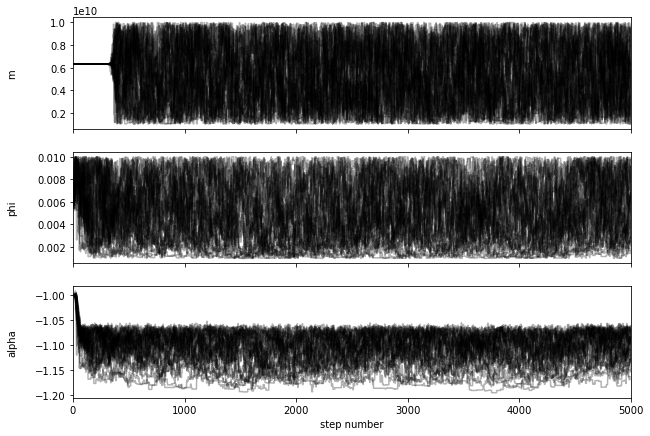

In [35]:
#Plotting the parameter space the sampler went over

fig, axes = plt.subplots(3, figsize=(10, 7), sharex=True)
samples=sampler.chain[:,:,:].T
labels = ["m", "phi", "alpha"]
for i in range(ndim):
    ax = axes[i]
    ax.plot(samples[i], "k", alpha=0.3)
    ax.set_xlim(0, len(samples[i]))
    ax.set_ylabel(labels[i])
    ax.yaxis.set_label_coords(-0.1, 0.5)

axes[-1].set_xlabel("step number");

In [38]:
#Here we are getting a list of flat samples from our MCMC and printing out the parameters that it recovered

flat_samples = sampler.flatchain
#flat_samples = sampler.get_chain(discard=100, thin=15, flat=True)
#print(flat_samples.shape)
flat_samples[np.argmax(sampler.flatlnprobability)]
mstar,phistar,alpha=flat_samples[np.argmax(sampler.flatlnprobability)]

aveabsmg=np.array(aveabsmg)
numdens=np.array(numdens)
numdenserr=np.array(numdenserr)

#print aveabsmg
print mstar
print np.log10(mstar)
print phistar
print alpha

1247387024.8058348
9.096001222251159
0.001045846899229879
-1.1895717064953626


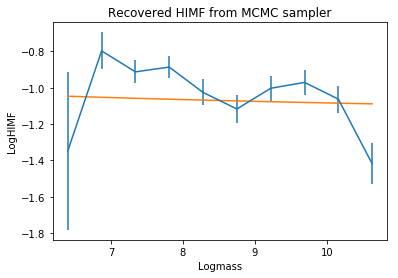

In [39]:
#Plotting the HIMF using the parameters recovered from the sampler over the data that was passed to the sampler
#print(schechter_func(alpha,phistar,mstar,aveabsmg))

plt.title("Recovered HIMF from MCMC sampler")
plt.xlabel("Logmass")
plt.ylabel("LogHIMF")
plt.errorbar(aveabsmg,np.log10(numdens),numdenserr/(numdens*np.log(10)))
plt.plot(aveabsmg,np.log10(schechter_func(alpha,phistar,mstar,aveabsmg)))
plt.show()

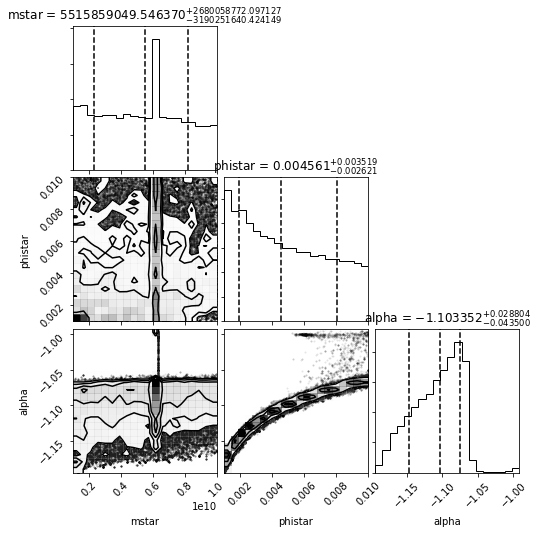

In [40]:
#Corner plots to demonstrate the parameter space the sampler recovered M_char, phi_star, and alpha over as well as the probability density distributions of each parameter.

labels=['mstar','phistar','alpha']
fig=corner.corner(flat_samples,
                  show_titles=True,
                  title_fmt='.6f',
                  labels=labels,
                  plot_datapoints=True,
                  quantiles=[0.16,0.5,0.84])
plt.show()